# Productivity Prediction of Garment Factory Workers

The dataset is from UCI machine learning repository and can be accessed [here](http://archive.ics.uci.edu/ml/datasets/Productivity+Prediction+of+Garment+Employees).

Column definitions:

1. date : Date in MM-DD-YYYY
2. day : Day of the Week
3. quarter : A portion of the month. A month was divided into four quarters
4. department : Associated department with the instance
5. team_no : Associated team number with the instance
6. no_of_workers : Number of workers in each team
7. no_of_style_change : Number of changes in the style of a particular product
8. targeted_productivity : Targeted productivity set by the Authority for each team for each day.
9. smv : Standard Minute Value, it is the allocated time for a task
10. wip : Work in progress. Includes the number of unfinished items for products
11. over_time : Represents the amount of overtime by each team in minutes
12. incentive : Represents the amount of financial incentive (in BDT) that enables or motivates a particular course of action.
13. idle_time : The amount of time when the production was interrupted due to several reasons
14. idle_men : The number of workers who were idle due to production interruption
15. actual_productivity : The actual % of productivity that was delivered by the workers.

MAIN TARGET VARIABLE = ACTUAL PRODUCTIVITY




# Importing Data, Libraries and inital checks

In [ ]:
#Importing Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from plotnine import *

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Importing the data
main=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DATA ANALYTICS PROJECT 1/garments_worker_productivity.csv")
backup=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DATA ANALYTICS PROJECT 1/garments_worker_productivity.csv")

In [ ]:
df=main
print(df.head(5))
print("...................................................................................................")
print(df.tail(5))
print("...................................................................................................")
print(df.info())

       date   quarter  department       day  team  targeted_productivity  \
0  1/1/2015  Quarter1      sweing  Thursday     8                   0.80   
1  1/1/2015  Quarter1  finishing   Thursday     1                   0.75   
2  1/1/2015  Quarter1      sweing  Thursday    11                   0.80   
3  1/1/2015  Quarter1      sweing  Thursday    12                   0.80   
4  1/1/2015  Quarter1      sweing  Thursday     6                   0.80   

     smv     wip  over_time  incentive  idle_time  idle_men  \
0  26.16  1108.0       7080         98        0.0         0   
1   3.94     NaN        960          0        0.0         0   
2  11.41   968.0       3660         50        0.0         0   
3  11.41   968.0       3660         50        0.0         0   
4  25.90  1170.0       1920         50        0.0         0   

   no_of_style_change  no_of_workers  actual_productivity  
0                   0           59.0             0.940725  
1                   0            8.0        

In [ ]:
# checking the shape of the dataset
df.shape

#the dataset has 1197 rows and 15 columns

(1197, 15)

# Data Cleaning and Pre Processing

In [ ]:
df.head(1000)

,date,quarter,department,day,team,targeted_productivity,smv,wip,over_time,incentive,idle_time,idle_men,no_of_style_change,no_of_workers,actual_productivity
0,1/1/2015,Quarter1,sweing,Thursday,8,0.80,26.16,1108.0,7080,98,0.0,0,0,59.0,0.940725
1,1/1/2015,Quarter1,finishing,Thursday,1,0.75,3.94,NaN,960,0,0.0,0,0,8.0,0.886500
2,1/1/2015,Quarter1,sweing,Thursday,11,0.80,11.41,968.0,3660,50,0.0,0,0,30.5,0.800570
3,1/1/2015,Quarter1,sweing,Thursday,12,0.80,11.41,968.0,3660,50,0.0,0,0,30.5,0.800570
4,1/1/2015,Quarter1,sweing,Thursday,6,0.80,25.90,1170.0,1920,50,0.0,0,0,56.0,0.800382
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3/1/2015,Quarter1,sweing,Sunday,2,0.70,30.33,254.0,1800,0,0.0,0,0,58.0,0.683551
996,3/1/2015,Quarter1,sweing,Sunday,11,0.80,11.61,347.0,0,50,4.0,20,0,57.0,0.682433
997,3/1/2015,Quarter1,finishing,Sunday,4,0.60,3.94,NaN,960,0,0.0,0,0,8.0,0.673083
998,3/1/2015,Quarter1,finishing,Sunday,10,0.70,2.90,NaN,3360,0,0.0,0,0,8.0,0.664583


In [ ]:
df.columns

Index(['date', 'quarter', 'department', 'day', 'team', 'targeted_productivity',
       'smv', 'wip', 'over_time', 'incentive', 'idle_time', 'idle_men',
       'no_of_style_change', 'no_of_workers', 'actual_productivity'],
      dtype='object')

In [ ]:
#Dividing Categoricals and Quants
cats=['quarter', 'department', 'day', 'team']
quants=['targeted_productivity',
       'smv', 'wip', 'over_time', 'incentive', 'idle_time', 'idle_men',
       'no_of_style_change', 'no_of_workers', 'actual_productivity']

In [ ]:
#Changing the productivity values greater than 1 to 1
mask= df.actual_productivity>1
df.loc[mask,'actual_productivity']=1

In [ ]:
df_quants=df.loc[:,quants]
df_cats=df.loc[:,cats]

In [ ]:
df_quants.describe()

,targeted_productivity,smv,wip,over_time,incentive,idle_time,idle_men,no_of_style_change,no_of_workers,actual_productivity
count,1197.000000,1197.000000,691.000000,1197.000000,1197.000000,1197.000000,1197.000000,1197.000000,1197.000000,1197.000000
mean,0.729632,15.062172,1190.465991,4567.460317,38.210526,0.730159,0.369256,0.150376,34.609858,0.734461
std,0.097891,10.943219,1837.455001,3348.823563,160.182643,12.709757,3.268987,0.427848,22.197687,0.173380
min,0.070000,2.900000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.233705
25%,0.700000,3.940000,774.500000,1440.000000,0.000000,0.000000,0.000000,0.000000,9.000000,0.650307
50%,0.750000,15.260000,1039.000000,3960.000000,0.000000,0.000000,0.000000,0.000000,34.000000,0.773333
75%,0.800000,24.260000,1252.500000,6960.000000,50.000000,0.000000,0.000000,0.000000,57.000000,0.850253
max,0.800000,54.560000,23122.000000,25920.000000,3600.000000,300.000000,45.000000,2.000000,89.000000,1.000000


#checking for missing values
df.isnull().sum()
#now there is no any missing values

In [ ]:
df_quants=df.loc[:,quants]
df_quants.describe()

,targeted_productivity,smv,wip,over_time,incentive,idle_time,idle_men,no_of_style_change,no_of_workers,actual_productivity
count,1197.000000,1197.000000,691.000000,1197.000000,1197.000000,1197.000000,1197.000000,1197.000000,1197.000000,1197.000000
mean,0.729632,15.062172,1190.465991,4567.460317,38.210526,0.730159,0.369256,0.150376,34.609858,0.734461
std,0.097891,10.943219,1837.455001,3348.823563,160.182643,12.709757,3.268987,0.427848,22.197687,0.173380
min,0.070000,2.900000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.233705
25%,0.700000,3.940000,774.500000,1440.000000,0.000000,0.000000,0.000000,0.000000,9.000000,0.650307
50%,0.750000,15.260000,1039.000000,3960.000000,0.000000,0.000000,0.000000,0.000000,34.000000,0.773333
75%,0.800000,24.260000,1252.500000,6960.000000,50.000000,0.000000,0.000000,0.000000,57.000000,0.850253
max,0.800000,54.560000,23122.000000,25920.000000,3600.000000,300.000000,45.000000,2.000000,89.000000,1.000000


Observing the descriptive tables of the quantitative function there are no anomalies are minus values. Minimum of every quantitative variable is greter than zero.

In [ ]:
#Checking for Duplicates of data set
df.duplicated().sum()

#no duplicates in the dataset

0

In [ ]:
#number of workers in each team should be a whole number
df['no_of_workers'].unique()

#there are some values with decimal points. No of oworkers should be a whole number

array([59. ,  8. , 30.5, 56. , 57.5, 55. , 54. , 18. , 60. , 12. , 20. ,
       17. , 56.5, 54.5, 29.5, 31.5, 31. , 55.5, 58. , 10. , 16. , 32. ,
       58.5, 15. ,  5. , 57. , 53. , 51.5,  2. ,  9. ,  7. , 19. , 28. ,
       34. , 89. , 14. , 25. , 52. ,  4. , 21. , 35. , 51. , 33. , 11. ,
       33.5, 22. , 26. , 27. , 59.5, 50. , 44. , 49. , 47. , 48. , 42. ,
       24. , 45. , 46. , 39. , 38. ,  6. ])

In [ ]:
#Making the number of workers in int
df['no_of_workers']=df['no_of_workers'].apply(lambda x: int(x))

In [ ]:
df['no_of_workers'].unique()

array([59,  8, 30, 56, 57, 55, 54, 18, 60, 12, 20, 17, 29, 31, 58, 10, 16,
       32, 15,  5, 53, 51,  2,  9,  7, 19, 28, 34, 89, 14, 25, 52,  4, 21,
       35, 33, 11, 22, 26, 27, 50, 44, 49, 47, 48, 42, 24, 45, 46, 39, 38,
        6])

## Cleaning Categorical Data

In [ ]:
#Checking for the number of unique datapoints
for i in cats:
  print(i,df[i].unique())

quarter ['Quarter1' 'Quarter2' 'Quarter3' 'Quarter4' 'Quarter5']
department ['sweing' 'finishing ' 'finishing']
day ['Thursday' 'Saturday' 'Sunday' 'Monday' 'Tuesday' 'Wednesday']
team [ 8  1 11 12  6  7  2  3  9 10  5  4]


In [ ]:
#Only can have 4 quarters per month
#Checking what's up with quarter 5
df.loc[df.quarter=='Quarter5',:]

,date,quarter,department,day,team,targeted_productivity,smv,wip,over_time,incentive,idle_time,idle_men,no_of_style_change,no_of_workers,actual_productivity
498,1/29/2015,Quarter5,sweing,Thursday,2,0.80,22.52,1416.0,6840,113,0.0,0,0,57,1.000000
499,1/29/2015,Quarter5,finishing,Thursday,4,0.80,4.30,NaN,1200,0,0.0,0,0,10,0.989000
500,1/29/2015,Quarter5,sweing,Thursday,3,0.80,22.52,1287.0,6840,100,0.0,0,0,57,0.950186
501,1/29/2015,Quarter5,sweing,Thursday,4,0.80,22.52,1444.0,6900,88,0.0,0,0,57,0.900800
502,1/29/2015,Quarter5,sweing,Thursday,10,0.80,22.52,1088.0,6720,88,0.0,0,0,56,0.900130
503,1/29/2015,Quarter5,finishing,Thursday,6,0.50,2.90,NaN,1200,0,0.0,0,0,10,0.899000
504,1/29/2015,Quarter5,finishing,Thursday,8,0.65,4.15,NaN,960,0,0.0,0,0,8,0.877552
505,1/29/2015,Quarter5,finishing,Thursday,11,0.60,2.90,NaN,960,0,0.0,0,0,8,0.864583
506,1/29/2015,Quarter5,finishing,Thursday,10,0.80,3.94,NaN,1200,0,0.0,0,0,10,0.856950
507,1/29/2015,Quarter5,finishing,Thursday,1,0.75,3.94,NaN,1200,0,0.0,0,0,10,0.853667


In [ ]:
#Quarter 5 is simply the dates of jan 29 and 31
#january cannot equally divide 4 quarters euqlly. we assingn the jan 29,31 into 4th quarter
df['quarter']=df['quarter'].replace("Quarter5","Quarter4")
df['quarter'].unique()

array(['Quarter1', 'Quarter2', 'Quarter3', 'Quarter4'], dtype=object)

In [ ]:
#Removing the quarter part in the quarter feature
def rep_with_num(x=str):
  f=x[-1]
  return(f)

df['quarter']=df['quarter'].apply(rep_with_num)
df['quarter'].unique()

array(['1', '2', '3', '4'], dtype=object)

In [ ]:
#replacing sweing with sewing
df['department']=(df['department'].replace('sweing','sewing'))

In [ ]:
#remove the space of finishing word
df['department']=(df['department'].replace('finishing ','finishing'))

In [ ]:
df['department'].unique()

array(['sewing', 'finishing'], dtype=object)

In [ ]:
#checking Null values
df.isnull().sum()


#506 null values in wip

date                       0
quarter                    0
department                 0
day                        0
team                       0
targeted_productivity      0
smv                        0
wip                      506
over_time                  0
incentive                  0
idle_time                  0
idle_men                   0
no_of_style_change         0
no_of_workers              0
actual_productivity        0
dtype: int64

In [ ]:
df.loc[(df['department']=='finishing')&(df['wip'].isna())].shape

(506, 15)

Thus given all there is no work in progress for the finishing department we impute those values as 0

In [ ]:
#impute missing values of wip by its median
df.wip.fillna(0,inplace=True)

In [ ]:
#Rechecking if there are missing values
df.isnull().sum()

date                     0
quarter                  0
department               0
day                      0
team                     0
targeted_productivity    0
smv                      0
wip                      0
over_time                0
incentive                0
idle_time                0
idle_men                 0
no_of_style_change       0
no_of_workers            0
actual_productivity      0
dtype: int64

## Checking Outliers of Quantitative Variables

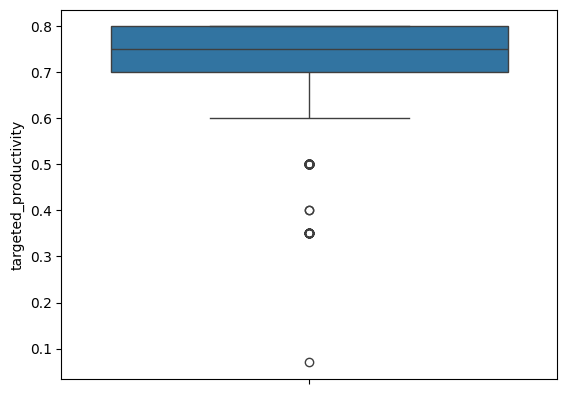

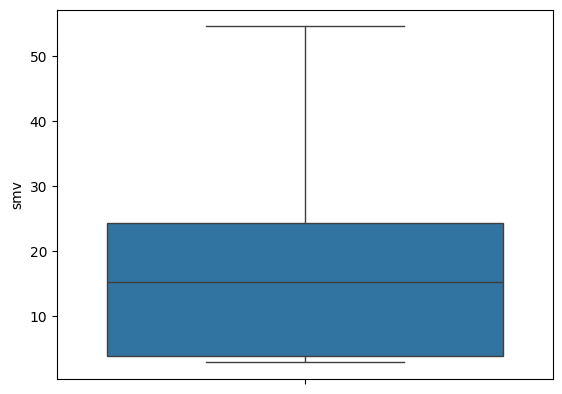

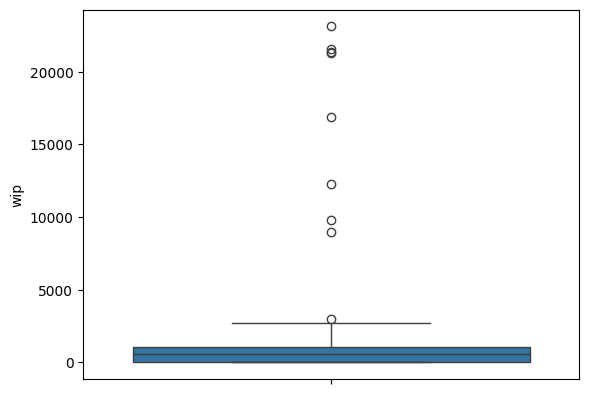

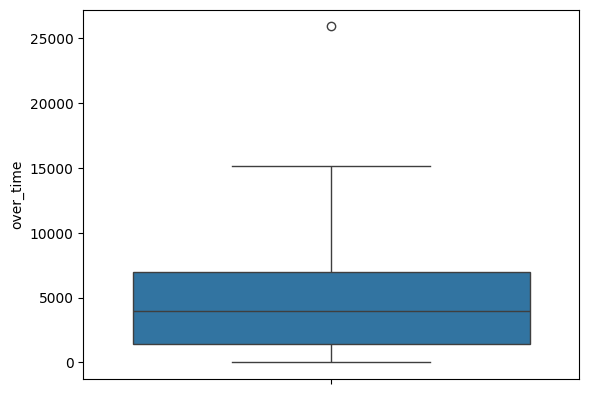

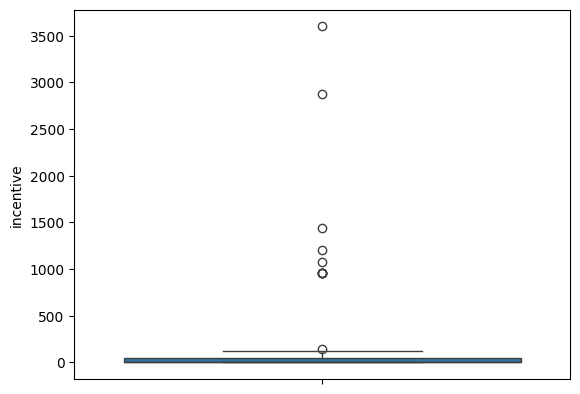

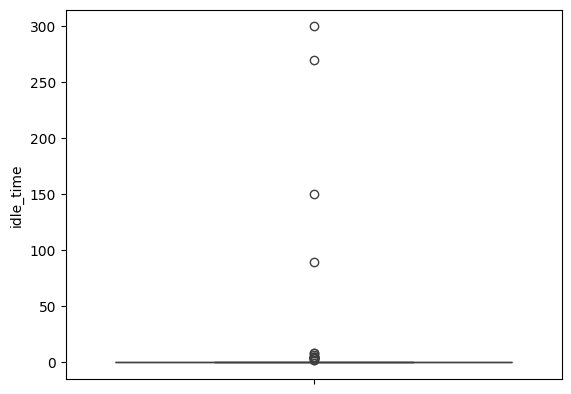

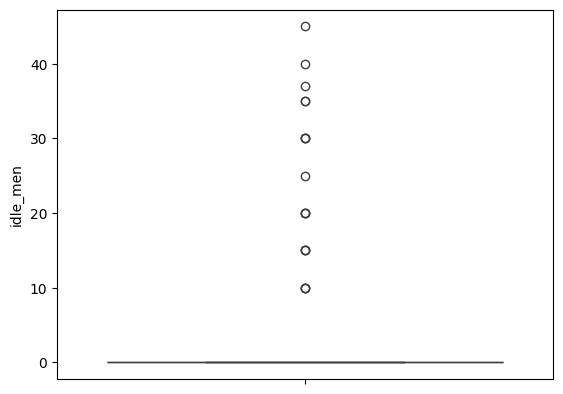

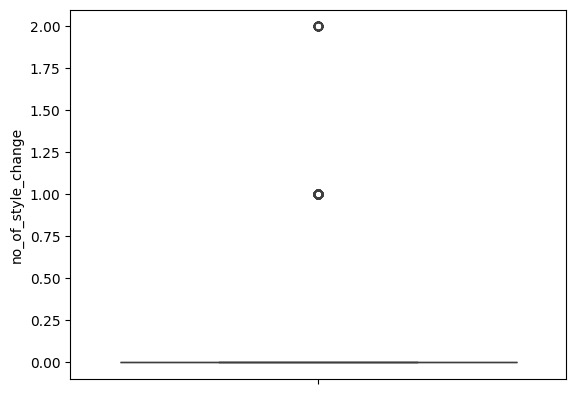

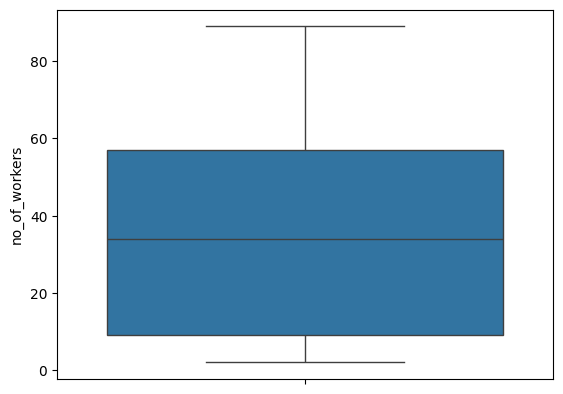

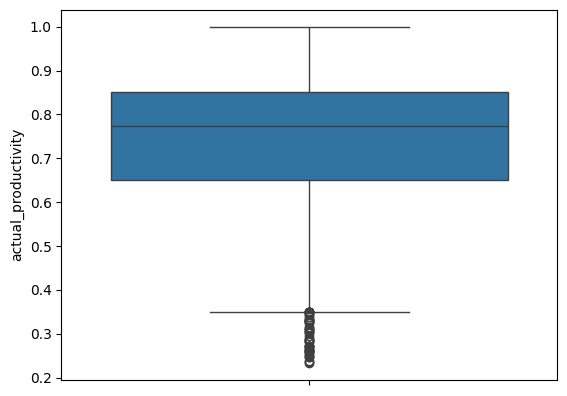

In [ ]:
for i in quants:
  sns.boxplot(df[i])
  plt.show()



Outliers have been observed in the columns related to targeted productivity, overtime, work in progress, incentive, idle time, idle men, and actual productivity. However, these outliers will not be removed, as they may be attributed to the inherent variability in the workflow among different teams

### Mahalanobis Distance

In [ ]:

import scipy as stats


# calculateMahalanobis function to calculate
# the Mahalanobis distance
#create function to calculate Mahalanobis distance
def mahalanobis(x=None, data=None, cov=None):

    x_mu = x - np.mean(data)
    if not cov:
        cov = np.cov(data.values.T)
    inv_covmat = np.linalg.inv(cov)
    left = np.dot(x_mu, inv_covmat)
    mahal = np.dot(left, x_mu.T)
    return mahal.diagonal()


# Creating dataset

df11 = pd.DataFrame(df,columns=quants)


# Creating a new column in the dataframe that holds
# the Mahalanobis distance for each row

df11['mahalanobis'] = mahalanobis(x=df11, data=df11[quants])


# Display the dataframe

print(df11)

from scipy.stats import chi2

#calculate p-value for each mahalanobis distance
df11['p'] = 1 - chi2.cdf(df11['mahalanobis'], 9)
print(df11)

      targeted_productivity    smv     wip  over_time  incentive  idle_time  \
0                      0.80  26.16  1108.0       7080         98        0.0   
1                      0.75   3.94     0.0        960          0        0.0   
2                      0.80  11.41   968.0       3660         50        0.0   
3                      0.80  11.41   968.0       3660         50        0.0   
4                      0.80  25.90  1170.0       1920         50        0.0   
...                     ...    ...     ...        ...        ...        ...   
1192                   0.75   2.90     0.0        960          0        0.0   
1193                   0.70   3.90     0.0        960          0        0.0   
1194                   0.65   3.90     0.0        960          0        0.0   
1195                   0.75   2.90     0.0       1800          0        0.0   
1196                   0.70   2.90     0.0        720          0        0.0   

      idle_men  no_of_style_change  no_of_workers  

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3502: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'


In [ ]:
#Typically a p-value that is less than .001
#identify multivariate outliers

idx=df11.index[df11['p'] <= 0.001].tolist()
idx
df22=df11.drop(index=idx,axis='index')
df22

,targeted_productivity,smv,wip,over_time,incentive,idle_time,idle_men,no_of_style_change,no_of_workers,actual_productivity,mahalanobis,p
0,0.80,26.16,1108.0,7080,98,0.0,0,0,59,0.940725,3.332806,0.949628
1,0.75,3.94,0.0,960,0,0.0,0,0,8,0.886500,2.462913,0.981864
2,0.80,11.41,968.0,3660,50,0.0,0,0,30,0.800570,0.787447,0.999791
3,0.80,11.41,968.0,3660,50,0.0,0,0,30,0.800570,0.787447,0.999791
4,0.80,25.90,1170.0,1920,50,0.0,0,0,56,0.800382,8.330662,0.501197
...,...,...,...,...,...,...,...,...,...,...,...,...
1192,0.75,2.90,0.0,960,0,0.0,0,0,8,0.628333,2.280203,0.986223
1193,0.70,3.90,0.0,960,0,0.0,0,0,8,0.625625,2.131995,0.989204
1194,0.65,3.90,0.0,960,0,0.0,0,0,8,0.625625,2.655605,0.976402
1195,0.75,2.90,0.0,1800,0,0.0,0,0,15,0.505889,4.728549,0.857300


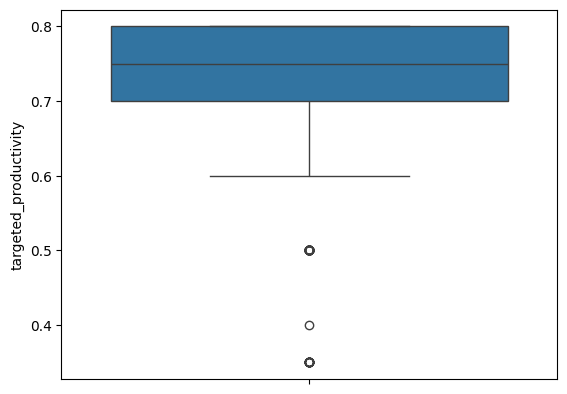

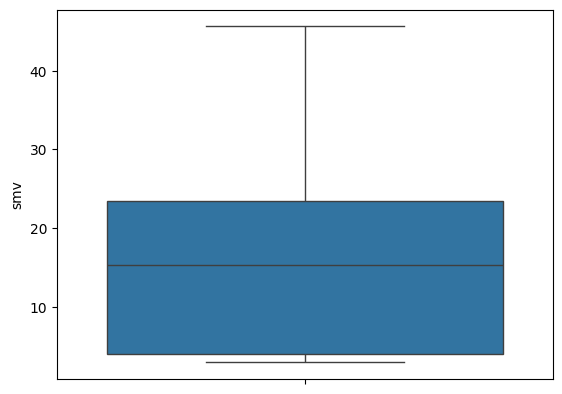

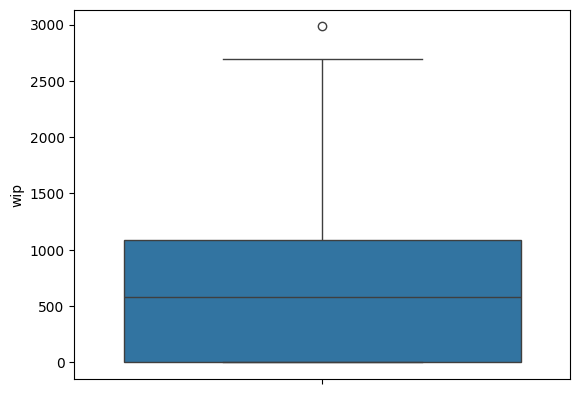

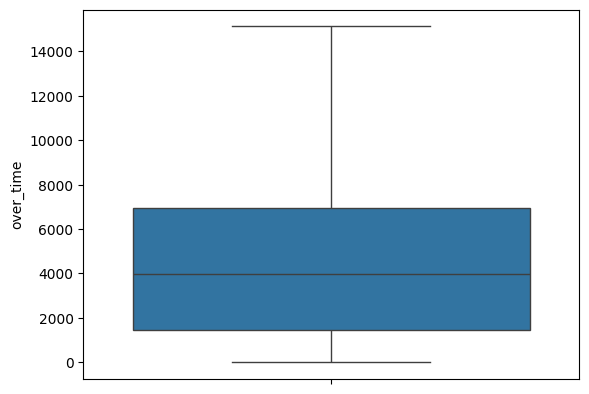

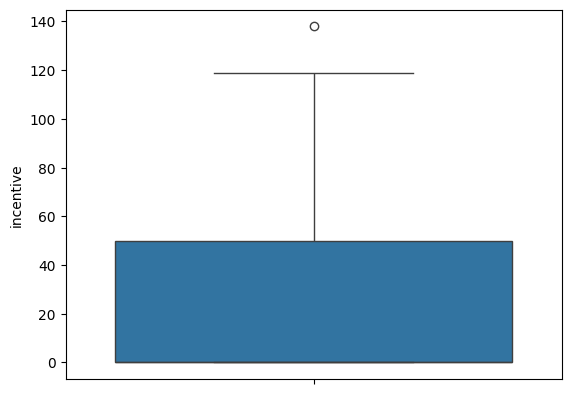

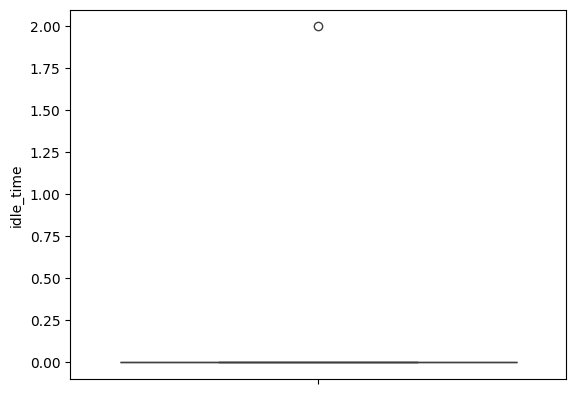

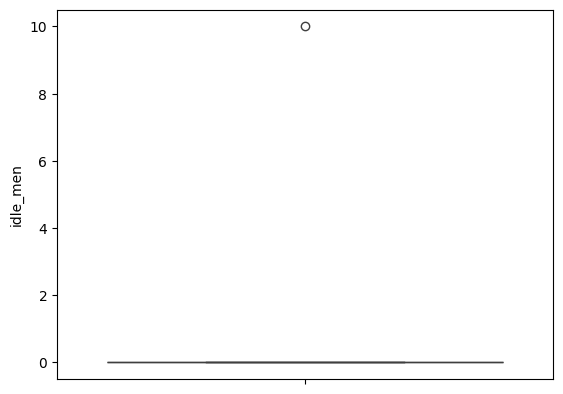

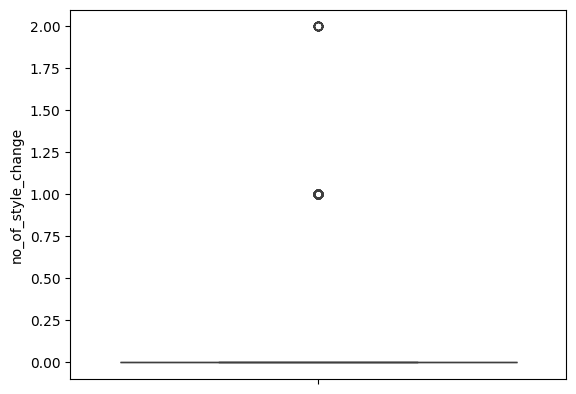

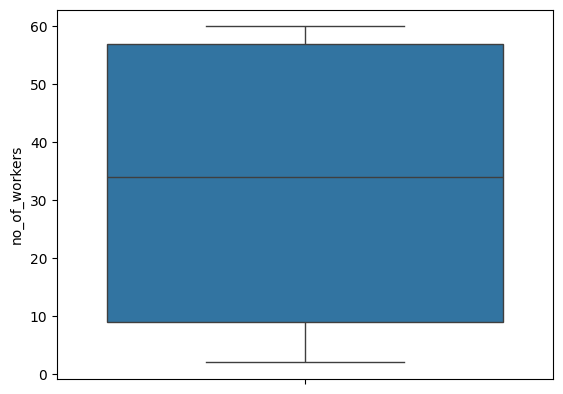

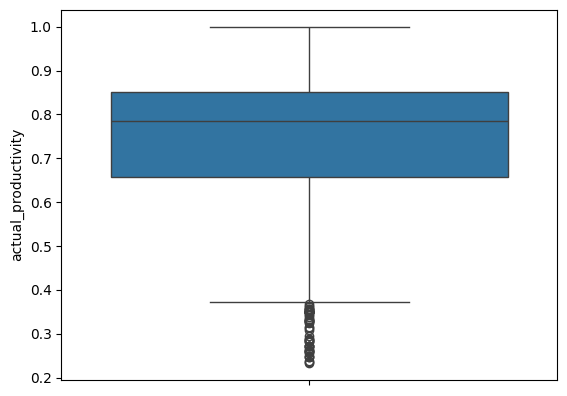

In [ ]:
for i in quants:
  sns.boxplot(df22[i])
  plt.show()

<Axes: >

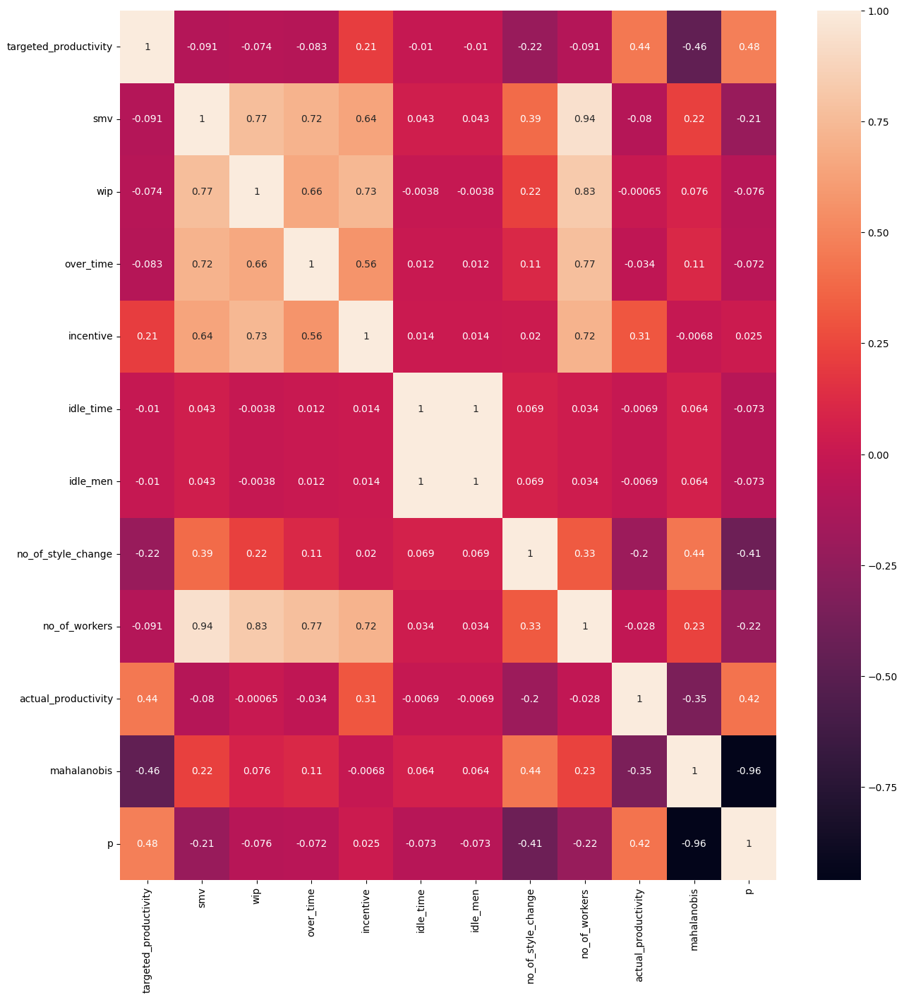

In [ ]:
corr = df22.corr()
f, ax = plt.subplots(figsize=(15, 16))
sns.heatmap(corr, annot=True)

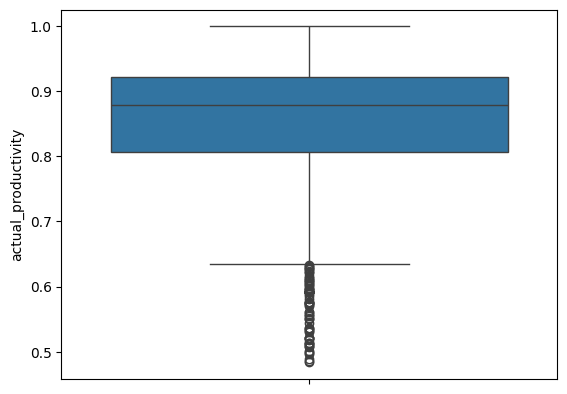

In [ ]:
log_data = np.sqrt(df['actual_productivity'])
sns.boxplot(log_data)
plt.show()

In [ ]:
#Rechecking if there are duplicates in our categorical variables
for i in cats:
  print(i,df[i].unique())

quarter ['1' '2' '3' '4']
department ['sewing' 'finishing']
day ['Thursday' 'Saturday' 'Sunday' 'Monday' 'Tuesday' 'Wednesday']
team [ 8  1 11 12  6  7  2  3  9 10  5  4]


In [ ]:
#Converting to datetime
df['date']=df['date'].astype('datetime64[ns]')

In [ ]:
#Adding a date number column
import datetime as dt
df['date_num']=df['date'].dt.day


In [ ]:
#Final Check of features
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1197 entries, 0 to 1196
Data columns (total 16 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   date                   1197 non-null   datetime64[ns]
 1   quarter                1197 non-null   object        
 2   department             1197 non-null   object        
 3   day                    1197 non-null   object        
 4   team                   1197 non-null   int64         
 5   targeted_productivity  1197 non-null   float64       
 6   smv                    1197 non-null   float64       
 7   wip                    1197 non-null   float64       
 8   over_time              1197 non-null   int64         
 9   incentive              1197 non-null   int64         
 10  idle_time              1197 non-null   float64       
 11  idle_men               1197 non-null   int64         
 12  no_of_style_change     1197 non-null   int64         
 13  no_

In [ ]:
df.loc[:,quants].describe()

,targeted_productivity,smv,wip,over_time,incentive,idle_time,idle_men,no_of_style_change,no_of_workers,actual_productivity
count,1197.000000,1197.000000,1197.000000,1197.000000,1197.000000,1197.000000,1197.000000,1197.000000,1197.000000,1197.000000
mean,0.729632,15.062172,687.228070,4567.460317,38.210526,0.730159,0.369256,0.150376,34.551378,0.734461
std,0.097891,10.943219,1514.582341,3348.823563,160.182643,12.709757,3.268987,0.427848,22.152559,0.173380
min,0.070000,2.900000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.233705
25%,0.700000,3.940000,0.000000,1440.000000,0.000000,0.000000,0.000000,0.000000,9.000000,0.650307
50%,0.750000,15.260000,586.000000,3960.000000,0.000000,0.000000,0.000000,0.000000,34.000000,0.773333
75%,0.800000,24.260000,1083.000000,6960.000000,50.000000,0.000000,0.000000,0.000000,57.000000,0.850253
max,0.800000,54.560000,23122.000000,25920.000000,3600.000000,300.000000,45.000000,2.000000,89.000000,1.000000


In [ ]:
for i in cats:
  print(i,"=",df[i].unique())

quarter = ['1' '2' '3' '4']
department = ['sewing' 'finishing']
day = ['Thursday' 'Saturday' 'Sunday' 'Monday' 'Tuesday' 'Wednesday']
team = [ 8  1 11 12  6  7  2  3  9 10  5  4]


In [ ]:
#saving cleaned data
df.to_csv('cleaned_productivity',index=False)


In [ ]:
df.to_csv('/content/drive/My Drive/mydata.csv', index=False)

## Train Test Split

In [ ]:
#separating features and target for use in modelling
X = df.drop(['actual_productivity'], axis=1)

y = df['actual_productivity']

In [ ]:
# Splitting dataset to train and test sets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .2, random_state=0)

In [ ]:
#creating train dataset
df_train=pd.concat([X_train, y_train], axis=1)

In [ ]:
df_train
# checking the shape of the dataset
df_train.shape

#the train dataset has 957 rows and 15 columns

(957, 16)

In [ ]:
df_train


,date,quarter,department,day,team,targeted_productivity,smv,wip,over_time,incentive,idle_time,idle_men,no_of_style_change,no_of_workers,date_num,actual_productivity
361,2015-01-21,3,sewing,Wednesday,5,0.70,20.40,1404.0,10440,50,0.0,0,0,58,21,0.750345
619,2015-02-05,1,sewing,Thursday,1,0.80,22.52,1485.0,6900,113,0.0,0,0,57,5,1.000000
494,2015-01-28,4,sewing,Wednesday,6,0.35,18.79,511.0,1800,23,0.0,0,0,32,28,0.437995
695,2015-02-10,2,sewing,Tuesday,1,0.80,22.52,1546.0,0,88,0.0,0,0,57,10,0.900471
395,2015-01-24,4,finishing,Saturday,8,0.80,2.90,0.0,1620,0,0.0,0,0,9,24,0.910522
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1033,2015-03-03,1,sewing,Tuesday,8,0.75,29.40,534.0,6840,56,0.0,0,0,57,3,0.750474
763,2015-02-14,2,sewing,Saturday,3,0.50,30.10,1261.0,6960,30,0.0,0,1,58,14,0.500802
835,2015-02-18,3,sewing,Wednesday,9,0.70,18.79,1587.0,4560,30,0.0,0,1,51,18,0.700096
559,2015-02-01,1,sewing,Sunday,7,0.70,24.26,1400.0,6720,0,0.0,0,0,56,1,0.411554


# Univariate Data Analysis

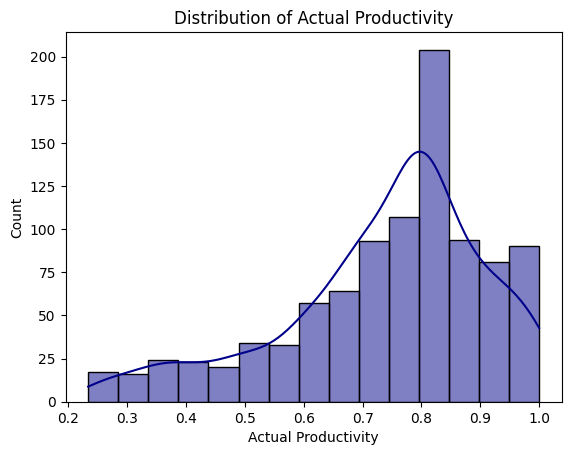

In [ ]:
sns.histplot(df_train.actual_productivity,color="darkblue",kde=True,bins=15)
plt.title("Distribution of Actual Productivity")
plt.xlabel("Actual Productivity")
plt.show()

<Axes: xlabel='targeted_productivity', ylabel='incentive'>

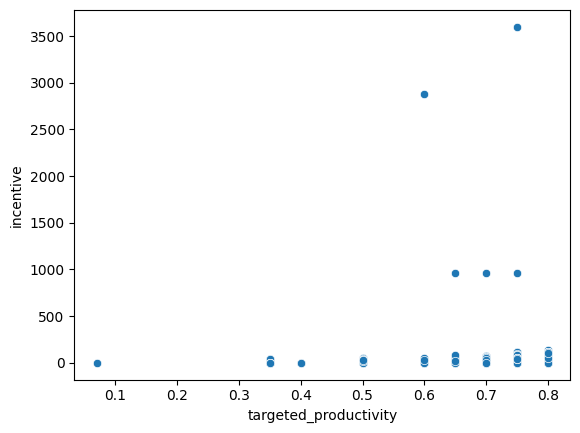

In [ ]:
sns.scatterplot(data=df_train,x='targeted_productivity',y='incentive')

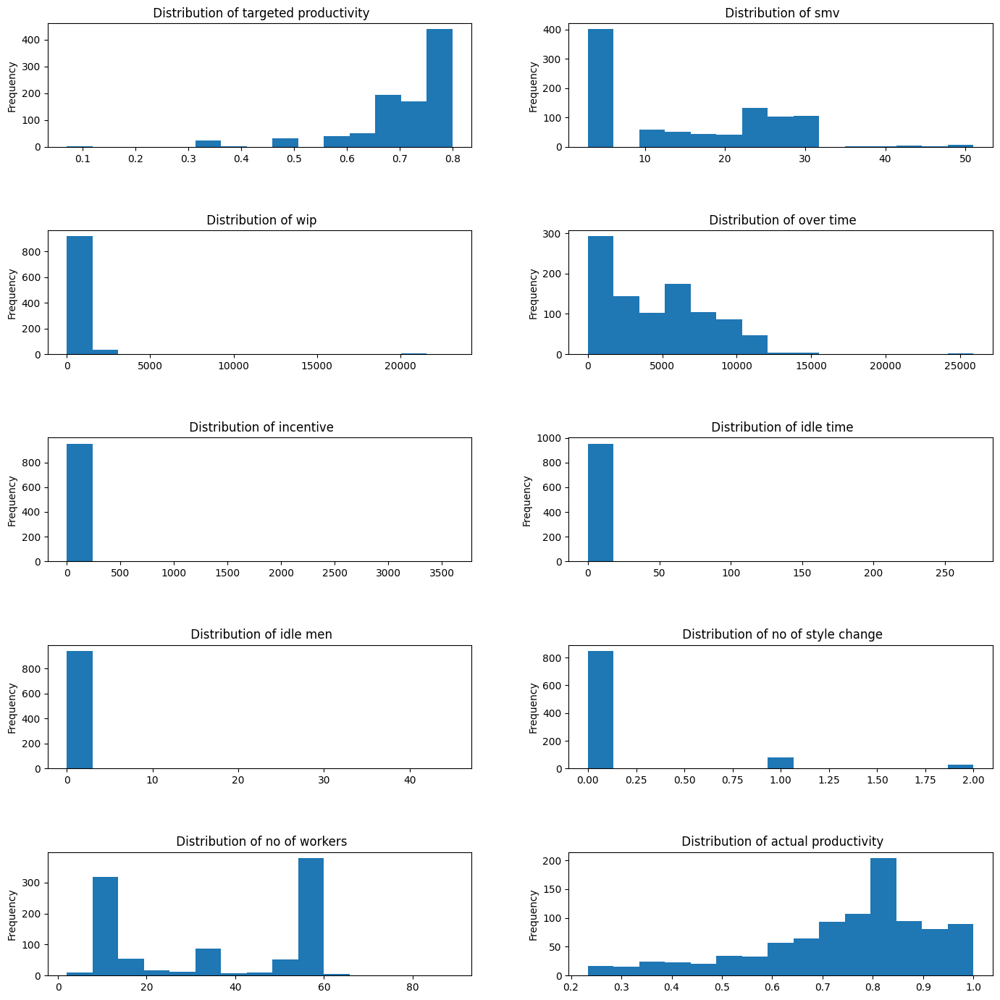

In [ ]:
# Histograms of numerical variables
#function to remove _ from titles

def title(x):
  return x.replace('_', ' ')

fig,axes = plt.subplots(nrows=5, ncols=2,figsize=(15,15))

for i, ax in enumerate(axes.ravel()):
  (n, bins, patches) = ax.hist(df_train[quants[i]], bins= 15)
  ax.set_title(f" Distribution of {title(quants[i])}")
  ax.set_ylabel("Frequency")

fig.tight_layout(pad=5.0)
plt.show()

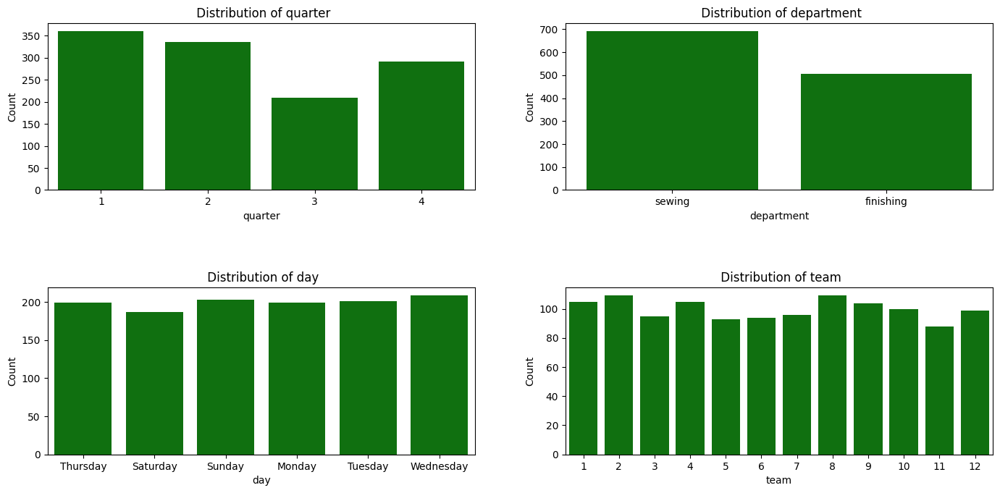

In [ ]:
#countplots
fig,axes = plt.subplots(nrows=2, ncols=2,figsize=(15,8))

for i, ax in enumerate(axes.ravel()):
    sns.countplot(x=df[cats[i]], ax=ax, color="green")
    ax.set_title(f" Distribution of {title(cats[i])}")
    ax.set_xlabel(title(cats[i]))
    ax.set_ylabel("Count")

fig.tight_layout(pad=5.0)
plt.show()

# Bivariate Data Analys

# Presentation Graphs

In [ ]:
#Getting the mean of productivity for each day of the given months
#Given the data is relatively normal we can do that
df_date_nums_mean=df_train.groupby(["date_num"]).actual_productivity.agg(np.mean)
df_date_nums_mean_tp=df_train.groupby(["date_num"]).targeted_productivity.agg(np.mean)

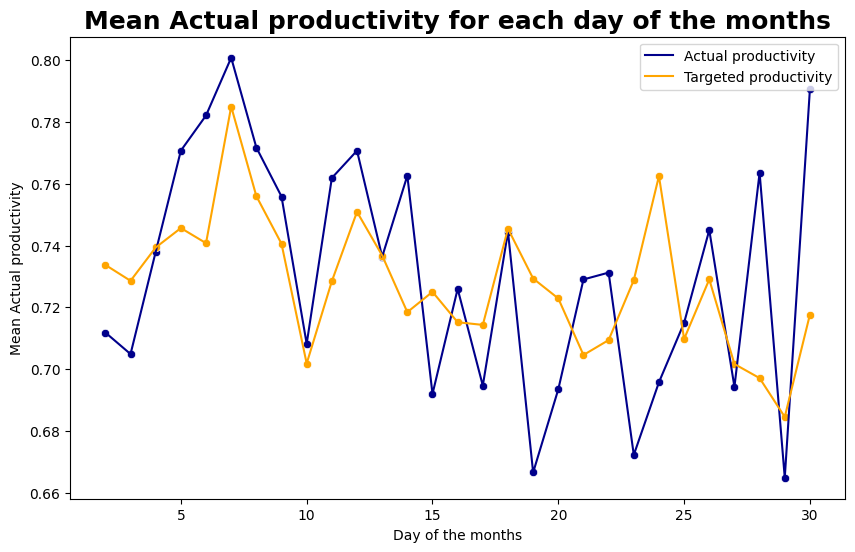

In [ ]:
plt.figure(figsize=(10, 6))
df_range = pd.DataFrame({'x': range(1, 31)})
# Line plot for df_date_nums_mean
sns.lineplot(x='x', y=df_date_nums_mean, data=df_range, color='darkblue', label='Actual productivity')

# Scatter plot for df_date_nums_mean
sns.scatterplot(x='x', y=df_date_nums_mean, data=df_range, color='darkblue')

# Line plot for df_date_nums_mean_tp
sns.lineplot(x='x', y=df_date_nums_mean_tp, data=df_range, color='orange', label='Targeted productivity')

# Scatter plot for df_date_nums_mean_tp
sns.scatterplot(x='x', y=df_date_nums_mean_tp, data=df_range, color='orange')

plt.title("Mean Actual productivity for each day of the months", fontsize=18, fontweight='bold')
plt.xlabel('Day of the months')
plt.ylabel('Mean Actual productivity')

plt.legend(loc='upper right')
plt.show()

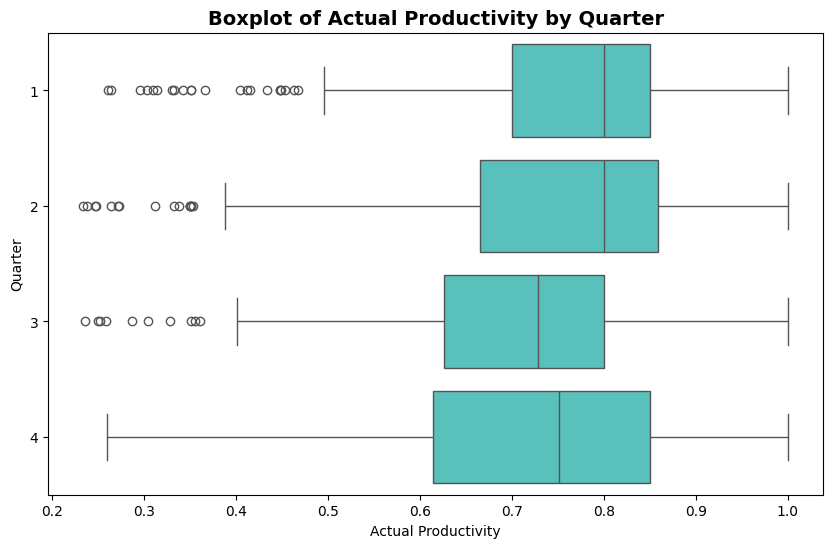

In [ ]:
plt.figure(figsize=(10, 6))
order = ['1',"2",'3','4']
sns.boxplot(x='actual_productivity', y='quarter', data=df_train,order=order, color='mediumturquoise')
plt.title("Boxplot of Actual Productivity by Quarter", fontsize=14, fontweight='bold')
plt.xlabel('Actual Productivity')
plt.ylabel('Quarter')
plt.show()

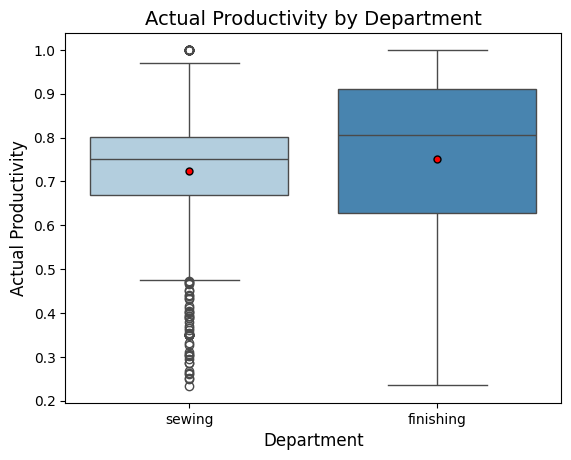

In [ ]:


dep = sns.boxplot(x='department',
                  y='actual_productivity',
                  data=df_train,
                  showmeans=True,
                  meanprops={"marker": "o", "markerfacecolor": 'red',
                             "markeredgecolor": "black",
                             "markersize": "5"},
                  hue='department',
                  palette="Blues")

plt.ylabel("Actual Productivity", size=12)
plt.xlabel("Department", size=12)
plt.title("Actual Productivity by Department", size=14)



plt.show()

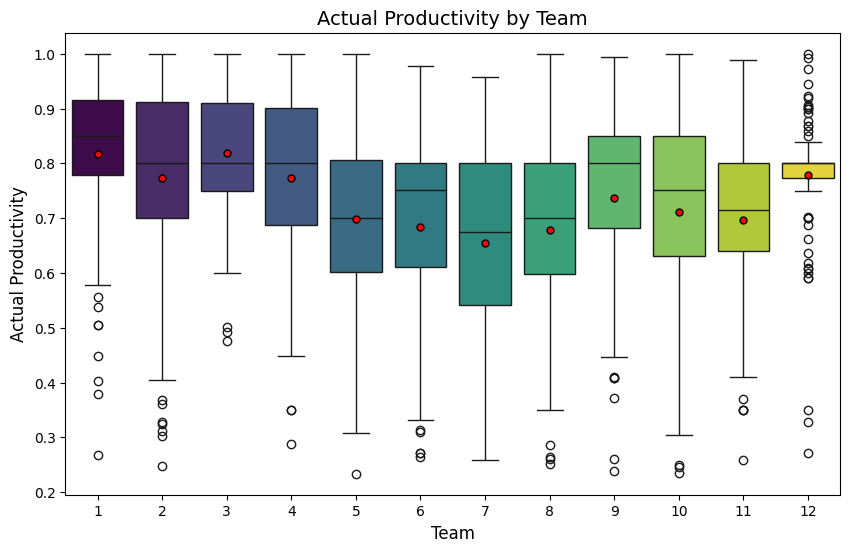

In [ ]:
plt.figure(figsize=(10, 6))
dep = sns.boxplot(x='team',
                  y='actual_productivity',
                  data=df_train,
                  showmeans=True,
                  meanprops={"marker": "o", "markerfacecolor": 'red',
                             "markeredgecolor": "black",
                             "markersize": "5"},
                  hue='team',
                  palette='viridis', legend=False)

plt.ylabel("Actual Productivity", size=12)
plt.xlabel("Team", size=12)
plt.title("Actual Productivity by Team", size=14)



plt.show()

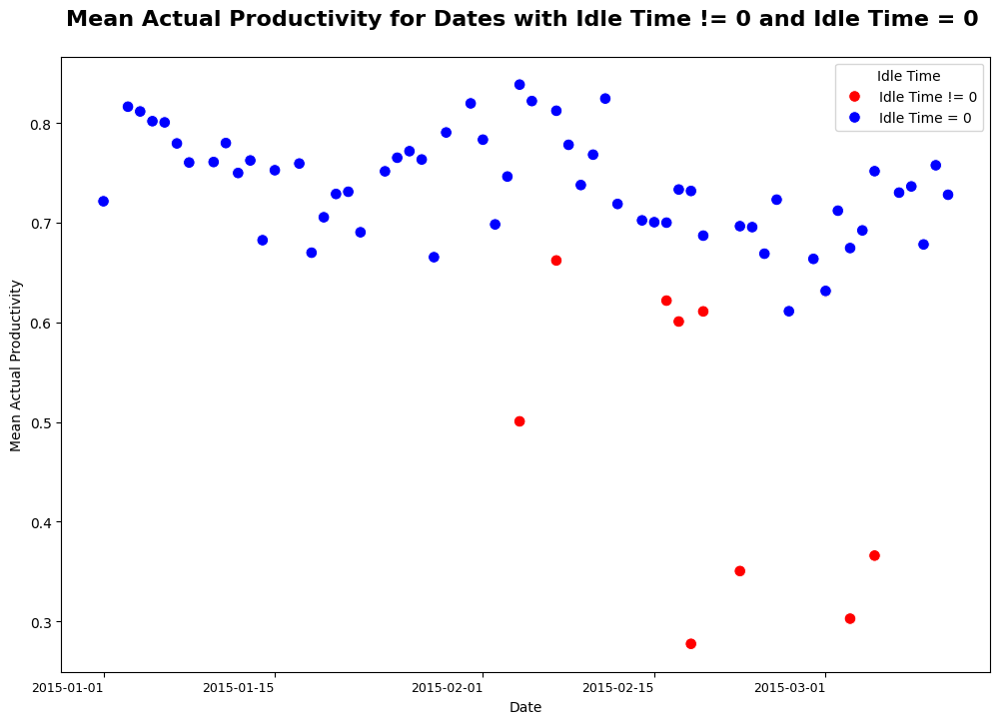

In [ ]:

# Filter the DataFrame for idle_time != 0
df_idle_not_zero = df_train.loc[df_train['idle_time'] != 0]

# Filter the DataFrame for idle_time = 0
df_idle_zero = df_train.loc[df_train['idle_time'] == 0]

# Combine the two DataFrames
combined_df = pd.concat([df_idle_not_zero.assign(Idle_Time='Idle Time != 0'), df_idle_zero.assign(Idle_Time='Idle Time = 0')])

# Calculate the mean actual_productivity for each group
mean_actual_productivity = combined_df.groupby(['Idle_Time', 'date'])['actual_productivity'].mean().reset_index()

# Plot the mean actual_productivity for both groups
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
plt.figure(figsize=(12, 8))

sns.scatterplot(x='date', y='actual_productivity', hue='Idle_Time', data=mean_actual_productivity, palette={'Idle Time != 0': 'red', 'Idle Time = 0': 'blue'}, s= 70)

plt.xticks(rotation=0, ha='right', fontsize=9)
plt.title('Mean Actual Productivity for Dates with Idle Time != 0 and Idle Time = 0 \n',fontweight='bold',fontsize=16)
plt.xlabel('Date')
plt.ylabel('Mean Actual Productivity')
plt.legend(title='Idle Time')

plt.show()

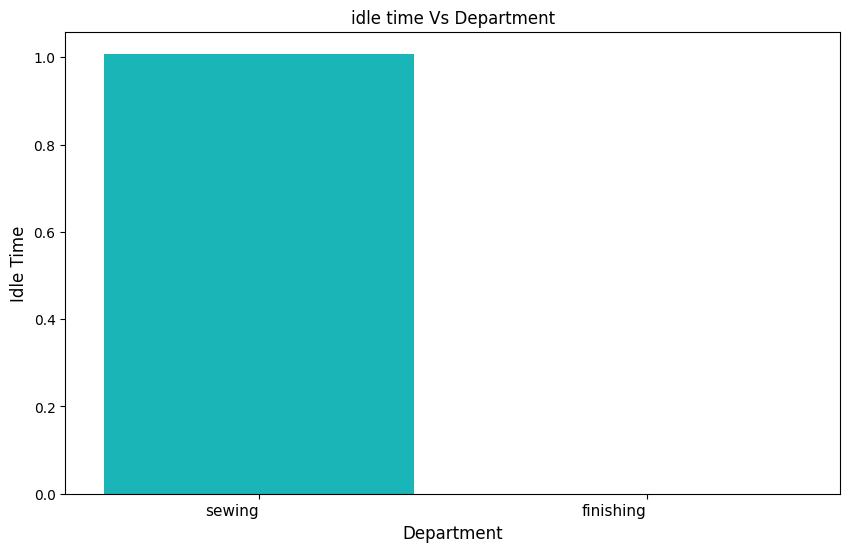

In [ ]:
plt.figure(figsize=(10, 6))

sns.barplot(x='department', y='idle_time',color='darkturquoise', data=df_train, errorbar=None)

plt.xticks(rotation=0, ha='right', fontsize=11)

plt.xlabel('Department', fontsize=12)
plt.ylabel('Idle Time', fontsize=12)
plt.title("idle time Vs Department")

plt.show()

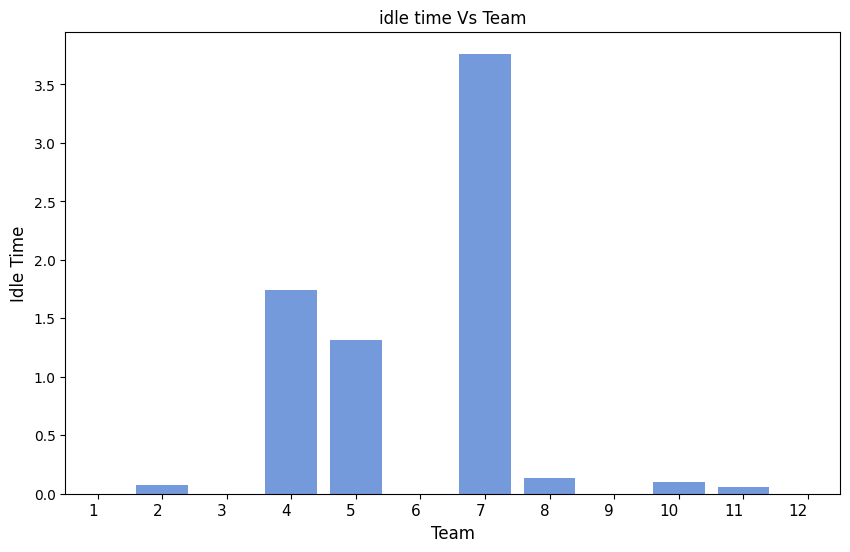

In [ ]:
plt.figure(figsize=(10, 6))

sns.barplot(x='team', y='idle_time',color='cornflowerblue', data=df_train, errorbar=None)

plt.xticks(rotation=0, ha='right', fontsize=11)

plt.xlabel('Team', fontsize=12)
plt.ylabel('Idle Time', fontsize=12)
plt.title("idle time Vs Team")

plt.show()

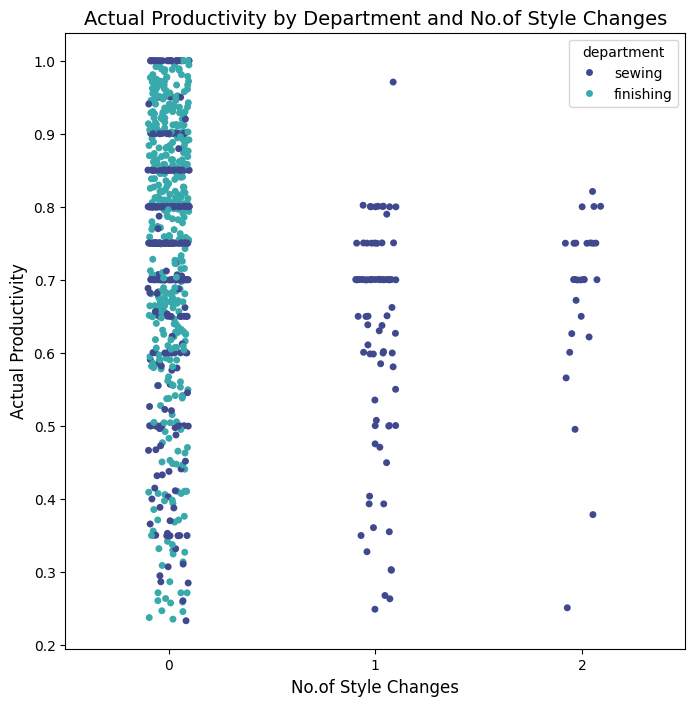

In [ ]:
plt.figure(figsize=(8, 8))

sns.stripplot(data=df_train, x="no_of_style_change", y="actual_productivity", hue='department',palette='mako')
plt.xlabel('No.of Style Changes', fontsize=12)
plt.ylabel('Actual Productivity', fontsize=12)
plt.title('Actual Productivity by Department and No.of Style Changes', fontsize=14)

plt.show()

In [ ]:
percentage_df = df_train.groupby(['team', 'no_of_style_change']).size().unstack().div(df_train.groupby('team').size(), axis=0) * 100
percentage_df

no_of_style_change,0,1,2
team,,,
1,96.296296,2.469136,1.234568
2,83.333333,16.666667,NaN
3,77.777778,15.277778,6.944444
4,87.209302,11.627907,1.162791
5,90.277778,9.722222,NaN
6,92.207792,7.792208,NaN
7,81.578947,17.105263,1.315789
8,82.954545,6.818182,10.227273
9,92.857143,7.142857,NaN


In [ ]:
percentage_df = percentage_df.fillna(0)
percentage_df.columns =['0','1','2']

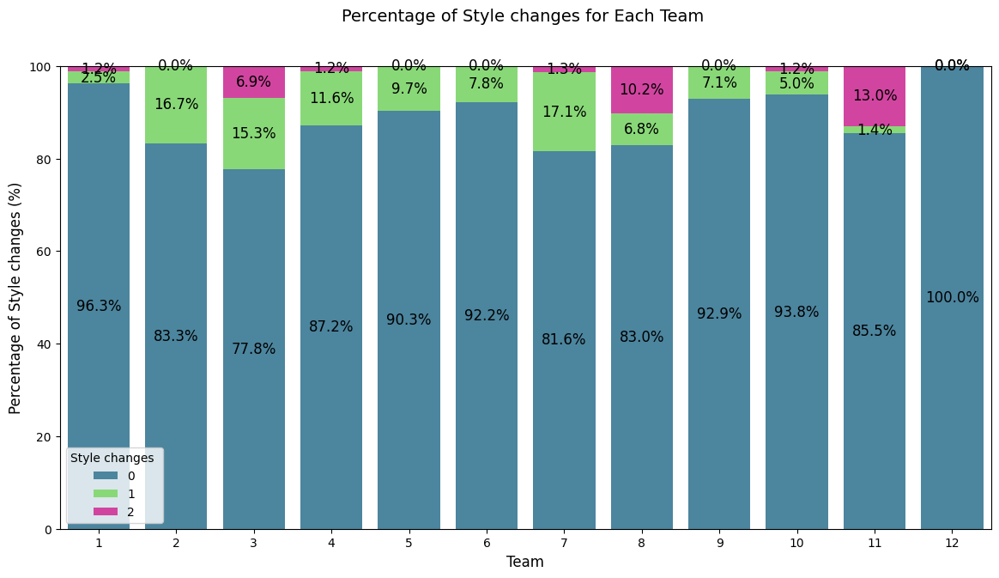

In [ ]:

# Plot the stacked bar graph
plt.figure(figsize=(14, 7))

# Use integer index for selecting columns
ax = sns.barplot(x=percentage_df.index, y=percentage_df['0'], color='#3f8bab', label=0)
ax = sns.barplot(x=percentage_df.index, y=percentage_df['1'], bottom=percentage_df['0'], color='#7ee868', label=1)
ax = sns.barplot(x=percentage_df.index, y=percentage_df['2'], bottom=percentage_df['0'] + percentage_df['1'], color='#e82ea7', label=2)

plt.xlabel('Team', fontsize=12)
plt.ylabel('Percentage of Style changes (%)', fontsize=12)
plt.title('Percentage of Style changes for Each Team \n \n', fontsize=14)
plt.legend(title='Style changes ')

# Add percentage labels on the bars
for p in ax.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    ax.text(x + width / 2, y + height / 2, f'{height:.1f}%', ha='center', va='center', fontsize=12)

plt.show()

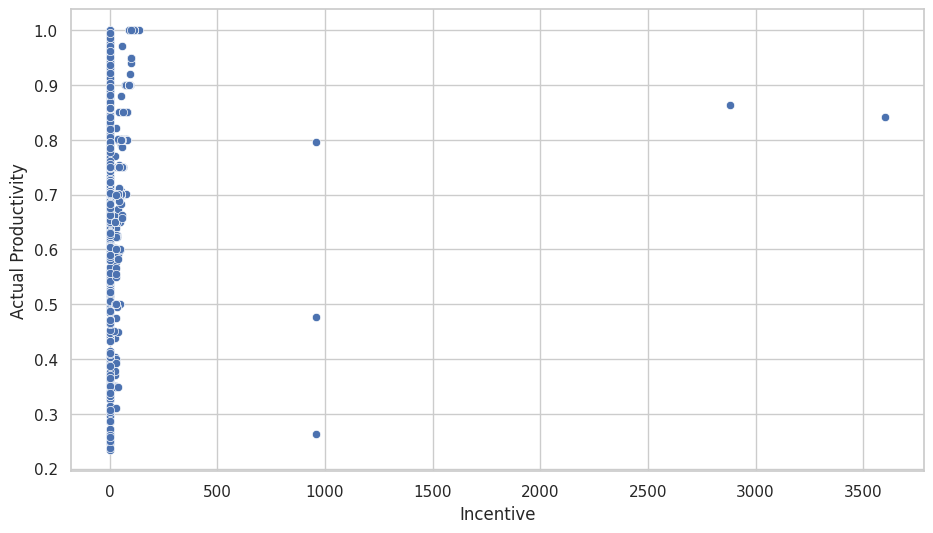

In [ ]:
sns.set(style='whitegrid')

plt.figure(figsize=(11, 6))
scatter_plot = sns.scatterplot(x='incentive', y='actual_productivity', data=df_train)


plt.xlabel('Incentive', fontsize=12)
plt.ylabel('Actual Productivity', fontsize=12)
#plt.title('Actual Productivity with idle time', fontsize=14)

plt.show()

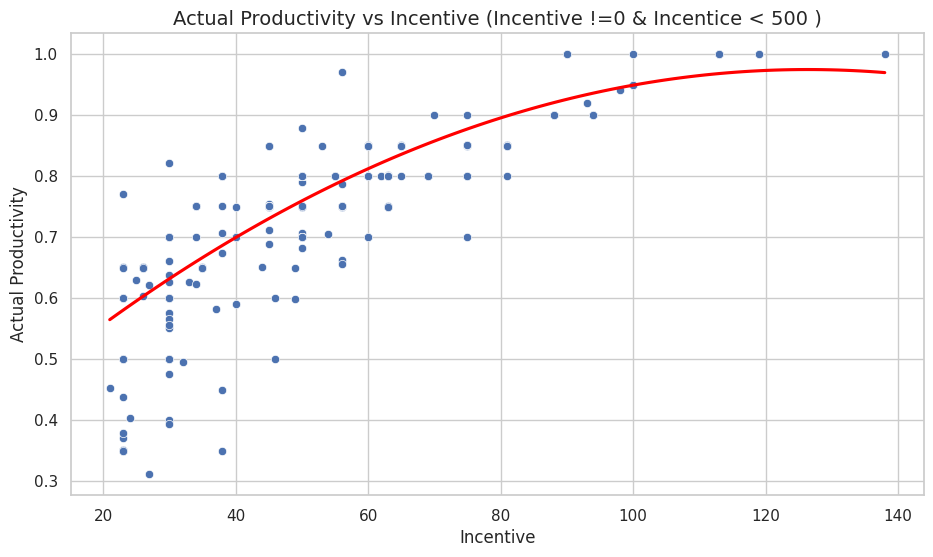

In [ ]:
sns.set(style='whitegrid')

# Filter the DataFrame where 'incentive' is less than 500
incentive_new = df_train.loc[(df_train['incentive'] < 500) & (df_train['incentive'] != 0)]

plt.figure(figsize=(11, 6))
scatter_plot = sns.scatterplot(x='incentive', y='actual_productivity', data=incentive_new)
sns.regplot(x='incentive', y='actual_productivity', data=incentive_new, scatter=False, color='red',order=2, ci=None)
#cor_inc = incentive_new['incentive'].corr(incentive_new['actual_productivity'])
#plt.annotate(f'Corr: {cor_inc:.2f}', xy=(0.75, 0.9), xycoords='axes fraction', fontsize=12, color='black')

plt.xlabel('Incentive', fontsize=12)
plt.ylabel('Actual Productivity', fontsize=12)
plt.title('Actual Productivity vs Incentive (Incentive !=0 & Incentice < 500 )', fontsize=14)

plt.show()

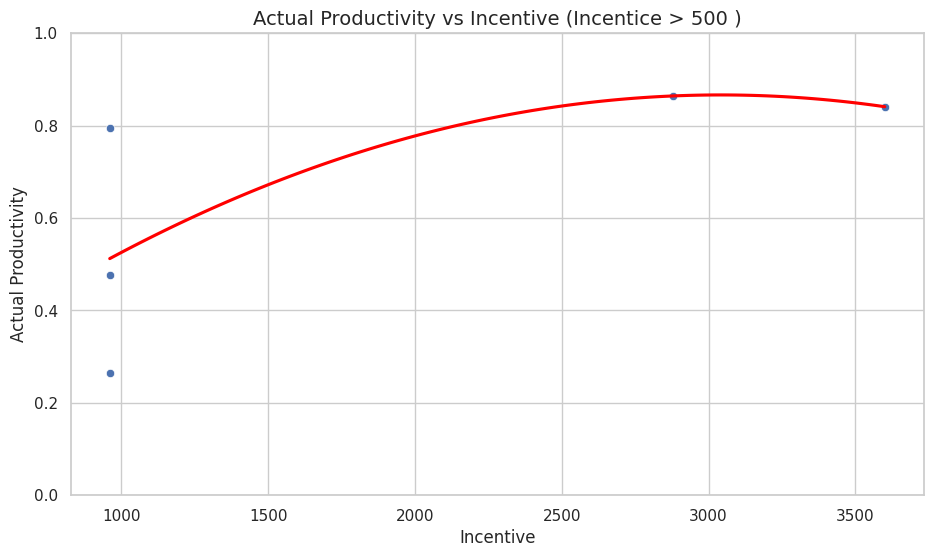

In [ ]:
sns.set(style='whitegrid')

# Filter the DataFrame where 'incentive' is less than 500
incentive_new = df_train.loc[(df_train['incentive'] > 500)]

plt.figure(figsize=(11, 6))
scatter_plot = sns.scatterplot(x='incentive', y='actual_productivity', data=incentive_new)
sns.regplot(x='incentive', y='actual_productivity', data=incentive_new, scatter=False, color='red',order=2, ci=None)
plt.ylim(0, 1)


plt.xlabel('Incentive', fontsize=12)
plt.ylabel('Actual Productivity', fontsize=12)
plt.title('Actual Productivity vs Incentive (Incentice > 500 )', fontsize=14)

plt.show()

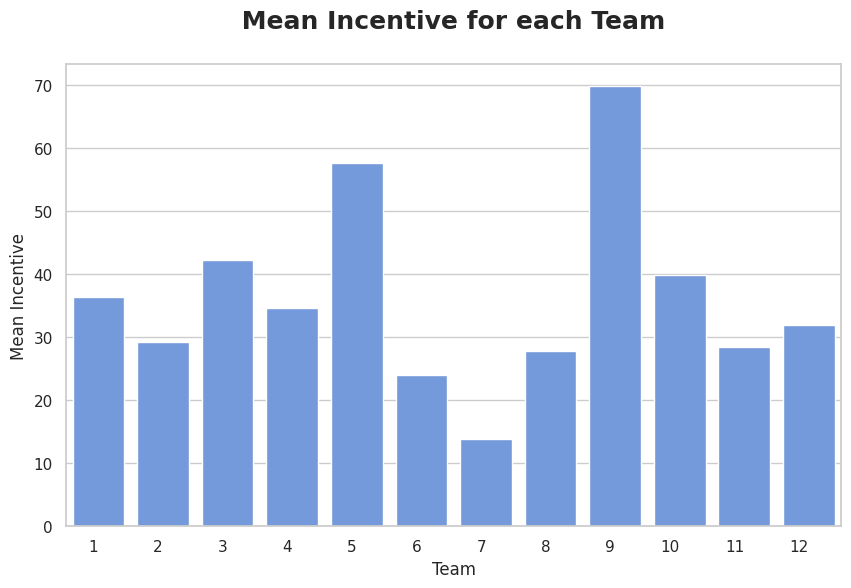

In [ ]:

#Incentive Vs Team
plt.figure(figsize=(10, 6))

sns.barplot(x='team', y='incentive',color='cornflowerblue', data=df_train, errorbar=None)

plt.xticks(rotation=0, ha='right', fontsize=11)

plt.xlabel('Team', fontsize=12)
plt.ylabel('Mean Incentive', fontsize=12)
plt.title(" Mean Incentive for each Team \n", fontsize=18, fontweight='bold')

plt.show()

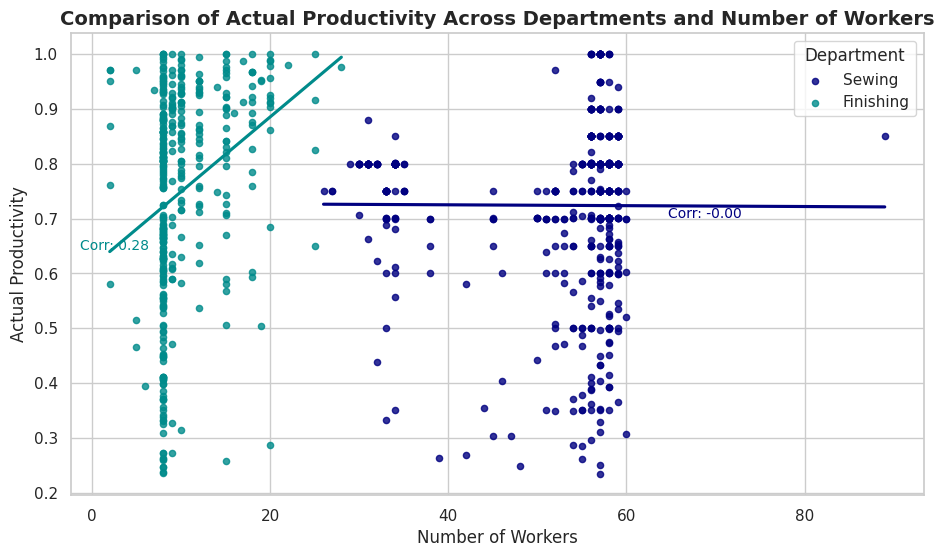

In [ ]:
# @title
sns.set(style='whitegrid')

plt.figure(figsize=(11, 6))

# Separate data for each department
df_sew = df_train[df_train['department'] == 'sewing']
df_fin = df_train[df_train['department'] == 'finishing']

# Plot scatter plots with regression lines for each department
sns.regplot(x='no_of_workers', y='actual_productivity', data=df_sew, color='navy', label='Sewing', scatter_kws={"s": 20}, ci=None)
sns.regplot(x='no_of_workers', y='actual_productivity', data=df_fin, color='darkcyan', label='Finishing', scatter_kws={"s": 20}, ci=None)

# Annotate correlation coefficient for Sewing
cor_sew = df_sew['no_of_workers'].corr(df_sew['actual_productivity'])
plt.annotate(f'Corr: {cor_sew:.2f}', xy=(0.7, 0.6), xycoords='axes fraction', fontsize=10, color='navy')

# Annotate correlation coefficient for Finishing
cor_fin = df_fin['no_of_workers'].corr(df_fin['actual_productivity'])
plt.annotate(f'Corr: {cor_fin:.2f}', xy=(0.01, 0.53), xycoords='axes fraction', fontsize=10, color='darkcyan')

plt.legend(title='Department')

plt.xlabel('Number of Workers', fontsize=12)
plt.ylabel('Actual Productivity', fontsize=12)
plt.title('Comparison of Actual Productivity Across Departments and Number of Workers', fontsize=14, fontweight='bold');

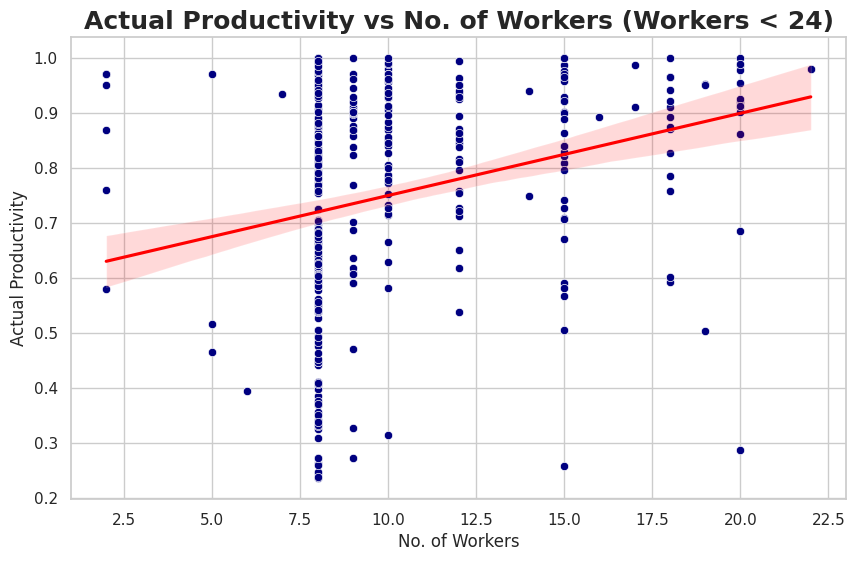

In [ ]:
plt.figure(figsize=(10, 6))

# Filter the data where no_of_workers is less than 24
df_subset = df_train[df_train['no_of_workers'] < 24]

# Scatter plot
sns.scatterplot(x='no_of_workers', y='actual_productivity', data=df_subset, color='navy')

# Linear regression line
sns.regplot(x='no_of_workers', y='actual_productivity', data=df_subset, color='red', scatter=False)

plt.title("Actual Productivity vs No. of Workers (Workers < 24)", fontsize=18, fontweight='bold')
plt.xlabel('No. of Workers')
plt.ylabel('Actual Productivity')

plt.show()

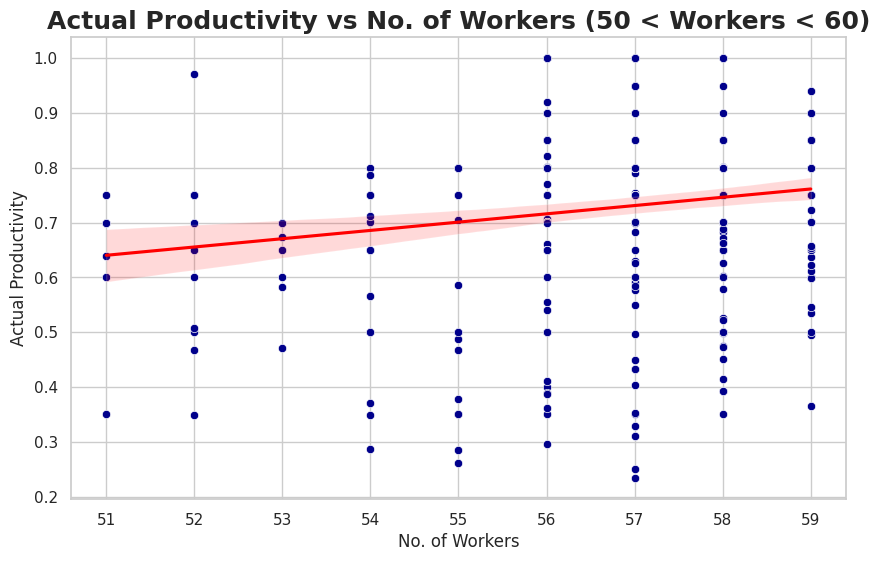

In [ ]:
plt.figure(figsize=(10, 6))

# Filter the data where no_of_workers is between 50 and 60
df_subset = df_train[(df_train['no_of_workers'] > 50) & (df_train['no_of_workers'] < 60)]

# Scatter plot
sns.scatterplot(x='no_of_workers', y='actual_productivity', data=df_subset, color='darkblue')

# Linear regression line
sns.regplot(x='no_of_workers', y='actual_productivity', data=df_subset, color='red', scatter=False)

plt.title("Actual Productivity vs No. of Workers (50 < Workers < 60)", fontsize=18, fontweight='bold')
plt.xlabel('No. of Workers')
plt.ylabel('Actual Productivity')

plt.show()

## PairPlots of quantitative variables

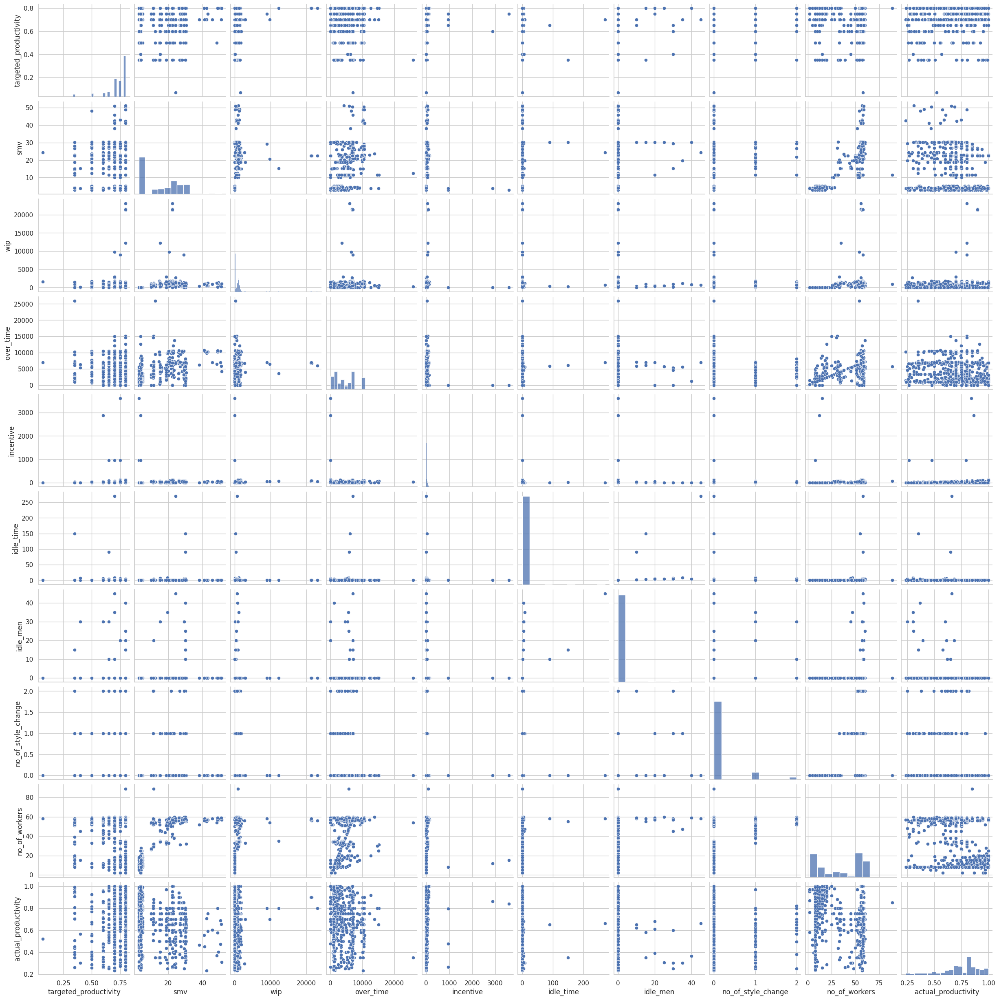

In [ ]:
sns.pairplot(df_train.loc[:,quants])
plt.show()

### Temporal Effects

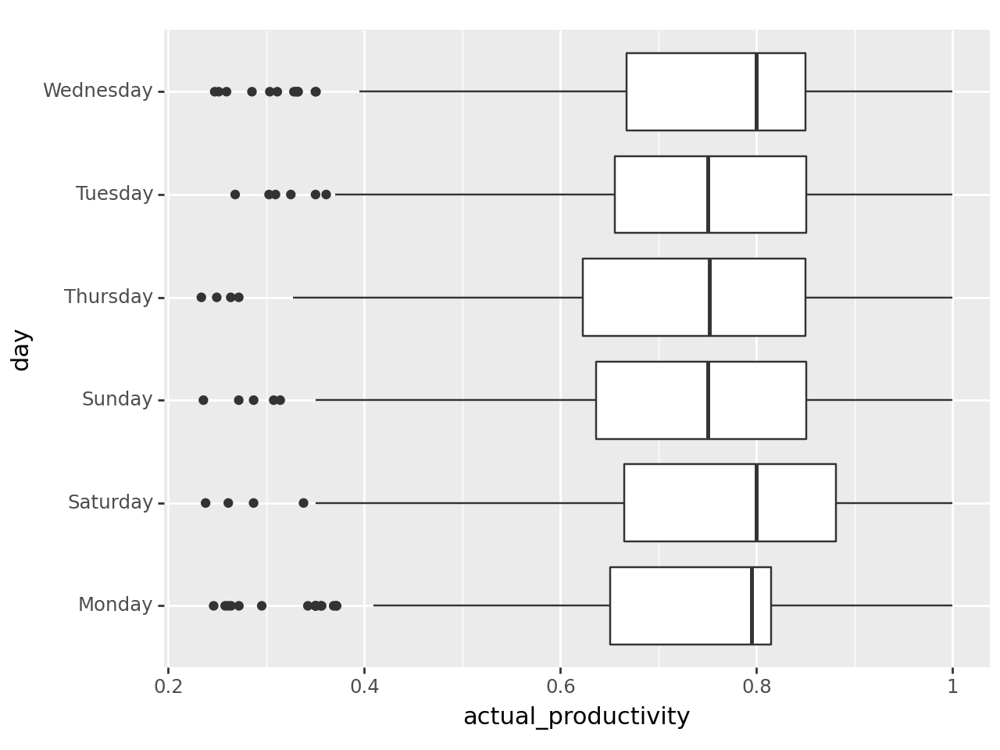

<Figure Size: (640 x 480)>

In [ ]:
from plotnine import (
    ggplot,
    aes,
    geom_boxplot,
    geom_jitter,
    scale_x_discrete,
    coord_flip,
    scale_fill_brewer
)

(
    ggplot(df_train,aes(x='day',y='actual_productivity'))
    + geom_boxplot()
    + coord_flip()
)

Observing the there is more productivity on Wenesday but not much. No observation in friday might be holiday

### Productivty towards the quarter

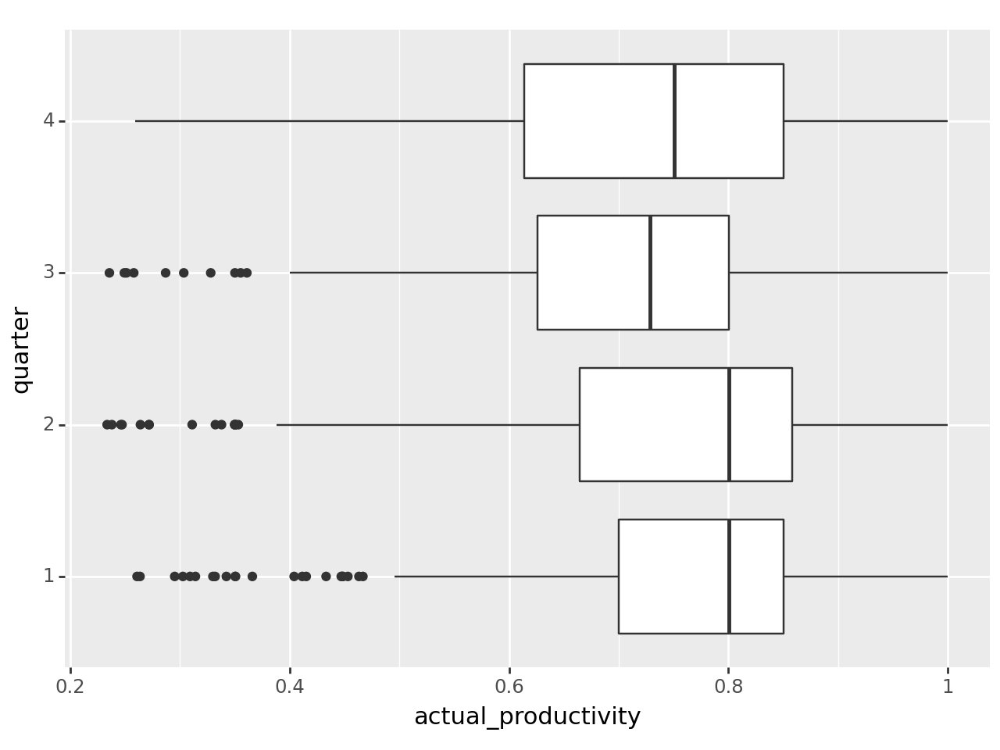

<Figure Size: (640 x 480)>

In [ ]:
(
    ggplot(df_train,aes(x='quarter',y='actual_productivity'))
    + geom_boxplot()
    + coord_flip()
)

On average lowest is in the 3rd quarter. Is thei because of motivation?

### Distribution of the productivity based on the date of the month

In [ ]:
#Getting the mean of productivity for each day of the given months
#Given the data is relatively normal we can do that
df_date_nums_mean=df_train.groupby(["date_num"]).actual_productivity.agg(np.mean)
df_date_nums_mean_tp=df_train.groupby(["date_num"]).targeted_productivity.agg(np.mean)

df_date_nums_mean_tp

date_num
1     0.733721
2     0.728571
3     0.739362
4     0.745652
5     0.740769
6     0.785000
7     0.756000
8     0.740566
9     0.701786
10    0.728431
11    0.750909
12    0.736765
13    0.718421
14    0.725000
15    0.715152
16    0.714286
17    0.745455
18    0.729310
19    0.722857
20    0.704545
21    0.709375
22    0.728788
23    0.762500
24    0.709722
25    0.729032
26    0.701613
27    0.697059
28    0.684483
29    0.717647
31    0.722222
Name: targeted_productivity, dtype: float64

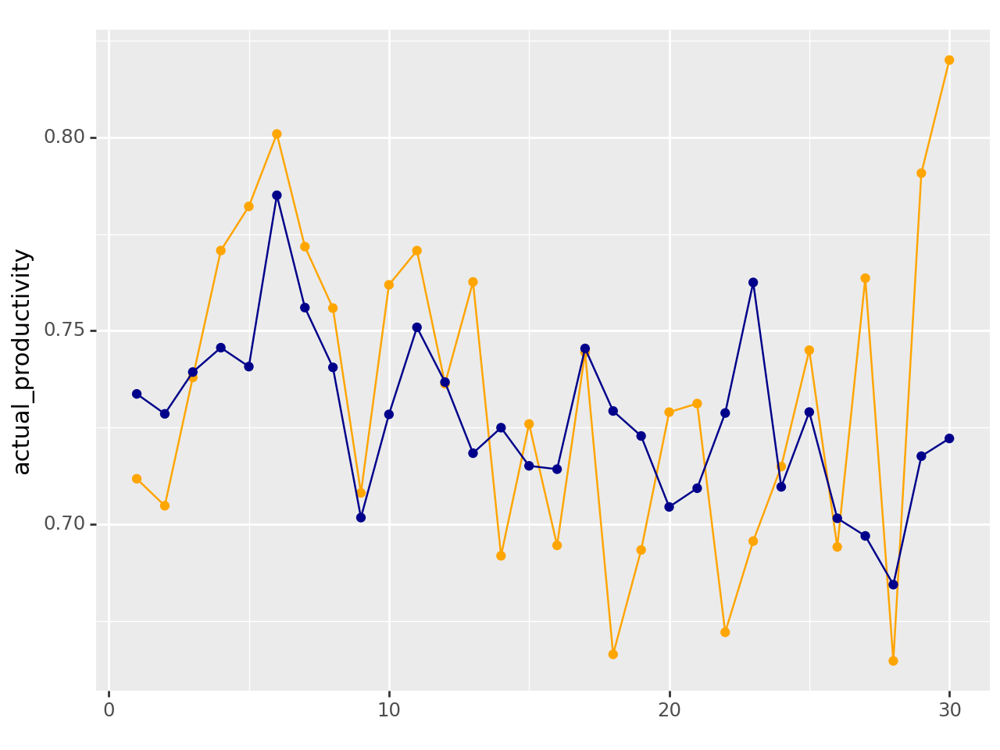

<Figure Size: (640 x 480)>

In [ ]:
(
    ggplot(aes(x=range(1,31)))
    +geom_line(aes(y=df_date_nums_mean),color="orange")
    +geom_point(aes(y=df_date_nums_mean),color="orange")
    +geom_line(aes(y=df_date_nums_mean_tp),color="darkblue")
    +geom_point(aes(y=df_date_nums_mean_tp),color="darkblue")
)

<ipython-input-74-317b217855f4>:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

<ipython-input-74-317b217855f4>:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.



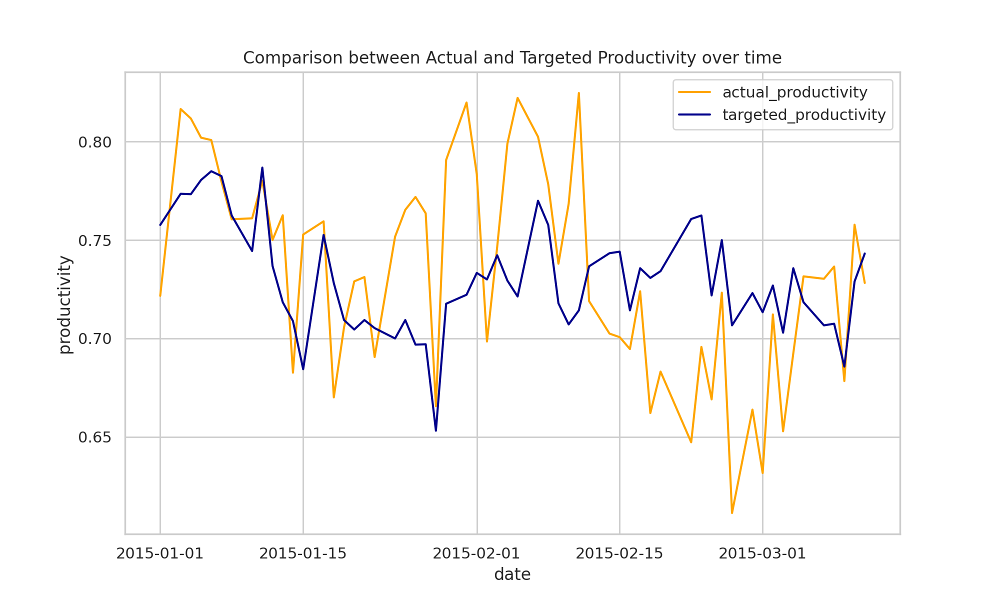

In [ ]:
# Line plot to check actual and targeted productivity
plt.figure(figsize=(10,6))

sns.lineplot(x='date', y='actual_productivity', data=df_train, ci= None, color='orange' )
sns.lineplot(x='date', y='targeted_productivity', data=df_train, ci= None, color='darkblue')

plt.legend(labels=['actual_productivity','targeted_productivity'])
plt.ylabel("productivity")
plt.title("Comparison between Actual and Targeted Productivity over time")
plt.show()


### Relationship between the number of workers and productivity

In [ ]:
from plotnine import *

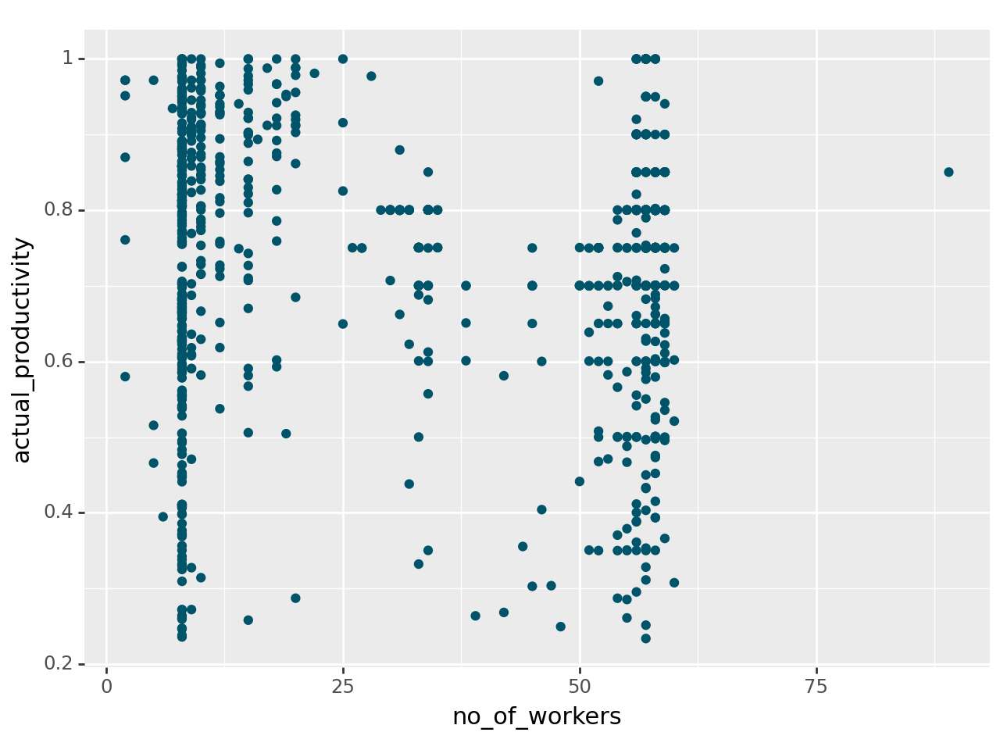

<Figure Size: (640 x 480)>

In [ ]:
(ggplot(df_train,aes(x='no_of_workers',y='actual_productivity'))
+geom_point(color='#00546A'))

As the above plot indicates there are 2 visible clusters when it comes to this particular combination.
We will try to analyse them individually

In [ ]:
df_train.columns

Index(['date', 'quarter', 'department', 'day', 'team', 'targeted_productivity',
       'smv', 'wip', 'over_time', 'incentive', 'idle_time', 'idle_men',
       'no_of_style_change', 'no_of_workers', 'date_num',
       'actual_productivity'],
      dtype='object')

In [ ]:
df_train.groupby(["team"]).no_of_workers.agg([max,min,np.mean,np.median])

,max,min,mean,median
team,,,,
1,59,2,33.666667,42.0
2,59,8,35.711111,45.0
3,60,8,42.416667,57.0
4,60,8,36.569767,55.0
5,60,2,37.694444,57.0
6,89,5,25.883117,32.0
7,60,8,36.144737,56.0
8,60,8,34.465909,52.0
9,59,2,34.273810,51.5


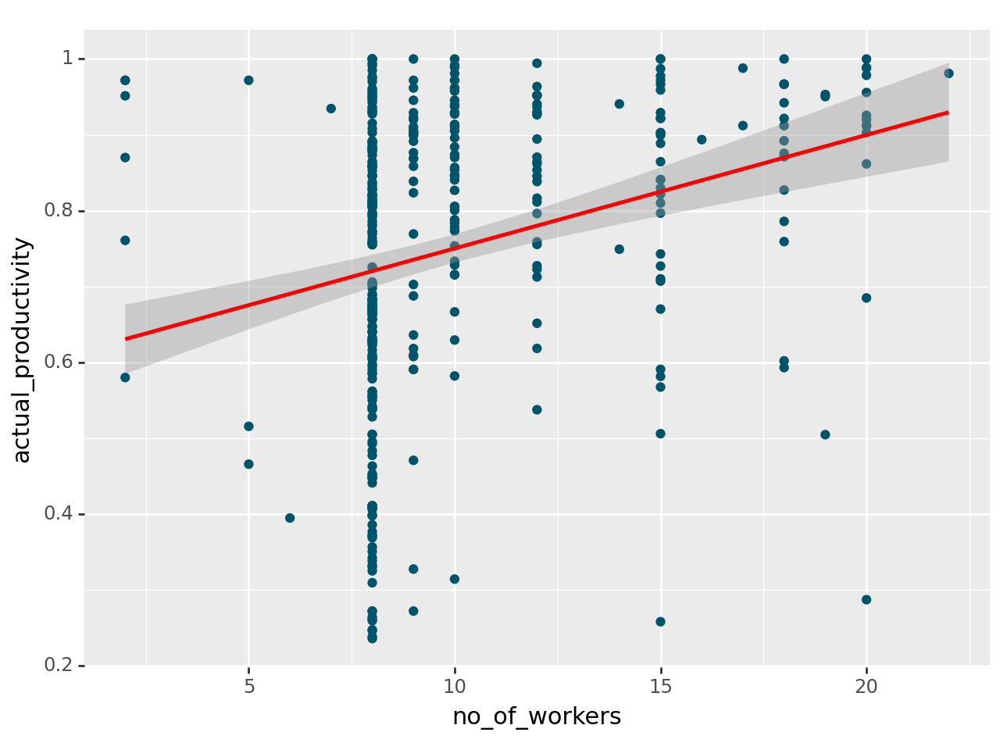

<Figure Size: (640 x 480)>

In [ ]:
(
    ggplot(df_train.loc[(df_train.no_of_workers<24)],aes(x='no_of_workers',y='actual_productivity'))
    +geom_point(color='#00546A')
    +stat_smooth(method="lm",color="red")
    )

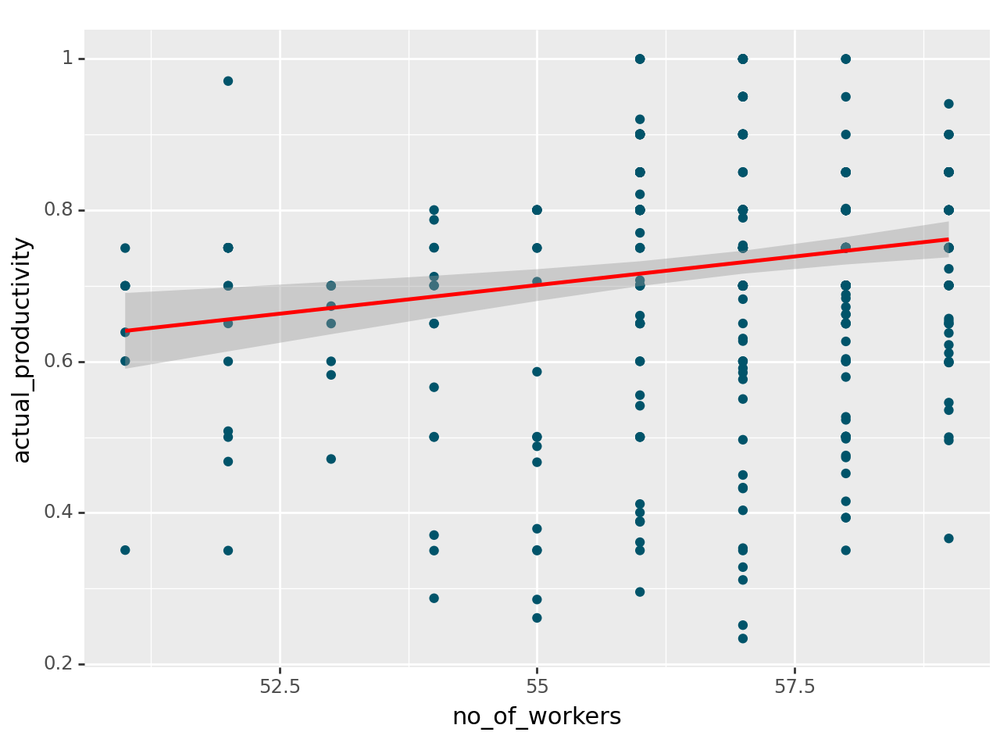

<Figure Size: (640 x 480)>

In [ ]:
(
    ggplot(df_train.loc[(df_train.no_of_workers>50) & (df_train.no_of_workers<60)],aes(x='no_of_workers',y='actual_productivity'))
    +geom_point(color='#00546A')
    +stat_smooth(method="lm",color="red")
    )

### Effect of Overtime and Incentives over productivity

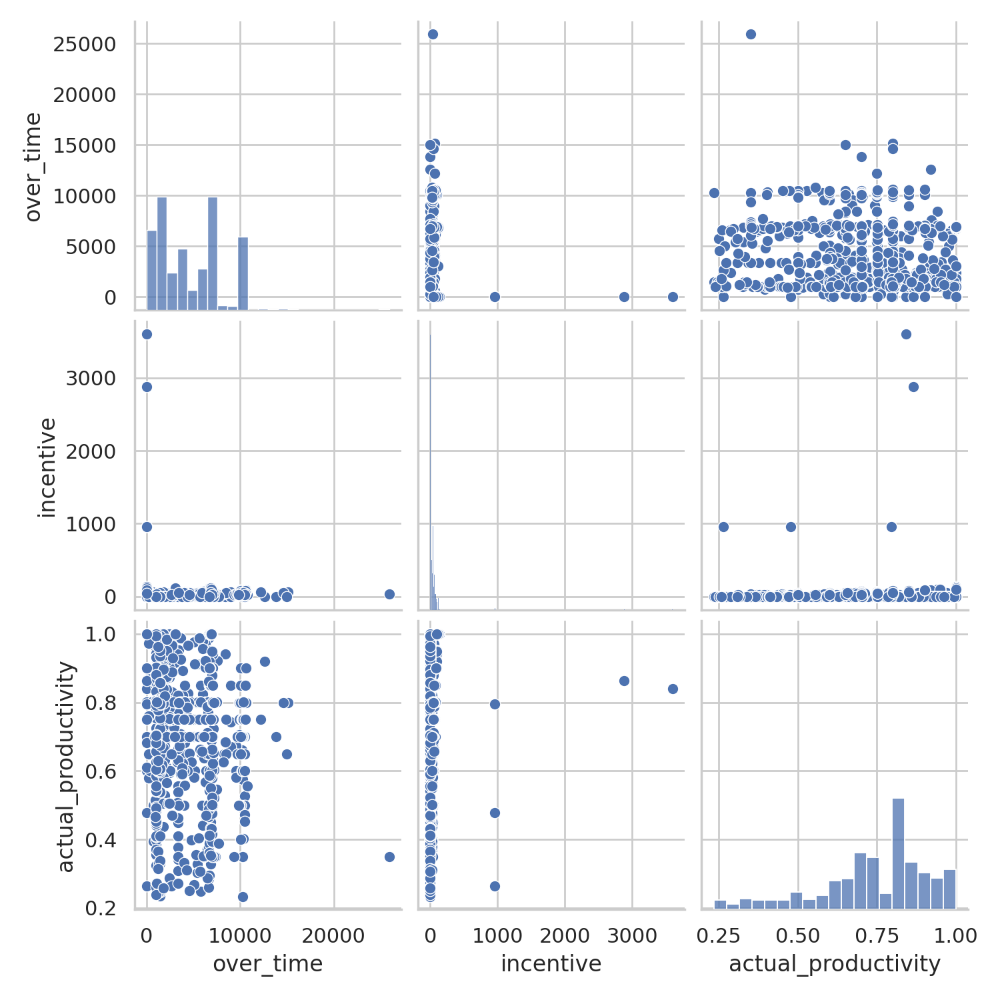

In [ ]:

sns.pairplot(df_train.loc[:,['over_time','incentive','actual_productivity']])
#plt.title("Relatiosnhip between Incentives, Overtime and Actual Production")
plt.show()

Although overtime does not have much of an effect incentive is hard to see as most of the data is skewed at 0 and there are

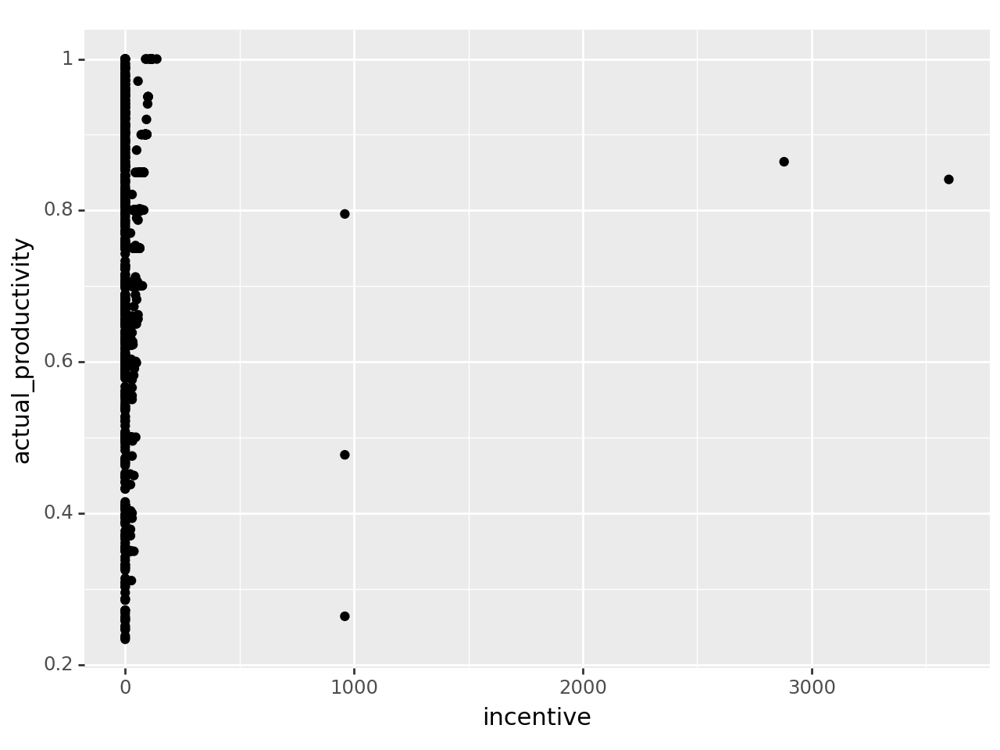

<Figure Size: (640 x 480)>

In [ ]:
(ggplot(df_train,aes(x='incentive',y='actual_productivity'))
+geom_point())

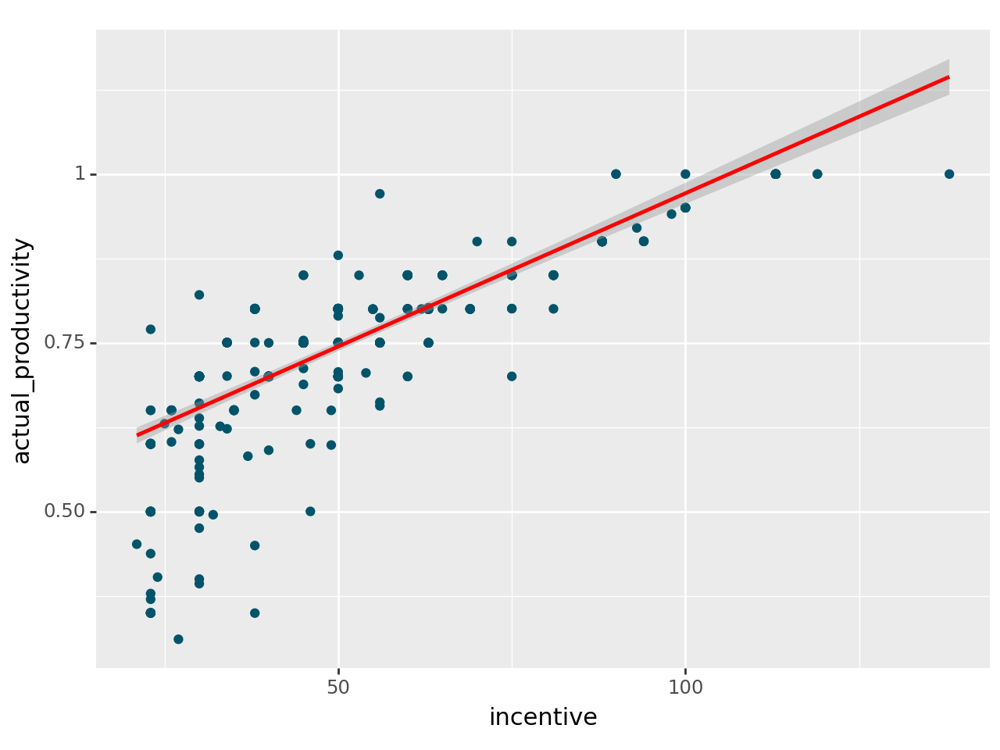

<Figure Size: (640 x 480)>

In [ ]:
(ggplot(df_train.loc[(df_train.incentive!=0) & (df_train.incentive < 250),['incentive','actual_productivity']],aes(x='incentive',y='actual_productivity'))
+geom_point(color='#00546A')
+ stat_smooth(method="lm",color="red"))

The above plot indicates that there is a correlation between incentive and the productivity

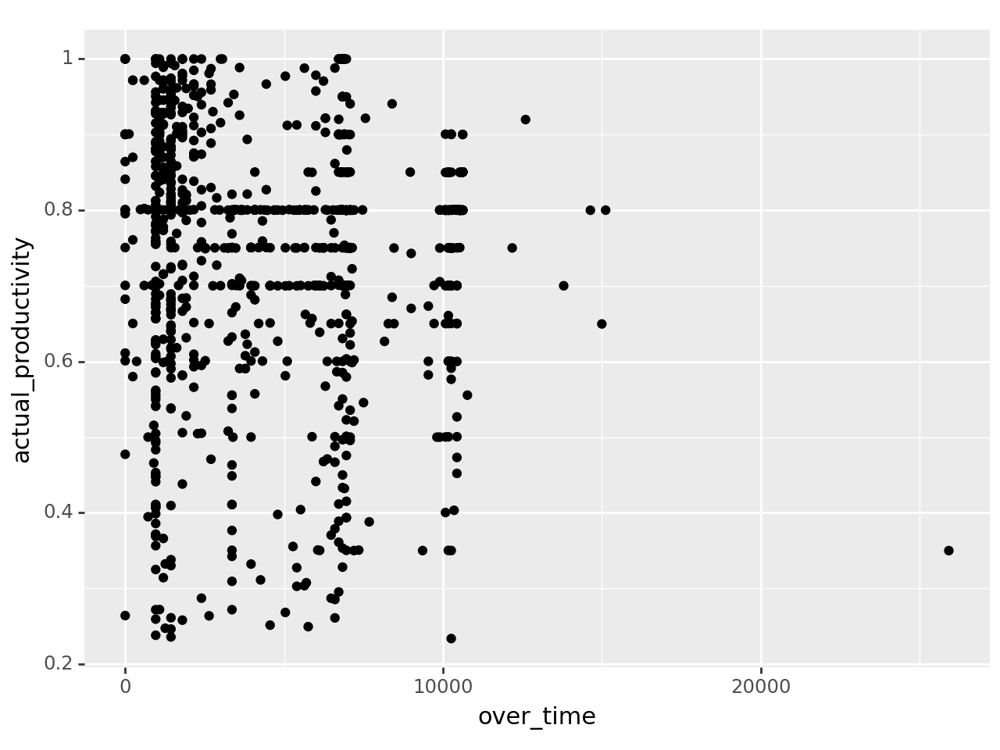

<Figure Size: (640 x 480)>

In [ ]:
(ggplot(df_train,aes(x='over_time',y='actual_productivity'))
+geom_point())

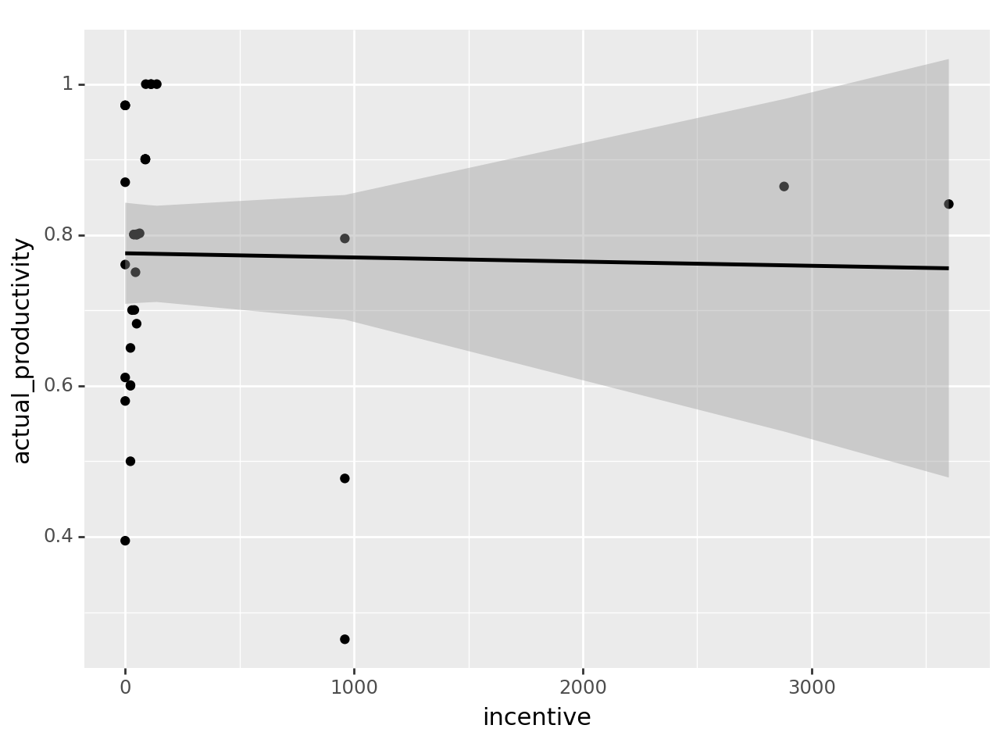

<Figure Size: (640 x 480)>

In [ ]:
(ggplot(df_train.loc[(df_train.over_time < 800),['incentive','actual_productivity']],aes(x='incentive',y='actual_productivity'))
+geom_point()
+ stat_smooth(method="lm"))

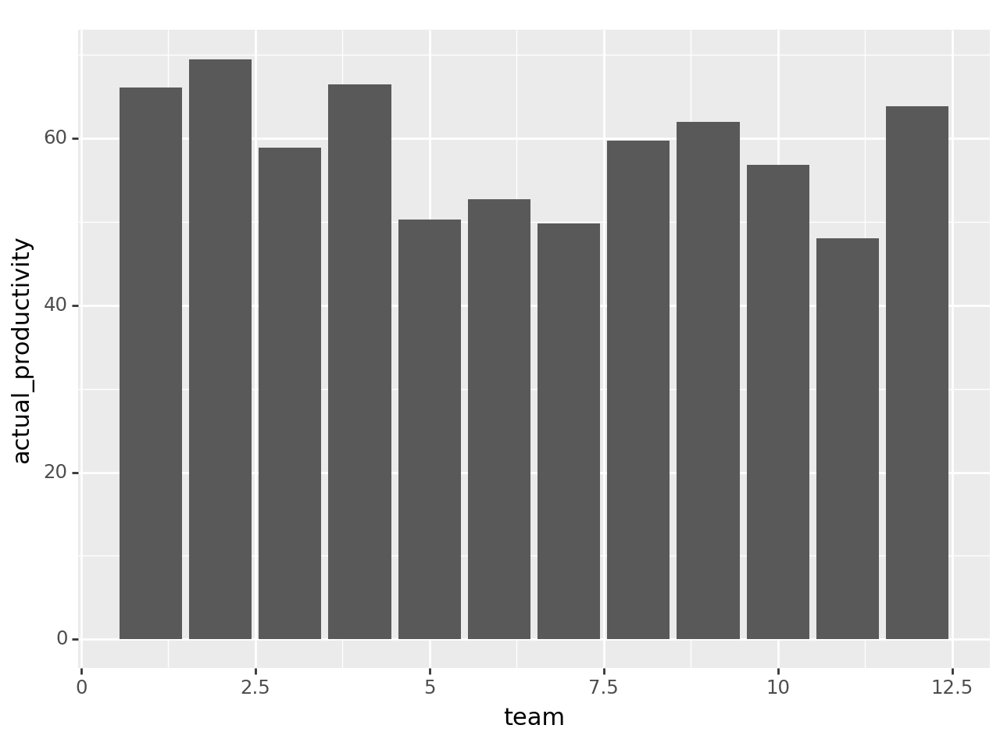

<Figure Size: (640 x 480)>

In [ ]:
(
    ggplot(df_train,aes(x='team',y='actual_productivity'))
    + geom_bar(stat='identity')
)


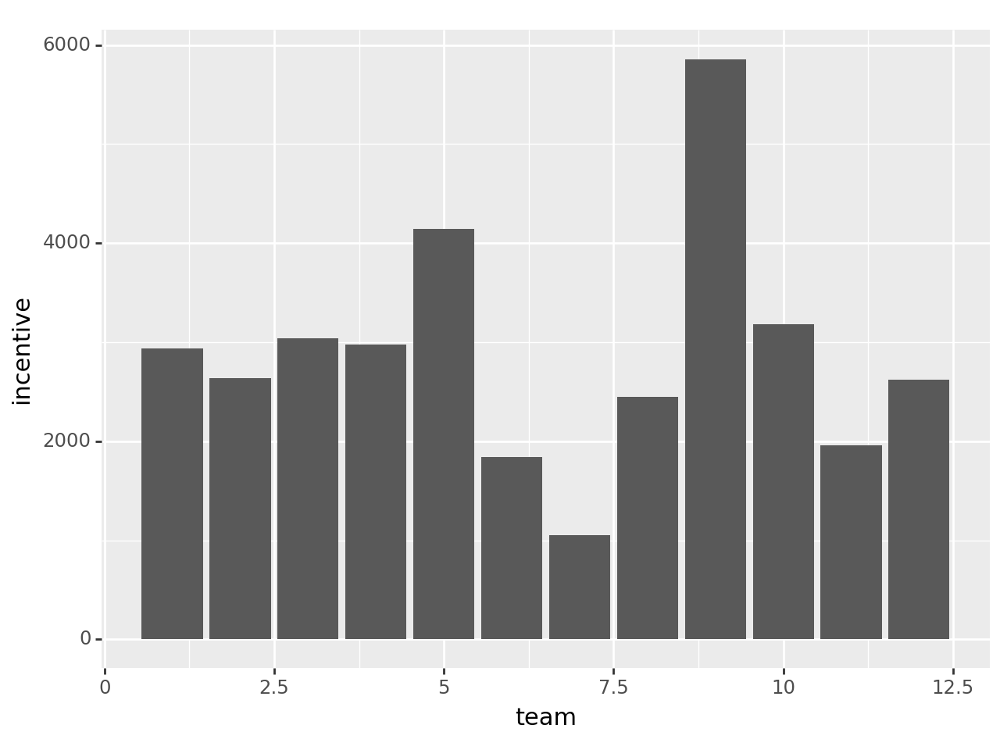

<Figure Size: (640 x 480)>

In [ ]:
(
    ggplot(df_train,aes(x='team',y='incentive'))
    + geom_bar(stat='identity')
)

Observing the bar chart distributions of Incentives and actual productivity we can observe that the linear relationship between the actual output and the incentives do not neccesrily extend towards the teams as team 9 with the highest incenctive pay does not have to highest output productivity

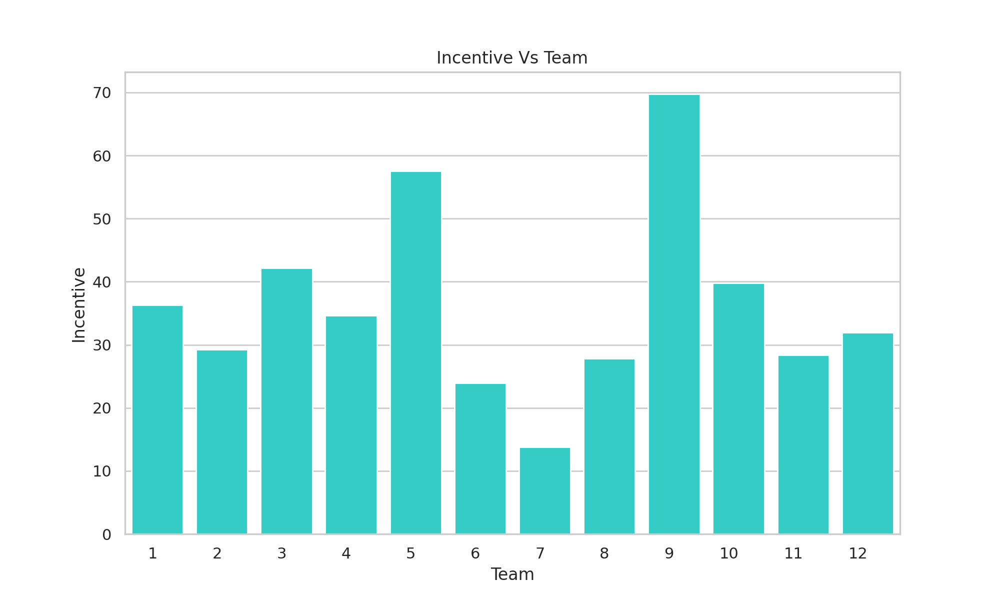

In [ ]:
plt.figure(figsize=(10, 6))

sns.barplot(x='team', y='incentive',color='#1BE5DB', data=df_train, errorbar=None)

plt.xticks(rotation=0, ha='right', fontsize=11)

plt.xlabel('Team', fontsize=12)
plt.ylabel('Incentive', fontsize=12)
plt.title("Incentive Vs Team")

plt.show()

### WIP and Actual Productivity

In [ ]:
df_train.department.unique()

array(['sewing', 'finishing'], dtype=object)

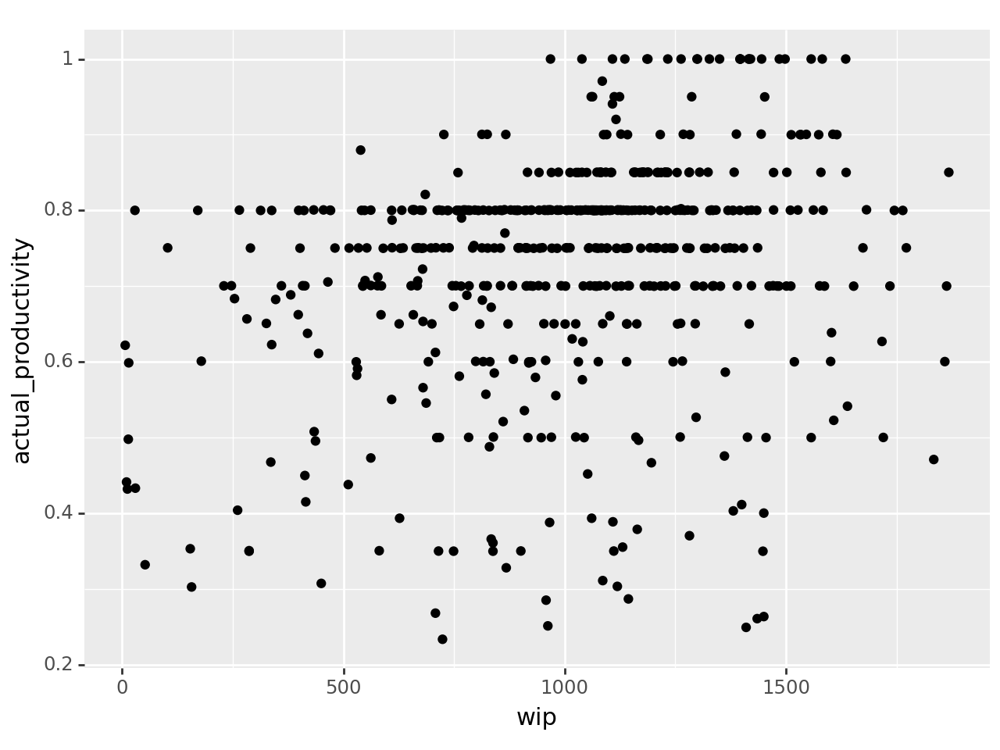

<Figure Size: (640 x 480)>

In [ ]:
(
    ggplot(df_train.loc[(df_train.department!='finishing') & (df_train.wip<2000),:],aes(x='wip',y='actual_productivity'))
    +geom_point()
)

Cannot Comment Properly on this

/usr/local/lib/python3.10/dist-packages/plotnine/guides/guides.py:197: PlotnineWarning: Cannot generate legend for the 'fill' aesthetic. Make sure you have mapped a variable to it


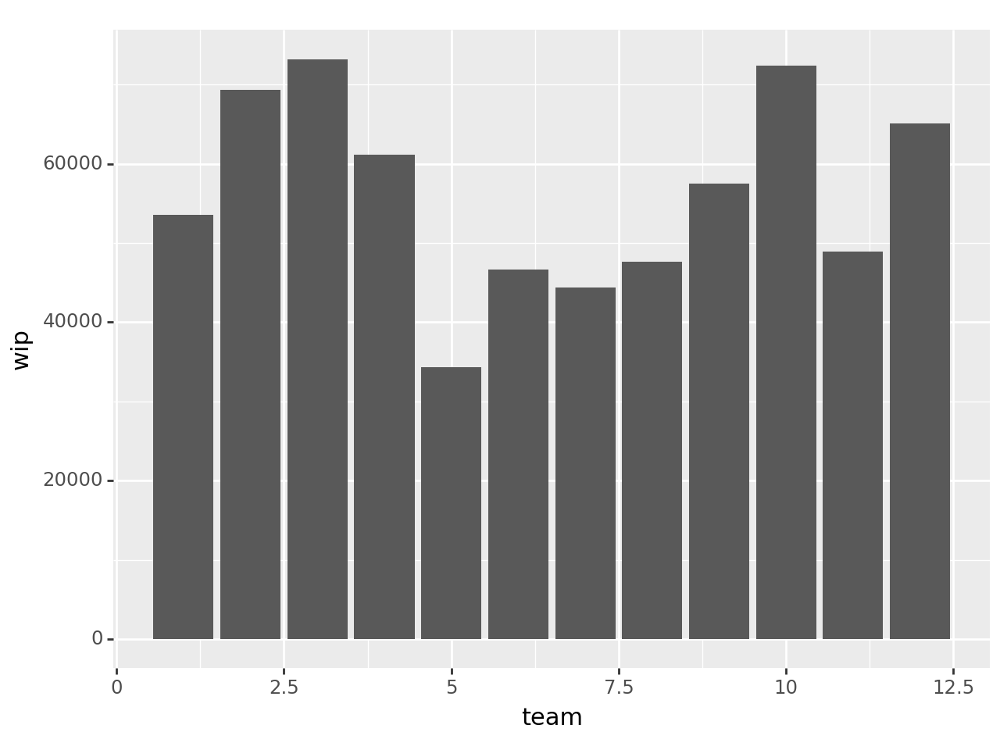

<Figure Size: (640 x 480)>

In [ ]:
(
    ggplot(df_train,aes(x='team',y='wip'))
    +geom_bar(stat='identity')
    +scale_fill_grey()
)

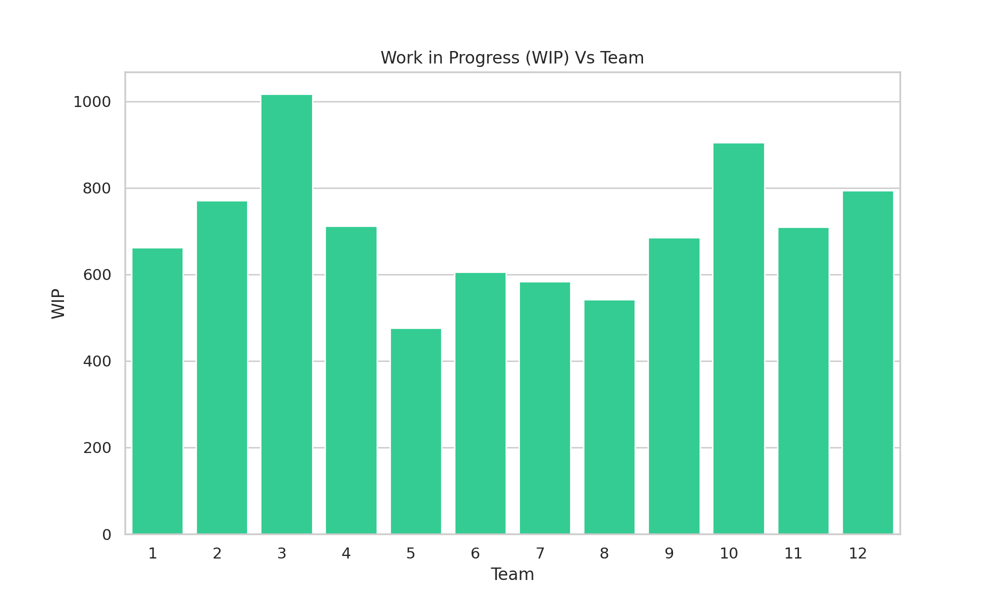

In [ ]:
plt.figure(figsize=(10, 6))

sns.barplot(x='team', y='wip',color='#1BE598', data=df_train, errorbar=None)

plt.xticks(rotation=0, ha='right', fontsize=11)

plt.xlabel('Team', fontsize=12)
plt.ylabel('WIP', fontsize=12)
plt.title('Work in Progress (WIP) Vs Team')

plt.show()

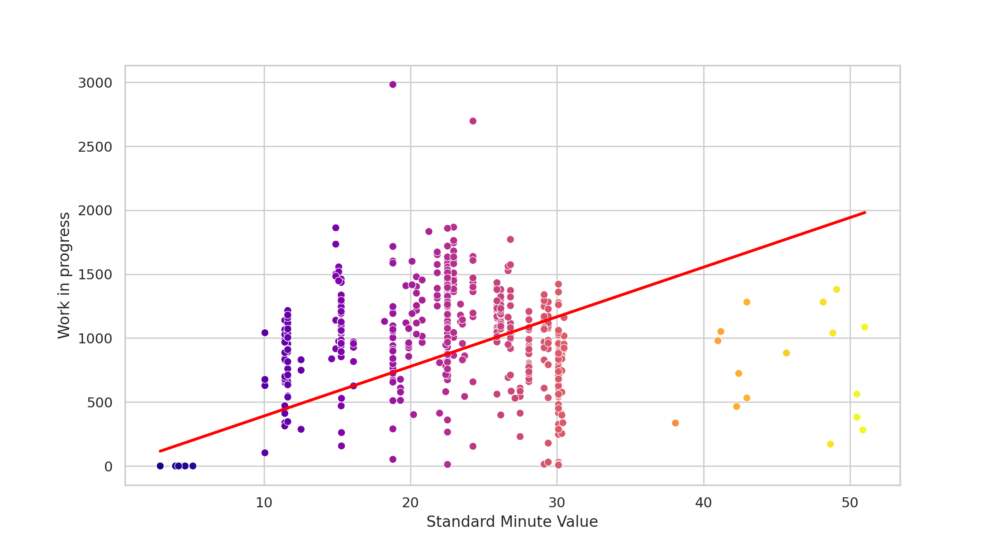

In [ ]:
sns.set(style='whitegrid')

plt.figure(figsize=(11, 6))
scatter_plot = sns.scatterplot(x='smv', y='wip', data=df_train.loc[(df_train.wip<5000)], hue='smv', palette ='plasma', legend=False)
sns.regplot(x='smv', y='wip', data=df_train.loc[(df_train.wip<5000)], scatter=False, color='red', ci=None)

plt.xlabel('Standard Minute Value', fontsize=12)
plt.ylabel('Work in progress', fontsize=12)


plt.show()

### Comparison between Actual and Targeted Productivity over time

Actual productivity generally exceeded targeted productivity except from mid February to beginning of March where targets were not being met

###  Department and Team Analysis

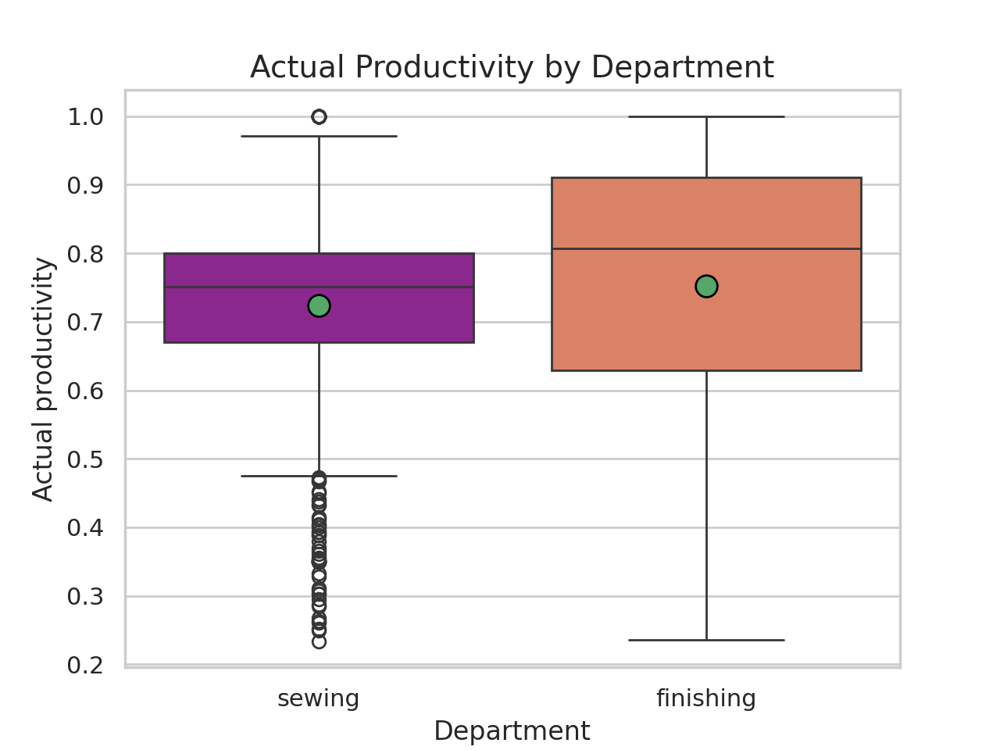

In [ ]:
dep = sns.boxplot(x='department',
            y='actual_productivity',
            data=df_train,
            showmeans=True,
            meanprops={"marker": "o",
                       "markeredgecolor": "black",
                       "markersize": "10"},
            hue='department',legend=False,
            palette ='plasma');
plt.ylabel("Actual productivity", size=12)
plt.xlabel("Department", size=12)
plt.title("Actual Productivity by Department", size=14);

The sewing department appears to have a higher median productivity and a higher mean productivity than the finishing department. This may suggest that, overall, workers in the sewing department tend to achieve a slightly higher level of productivity compared to those in the finishing department. but the box plot for the sewing department is narrower, suggesting less variability in productivity within that departmentby so we can say,the sewing department has more consistent average actual productivity with many more unproductive outliers.The finishing department's box plot is wider, indicating a wider range of productivity levels among its workers.This could reflect differences in task complexity, skill levels, or work organization between the departments.

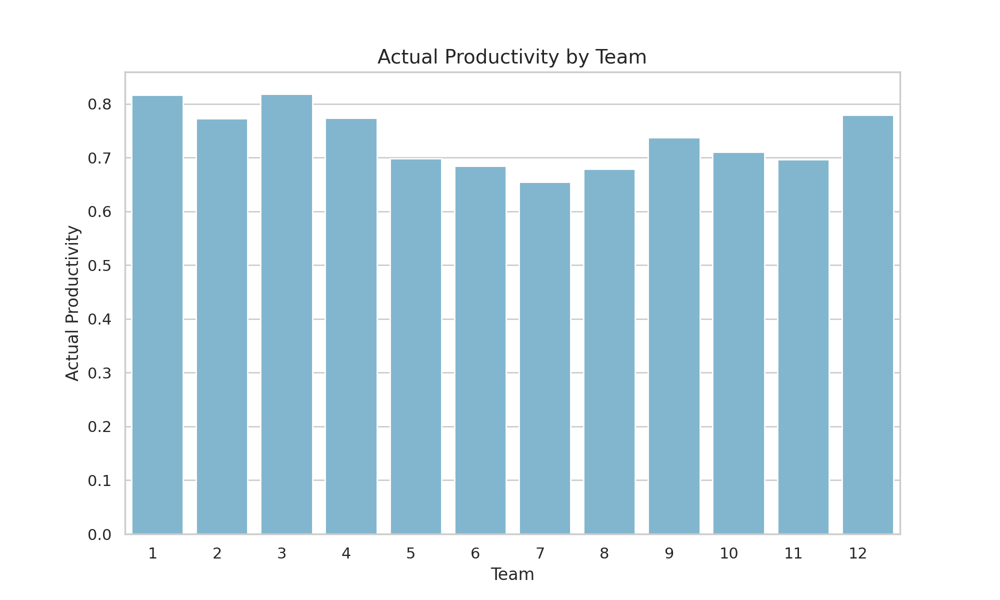

In [ ]:
plt.figure(figsize=(10, 6))

sns.barplot(x='team', y='actual_productivity',color='#75BBDC', data=df_train, errorbar=None)

plt.xticks(rotation=0, ha='right', fontsize=11)

plt.xlabel('Team', fontsize=12)
plt.ylabel('Actual Productivity', fontsize=12)
plt.title('Actual Productivity by Team', fontsize=14)

plt.show()

Most productive teams are team 1, 3 & 12 while team 6, 7, and 8 have the lowest actual productivity on average.

In [ ]:
df_train["no_of_workers"].unique()

array([58, 57, 32,  9,  8, 51, 33, 18, 56, 30, 12, 15, 31, 54, 38, 59, 34,
       60, 10, 52, 55, 26,  5, 53, 35, 19, 20,  2, 39, 47, 28, 48, 27, 22,
       45, 42,  6, 17, 14, 50, 25,  7, 89, 16, 44, 46, 29])

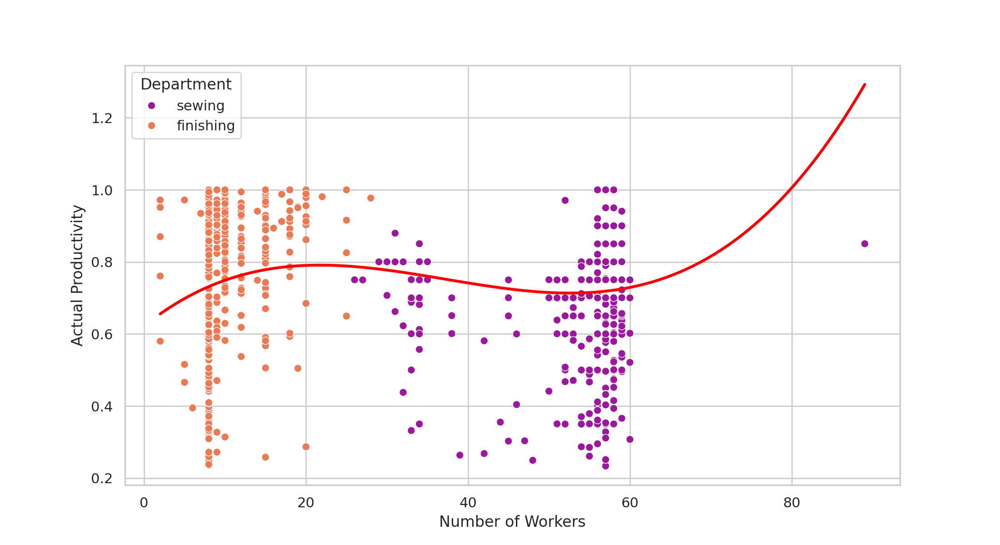

In [ ]:
sns.set(style='whitegrid')

plt.figure(figsize=(11, 6))
sns.scatterplot(x='no_of_workers', y='actual_productivity', data=df_train, hue='department', palette='plasma')
sns.regplot(x='no_of_workers', y='actual_productivity', data=df_train, scatter=False, color='red', order=3, ci=None )


plt.legend(title='Department')

plt.xlabel('Number of Workers', fontsize=12)
plt.ylabel('Actual Productivity', fontsize=12)
#plt.title('Comparison of Actual Productivity Across Departments and Number of Workers', fontsize=14)

plt.show()

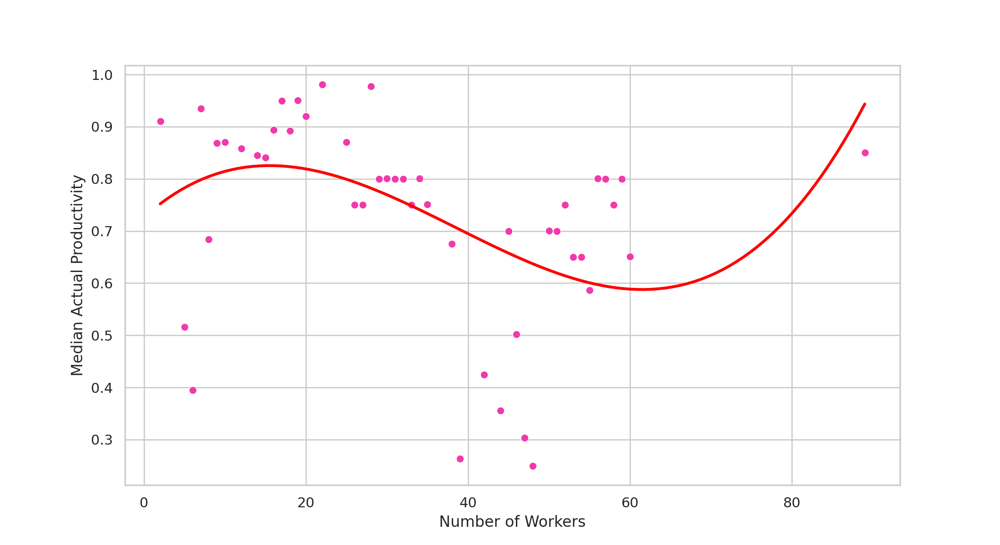

In [ ]:
median_actual_productivity = df_train.groupby('no_of_workers')['actual_productivity'].median().reset_index()

sns.set(style='whitegrid')
plt.figure(figsize=(11, 6))
sns.scatterplot(x='no_of_workers', y='actual_productivity', data=median_actual_productivity , color='#F139AB')
sns.regplot(x='no_of_workers', y='actual_productivity', data=median_actual_productivity, scatter=False, color='red', order=3, ci=None)

plt.xlabel('Number of Workers', fontsize=12)
plt.ylabel('Median Actual Productivity', fontsize=12)

plt.show()

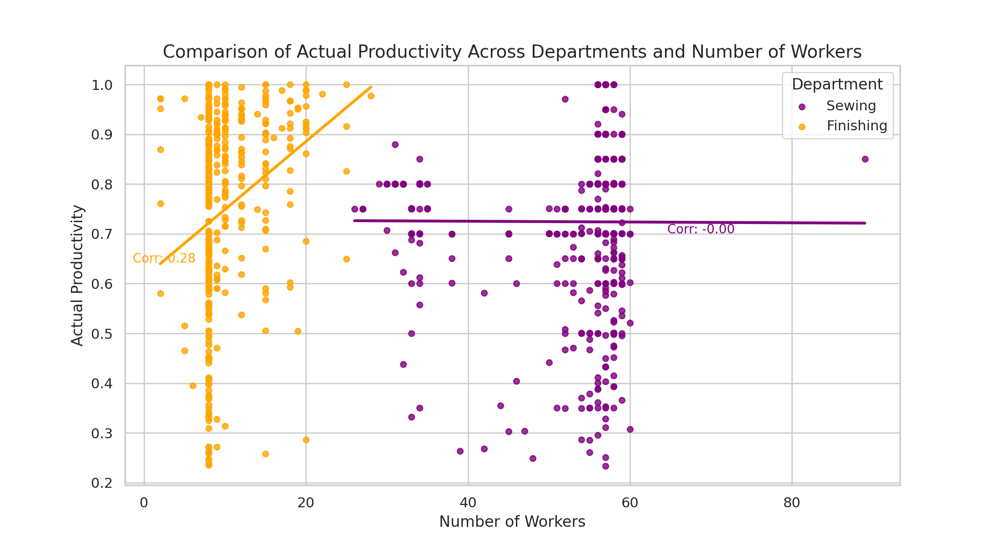

In [ ]:
# @title
sns.set(style='whitegrid')

plt.figure(figsize=(11, 6))

# Separate data for each department
df_sew = df_train[df_train['department'] == 'sewing']
df_fin = df_train[df_train['department'] == 'finishing']

# Plot scatter plots with regression lines for each department
sns.regplot(x='no_of_workers', y='actual_productivity', data=df_sew, color='purple', label='Sewing', scatter_kws={"s": 20}, ci=None)
sns.regplot(x='no_of_workers', y='actual_productivity', data=df_fin, color='orange', label='Finishing', scatter_kws={"s": 20}, ci=None)

# Annotate correlation coefficient for Sewing
cor_sew = df_sew['no_of_workers'].corr(df_sew['actual_productivity'])
plt.annotate(f'Corr: {cor_sew:.2f}', xy=(0.7, 0.6), xycoords='axes fraction', fontsize=10, color='purple')

# Annotate correlation coefficient for Finishing
cor_fin = df_fin['no_of_workers'].corr(df_fin['actual_productivity'])
plt.annotate(f'Corr: {cor_fin:.2f}', xy=(0.01, 0.53), xycoords='axes fraction', fontsize=10, color='orange')

plt.legend(title='Department')

plt.xlabel('Number of Workers', fontsize=12)
plt.ylabel('Actual Productivity', fontsize=12)
plt.title('Comparison of Actual Productivity Across Departments and Number of Workers', fontsize=14)

plt.show()



*  There is a positive correlation between the number of workers and actual productivity for finishing department while sewing department shows no average change with number of workers.
*  This means that as the number of workers increases, the overall productivityincreases in finishing depatment.examining the sewing department we can say productivity variation increase when more workers joined.
*   However, the rate of increase in productivity appears to slow down as the number of workers increases. This suggests that there may be diminishing returns to adding more workers.(as factors like communication overhead and coordination challenges can come into play with larger teams.)
*   The sewing department appears to have higher overall productivity than the finishing department. (This could be due to several factors, such as differences in the complexity of the tasks involved, the level of automation used, or the skill level of the workers.)


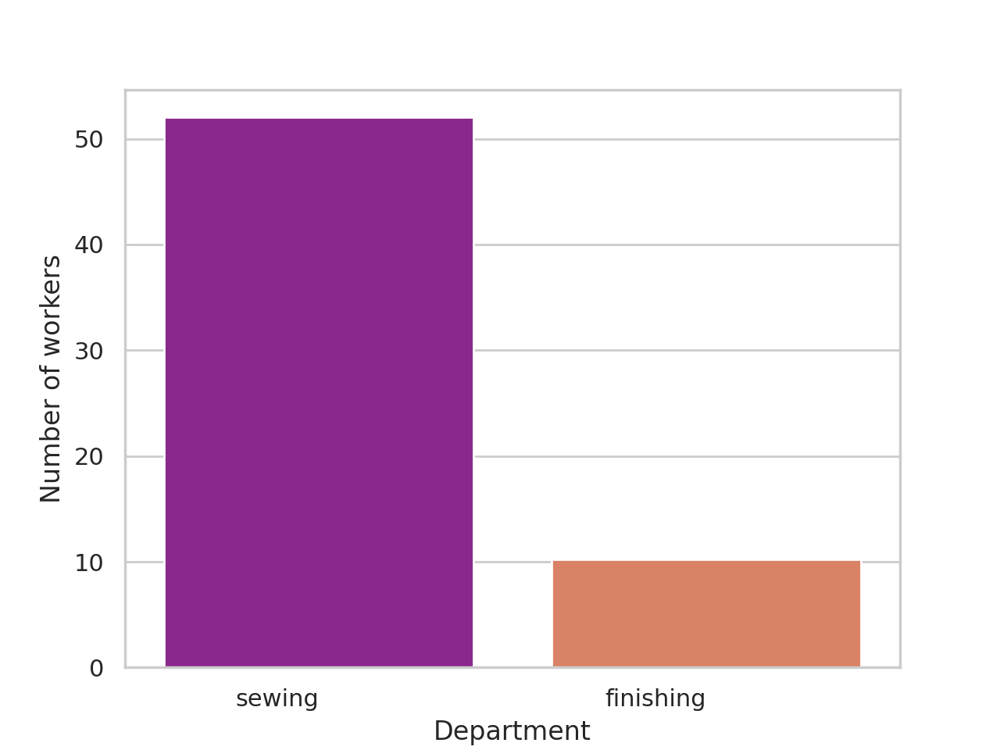

In [ ]:
sns.barplot(x='department', y='no_of_workers',palette='plasma',hue='department',legend=False, data=df_train, errorbar=None)

plt.xticks(rotation=0, ha='right', fontsize=11)

plt.xlabel('Department', fontsize=12)
plt.ylabel('Number of workers', fontsize=12)
#plt.title('No.of workers & Department', fontsize=14)

plt.show()

sewing department has more workers (nearly 55) compared to finihing departmnet which is close to 10.


### Style Change Impact

In [ ]:

df_train["no_of_style_change"].unique()

array([0, 1, 2])

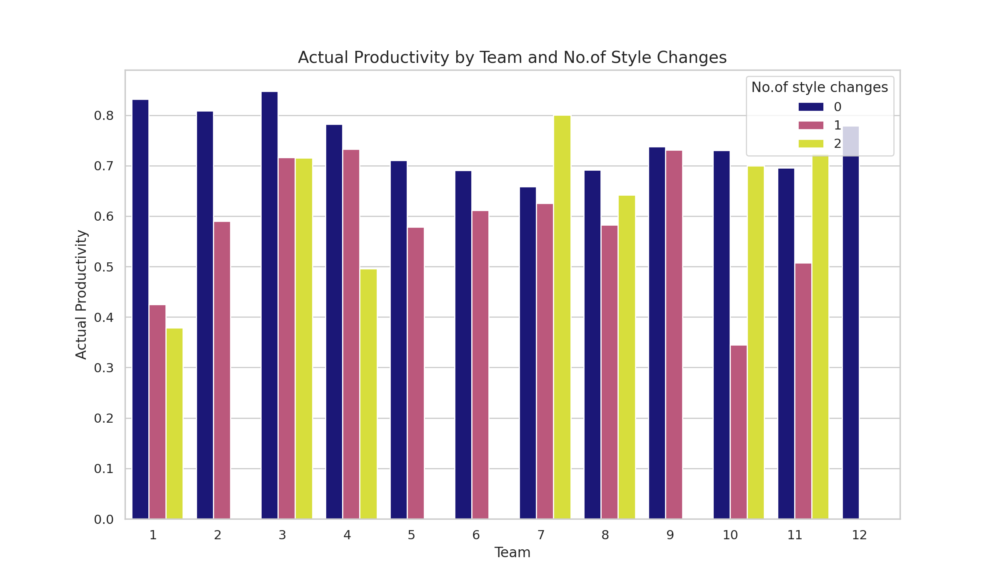

In [ ]:
plt.figure(figsize=(12, 7))

sns.barplot(x='team', y='actual_productivity',hue='no_of_style_change',palette ='plasma', data=df_train, errorbar=None)

plt.xticks(rotation=0, ha='right', fontsize=11)
plt.legend(loc='upper right', title='No.of style changes')

plt.xlabel('Team', fontsize=12)
plt.ylabel('Actual Productivity', fontsize=12)
plt.title('Actual Productivity by Team and No.of Style Changes', fontsize=14)

plt.show()

except for team 7,11 and 12 all the other teams shows some significant decreament in actual productivity when No of stlye changes increases.This is likely because style changes disrupt the flow of work and make it more difficult for employees to maintain their efficiency. However we can see contrary behavior for team 7 and 11 as when No.of style changes increase their actual productivity also shows higher value.there might be some other factors affecting this behavior. we cannot say about team 12 as they have no style changes at all .

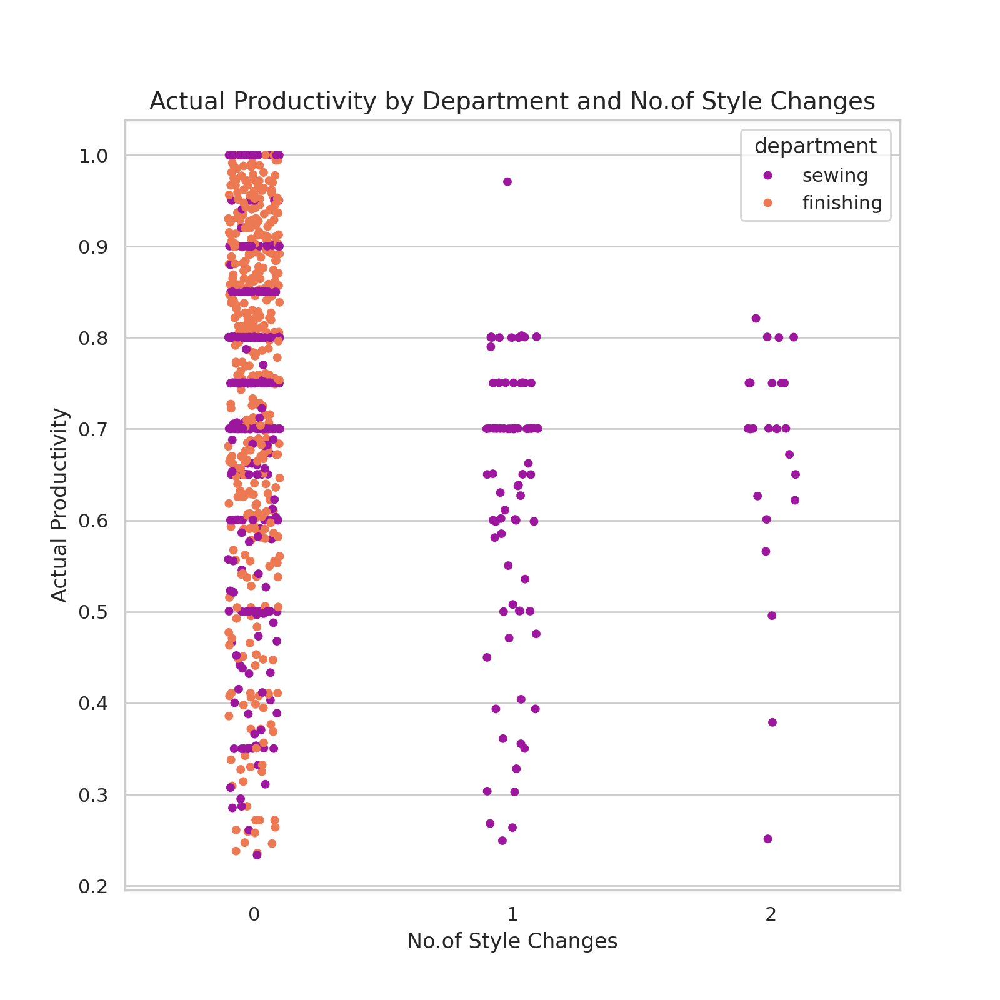

In [ ]:
plt.figure(figsize=(8, 8))

sns.stripplot(data=df_train, x="no_of_style_change", y="actual_productivity", hue='department', palette ='plasma')
plt.xlabel('No.of Style Changes', fontsize=12)
plt.ylabel('Actual Productivity', fontsize=12)
plt.title('Actual Productivity by Department and No.of Style Changes', fontsize=14)

plt.show()

we can clearly see that finishing department has zero style changes, which make sense. also we can notice that on average actual productivity slightly decreases when No of changes increase from 0 to 2.

### Idle Time Analysis

In [ ]:
df_train["idle_time"].unique()

array([  0. ,  90. ,   5. ,   3.5,   8. , 270. , 150. ,   6.5,   4. ,
         2. ,   4.5])

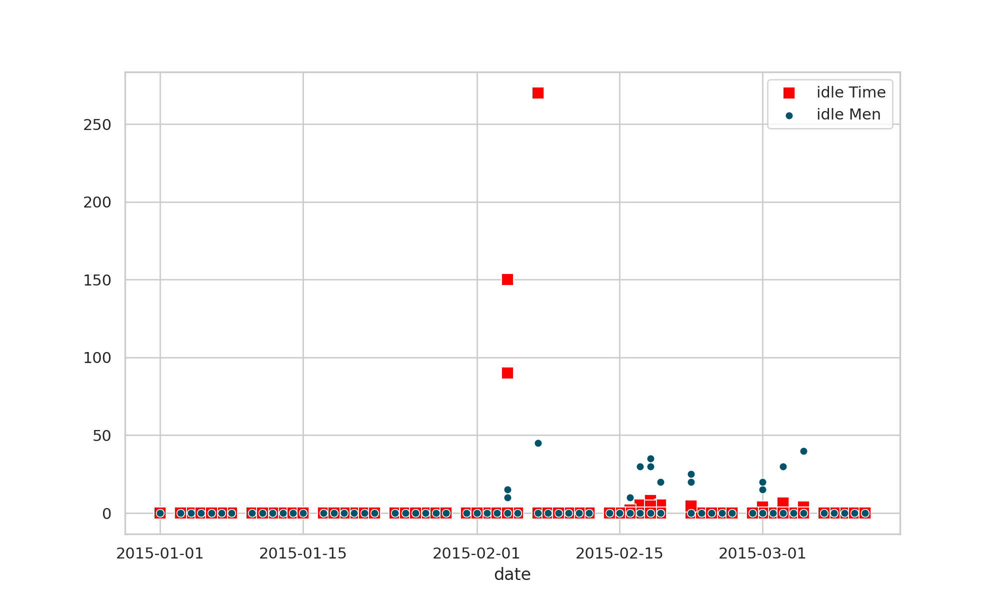

In [ ]:
sns.set(style='whitegrid')
plt.figure(figsize=(10,6))

sns.scatterplot(x='date', y='idle_time', data=df_train, color='red', marker='s', s=70)
sns.scatterplot(x='date', y='idle_men', data=df_train, color='#00546A', marker='o', s=30 )
plt.legend(labels=['idle Time','idle Men'])
plt.ylabel("")
#plt.title("idle Time and idle men over Time")
plt.show()

We can observe that idle time occurred for only 10 days, coinciding with the days when idle men were also present.



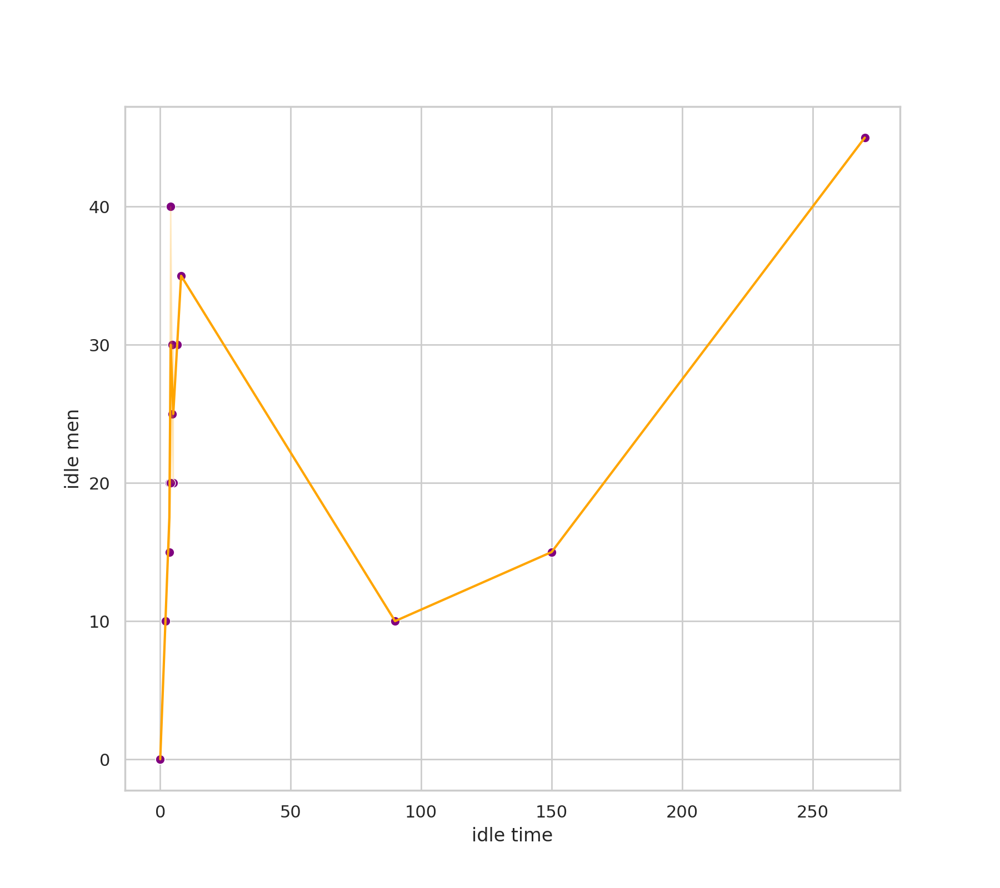

In [ ]:
plt.figure(figsize=(9, 8))

sns.scatterplot(x='idle_time', y='idle_men', data=df_train, color='purple')
sns.lineplot(x='idle_time', y='idle_men', data=df_train, color='orange')
#plt.xticks(rotation=90, ha='right',fontsize=9)
#plt.title('idle Time Vs idle Men')
plt.xlabel('idle time')
plt.ylabel('idle men')


plt.show()

idle men increase with idle time and then dropped and again increases

In [ ]:
df_train["date"].unique()

array(['2015-01-21T00:00:00.000000000', '2015-02-05T00:00:00.000000000',
       '2015-01-28T00:00:00.000000000', '2015-02-10T00:00:00.000000000',
       '2015-01-24T00:00:00.000000000', '2015-01-29T00:00:00.000000000',
       '2015-01-06T00:00:00.000000000', '2015-03-07T00:00:00.000000000',
       '2015-02-28T00:00:00.000000000', '2015-01-01T00:00:00.000000000',
       '2015-03-04T00:00:00.000000000', '2015-02-04T00:00:00.000000000',
       '2015-01-18T00:00:00.000000000', '2015-02-19T00:00:00.000000000',
       '2015-01-07T00:00:00.000000000', '2015-02-09T00:00:00.000000000',
       '2015-02-24T00:00:00.000000000', '2015-01-25T00:00:00.000000000',
       '2015-02-11T00:00:00.000000000', '2015-01-15T00:00:00.000000000',
       '2015-01-17T00:00:00.000000000', '2015-03-03T00:00:00.000000000',
       '2015-01-12T00:00:00.000000000', '2015-01-27T00:00:00.000000000',
       '2015-01-11T00:00:00.000000000', '2015-03-10T00:00:00.000000000',
       '2015-03-11T00:00:00.000000000', '2015-01-05

In [ ]:
df_train.loc[df_train['idle_time'] != 0 , 'date'].unique()

array(['2015-02-04T00:00:00.000000000', '2015-02-17T00:00:00.000000000',
       '2015-03-01T00:00:00.000000000', '2015-02-18T00:00:00.000000000',
       '2015-02-22T00:00:00.000000000', '2015-02-07T00:00:00.000000000',
       '2015-02-19T00:00:00.000000000', '2015-03-03T00:00:00.000000000',
       '2015-02-16T00:00:00.000000000', '2015-03-05T00:00:00.000000000'],
      dtype='datetime64[ns]')

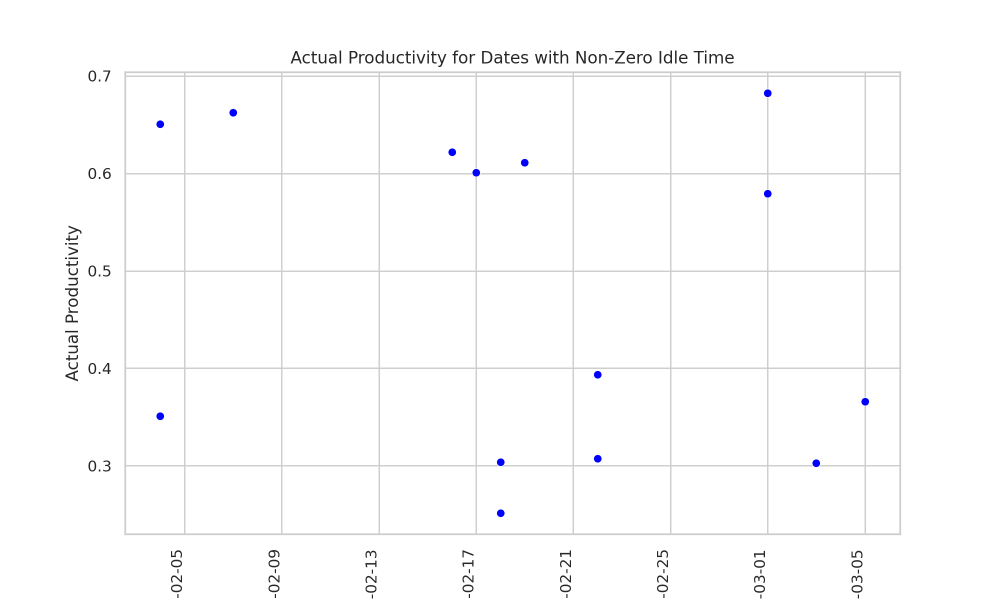

In [ ]:
# @title

filtered_df = df_train.loc[df_train['idle_time'] != 0]

selected_dates = filtered_df['date'].unique()

plt.figure(figsize=(10, 6))
sns.scatterplot(x='date', y='actual_productivity', data=filtered_df, color='blue')

plt.xticks(rotation=90, ha='right')
plt.title('Actual Productivity for Dates with Non-Zero Idle Time')
plt.xlabel('Date')
plt.ylabel('Actual Productivity')

plt.show()

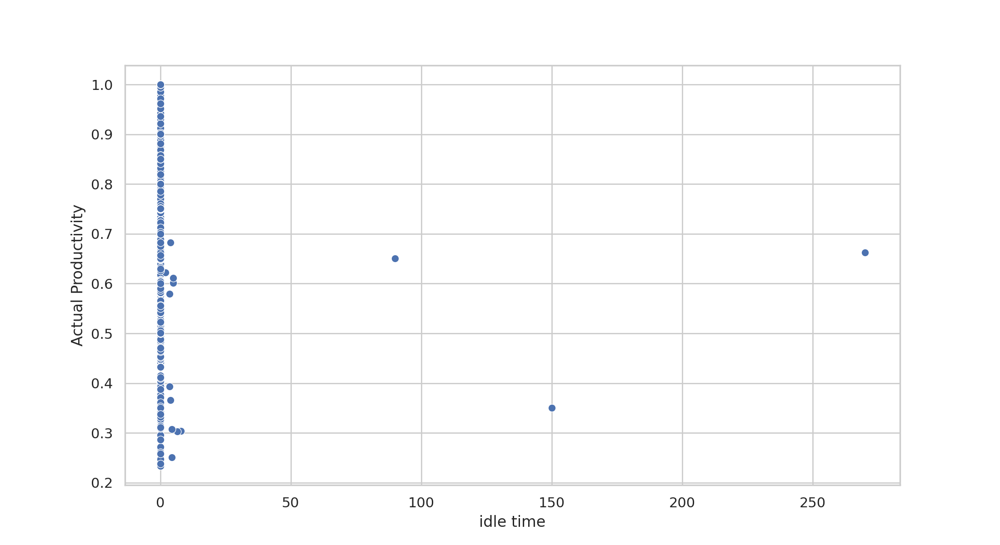

In [ ]:
sns.set(style='whitegrid')

plt.figure(figsize=(11, 6))
scatter_plot = sns.scatterplot(x='idle_time', y='actual_productivity', data=df_train)

plt.xlabel('idle time', fontsize=12)
plt.ylabel('Actual Productivity', fontsize=12)
#plt.title('Actual Productivity with idle time', fontsize=14)

plt.show()

In [ ]:
df_idle_not_zero = df_train.loc[df_train['idle_time'] != 0]

mean_actual_productivity_not_zero = df_idle_not_zero['actual_productivity'].mean()

df_idle_zero = df_train.loc[df_train['idle_time'] == 0]

mean_actual_productivity_zero = df_idle_zero['actual_productivity'].mean()

print(f"Mean Actual Productivity for Dates with Idle Time != 0: {mean_actual_productivity_not_zero}")
print(f"Mean Actual Productivity for Dates with Idle Time = 0: {mean_actual_productivity_zero}")

Mean Actual Productivity for Dates with Idle Time != 0: 0.47747849957142857
Mean Actual Productivity for Dates with Idle Time = 0: 0.7397331404623542


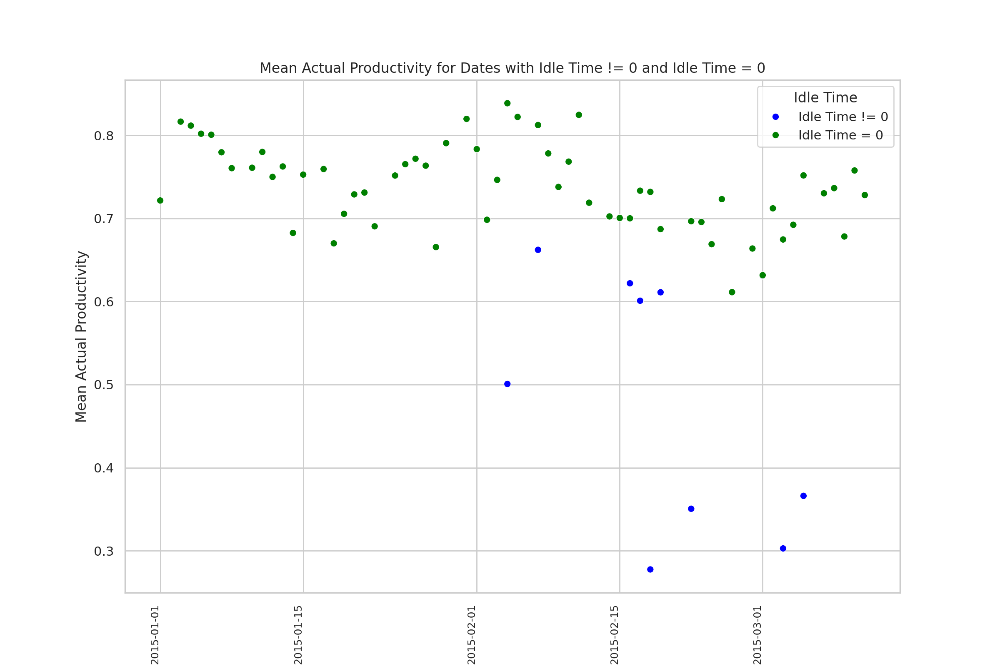

In [ ]:
# Filter the DataFrame for idle_time != 0
df_idle_not_zero = df_train.loc[df_train['idle_time'] != 0]

# Filter the DataFrame for idle_time = 0
df_idle_zero = df_train.loc[df_train['idle_time'] == 0]

# Combine the two DataFrames
combined_df = pd.concat([df_idle_not_zero.assign(Idle_Time='Idle Time != 0'), df_idle_zero.assign(Idle_Time='Idle Time = 0')])

# Calculate the mean actual_productivity for each group
mean_actual_productivity = combined_df.groupby(['Idle_Time', 'date'])['actual_productivity'].mean().reset_index()

# Plot the mean actual_productivity for both groups
plt.figure(figsize=(12, 8))

sns.scatterplot(x='date', y='actual_productivity', hue='Idle_Time', data=mean_actual_productivity, palette={'Idle Time != 0': 'blue', 'Idle Time = 0': 'green'})

plt.xticks(rotation=90, ha='right', fontsize=9)
plt.title('Mean Actual Productivity for Dates with Idle Time != 0 and Idle Time = 0')
plt.xlabel('Date')
plt.ylabel('Mean Actual Productivity')
plt.legend(title='Idle Time')

plt.show()

idle time affect for produtivity

###  Standard Minute Value (SMV) Analysis

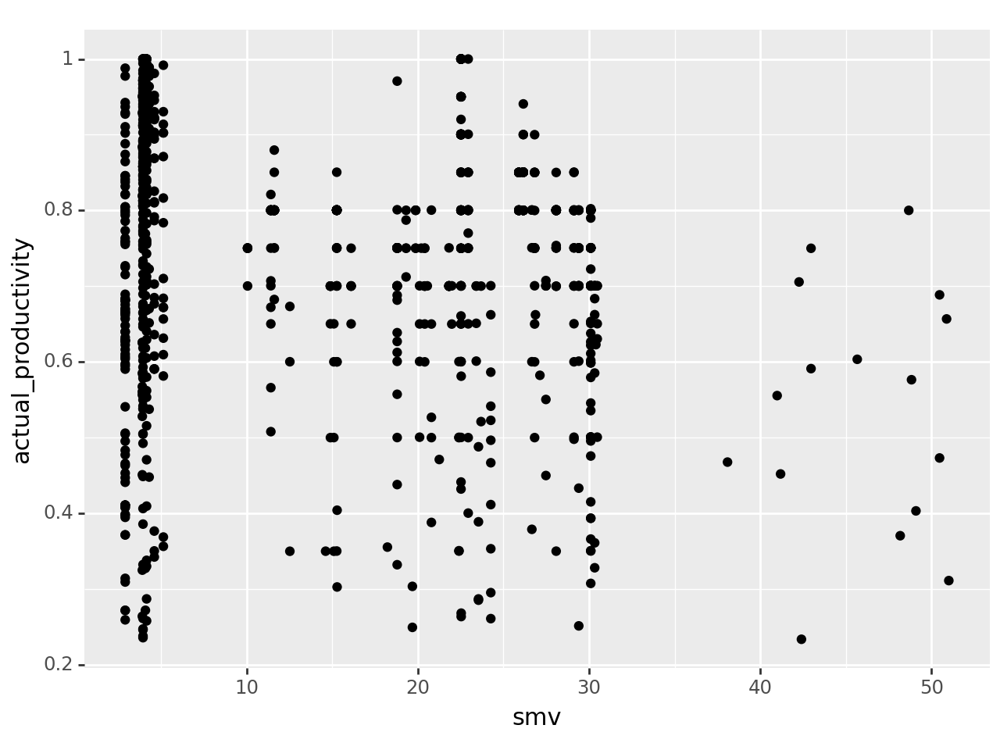

<Figure Size: (640 x 480)>

In [ ]:
(ggplot(df_train,aes(x='smv',y='actual_productivity'))
+geom_point())

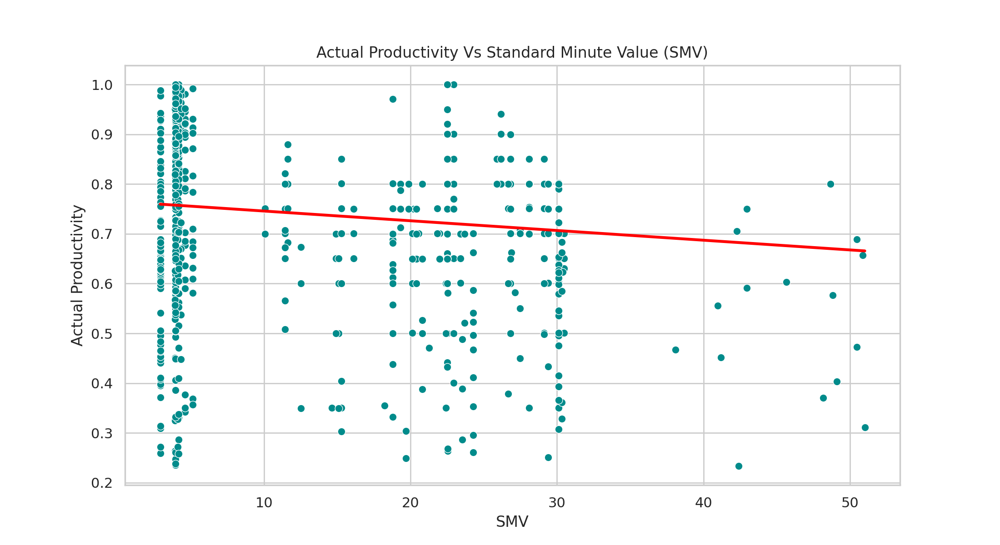

In [ ]:
sns.set(style='whitegrid')

plt.figure(figsize=(11, 6))
scatter_plot = sns.scatterplot(x='smv', y='actual_productivity', data=df_train, color='darkcyan', legend=False)
sns.regplot(x='smv', y='actual_productivity', data=df_train, scatter=False, color='red', ci=None)

plt.xlabel('SMV', fontsize=12)
plt.ylabel('Actual Productivity', fontsize=12)
plt.title('Actual Productivity Vs Standard Minute Value (SMV)')

plt.show()

Can see three clusters so individual plots

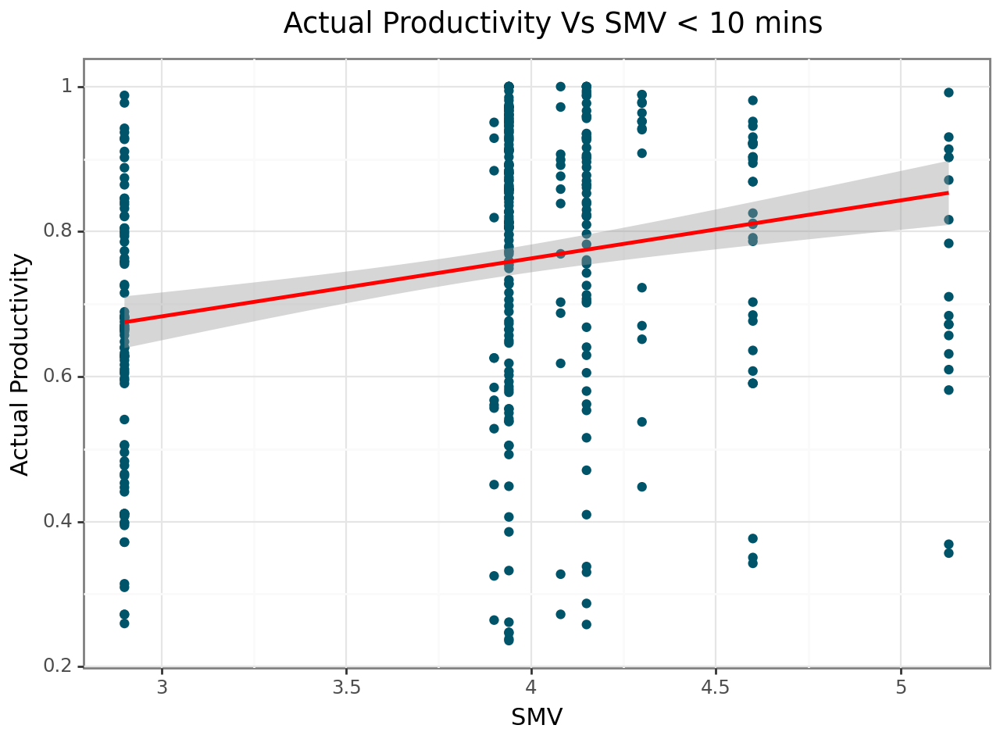

<Figure Size: (640 x 480)>

In [ ]:
#for smv<10
(ggplot(df_train.loc[(df_train.smv!=0) & (df_train.smv < 10),['smv','actual_productivity']],aes(x='smv',y='actual_productivity'))
+geom_point(color='#00546A')
+ stat_smooth(method="lm", color='red')
+ theme_bw()
+ labs( y = "Actual Productivity" ,
        x ="SMV" ,
        title = "                      Actual Productivity Vs SMV < 10 mins"))



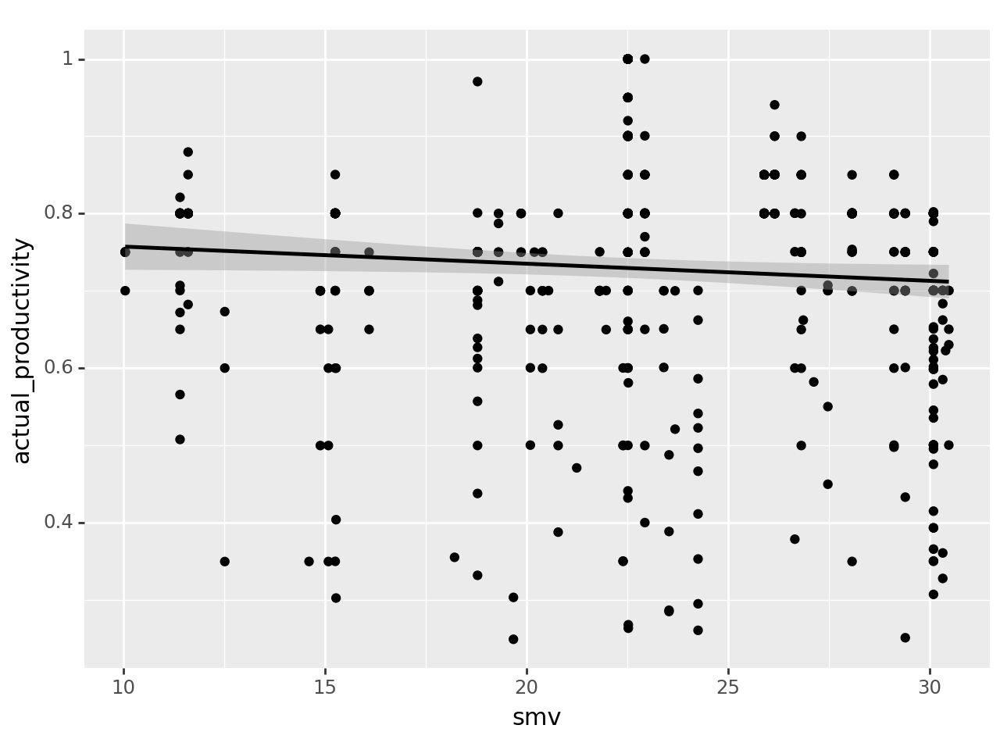

<Figure Size: (640 x 480)>

In [ ]:
#for smv between 10 and 32
(ggplot(df_train.loc[(df_train.smv!=0) & (df_train.smv > 10) & (df_train.smv < 32),['smv','actual_productivity']],aes(x='smv',y='actual_productivity'))
+geom_point()
+ stat_smooth(method="lm"))


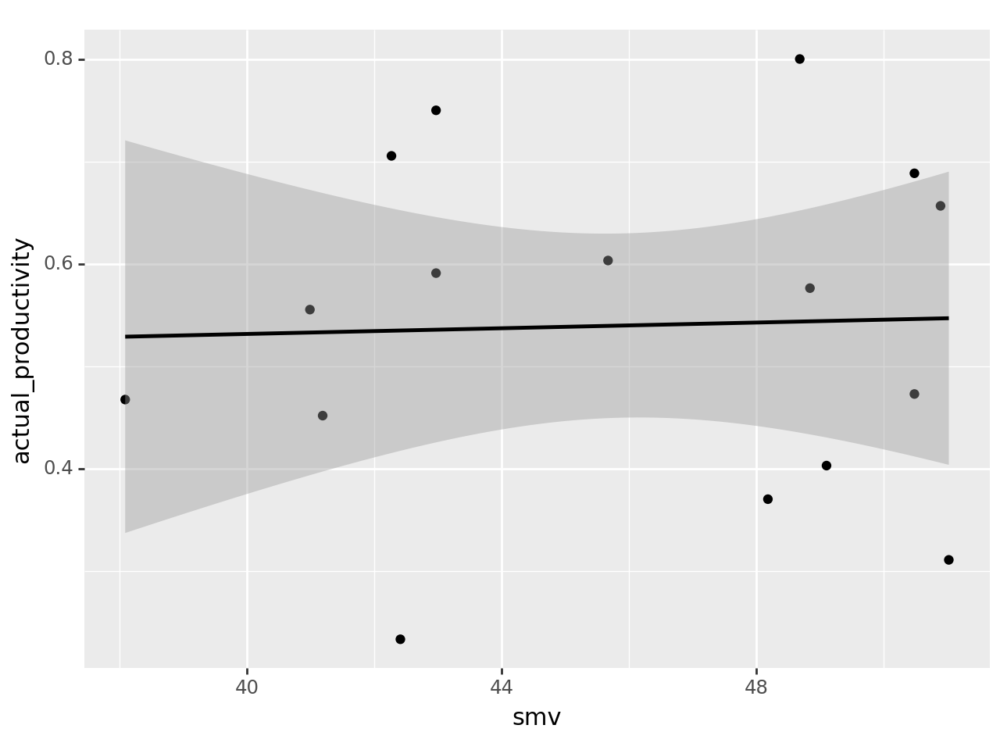

<Figure Size: (640 x 480)>

In [ ]:
#for smv greater than 32
(ggplot(df_train.loc[(df_train.smv!=0) & (df_train.smv > 32),['smv','actual_productivity']],aes(x='smv',y='actual_productivity'))
+geom_point()
+ stat_smooth(method="lm"))

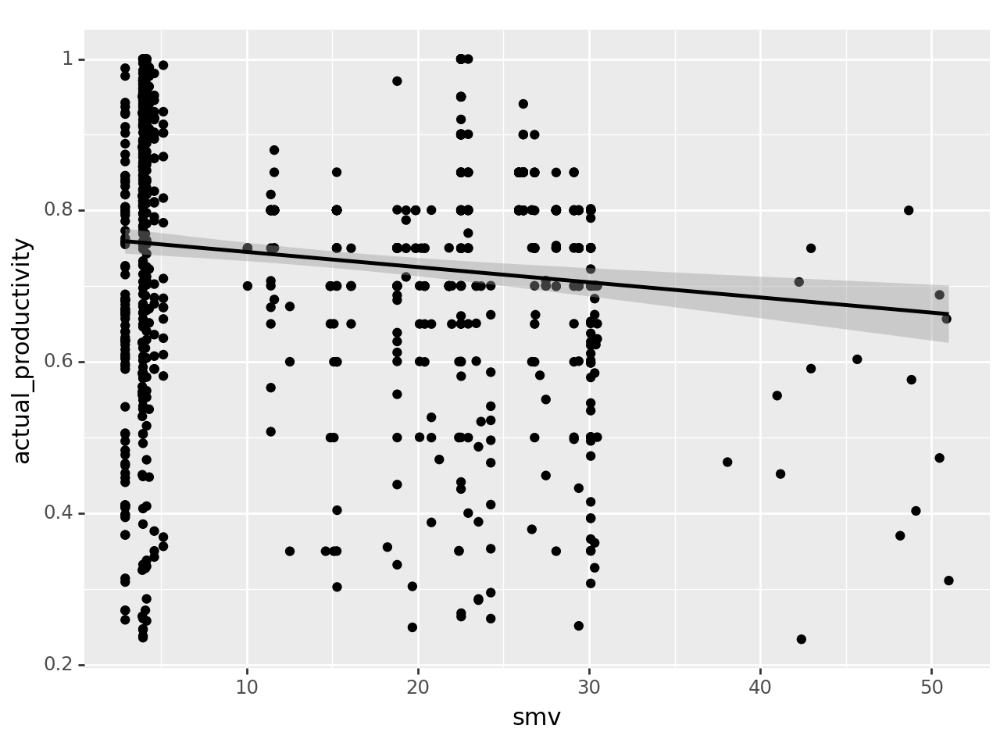

<Figure Size: (640 x 480)>

In [ ]:
# wip vs smv
(ggplot(df_train,aes(x='smv',y='wip'))
+geom_point())

#only taking  the wip values less than 5000 wip
#for smv greater than 32
(ggplot(df_train.loc[(df_train.smv!=0) & (df_train.wip < 5000),['smv','actual_productivity']],aes(x='smv',y='actual_productivity'))
+geom_point()
+ stat_smooth(method="lm"))

smv increase wip dicreases can explain?

### nO OF WORKERS SVM

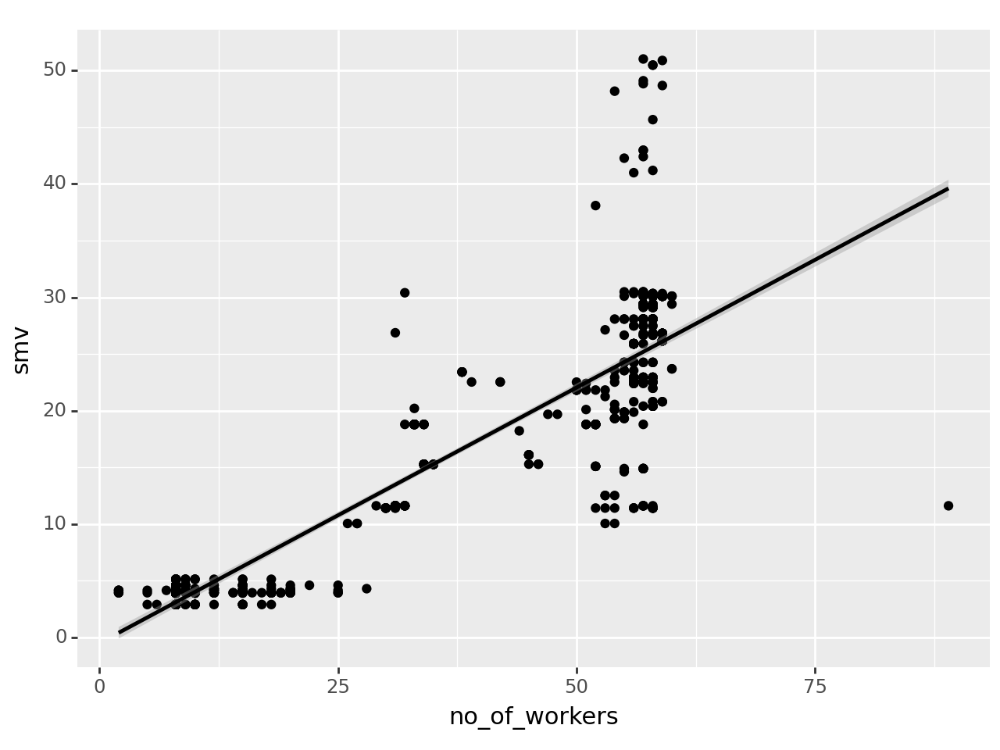

<Figure Size: (640 x 480)>

In [ ]:
(ggplot(df_train,aes(x='no_of_workers',y='smv'))
+geom_point()+ stat_smooth(method="lm"))


### No of workers vs over time

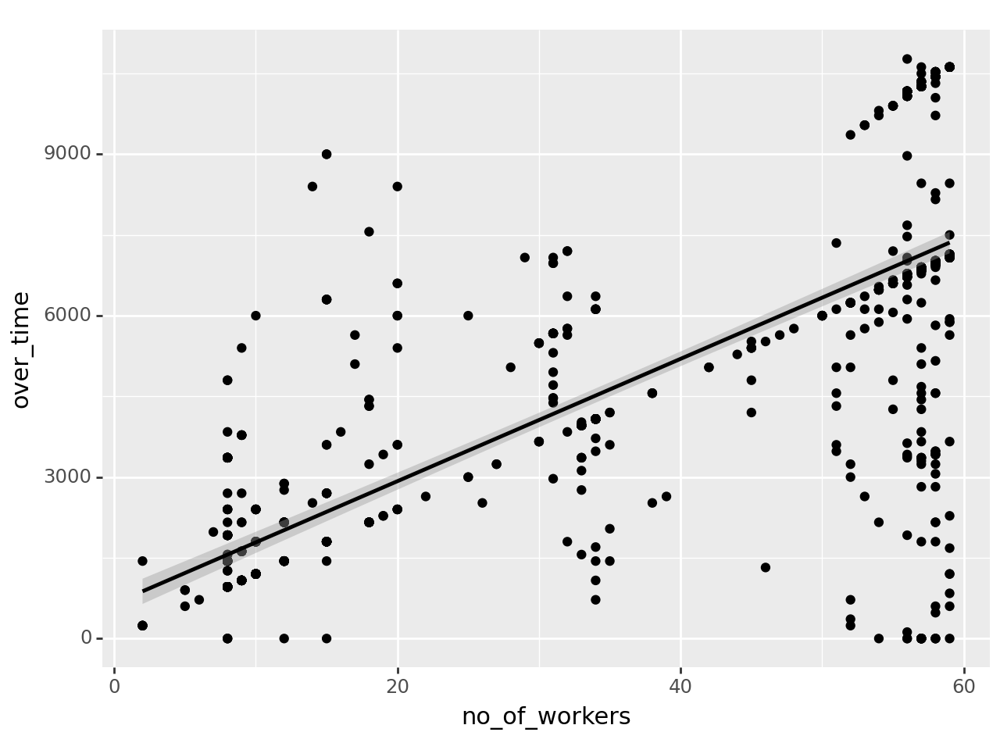

<Figure Size: (640 x 480)>

In [ ]:
(ggplot(df_train.loc[(df_train.over_time<12000) & (df_train.no_of_workers < 60),['over_time','no_of_workers']],aes(x='no_of_workers',y='over_time'))
+geom_point()
+ stat_smooth(method="lm"))


No of workers increases overtime incereses, but actual productivity increaes?

### PCA

In [ ]:
#For the PCA we only consider the quantitative variables
df_quants=df_train.loc[:,quants]

In [ ]:
#Normalized Dataset
df_quants_norm=(df_quants - df_quants.mean())/(df_quants.std())

In [ ]:
df_quants_norm.describe()

,targeted_productivity,smv,wip,over_time,incentive,idle_time,idle_men,no_of_style_change,no_of_workers,actual_productivity
count,9.570000e+02,9.570000e+02,9.570000e+02,9.570000e+02,957.000000,9.570000e+02,9.570000e+02,9.570000e+02,9.570000e+02,9.570000e+02
mean,-6.682220e-17,-5.197282e-17,-1.484938e-17,1.002333e-16,0.000000,-2.227407e-17,-3.712344e-17,1.113703e-17,-1.336444e-16,-2.710011e-16
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
min,-6.652725e+00,-1.112455e+00,-4.446983e-01,-1.369361e+00,-0.227164,-5.630818e-02,-1.120224e-01,-3.345664e-01,-1.471493e+00,-2.890833e+00
25%,-3.070181e-01,-1.017208e+00,-4.446983e-01,-9.439321e-01,-0.227164,-5.630818e-02,-1.120224e-01,-3.345664e-01,-1.154429e+00,-4.921127e-01
50%,1.966094e-01,1.951968e-02,-4.760422e-02,-1.639784e-01,-0.083035,-5.630818e-02,-1.120224e-01,-3.345664e-01,-2.205583e-02,2.679698e-01
75%,7.002370e-01,7.778329e-01,2.453237e-01,6.868803e-01,0.086159,-5.630818e-02,-1.120224e-01,-3.345664e-01,1.019727e+00,6.589135e-01
max,7.002370e-01,3.294554e+00,1.415246e+01,6.288367e+00,22.332065,2.590171e+01,1.387129e+01,4.408842e+00,2.469165e+00,1.520295e+00


In [ ]:
#pca step
from sklearn.decomposition import PCA
pca=PCA()
main_pca=pca.fit_transform(df_quants_norm)

In [ ]:
# Variance explained by each principal component
explained_variance_ratio = pca.explained_variance_ratio_

# Cumulative variance explained
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)
cumulative_variance_ratio
cvr_df=pd.DataFrame({"Principal Component":range(1,len(cumulative_variance_ratio)+1),"Proportion of Variation Explained":cumulative_variance_ratio})
print(cvr_df)

   Principal Component  Proportion of Variation Explained
0                    1                           0.288019
1                    2                           0.456444
2                    3                           0.587801
3                    4                           0.686628
4                    5                           0.778896
5                    6                           0.859518
6                    7                           0.921105
7                    8                           0.964314
8                    9                           0.992242
9                   10                           1.000000


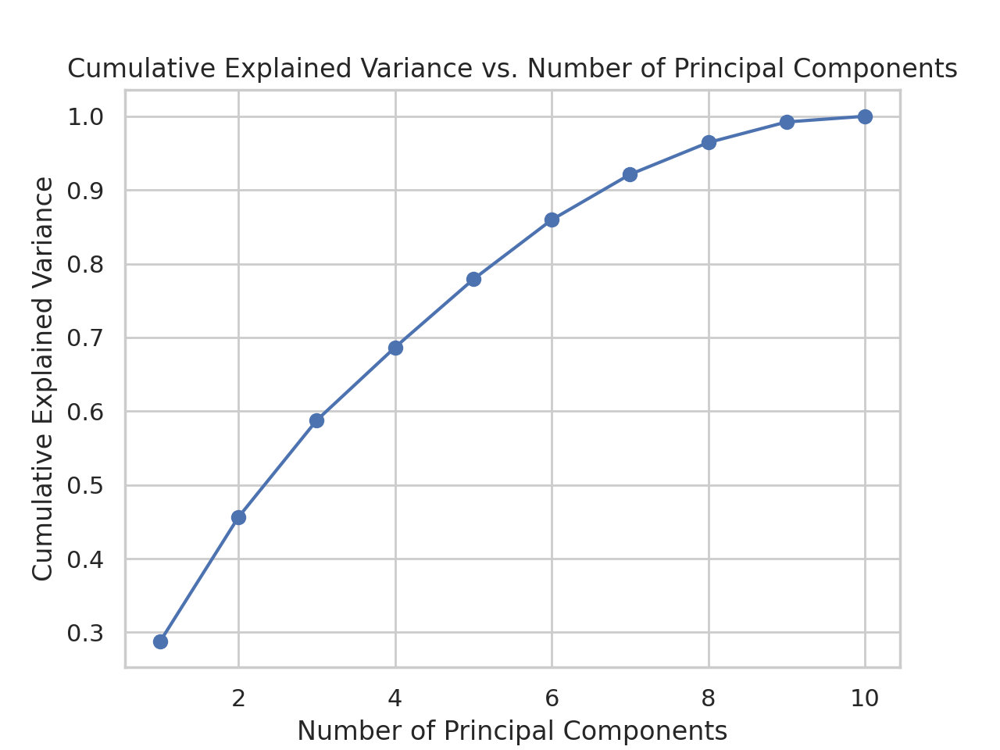

In [ ]:
# Plotting the explained variance
plt.plot(range(1, len(explained_variance_ratio) + 1), cumulative_variance_ratio, marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance vs. Number of Principal Components')
plt.show()

### PLS

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.cross_decomposition import PLSRegression
df_wo_cat=df_train[quants]
df_wo_cat.shape
x_val = StandardScaler().fit_transform(df_wo_cat.values)
x_vals=x_val[:,0:9]
y=np.array(x_val[:,9])
plsr = PLSRegression(n_components=2, scale=False)
plsr.fit(x_vals, y)
scores = pd.DataFrame(plsr.x_scores_,columns = ['PC1', 'PC2'])
scores.index = df_train.index
x_loadings = plsr.x_loadings_
y_loadings = plsr.y_loadings_
x_vals.shape


(957, 9)

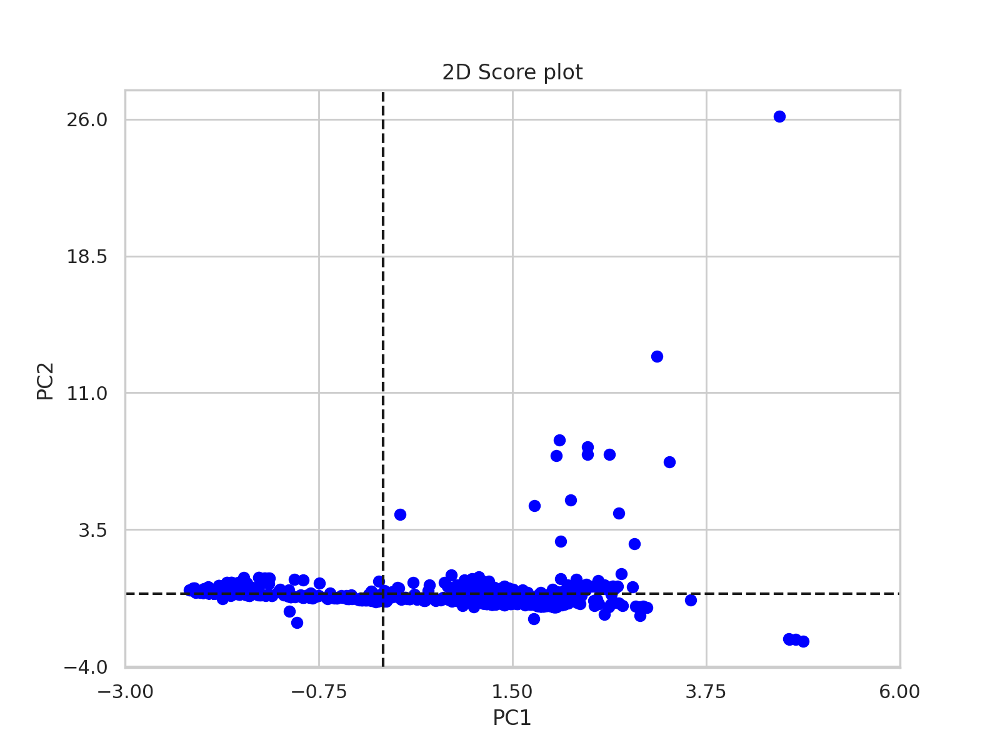

In [ ]:
import plotly.express as px
pca = PCA(n_components=2)
components = pca.fit_transform(x_vals)
com=components[components[:,1]<6]

#score plot to identify clusters
fig, ax = plt.subplots(figsize=(8, 6))
ax.scatter(components[:,0] ,components[:,1], marker='o', color='blue')

scores11=pd.DataFrame({'PC1': com[:,0], 'PC2': com[:,1]})
scores12=pd.DataFrame({'PC1': components[:,0], 'PC2': components[:,1]})
# Define the axes
xticks = np.linspace(-3, 6, num=5)
yticks = np.linspace(-4,26, num=5)
plt.xticks(xticks)
plt.yticks(yticks)
plt.xlabel('PC1')
plt.ylabel('PC2')
ax.axhline(y=0, color='k',linestyle='--')
ax.axvline(x=0, color='k',linestyle='--')

# Show plot
plt.title('2D Score plot')
plt.show()

In [ ]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=2)
kmeans.fit(scores11)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


KMeans(n_clusters=2)

In [ ]:
identified_clusters = kmeans.fit_predict(scores11)
identified_clusters

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


array([1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0,
       0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0,
       0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0,
       1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1,
       0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0,
       1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0,
       0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1,
       1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1,
       1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0,
       1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1,
       1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0,

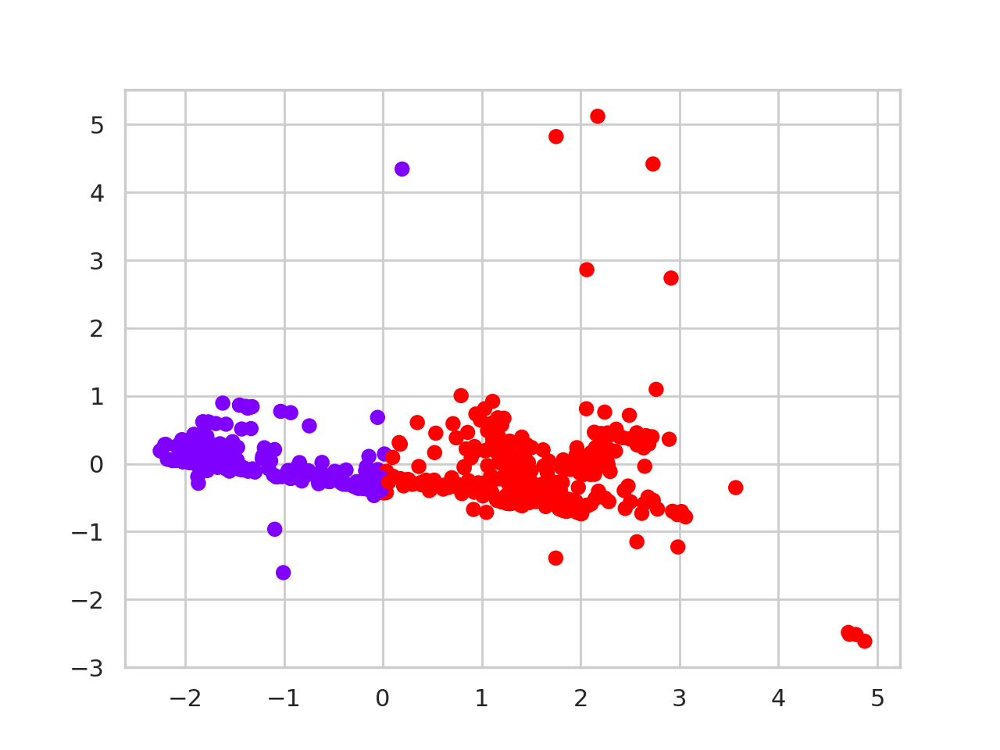

In [ ]:
data_with_clusters = scores11.copy()
data_with_clusters['Clusters'] = identified_clusters
plt.scatter(data_with_clusters['PC1'],data_with_clusters['PC2'],c=data_with_clusters['Clusters'],cmap='rainbow')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10

Text(0, 0.5, 'WCSS')

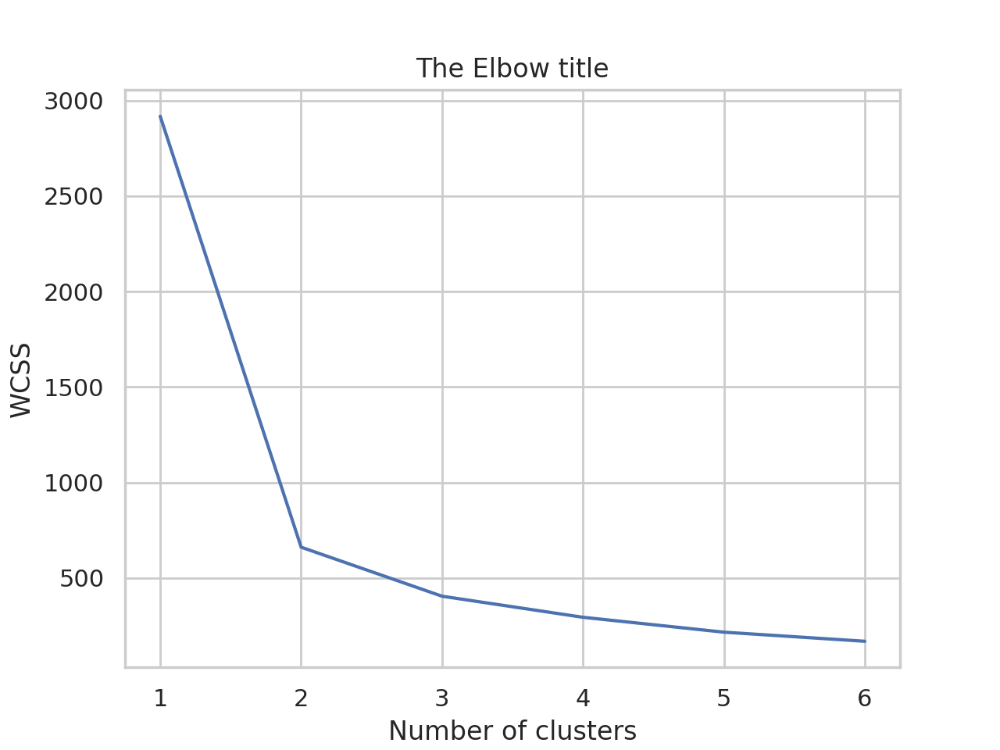

In [ ]:
#using elbow method to identify clusters
wcss=[]
for i in range(1,7):
  kmeans = KMeans(n_clusters=i)
  kmeans.fit(scores11)
  wcss_iter = kmeans.inertia_
  wcss.append(wcss_iter)

number_clusters = range(1,7)
plt.plot(number_clusters,wcss)
plt.title('The Elbow title')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

Estimated number of clusters: 1
Estimated number of noise points: 26


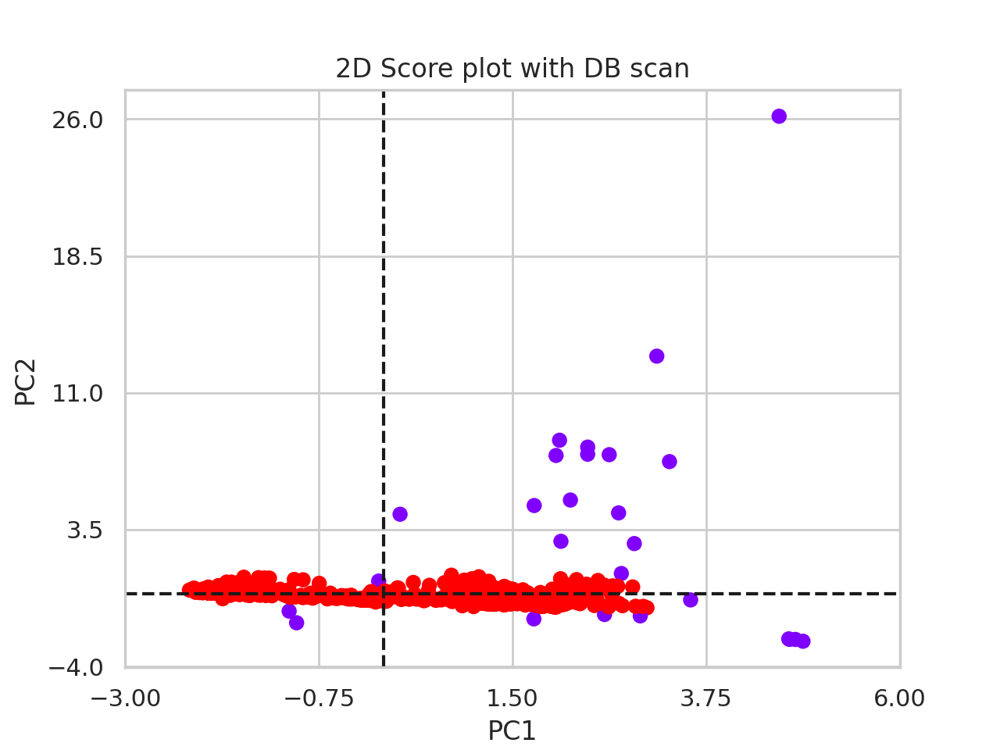

In [ ]:
#DB scan
from sklearn.cluster import DBSCAN


# Create a DBSCAN instance
epsilon = 0.4# Epsilon radius
min_samples = 5  # Minimum number of points to form a core point
dbscan = DBSCAN(eps=epsilon, min_samples=min_samples)

# Fit the DBSCAN model to the data
labels = dbscan.fit_predict(scores12)

# Number of clusters in labels, ignoring noise points (-1)
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
n_noise = list(labels).count(-1)

print(f'Estimated number of clusters: {n_clusters}')
print(f'Estimated number of noise points: {n_noise}')

# Visualize the clusters
data_with_clusters1 = scores12.copy()
data_with_clusters1['Clusters'] = labels
plt.scatter(data_with_clusters1['PC1'],data_with_clusters1['PC2'],c=data_with_clusters1['Clusters'],cmap='rainbow')
xticks = np.linspace(-3, 6, num=5)
yticks = np.linspace(-4,26, num=5)
plt.xticks(xticks)
plt.yticks(yticks)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.axhline(y=0, color='k',linestyle='--')
plt.axvline(x=0, color='k',linestyle='--')
# Show plot
plt.title('2D Score plot with DB scan')
plt.show()

In [ ]:
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(scores12[['PC1','PC2']])
distances, indices = nbrs.kneighbors(scores12[['PC1','PC2']])

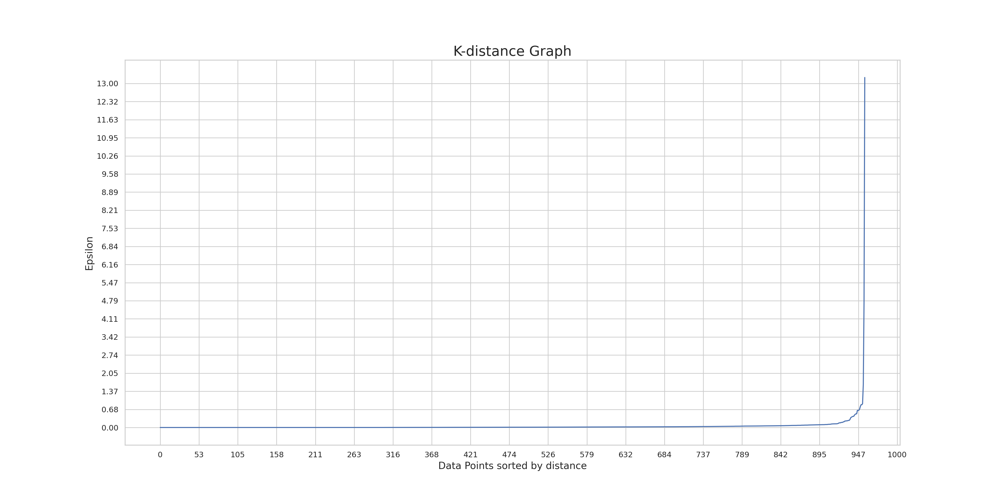

In [ ]:
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.figure(figsize=(20,10))
plt.plot(distances)
plt.title('K-distance Graph',fontsize=20)
plt.xlabel('Data Points sorted by distance',fontsize=14)
plt.ylabel('Epsilon',fontsize=14)
xticks = np.linspace(0,1000, num=20)
yticks = np.linspace(0,13, num=20)
plt.xticks(xticks)
plt.yticks(yticks)
# Show plot
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_predict

# Cross-validation
y_cv = cross_val_predict(plsr,x_vals, y, cv=10)

# Calculate scores
score = r2_score(y, y_cv)
mse = mean_squared_error(y, y_cv)
mse

0.8070676133998881

In [ ]:
#data frame with loadings
dfx=pd.DataFrame(x_loadings,columns = ['PC1', 'PC2'])
dfy=pd.DataFrame(y_loadings,columns = ['PC1', 'PC2'])

loadings = pd.concat([dfx,dfy])
loadings
df2 = loadings.assign(attributes=quants)
df2.attributes

0    targeted_productivity
1                      smv
2                      wip
3                over_time
4                incentive
5                idle_time
6                 idle_men
7       no_of_style_change
8            no_of_workers
0      actual_productivity
Name: attributes, dtype: object

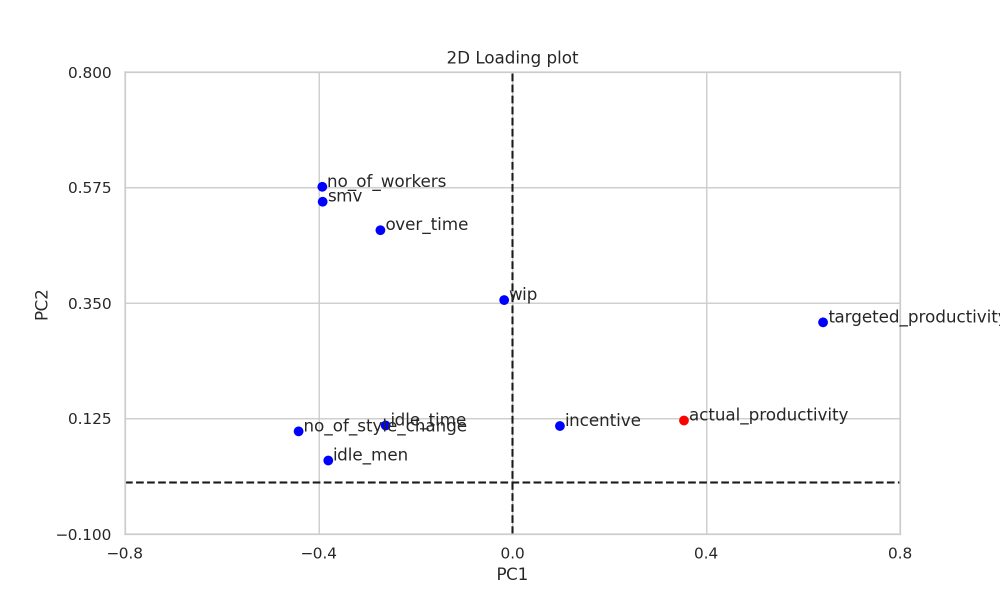

In [ ]:
fig, ax = plt.subplots(figsize=(10, 6))
colors = ['blue', 'blue', 'blue', 'blue', 'blue', 'blue', 'blue', 'blue', 'blue','red']
ax.scatter(df2.PC1, df2.PC2, marker='o', color=colors)


for i, txt in enumerate(df2.attributes):
   ax.annotate(txt, (df2.PC1.iat[i]+0.01, df2.PC2.iat[i]))

# Define the axes
xticks = np.linspace(-0.8, 0.8, num=5)
yticks = np.linspace(-0.1, 0.8, num=5)
plt.xticks(xticks)
plt.yticks(yticks)
plt.xlabel('PC1')
plt.ylabel('PC2')
ax.axhline(y=0, color='k',linestyle='--')
ax.axvline(x=0, color='k',linestyle='--')


# Show plot
plt.title('2D Loading plot')
plt.show()

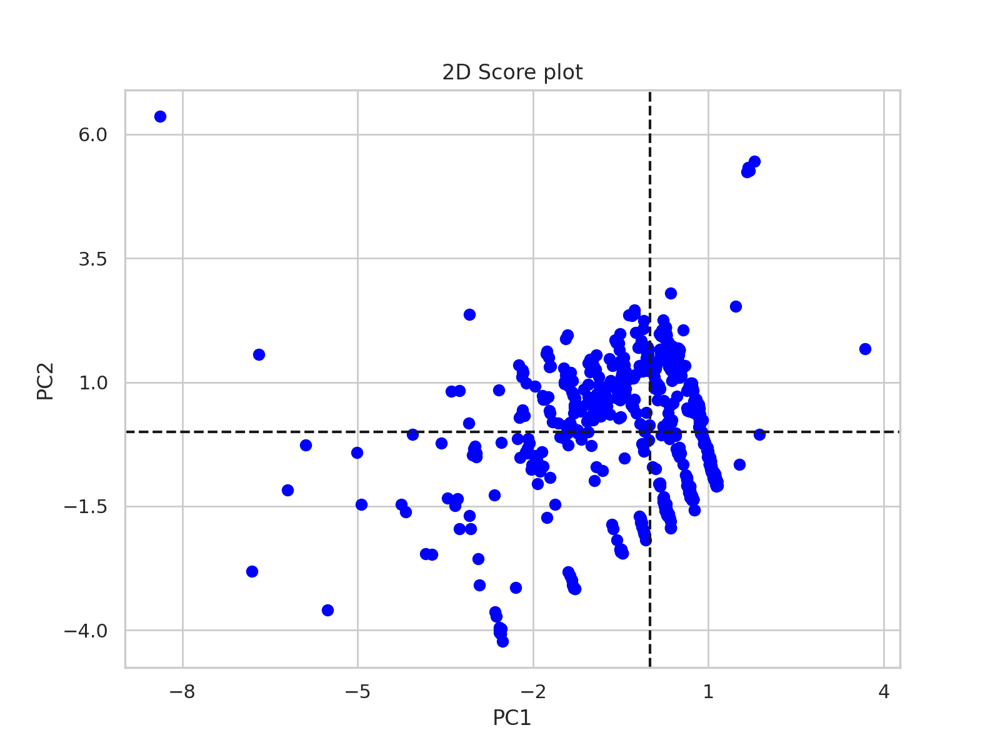

In [ ]:
#score plot to identify clusters
fig, ax = plt.subplots(figsize=(8, 6))
ax.scatter(scores.PC1, scores.PC2, marker='o', color='blue')

# Define the axes
xticks = np.linspace(-8, 4, num=5)
yticks = np.linspace(-4,6, num=5)
plt.xticks(xticks)
plt.yticks(yticks)
plt.xlabel('PC1')
plt.ylabel('PC2')
ax.axhline(y=0, color='k',linestyle='--')
ax.axvline(x=0, color='k',linestyle='--')

# Show plot
plt.title('2D Score plot')
plt.show()

### Correlation between each variables


<Axes: >

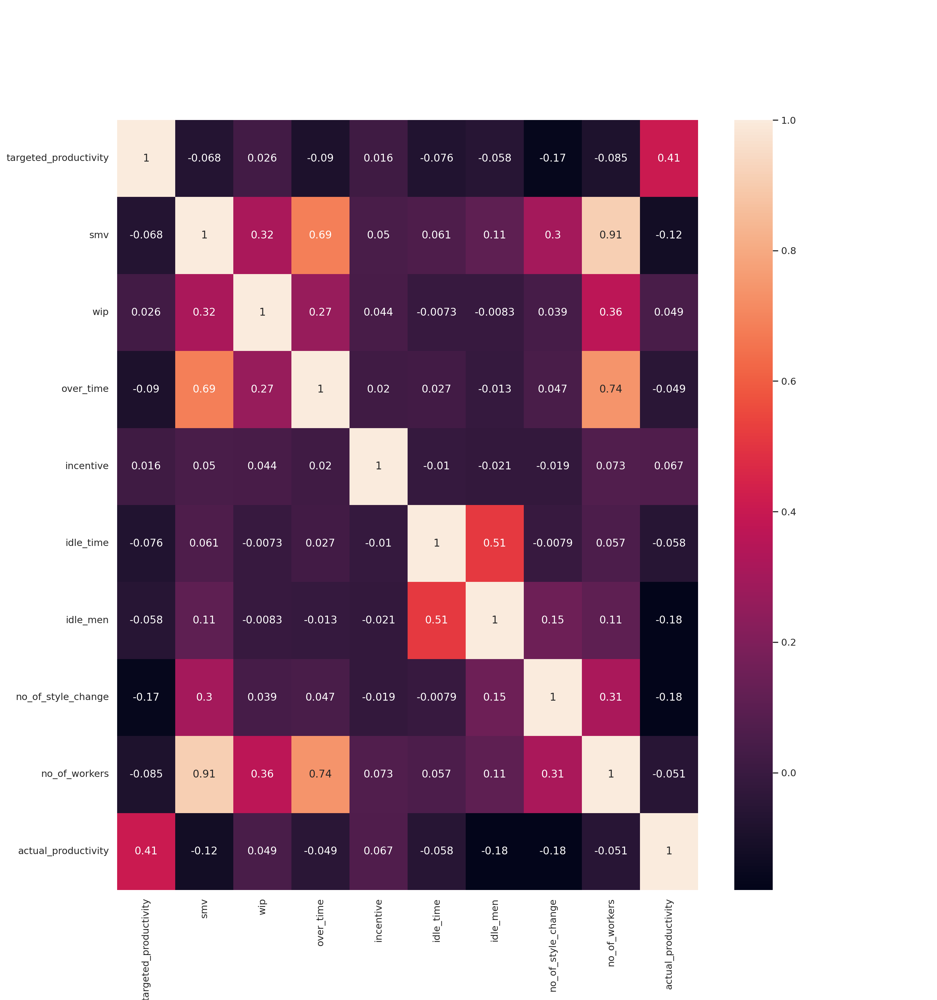

In [ ]:
corr = df_wo_cat.corr()
f, ax = plt.subplots(figsize=(15, 16))
sns.heatmap(corr, annot=True)

# Model Fitting

## MLR

In [ ]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score,mean_absolute_percentage_error
from statsmodels.stats.diagnostic import het_goldfeldquandt, het_white
from statsmodels.stats.stattools import durbin_watson
from scipy.stats import shapiro
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [ ]:
#separating features and target for use in modelling
columns_to_drop = ['actual_productivity', 'date_num', 'date']
X = df.drop(columns=columns_to_drop, axis=1)

y = df['actual_productivity']

In [ ]:
# Splitting dataset to train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .2, random_state=0)

In [ ]:
#creating train dataset
df_train=pd.concat([X_train, y_train], axis=1)

In [ ]:
#---------------------------------MLR---------------------------------------------------------

In [ ]:
'''Assumption of Regression Model :

Linearity: The relationship between dependent and independent variables should be linear.
Homoscedasticity: Constant variance of the errors should be maintained.
Multivariate normality: Multiple Regression assumes that the residuals are normally distributed.
Lack of Multicollinearity: It is assumed that there is little or no multicollinearity in the data.'''

'Assumption of Regression Model :\n\nLinearity: The relationship between dependent and independent variables should be linear.\nHomoscedasticity: Constant variance of the errors should be maintained.\nMultivariate normality: Multiple Regression assumes that the residuals are normally distributed.\nLack of Multicollinearity: It is assumed that there is little or no multicollinearity in the data.'

In [ ]:
# Create dummy variables for 'department','quarter' and 'day'
X_train_dummies = pd.get_dummies(X_train, columns=['department', 'day','quarter','team'])
X_test_dummies = pd.get_dummies(X_test, columns=['department', 'day','quarter','team'])



In [ ]:
# Step 1: Initialize and fit the multiple linear regression model
model = LinearRegression()
results=model.fit(X_train_dummies, y_train)

print('Intercept:', model.intercept_)
print('Coefficients:')
for feature, coefficient in zip(X_train_dummies.columns, model.coef_):
    print(f'{feature}: {coefficient}')

Intercept: 0.2252795244797252
Coefficients:
targeted_productivity: 0.6459590436550708
smv: -0.007430067741000304
wip: 3.7922115860962646e-06
over_time: -4.013621259735405e-06
incentive: 4.62312115969935e-05
idle_time: 0.0008811610418634674
idle_men: -0.008328269716230904
no_of_style_change: -0.036402444754492336
no_of_workers: 0.005104646149018878
department_finishing: 0.030882008348636365
department_sewing: -0.030882008348635935
day_Monday: -0.010693272274448152
day_Saturday: 0.018169348065043178
day_Sunday: -0.00717935879293613
day_Thursday: -0.0033139515561316003
day_Tuesday: 0.0072531718410532514
day_Wednesday: -0.004235937282583407
quarter_1: 0.0030645882306426005
quarter_2: 0.007336062393470871
quarter_3: -0.008642980870851663
quarter_4: -0.0017576697532555806
team_1: 0.05765263670278798
team_2: 0.025149804852640033
team_3: 0.06945153692793372
team_4: 0.04020593907800675
team_5: 0.010301985919193263
team_6: -0.03452237494466695
team_7: -0.04967807268196908
team_8: -0.026110694278

In [ ]:
# Step 2: Predict the target variable
#Train set
y_pred_train = results.predict(X_train_dummies)

#Test set
y_pred_test = results.predict(X_test_dummies)

# Apply a post-processing step to ensure predictions stay within [0, 1]
##############Check#############
# y_pred__train_constrained = np.clip(y_pred_train, 0, 1)
# y_pred_constrained = np.clip(y_pred_test, 0, 1)


In [ ]:
# Step 3: Evaluate the model performance
#Training MSE
Train_mse = mean_squared_error(y_train, y_pred_train)
Train_r2 = r2_score(y_train, y_pred_train)
print(f"Training Mean Squared Error: {Train_mse}")
print(f"Training R-squared: {Train_r2}")
# Calculate MAPE
mape_train = np.mean(np.abs((y_train - y_pred_train) / y_train)) * 100

print(f"MAPE: {mape_train:.2f}%")

#Test MSE
Test_mse = mean_squared_error(y_test, y_pred_test)
test_r2 = r2_score(y_test, y_pred_test)
print(f"Test Mean Squared Error: {Test_mse}")
print(f"Test R-squared: {test_r2}")
# Calculate MAPE
mape_test = np.mean(np.abs((y_test - y_pred_test) / y_test)) * 100

print(f"MAPE: {mape_test:.2f}%")

Training Mean Squared Error: 0.02087556278755632
Training R-squared: 0.307531432539764
MAPE: 18.38%
Test Mean Squared Error: 0.02029518184666784
Test R-squared: 0.3132441946797109
MAPE: 18.53%


In [ ]:
# Step 4: Residual analysis and assumption checking

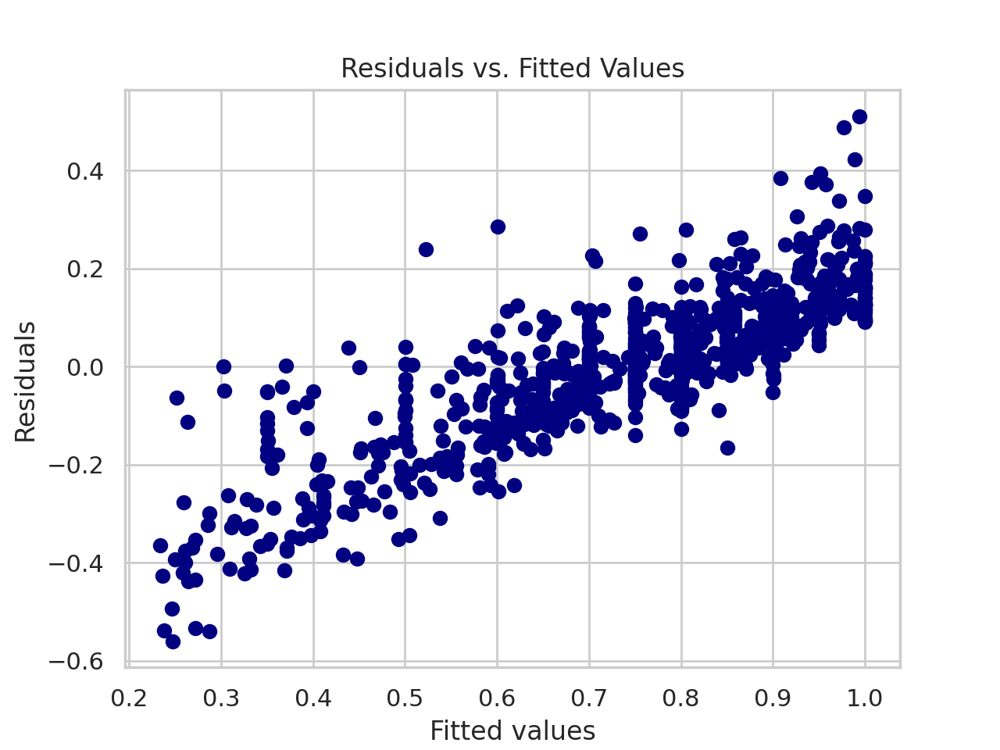

In [ ]:
# 4.1 Residuals vs. Fitted Values Plot
residuals_train =y_train - y_pred_train
plt.scatter(y_train, residuals_train,color='navy')
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.title('Residuals vs. Fitted Values')
plt.grid(True)
plt.show()

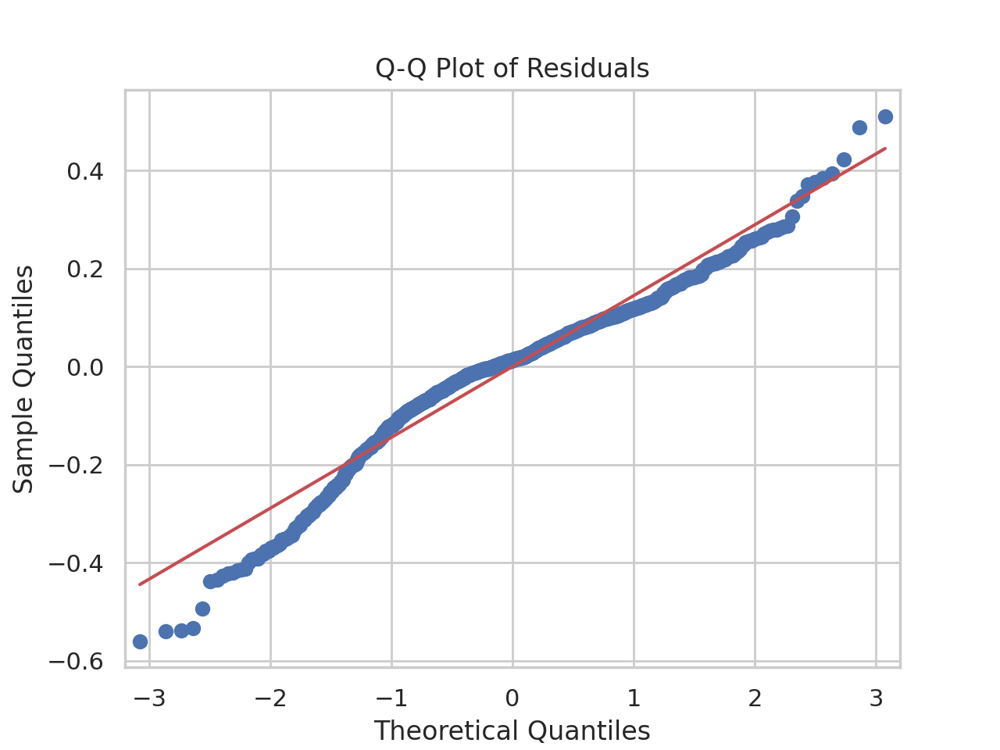

In [ ]:
# 4.2 Q-Q Plot of Residuals
sm.qqplot(residuals_train, line='s')
plt.title('Q-Q Plot of Residuals')
plt.grid(True)
plt.show()

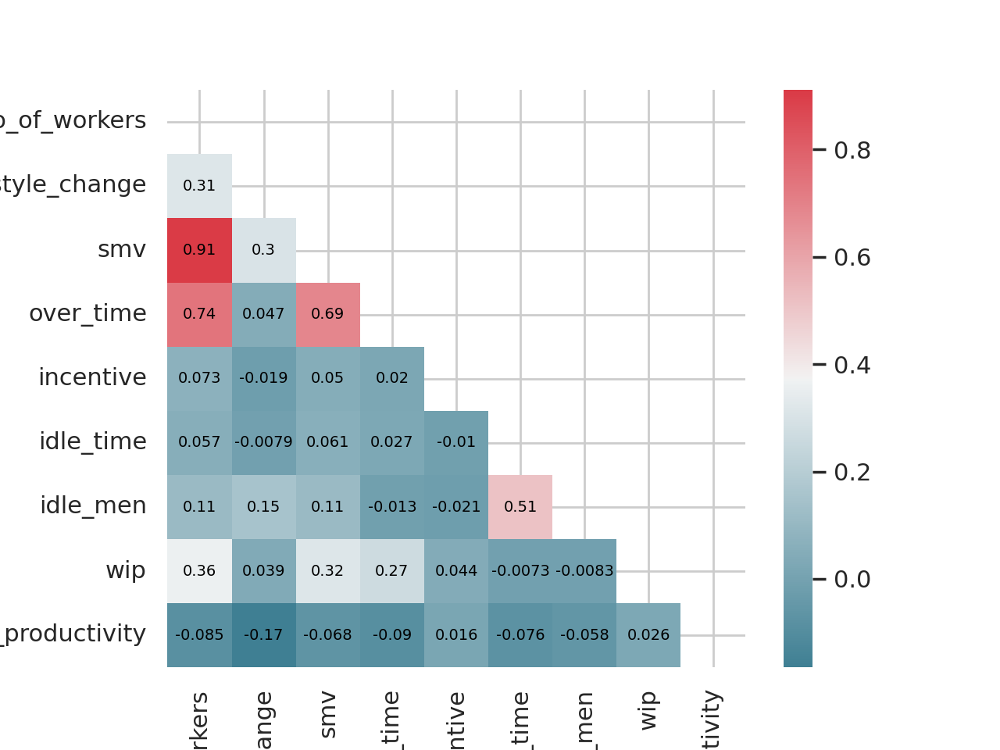

In [ ]:
# Inspect correlation
# Calculate correlation using the default method ( "pearson")
q = [  'no_of_workers', 'no_of_style_change', 'smv', 'over_time', 'incentive', 'idle_time', 'idle_men', 'wip','targeted_productivity']
df_wo_cat = X_train_dummies[q]

corr = df_wo_cat.corr()
# optimize aesthetics: generate mask for removing duplicate / unnecessary info
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
# Generate a custom diverging colormap as indicator for correlations:
cmap = sns.diverging_palette(220, 10, as_cmap=True)
# Plot
sns.heatmap(corr, mask=mask, cmap=cmap, annot=True,  square=True, annot_kws={"size": 7, "color": "black"});

<Axes: >

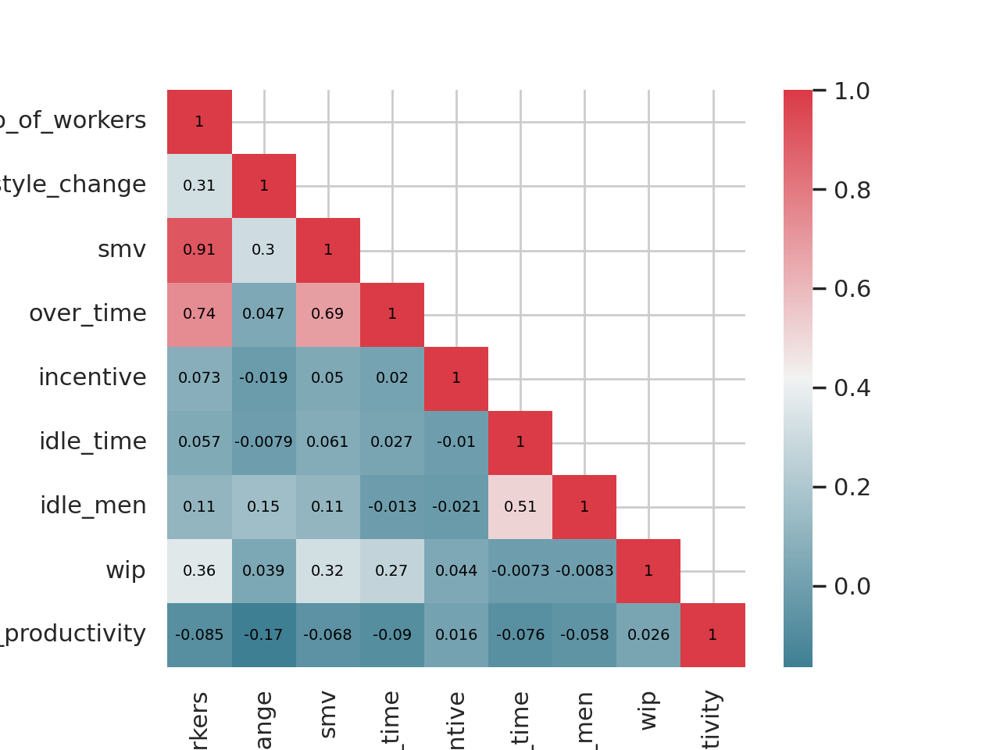

In [ ]:
# Selecting Columns
q = ['no_of_workers', 'no_of_style_change', 'smv', 'over_time', 'incentive', 'idle_time', 'idle_men', 'wip', 'targeted_productivity']
df_wo_cat = X_train_dummies[q]

# Calculating Correlation Matrix
corr = df_wo_cat.corr()

# Create a mask to remove values in the upper triangular part (excluding diagonal)
mask = np.triu(np.ones_like(corr, dtype=bool), k=1)

# Generate a custom diverging colormap as an indicator for correlations
cmap = sns.diverging_palette(220, 10, as_cmap=True)


# Plot the heatmap
sns.heatmap(corr, mask=mask, cmap=cmap, annot=True, square=True, annot_kws={"size": 7, "color": "black"})

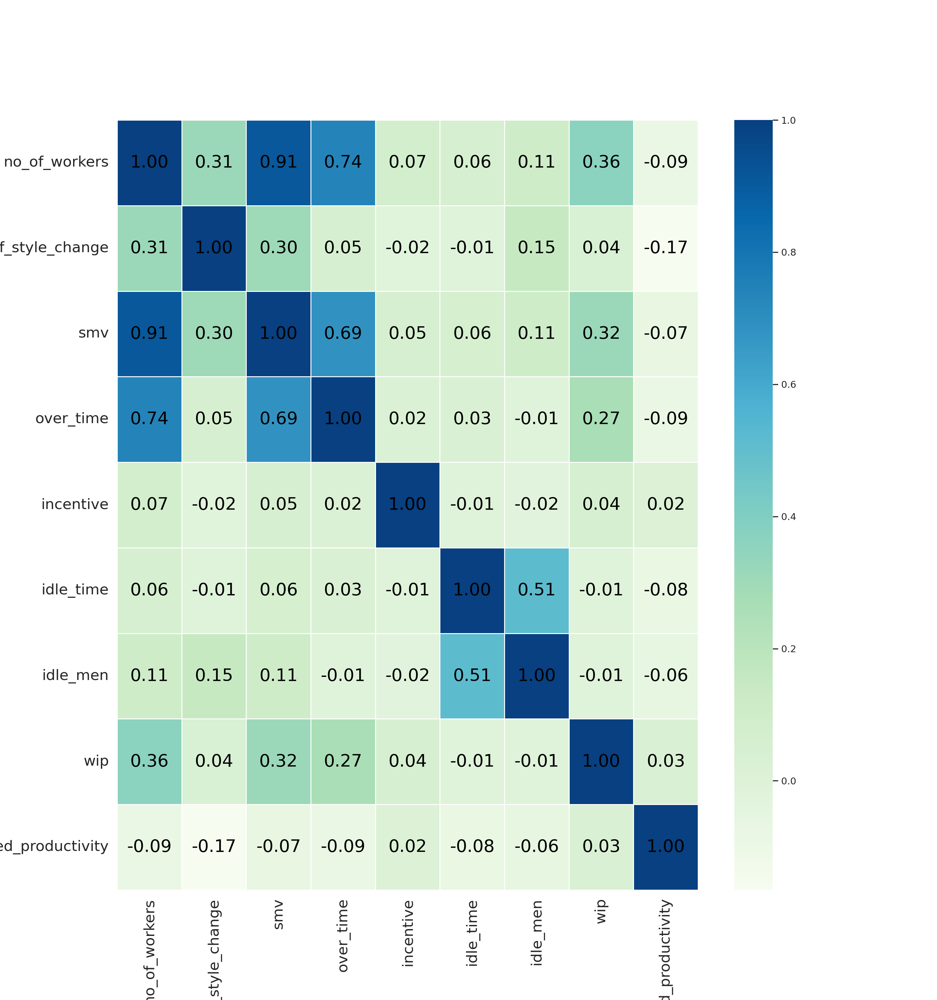

In [ ]:
# 4.3 Correlation plot of quantitative variables
q = [  'no_of_workers', 'no_of_style_change', 'smv', 'over_time', 'incentive', 'idle_time', 'idle_men', 'wip','targeted_productivity']
df_wo_cat = X_train_dummies[q]

corr = df_wo_cat.corr()

# Set the size of the plot
f, ax = plt.subplots(figsize=(15, 16))

# Remove 'smv', 'wip' from y-axis labels
heatmap = sns.heatmap(corr, annot=True, cmap='GnBu', fmt=".2f", linewidths=.5, ax=ax, annot_kws={"size": 20, "color": "black"})

# Rotate y-axis labels
plt.yticks(rotation=0, fontsize=17)
plt.xticks(fontsize=17)

plt.show()

In [ ]:
# 4.4 Statistical tests for assumptions
# 4.4.1 Homoscedasticity (Breusch-Pagan Lagrange Multiplier test)
'''Note that this test may exaggerate the significance of results in small or moderately large samples. In this case the F-statistic is preferable.
If one of the test statistics is significant (i.e., p <= 0.05), then you have indication of heteroscedasticity.'''

from statsmodels.compat import lzip
import statsmodels.api as sm
from statsmodels.formula.api import ols
# fit multi linear regression model
ols_model = ols('actual_productivity ~ smv+targeted_productivity + wip+no_of_workers+no_of_style_change+quarter+team+day+department+over_time+incentive+idle_time+idle_men ', data=df_train).fit()
name = ['Lagrange multiplier statistic', 'p-value', 'f-value', 'f p-value']
test = sm.stats.het_breuschpagan(ols_model.resid, ols_model.model.exog)
lzip(name, test)

[('Lagrange multiplier statistic', 158.80948390373507),
 ('p-value', 4.320161973967895e-24),
 ('f-value', 9.811962077580601),
 ('f p-value', 1.4187812046971294e-26)]

In [ ]:
# 4.4.2 Autocorrelation-correlation between the error terms  (Durbin-Watson test)
'''The test statistic ranges between 0 and 4, where:
A value around 2 indicates no autocorrelation (residuals are independent).
A value significantly less than 2 suggests positive autocorrelation (residuals are positively correlated).
A value significantly greater than 2 suggests negative autocorrelation (residuals are negatively correlated).'''

dw_stat = durbin_watson(residuals_train)
print(f'Durbin-Watson Test - Statistic: {dw_stat}')

Durbin-Watson Test - Statistic: 2.0183837014349955


In [ ]:
# 4.4.3 Normality (Shapiro-Wilk test)
'''If the p-value is less than the chosen significance level, you reject the null hypothesis. This implies that there is enough evidence to suggest that the data deviates from a normal distribution.'''
shapiro_stat, shapiro_p_value = shapiro(residuals_train)
print(f'Shapiro-Wilk Test - Statistic: {shapiro_stat}, p-value: {shapiro_p_value}')


Shapiro-Wilk Test - Statistic: 0.9561499357223511, p-value: 2.5819300649852946e-16


In [ ]:
# 4.3.4 Multicollinearity (VIF)
'''If VIF values are greater than 10 , it implies multicollinearity'''
# Filter quantitative columns
quantitative_columns = X_train_dummies.select_dtypes(include=['float64', 'int64']).columns

# Calculate VIF for each quantitative feature
vif_data = pd.DataFrame()
vif_data["Variable"] = quantitative_columns
vif_data["VIF"] = [variance_inflation_factor(X_train_dummies[quantitative_columns].values, i) for i in range(len(quantitative_columns))]

# Display the VIF values for quantitative variables
print(vif_data)

                Variable        VIF
0  targeted_productivity   3.326878
1                    smv  17.173812
2                    wip   1.395200
3              over_time   7.040425
4              incentive   1.066292
5              idle_time   1.381840
6               idle_men   1.444802
7     no_of_style_change   1.395430
8          no_of_workers  25.926961


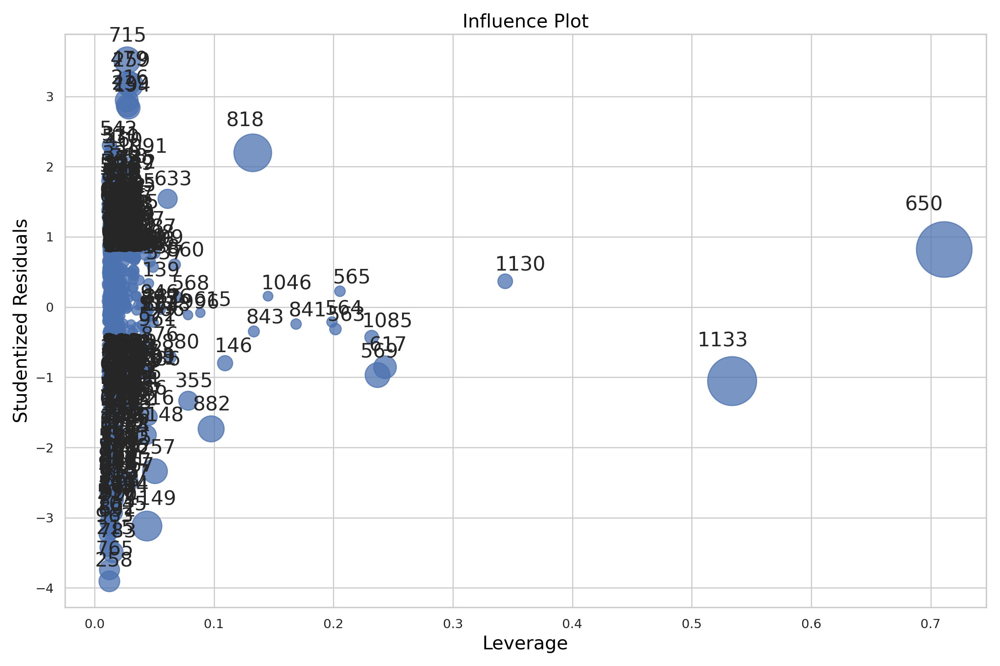

In [ ]:
# Step 5: Cook's distance and influential points
'''To identify values with high influence, we look for observations with:

big blue points (high Cook’s distance) and
high leverage (X-axis) which additionally have
high or low studentized residuals (Y-axis).'''
import statsmodels.api as sm
from statsmodels.formula.api import ols

# fit multi linear regression model
ols_model = ols('actual_productivity ~ smv+targeted_productivity + wip+no_of_workers+no_of_style_change+quarter+team+day+department+over_time+incentive+idle_time+idle_men ', data=df_train).fit()

# Plot influence using statsmodels influence_plot
fig, ax = plt.subplots(figsize=(12, 8))
fig = sm.graphics.influence_plot(ols_model, ax=ax, criterion="cooks", alpha=0.5)
fig.tight_layout(pad=1.0)
plt.show()


In [ ]:
# obtain Cook's distance
lm_cooksd = ols_model.get_influence().cooks_distance[0]

# get length of df to obtain n
n = len(y_train)

# calculate critical d
critical_d = 4/n
print('Critical Cooks distance:', critical_d)

# identification of potential outliers with leverage
out_d = lm_cooksd > critical_d

# output potential outliers with leverage
sorted_out_d_indices = np.argsort(lm_cooksd[out_d])[::-1]

print('Potential Outliers:', df_train.index[sorted_out_d_indices])
print('Cook\'s Distance Values:', lm_cooksd[sorted_out_d_indices])

'''The potential differences in results between using influence_plot and manually calculating Cook's
distance might be due to the different thresholds or criteria used for
identifying outliers. influence_plot might use a default threshold or
a different criterion for marking points as influential.'''

Critical Cooks distance: 0.0041797283176593526
Potential Outliers: Int64Index([ 311,  486,  505,  494, 1042,  471,   97,  395,  267,  302,  402,
             465,  844,  695,  122, 1096,  196,  183,   81, 1058,  629, 1052,
             495,   77,  913,  712,  601,   15,  674,  361,  175,  103,  268,
            1103, 1057, 1161,  283, 1190,  427,  615,  492,  619,  317,  432,
             971,  681],
           dtype='int64')
Cook's Distance Values: [1.44956148e-04 2.49195529e-05 2.14508733e-03 2.61660800e-06
 9.15447708e-04 3.91430295e-05 2.61097746e-05 3.25777153e-04
 7.55452867e-05 6.33663616e-05 6.49126836e-07 7.10229373e-04
 2.15362007e-03 8.26193528e-07 2.19011873e-04 5.99628730e-05
 1.35854178e-04 1.57484025e-04 2.97754525e-04 5.43651496e-06
 8.48654749e-06 1.38826339e-04 1.69708158e-03 3.31191951e-04
 1.49960156e-04 2.02997680e-03 1.29931363e-03 1.31156707e-03
 6.86856626e-04 8.66345620e-07 1.54025665e-05 7.99316540e-04
 2.98325764e-05 1.35376143e-03 1.00491038e-04 4.29430921e-

"The potential differences in results between using influence_plot and manually calculating Cook's\ndistance might be due to the different thresholds or criteria used for\nidentifying outliers. influence_plot might use a default threshold or\na different criterion for marking points as influential."

Feature Importance with Dummy Variables:
                  Feature  Coefficient
0   targeted_productivity     0.645959
23                 team_3     0.069452
21                 team_1     0.057653
24                 team_4     0.040206
9    department_finishing     0.030882
22                 team_2     0.025150
32                team_12     0.024694
12           day_Saturday     0.018169
25                 team_5     0.010302
18              quarter_2     0.007336
15            day_Tuesday     0.007253
8           no_of_workers     0.005105
17              quarter_1     0.003065
5               idle_time     0.000881
4               incentive     0.000046
2                     wip     0.000004
3               over_time    -0.000004
20              quarter_4    -0.001758
14           day_Thursday    -0.003314
16          day_Wednesday    -0.004236
13             day_Sunday    -0.007179
1                     smv    -0.007430
6                idle_men    -0.008328
19              quarter

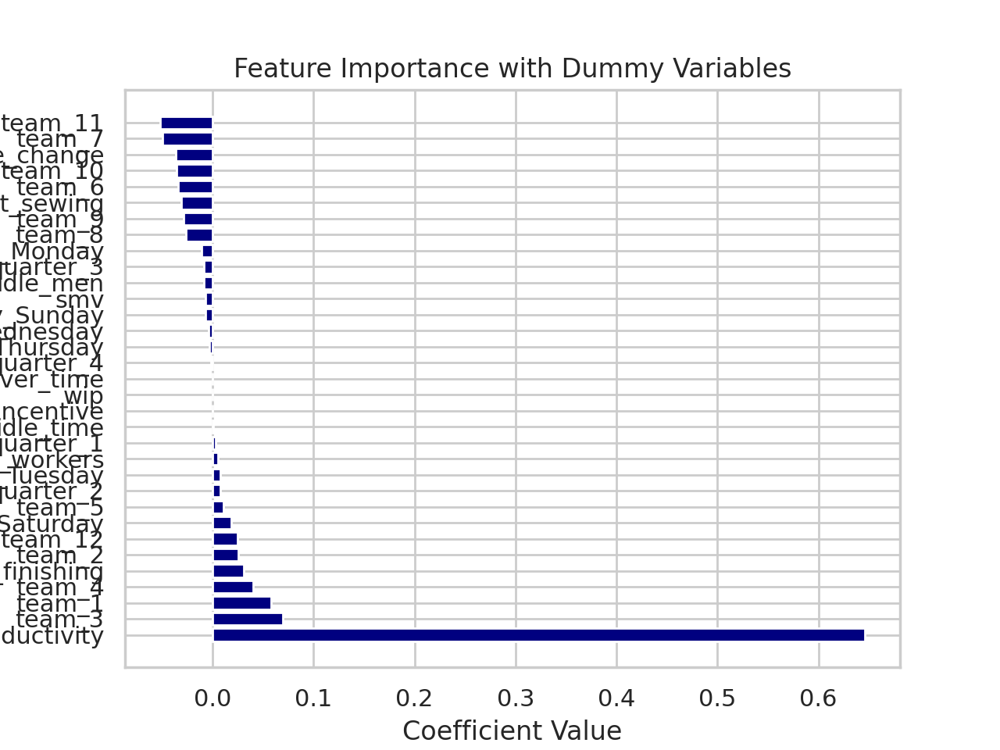

In [ ]:
# Step 6: Feature Selection_with dummies
'''If the coefficient of a feature is significantly positive, it suggests that an increase in that feature is associated with an increase in the target variable
If the coefficient of a feature is significantly negative, it suggests that an increase in that feature is associated with a decrease in the target variable.
If the coefficient is close to zero, it suggests that the feature has a weak impact on the target variable.
If there is high multicollinearity between features, coefficients may be unstable and difficult to interpret.'''
# Feature importance using model coefficients with dummy variables
feature_importance_dummies = pd.DataFrame({'Feature': X_train_dummies.columns, 'Coefficient': model.coef_})
feature_importance_dummies.sort_values(by='Coefficient', ascending=False, inplace=True)

print('Feature Importance with Dummy Variables:')
print(feature_importance_dummies)

# Optionally, you can visualize feature importance
'''The bar plot helps in visualizing the relative importance of each feature. Features with higher bars have more significant impacts on the target variable.'''
plt.barh(feature_importance_dummies['Feature'], feature_importance_dummies['Coefficient'], color='navy')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.title('Feature Importance with Dummy Variables')
plt.show()

In [ ]:
# Function for forward selection
def forward_selection(X_train_dummies, X_test_dummies, y_train, y_test, model):
    selected_features = []
    remaining_features = list(X_train_dummies.columns)

    while remaining_features:
        best_feature = None
        best_score = np.inf  # Adjust based on whether you're minimizing or maximizing

        for feature in remaining_features:
            candidate_features = selected_features + [feature]

            model.fit(X_train_dummies[candidate_features], y_train)
            y_pred = model.predict(X_test_dummies[candidate_features])

            score = mean_squared_error(y_test, y_pred)  # Adjust based on your evaluation metric

            if score < best_score:
                best_score = score
                best_feature = feature

        selected_features.append(best_feature)
        remaining_features.remove(best_feature)

    return selected_features

# Initialize the model (you can replace LinearRegression with other models)
model = LinearRegression()

# Perform forward selection
selected_features_forward = forward_selection(X_train_dummies, X_test_dummies, y_train, y_test, model)

# Display the selected features
print("Selected Features using Forward Selection:", selected_features_forward)

Selected Features using Forward Selection: ['targeted_productivity', 'team_1', 'idle_men', 'no_of_style_change', 'team_8', 'team_11', 'quarter_3', 'team_6', 'incentive', 'day_Tuesday', 'smv', 'no_of_workers', 'over_time', 'department_finishing', 'team_12', 'team_4', 'wip', 'team_9', 'day_Sunday', 'day_Thursday', 'quarter_1', 'department_sewing', 'day_Wednesday', 'day_Saturday', 'day_Monday', 'team_5', 'quarter_2', 'quarter_4', 'team_2', 'team_7', 'idle_time', 'team_3', 'team_10']


In [ ]:
model_forward = LinearRegression()

# Train the model with the selected features
model_forward.fit(X_train_dummies[selected_features_forward], y_train)

# Predict on the test set using the model with selected features
y_pred_test_forward = model_forward.predict(X_test_dummies[selected_features_forward])

# Calculate Mean Squared Error on the test set
mse_test_forward = mean_squared_error(y_test, y_pred_test_forward)

# Display the MSE for the model with selected features
print("Test Mean Squared Error using Forward Selection:", mse_test_forward)

Test Mean Squared Error using Forward Selection: 0.020295181846668252


In [ ]:
# Predict on the train set using the model with selected features
y_pred_train_forward = model_forward.predict(X_train_dummies[selected_features_forward])

# Calculate Mean Squared Error on the train set
mse_train_forward = mean_squared_error(y_train, y_pred_train_forward)

# Display the MSE for the model with selected features
print("Train Mean Squared Error using Forward Selection:", mse_train_forward)

Train Mean Squared Error using Forward Selection: 0.02087556278755632


In [ ]:
# Function for backward elimination
def backward_elimination(X_train_dummies, X_test_dummies, y_train, y_test, model):
    selected_features = list(X_train_dummies.columns)

    while len(selected_features) > 1:  # Keep at least one feature
        best_feature = None
        best_score = np.inf  # Adjust based on whether you're minimizing or maximizing

        for feature in selected_features:
            candidate_features = selected_features.copy()
            candidate_features.remove(feature)

            model.fit(X_train_dummies[candidate_features], y_train)
            y_pred = model.predict(X_test_dummies[candidate_features])

            score = mean_squared_error(y_test, y_pred)  # Adjust based on your evaluation metric

            if score < best_score:
                best_score = score
                best_feature = feature

        selected_features.remove(best_feature)

    return selected_features

# Initialize the model (you can replace LinearRegression with other models)
model = LinearRegression()

# Perform backward elimination
selected_features_backward = backward_elimination(X_train_dummies, X_test_dummies, y_train, y_test, model)

# Display the selected features
print("Selected Features using Backward Elimination:", selected_features_backward)

Selected Features using Backward Elimination: ['targeted_productivity']


In [ ]:
# Initialize the model (you can replace LinearRegression with other models)
model_backward = LinearRegression()

# Train the model with the selected features
model_backward.fit(X_train_dummies[selected_features_backward], y_train)

# Predict on the test set using the model with selected features
y_test_pred_backward = model_backward.predict(X_test_dummies[selected_features_backward])

# Calculate Mean Squared Error on the test set
mse_test_backward = mean_squared_error(y_test, y_test_pred_backward)

# Display the MSE for the model with selected features
print("Test Mean Squared Error using Backward Elimination:", mse_test_backward)

Test Mean Squared Error using Backward Elimination: 0.022998358570233118


In [ ]:
# Predict on the train set using the model with selected features
y_train_pred_backward = model_backward.predict(X_train_dummies[selected_features_backward])

# Calculate Mean Squared Error on the train set
mse_train_backward = mean_squared_error(y_train, y_train_pred_backward)

# Display the MSE for the model with selected features
print("Train Mean Squared Error using Backward Elimination:", mse_train_backward)

Train Mean Squared Error using Backward Elimination: 0.025101510760856788


In [ ]:
# Function for Best Subset Selection
'''import itertools
def best_subset_selection(X_train_dummies, X_test_dummies, y_train, y_test, model):
    best_subset = None
    best_score = np.inf  # Adjust based on whether you're minimizing or maximizing

    for k in range(1, X_train_dummies.shape[1] + 1):
        # Generate all possible combinations of k features
        feature_combinations = list(itertools.combinations(X_train_dummies.columns, k))

        for features in feature_combinations:
            # Fit the model using the selected features
            model.fit(X_train_dummies[list(features)], y_train)
            y_pred = model.predict(X_test_dummies[list(features)])

            # Evaluate the model using Mean Squared Error
            score = mean_squared_error(y_test, y_pred)

            # Update the best subset if a better model is found
            if score < best_score:
                best_score = score
                best_subset = features

    return best_subset

# Initialize the model (you can replace LinearRegression with other models)
model = LinearRegression()

# Perform Best Subset Selection
selected_features_best_subset = best_subset_selection(X_train_dummies, X_test_dummies, y_train, y_test, model)

# Display the selected features
print("Best Subset Selection Features:", selected_features_best_subset)'''

'import itertools\ndef best_subset_selection(X_train_dummies, X_test_dummies, y_train, y_test, model):\n    best_subset = None\n    best_score = np.inf  # Adjust based on whether you\'re minimizing or maximizing\n\n    for k in range(1, X_train_dummies.shape[1] + 1):\n        # Generate all possible combinations of k features\n        feature_combinations = list(itertools.combinations(X_train_dummies.columns, k))\n\n        for features in feature_combinations:\n            # Fit the model using the selected features\n            model.fit(X_train_dummies[list(features)], y_train)\n            y_pred = model.predict(X_test_dummies[list(features)])\n\n            # Evaluate the model using Mean Squared Error\n            score = mean_squared_error(y_test, y_pred)\n\n            # Update the best subset if a better model is found\n            if score < best_score:\n                best_score = score\n                best_subset = features\n\n    return best_subset\n\n# Initialize the mo

In [ ]:
#------------------------------------------------------------------------------------------------

# MLR without team

In [ ]:
# Without team

In [ ]:
#separating features and target for use in modelling
columns_to_drop = ['actual_productivity', 'date_num', 'date','team']
X = df.drop(columns=columns_to_drop, axis=1)

y = df['actual_productivity']

In [ ]:
# Splitting dataset to train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .2, random_state=0)

In [ ]:
# Create dummy variables for 'department','quarter' and 'day'
X_train_dummies = pd.get_dummies(X_train, columns=['department', 'day','quarter'])
X_test_dummies = pd.get_dummies(X_test, columns=['department', 'day','quarter'])



In [ ]:
# Step 1: Initialize and fit the multiple linear regression model
model = LinearRegression()
results=model.fit(X_train_dummies, y_train)

print('Intercept:', model.intercept_)
print('Coefficients:')
for feature, coefficient in zip(X_train_dummies.columns, model.coef_):
    print(f'{feature}: {coefficient}')

Intercept: 0.17479412917982806
Coefficients:
targeted_productivity: 0.685087395729908
smv: -0.00656652008372374
wip: 4.92438666467015e-06
over_time: -3.3703651181816583e-06
incentive: 5.009150366959641e-05
idle_time: 0.0009852405292106211
idle_men: -0.009410903066718273
no_of_style_change: -0.03661533835895394
no_of_workers: 0.005342182921832637
department_finishing: 0.04633228136612744
department_sewing: -0.046332281366127166
day_Monday: -0.013793165745221993
day_Saturday: 0.018630668908165168
day_Sunday: -0.0086004251569366
day_Thursday: -0.0009317800434891652
day_Tuesday: 0.009154655878103608
day_Wednesday: -0.004459953840620636
quarter_1: 0.0032046210801803714
quarter_2: 0.00875435600590161
quarter_3: -0.010137777328557897
quarter_4: -0.0018211997575249491


In [ ]:
# Step 2: Predict the target variable
#Train set
y_pred_train = results.predict(X_train_dummies)

#Test set
y_pred_test = results.predict(X_test_dummies)

# Apply a post-processing step to ensure predictions stay within [0, 1]
##############Check#############
# y_pred__train_constrained = np.clip(y_pred_train, 0, 1)
# y_pred_constrained = np.clip(y_pred_test, 0, 1)

### train & test evaluation metrics - MLR

In [ ]:
# Step 3: Evaluate the model performance
#Training MSE
Train_mse = mean_squared_error(y_train, y_pred_train)
Train_r2 = r2_score(y_train, y_pred_train)
print(f"Training Mean Squared Error: {Train_mse}")
print(f"Training R-squared: {Train_r2}")
# Calculate MAPE
mape_train = np.mean(np.abs((y_train - y_pred_train) / y_train)) * 100

print(f"MAPE: {mape_train:.2f}%")

#Test MSE
Test_mse = mean_squared_error(y_test, y_pred_test)
test_r2 = r2_score(y_test, y_pred_test)
print(f"Test Mean Squared Error: {Test_mse}")
print(f"Test R-squared: {test_r2}")
# Calculate MAPE
mape_test = np.mean(np.abs((y_test - y_pred_test) / y_test)) * 100

print(f"MAPE: {mape_test:.2f}%")

Training Mean Squared Error: 0.022443569358989147
Training R-squared: 0.25551869040015773
MAPE: 19.18%
Test Mean Squared Error: 0.02117593922940466
Test R-squared: 0.2834408033997985
MAPE: 18.68%


In [ ]:
# Step 4: Residual analysis and assumption checking

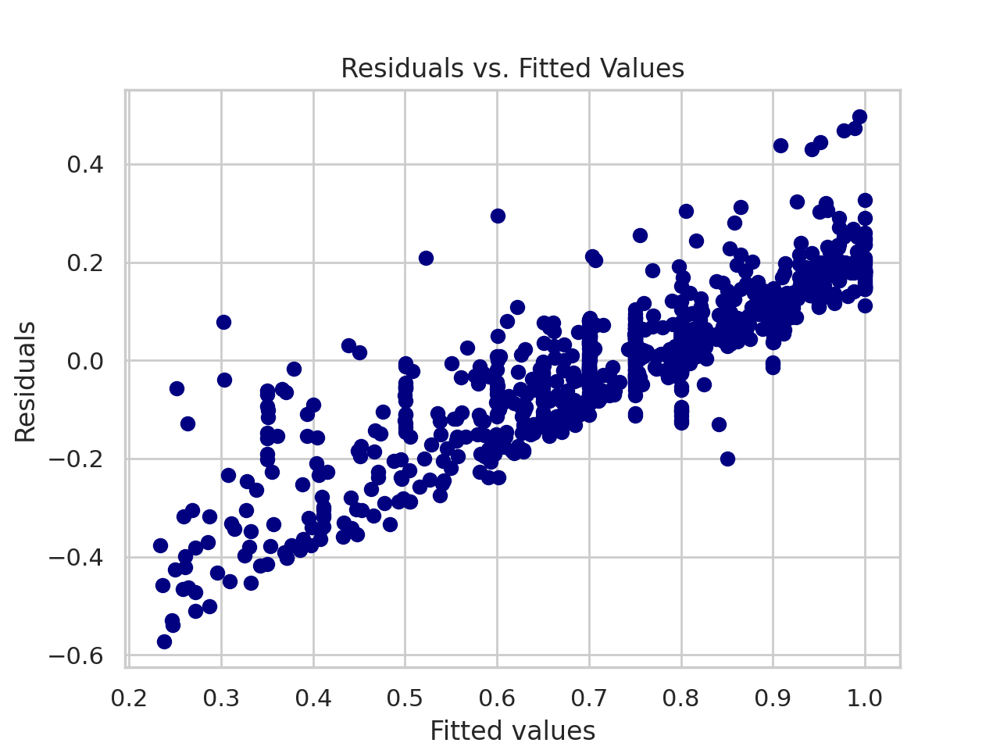

In [ ]:
# 4.1 Residuals vs. Fitted Values Plot
residuals_train =y_train - y_pred_train
plt.scatter(y_train, residuals_train,color='navy')
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.title('Residuals vs. Fitted Values')
plt.grid(True)
plt.show()

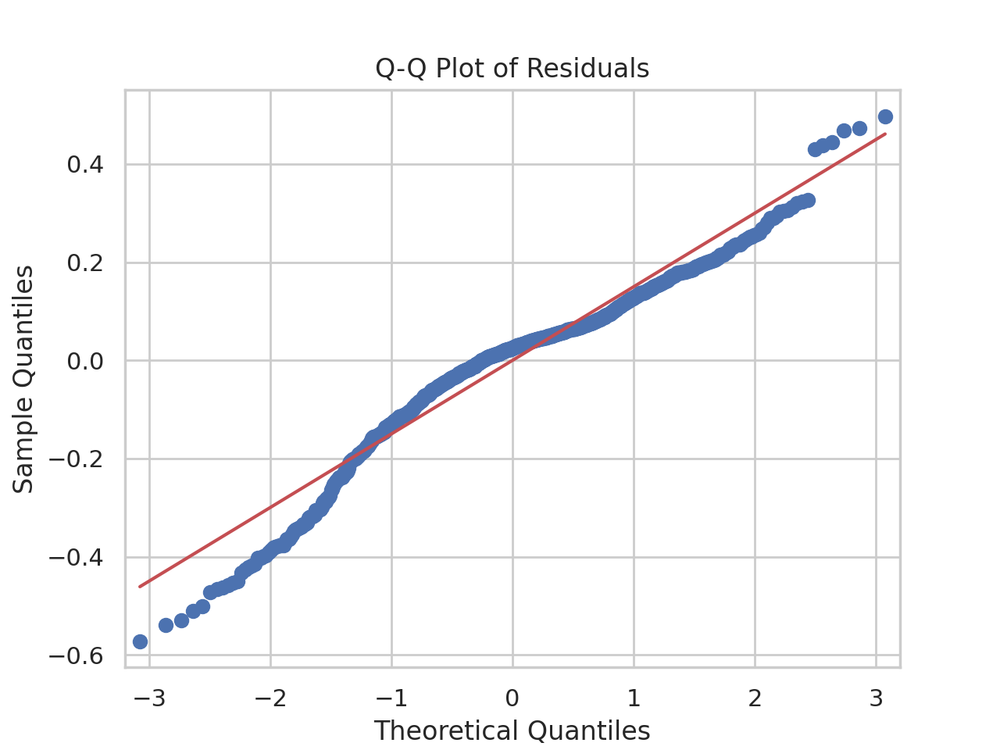

In [ ]:
# 4.2 Q-Q Plot of Residuals
sm.qqplot(residuals_train, line='s')
plt.title('Q-Q Plot of Residuals')
plt.grid(True)
plt.show()

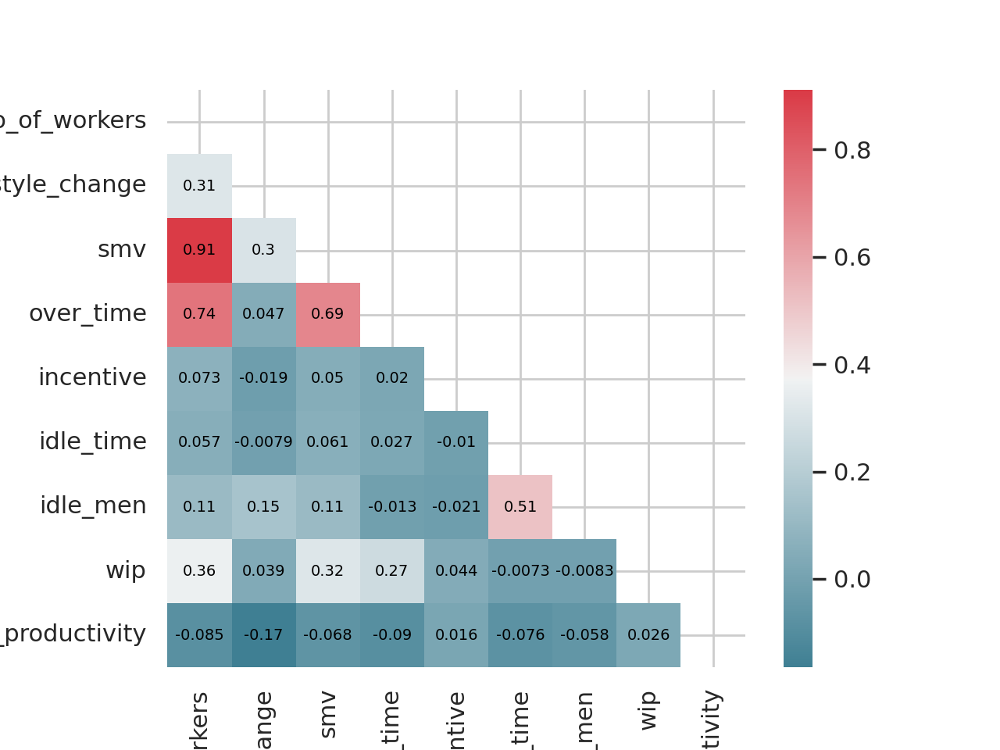

In [ ]:
# Inspect correlation
# Calculate correlation using the default method ( "pearson")
q = [  'no_of_workers', 'no_of_style_change', 'smv', 'over_time', 'incentive', 'idle_time', 'idle_men', 'wip','targeted_productivity']
df_wo_cat = X_train_dummies[q]

corr = df_wo_cat.corr()
# optimize aesthetics: generate mask for removing duplicate / unnecessary info
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
# Generate a custom diverging colormap as indicator for correlations:
cmap = sns.diverging_palette(220, 10, as_cmap=True)
# Plot
sns.heatmap(corr, mask=mask, cmap=cmap, annot=True,  square=True, annot_kws={"size": 7, "color": "black"});

<Axes: >

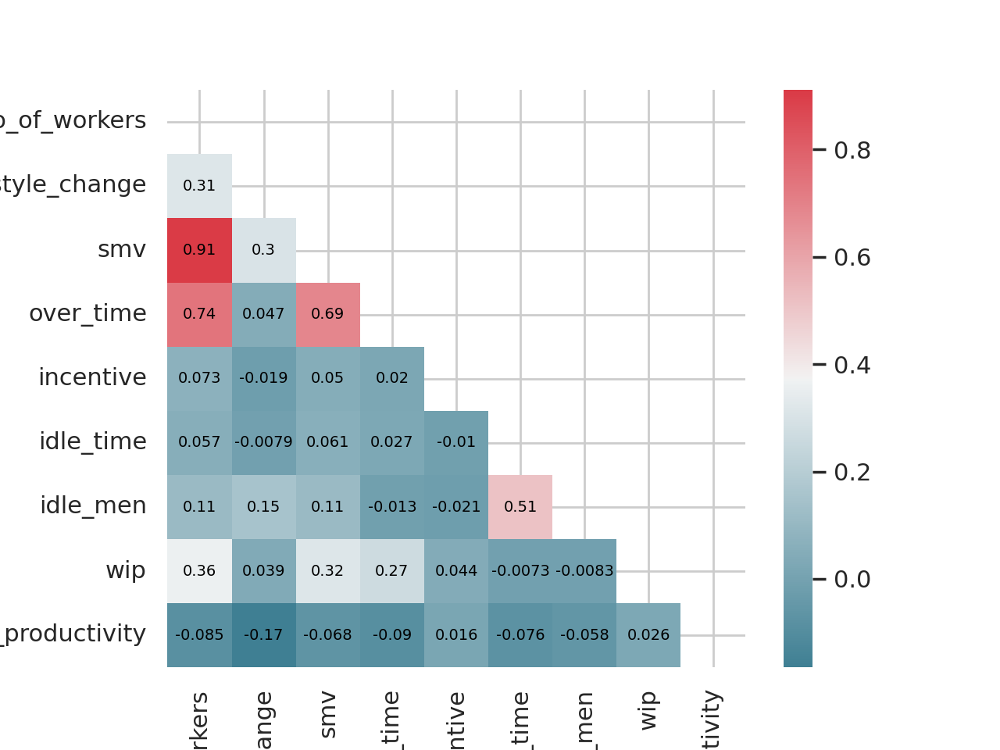

In [ ]:
# Selecting Columns
q = ['no_of_workers', 'no_of_style_change', 'smv', 'over_time', 'incentive', 'idle_time', 'idle_men', 'wip', 'targeted_productivity']
df_wo_cat = X_train_dummies[q]

# Calculating Correlation Matrix
corr = df_wo_cat.corr()

# Create a mask to remove values in the upper triangular part (excluding diagonal)
mask = np.triu(np.ones_like(corr, dtype=bool), k=0)

# Generate a custom diverging colormap as an indicator for correlations
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Plot the heatmap
sns.heatmap(corr, mask=mask, cmap=cmap, annot=True, square=True, annot_kws={"size": 7, "color": "black"})

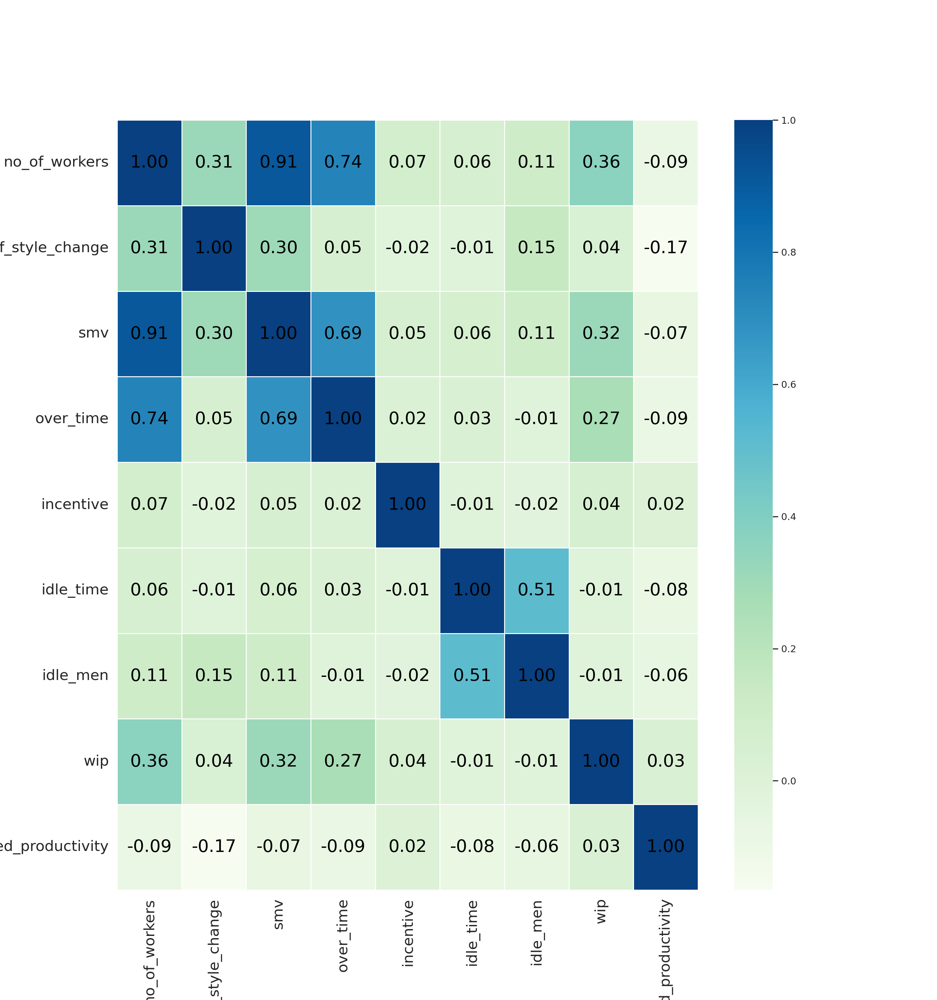

In [ ]:
# 4.3 Correlation plot of quantitative variables
q = [  'no_of_workers', 'no_of_style_change', 'smv', 'over_time', 'incentive', 'idle_time', 'idle_men', 'wip','targeted_productivity']
df_wo_cat = X_train_dummies[q]

corr = df_wo_cat.corr()

# Set the size of the plot
f, ax = plt.subplots(figsize=(15, 16))

# Remove 'smv', 'wip' from y-axis labels
heatmap = sns.heatmap(corr, annot=True, cmap='GnBu', annot_kws={"size": 20, "color": "black"}, fmt=".2f", linewidths=.5, ax=ax)

# Rotate y-axis labels
plt.yticks(rotation=0, fontsize=17)
plt.xticks(fontsize=17)

plt.show()

In [ ]:
# 4.4 Statistical tests for assumptions
# 4.4.1 Homoscedasticity (Breusch-Pagan Lagrange Multiplier test)
'''Note that this test may exaggerate the significance of results in small or moderately large samples. In this case the F-statistic is preferable.
If one of the test statistics is significant (i.e., p <= 0.05), then you have indication of heteroscedasticity.'''

from statsmodels.compat import lzip
import statsmodels.api as sm
from statsmodels.formula.api import ols
# fit multi linear regression model
ols_model = ols('actual_productivity ~ smv+targeted_productivity + wip+no_of_workers+no_of_style_change+quarter+day+department+over_time+incentive+idle_time+idle_men ', data=df_train).fit()
name = ['Lagrange multiplier statistic', 'p-value', 'f-value', 'f p-value']
test = sm.stats.het_breuschpagan(ols_model.resid, ols_model.model.exog)
lzip(name, test)

[('Lagrange multiplier statistic', 159.27600971055776),
 ('p-value', 1.1545608031144012e-24),
 ('f-value', 10.40466369370406),
 ('f p-value', 3.359950577744314e-27)]

In [ ]:
# 4.4.2 Autocorrelation-correlation between the error terms  (Durbin-Watson test)
'''The test statistic ranges between 0 and 4, where:
A value around 2 indicates no autocorrelation (residuals are independent).
A value significantly less than 2 suggests positive autocorrelation (residuals are positively correlated).
A value significantly greater than 2 suggests negative autocorrelation (residuals are negatively correlated).'''

dw_stat = durbin_watson(residuals_train)
print(f'Durbin-Watson Test - Statistic: {dw_stat}')

Durbin-Watson Test - Statistic: 2.0010609028561968


In [ ]:
# 4.4.3 Normality (Shapiro-Wilk test)
'''If the p-value is less than the chosen significance level, you reject the null hypothesis. This implies that there is enough evidence to suggest that the data deviates from a normal distribution.'''
shapiro_stat, shapiro_p_value = shapiro(residuals_train)
print(f'Shapiro-Wilk Test - Statistic: {shapiro_stat}, p-value: {shapiro_p_value}')


Shapiro-Wilk Test - Statistic: 0.9497618079185486, p-value: 1.5363998103639508e-17


In [ ]:
# 4.3.4 Multicollinearity (VIF)
'''If VIF values are greater than 10 , it implies multicollinearity'''
# Filter quantitative columns
quantitative_columns = X_train_dummies.select_dtypes(include=['float64', 'int64']).columns

# Calculate VIF for each quantitative feature
vif_data = pd.DataFrame()
vif_data["Variable"] = quantitative_columns
vif_data["VIF"] = [variance_inflation_factor(X_train_dummies[quantitative_columns].values, i) for i in range(len(quantitative_columns))]

# Display the VIF values for quantitative variables
print(vif_data)

                Variable        VIF
0  targeted_productivity   3.326878
1                    smv  17.173812
2                    wip   1.395200
3              over_time   7.040425
4              incentive   1.066292
5              idle_time   1.381840
6               idle_men   1.444802
7     no_of_style_change   1.395430
8          no_of_workers  25.926961


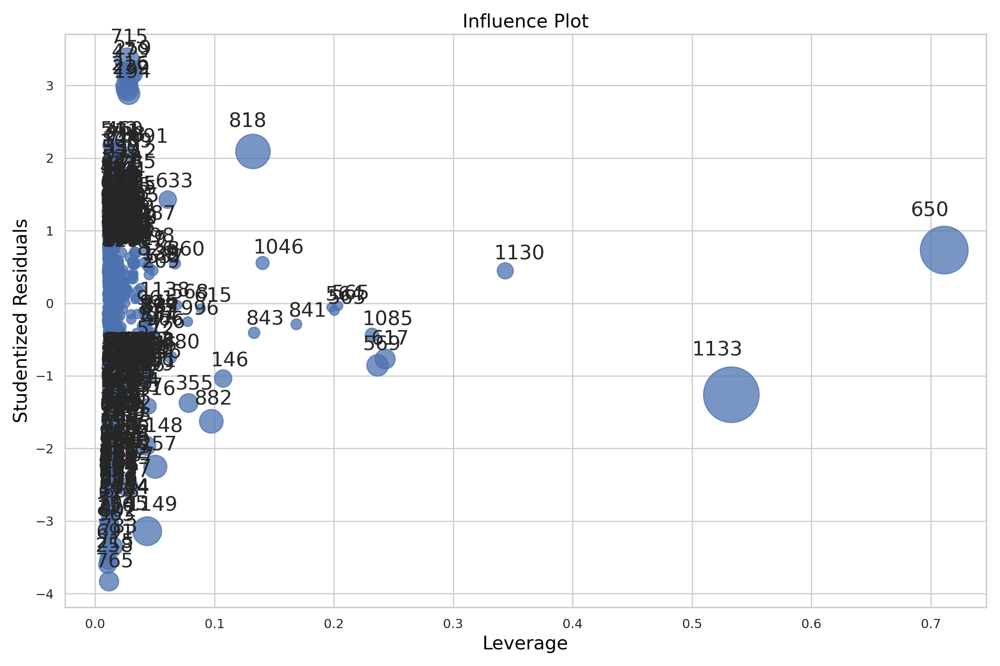

In [ ]:
# Step 5: Cook's distance and influential points
'''To identify values with high influence, we look for observations with:

big blue points (high Cook’s distance) and
high leverage (X-axis) which additionally have
high or low studentized residuals (Y-axis).'''
import statsmodels.api as sm
from statsmodels.formula.api import ols

# fit multi linear regression model
ols_model = ols('actual_productivity ~ smv+targeted_productivity + wip+no_of_workers+no_of_style_change+quarter+day+department+over_time+incentive+idle_time+idle_men ', data=df_train).fit()

# Plot influence using statsmodels influence_plot
fig, ax = plt.subplots(figsize=(12, 8))
fig = sm.graphics.influence_plot(ols_model, ax=ax, criterion="cooks", alpha=0.5)
fig.tight_layout(pad=1.0)
plt.show()


In [ ]:
# obtain Cook's distance
lm_cooksd = ols_model.get_influence().cooks_distance[0]

# get length of df to obtain n
n = len(y_train)

# calculate critical d
critical_d = 4/n
print('Critical Cooks distance:', critical_d)

# identification of potential outliers with leverage
out_d = lm_cooksd > critical_d

# output potential outliers with leverage
sorted_out_d_indices = np.argsort(lm_cooksd[out_d])[::-1]

print('Potential Outliers:', df_train.index[sorted_out_d_indices])
print('Cook\'s Distance Values:', lm_cooksd[sorted_out_d_indices])

'''The potential differences in results between using influence_plot and manually calculating Cook's
distance might be due to the different thresholds or criteria used for
identifying outliers. influence_plot might use a default threshold or
a different criterion for marking points as influential.'''

Critical Cooks distance: 0.0041797283176593526
Potential Outliers: Int64Index([1052,  283,  505,  494, 1042,  317,  500,  844,  991,  267,  122,
             695,  395, 1190,  402,   15,  615, 1096,   97,  601,  681,  805,
             900,  311,  302, 1103,  432,  361,  492, 1161,  183,  465,  773,
             103,  619,  175,  471,  427,  712,  759, 1057,  674,  196,  913,
             486,   77,  699,  971,  629,  268,  495, 1058,   81],
           dtype='int64')
Cook's Distance Values: [2.14908971e-04 8.85593043e-05 1.40412618e-03 8.96827117e-05
 7.35235459e-04 6.38972789e-03 5.08692920e-04 2.56849985e-03
 1.69851807e-05 9.96452682e-06 2.76965097e-04 8.19394071e-05
 2.68543959e-04 3.24939382e-04 6.28373469e-05 1.20278188e-03
 2.66240738e-05 1.10757060e-04 2.51262116e-06 8.59365413e-04
 1.08031948e-05 1.26217866e-03 4.94288867e-03 3.45160749e-04
 2.30859942e-04 8.34796274e-04 3.25794236e-07 1.76506456e-06
 5.31642308e-04 6.15977389e-05 2.38862124e-05 2.73389284e-04
 1.83262404e-04 

"The potential differences in results between using influence_plot and manually calculating Cook's\ndistance might be due to the different thresholds or criteria used for\nidentifying outliers. influence_plot might use a default threshold or\na different criterion for marking points as influential."

Feature Importance with Dummy Variables:
                  Feature  Coefficient
0   targeted_productivity     0.685087
9    department_finishing     0.046332
12           day_Saturday     0.018631
15            day_Tuesday     0.009155
18              quarter_2     0.008754
8           no_of_workers     0.005342
17              quarter_1     0.003205
5               idle_time     0.000985
4               incentive     0.000050
2                     wip     0.000005
3               over_time    -0.000003
14           day_Thursday    -0.000932
20              quarter_4    -0.001821
16          day_Wednesday    -0.004460
1                     smv    -0.006567
13             day_Sunday    -0.008600
6                idle_men    -0.009411
19              quarter_3    -0.010138
11             day_Monday    -0.013793
7      no_of_style_change    -0.036615
10      department_sewing    -0.046332


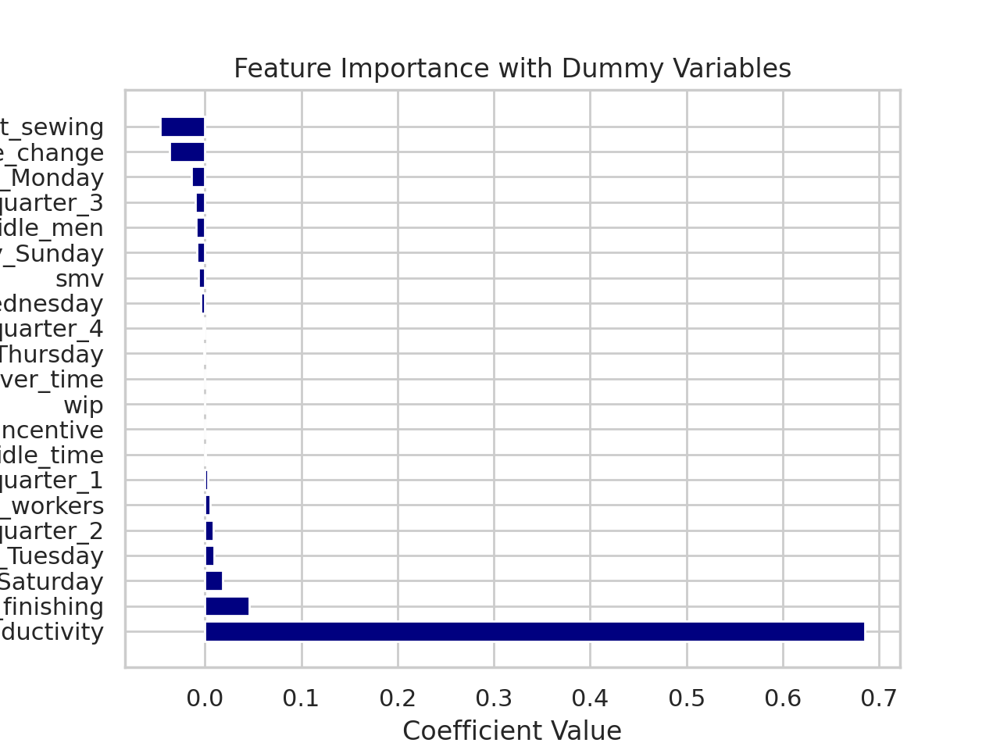

In [ ]:
# Step 6: Feature Selection
'''If the coefficient of a feature is significantly positive, it suggests that an increase in that feature is associated with an increase in the target variable
If the coefficient of a feature is significantly negative, it suggests that an increase in that feature is associated with a decrease in the target variable.
If the coefficient is close to zero, it suggests that the feature has a weak impact on the target variable.
If there is high multicollinearity between features, coefficients may be unstable and difficult to interpret.'''
# Feature importance using model coefficients with dummy variables
feature_importance_dummies = pd.DataFrame({'Feature': X_train_dummies.columns, 'Coefficient': model.coef_})
feature_importance_dummies.sort_values(by='Coefficient', ascending=False, inplace=True)

print('Feature Importance with Dummy Variables:')
print(feature_importance_dummies)

# Optionally, you can visualize feature importance
'''The bar plot helps in visualizing the relative importance of each feature. Features with higher bars have more significant impacts on the target variable.'''
plt.barh(feature_importance_dummies['Feature'], feature_importance_dummies['Coefficient'], color='navy')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.title('Feature Importance with Dummy Variables')
plt.show()

In [ ]:
# Function for forward selection
def forward_selection(X_train_dummies, X_test_dummies, y_train, y_test, model):
    selected_features = []
    remaining_features = list(X_train_dummies.columns)

    while remaining_features:
        best_feature = None
        best_score = np.inf  # Adjust based on whether you're minimizing or maximizing

        for feature in remaining_features:
            candidate_features = selected_features + [feature]

            model.fit(X_train_dummies[candidate_features], y_train)
            y_pred = model.predict(X_test_dummies[candidate_features])

            score = mean_squared_error(y_test, y_pred)  # Adjust based on your evaluation metric

            if score < best_score:
                best_score = score
                best_feature = feature

        selected_features.append(best_feature)
        remaining_features.remove(best_feature)

    return selected_features

# Initialize the model (you can replace LinearRegression with other models)
model = LinearRegression()

# Perform forward selection
selected_features_forward = forward_selection(X_train_dummies, X_test_dummies, y_train, y_test, model)

# Display the selected features
print("Selected Features using Forward Selection:", selected_features_forward)

Selected Features using Forward Selection: ['targeted_productivity', 'idle_men', 'no_of_style_change', 'quarter_3', 'incentive', 'wip', 'day_Tuesday', 'department_sewing', 'no_of_workers', 'over_time', 'day_Sunday', 'day_Wednesday', 'day_Thursday', 'department_finishing', 'quarter_2', 'quarter_1', 'quarter_4', 'smv', 'day_Saturday', 'day_Monday', 'idle_time']


In [ ]:
model_forward = LinearRegression()

# Train the model with the selected features
model_forward.fit(X_train_dummies[selected_features_forward], y_train)

# Predict on the test set using the model with selected features
y_pred_test_forward = model_forward.predict(X_test_dummies[selected_features_forward])

# Calculate Mean Squared Error on the test set
mse_test_forward = mean_squared_error(y_test, y_pred_test_forward)

# Display the MSE for the model with selected features
print("Test Mean Squared Error using Forward Selection:", mse_test_forward)

Test Mean Squared Error using Forward Selection: 0.021175939229404476


In [ ]:
#Predict on the train set using the model with selected features
y_pred_train_forward = model_forward.predict(X_train_dummies[selected_features_forward])

# Calculate Mean Squared Error on the train set
mse_train_forward = mean_squared_error(y_train, y_pred_train_forward)

# Display the MSE for the model with selected features
print("Train Mean Squared Error using Forward Selection:", mse_train_forward)

Train Mean Squared Error using Forward Selection: 0.02244356935898915


In [ ]:
# Function for backward elimination
def backward_elimination(X_train_dummies, X_test_dummies, y_train, y_test, model):
    selected_features = list(X_train_dummies.columns)

    while len(selected_features) > 1:  # Keep at least one feature
        best_feature = None
        best_score = np.inf  # Adjust based on whether you're minimizing or maximizing

        for feature in selected_features:
            candidate_features = selected_features.copy()
            candidate_features.remove(feature)

            model.fit(X_train_dummies[candidate_features], y_train)
            y_pred = model.predict(X_test_dummies[candidate_features])

            score = mean_squared_error(y_test, y_pred)  # Adjust based on your evaluation metric

            if score < best_score:
                best_score = score
                best_feature = feature

        selected_features.remove(best_feature)

    return selected_features

# Initialize the model (you can replace LinearRegression with other models)
model = LinearRegression()

# Perform backward elimination
selected_features_backward = backward_elimination(X_train_dummies, X_test_dummies, y_train, y_test, model)

# Display the selected features
print("Selected Features using Backward Elimination:", selected_features_backward)

Selected Features using Backward Elimination: ['targeted_productivity']


In [ ]:
# Initialize the model (you can replace LinearRegression with other models)
model_backward = LinearRegression()

# Train the model with the selected features
model_backward.fit(X_train_dummies[selected_features_backward], y_train)

# Predict on the test set using the model with selected features
y_test_pred_backward = model_backward.predict(X_test_dummies[selected_features_backward])

# Calculate Mean Squared Error on the test set
mse_test_backward = mean_squared_error(y_test, y_test_pred_backward)

# Display the MSE for the model with selected features
print("Test Mean Squared Error using Backward Elimination:", mse_test_backward)

Test Mean Squared Error using Backward Elimination: 0.022998358570233118


In [ ]:
# Predict on the train set using the model with selected features
y_train_pred_backward = model_backward.predict(X_train_dummies[selected_features_backward])

# Calculate Mean Squared Error on the train set
mse_train_backward = mean_squared_error(y_train, y_train_pred_backward)

# Display the MSE for the model with selected features
print("Train Mean Squared Error using Backward Elimination:", mse_train_backward)

Train Mean Squared Error using Backward Elimination: 0.025101510760856788


# Ridge


**With team**

In [ ]:
'''The assumptions are the same as those used in regular multiple regression: linearity, constant variance (no
outliers), and independence. Since ridge regression does not provide confidence limits, normality need not
be assumed.But offer some robustness to violations of assumptions, particularly when dealing with multicollinearity.'''

'The assumptions are the same as those used in regular multiple regression: linearity, constant variance (no\noutliers), and independence. Since ridge regression does not provide confidence limits, normality need not\nbe assumed.But offer some robustness to violations of assumptions, particularly when dealing with multicollinearity.'

In [ ]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.linear_model import ElasticNet,Lasso,Ridge

In [ ]:
#separating features and target for use in modelling
columns_to_drop = ['actual_productivity', 'date_num', 'date']
X = df.drop(columns=columns_to_drop, axis=1)

y = df['actual_productivity']

In [ ]:
# Splitting dataset to train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .2, random_state=0)

In [ ]:
#creating train dataset
df_train=pd.concat([X_train, y_train], axis=1)

In [ ]:
# Create dummy variables for 'department','quarter' and 'day'
X_train_dummies = pd.get_dummies(X_train, columns=['department', 'day','quarter','team'])
X_test_dummies = pd.get_dummies(X_test, columns=['department', 'day','quarter','team'])


In [ ]:
#Standardize Features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_dummies_scaled = scaler.fit_transform(X_train_dummies)
X_test_dummies_scaled = scaler.fit_transform(X_test_dummies)

In [ ]:
from sklearn import linear_model
from sklearn.metrics import mean_squared_error

#The default values for alpha in Ridge is 1.0

# Create ridge objects
ridge = linear_model.Ridge()
# Fit the models
R=ridge.fit(X_train_dummies_scaled, y_train)


In [ ]:
#Print R-squared scores, RMSE
print("ridge train score:", R.score(X_train_dummies_scaled, y_train))
print("ridge test score:", R.score(X_test_dummies_scaled, y_test))
print("ridge train RMSE:", np.sqrt(mean_squared_error( y_train,R.predict(X_train_dummies_scaled))))
print("ridge test RMSE:", np.sqrt(mean_squared_error( y_test, R.predict(X_test_dummies_scaled))))

ridge train score: 0.30751639829397304
ridge test score: 0.32511449463993625
ridge train RMSE: 0.1444853488030208
ridge test RMSE: 0.14122460029947853


In [ ]:
# Calculate MAPE function
def calculate_mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Calculate MAPE values for training and test sets
ridge_mape_train = calculate_mape(y_train, ridge.predict(X_train_dummies_scaled))
ridge_mape_test = calculate_mape(y_test, ridge.predict(X_test_dummies_scaled))

#Print MAPE
print(f"Ridge MAPE (train):{ridge_mape_train:.2f}%")
print(f"Ridge MAPE (test):{ridge_mape_test:.2f}%" )

Ridge MAPE (train):18.38%
Ridge MAPE (test):18.27%


In [ ]:
#Print coefficients
print('Intercept:', ridge.intercept_)
print('Coefficients:')
for feature, coefficient in zip(X_train_dummies.columns, ridge.coef_):
    print(f'{feature}: {coefficient}')

Intercept: 0.7358966044409614
Coefficients:
targeted_productivity: 0.06403725670609078
smv: -0.07999425532669831
wip: 0.006039094073828037
over_time: -0.01331951503750437
incentive: 0.007407162150507929
idle_time: 0.0091215424767066
idle_men: -0.026723868721855882
no_of_style_change: -0.015277941411264252
no_of_workers: 0.10977761337066862
department_finishing: 0.01447171087141895
department_sewing: -0.014471710871418894
day_Monday: -0.003889120945690596
day_Saturday: 0.00663896638255202
day_Sunday: -0.00262499065691445
day_Thursday: -0.0012091116281169694
day_Tuesday: 0.002755681680765311
day_Wednesday: -0.001511515354299404
quarter_1: 0.0010823408282479307
quarter_2: 0.002946945909606842
quarter_3: -0.0035831929673331574
quarter_4: -0.0010609397257156964
team_1: 0.0159426685128301
team_2: 0.007258704162025049
team_3: 0.018240579119080214
team_4: 0.011434361951464554
team_5: 0.0025907337305863484
team_6: -0.009769054847487463
team_7: -0.013531632907816412
team_8: -0.007672709756736896

In [ ]:
#Hyperparameter tuning
from sklearn.linear_model import RidgeCV
ridge_cv_model = RidgeCV(cv=10).fit(X_train_dummies_scaled, y_train)

In [ ]:
#Print the best parameters
print("ridge best parameters:", ridge_cv_model.alpha_)

ridge best parameters: 10.0


In [ ]:
#Print coefficients
print('Intercept:', ridge_cv_model.intercept_)
print('Coefficients:')
for feature, coefficient in zip(X_train_dummies.columns,ridge_cv_model.coef_):
    print(f'{feature}: {coefficient}')


Intercept: 0.7358966044409614
Coefficients:
targeted_productivity: 0.06346930454429939
smv: -0.07165702479443257
wip: 0.006303888392431569
over_time: -0.011454284883698753
incentive: 0.007643963697656908
idle_time: 0.008780098795417477
idle_men: -0.02620119318780814
no_of_style_change: -0.014833555037582668
no_of_workers: 0.08945196872765346
department_finishing: 0.009324909400612265
department_sewing: -0.00932490940061228
day_Monday: -0.003907968685121416
day_Saturday: 0.006499676329508624
day_Sunday: -0.0026251206919433727
day_Thursday: -0.0012288293867179973
day_Tuesday: 0.0027105009883114746
day_Wednesday: -0.001293931644845772
quarter_1: 0.0012270677046979453
quarter_2: 0.0027409519438198215
quarter_3: -0.003514686130303001
quarter_4: -0.0010599569027345808
team_1: 0.016113907175411887
team_2: 0.007653839211684321
team_3: 0.01853652612469164
team_4: 0.011901766315403389
team_5: 0.002539112540475218
team_6: -0.011420752293300734
team_7: -0.013330889137700298
team_8: -0.007615874077

In [ ]:
# Let's create the final model according to optimum alpha.
from sklearn.linear_model import Ridge
ridge_tuned = Ridge(alpha = ridge_cv_model.alpha_).fit(X_train_dummies_scaled,y_train)

print("Ridge train score:",ridge_tuned.score(X_train_dummies_scaled, y_train))
print("Ridge test score:", ridge_tuned.score(X_test_dummies_scaled, y_test))
print("Ridge train RMSE:", np.sqrt(mean_squared_error( y_train,ridge_tuned.predict(X_train_dummies_scaled))))
print("Ridge test RMSE:",np.sqrt( mean_squared_error( y_test, ridge_tuned.predict(X_test_dummies_scaled))))

Ridge train score: 0.30651117611516887
Ridge test score: 0.3240202845542749
Ridge train RMSE: 0.1445901795937866
Ridge test RMSE: 0.1413390395605272


In [ ]:
# Calculate MAPE function
def calculate_mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Calculate MAPE values for training and test sets
ridge_mape_train = calculate_mape(y_train, ridge_tuned.predict(X_train_dummies_scaled))
ridge_mape_test = calculate_mape(y_test, ridge_tuned.predict(X_test_dummies_scaled))

#Print MAPE
print(f"Ridge MAPE (train):{ridge_mape_train:.2f}%")
print(f"Ridge MAPE (test):{ridge_mape_test:.2f}%" )

Ridge MAPE (train):18.39%
Ridge MAPE (test):18.26%


Without team

In [ ]:
#separating features and target for use in modelling
columns_to_drop = ['actual_productivity','team', 'date_num', 'date']
X = df.drop(columns=columns_to_drop, axis=1)

y = df['actual_productivity']

In [ ]:
# Splitting dataset to train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .2, random_state=0)

In [ ]:
#creating train dataset
df_train=pd.concat([X_train, y_train], axis=1)

In [ ]:
# Create dummy variables for 'department','quarter' and 'day'
X_train_dummies = pd.get_dummies(X_train, columns=['department', 'day','quarter'])
X_test_dummies = pd.get_dummies(X_test, columns=['department', 'day','quarter'])


In [ ]:
#Standardize Features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_dummies_scaled = scaler.fit_transform(X_train_dummies)
X_test_dummies_scaled = scaler.fit_transform(X_test_dummies)

In [ ]:
from sklearn import linear_model
from sklearn.metrics import mean_squared_error

#The default values for alpha in Ridge is 1.0

# Create ridge objects
ridge = linear_model.Ridge()
# Fit the models
R=ridge.fit(X_train_dummies_scaled, y_train)


In [ ]:
#Print R-squared scores, RMSE
print("ridge train score:", R.score(X_train_dummies_scaled, y_train))
print("ridge test score:", R.score(X_test_dummies_scaled, y_test))
print("ridge train RMSE:", np.sqrt(mean_squared_error( y_train,R.predict(X_train_dummies_scaled))))
print("ridge test RMSE:", np.sqrt(mean_squared_error( y_test, R.predict(X_test_dummies_scaled))))

ridge train score: 0.25550649932415803
ridge test score: 0.29559390645822403
ridge train RMSE: 0.14981300637228587
ridge test RMSE: 0.14428023996221828


In [ ]:
# Calculate MAPE function
def calculate_mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Calculate MAPE values for training and test sets
ridge_mape_train = calculate_mape(y_train, ridge.predict(X_train_dummies_scaled))
ridge_mape_test = calculate_mape(y_test, ridge.predict(X_test_dummies_scaled))

#Print MAPE
print(f"Ridge MAPE (train):{ridge_mape_train:.2f}%")
print(f"Ridge MAPE (test):{ridge_mape_test:.2f}%" )

Ridge MAPE (train):19.17%
Ridge MAPE (test):18.37%


In [ ]:
#Print coefficients
print('Intercept:', R.intercept_)
print('Coefficients:')
for feature, coefficient in zip(X_train_dummies.columns,R.coef_):
    print(f'{feature}: {coefficient}')

Intercept: 0.7358966044409614
Coefficients:
targeted_productivity: 0.06788652101395427
smv: -0.0706992080850721
wip: 0.007827489209006187
over_time: -0.011131317602361029
incentive: 0.008023204413355335
idle_time: 0.010196245593101071
idle_men: -0.030197515291010963
no_of_style_change: -0.015336958475326505
no_of_workers: 0.11572776855930937
department_finishing: 0.022380253714724095
department_sewing: -0.02238025371472973
day_Monday: -0.005040819992273926
day_Saturday: 0.006806932381164405
day_Sunday: -0.0031646258526083883
day_Thursday: -0.0003139269957390492
day_Tuesday: 0.0034556283591695215
day_Wednesday: -0.0016100675920999268
quarter_1: 0.0011056830399512208
quarter_2: 0.0035476716671426966
quarter_3: -0.004213136168399442
quarter_4: -0.0011555738054580004


In [ ]:
#Hyperparameter tuning
from sklearn.linear_model import RidgeCV
ridge_cv_model = RidgeCV(cv=10).fit(X_train_dummies_scaled, y_train)

In [ ]:
#Print the best parameters
print("ridge best parameters:", ridge_cv_model.alpha_)

ridge best parameters: 10.0


In [ ]:
#Print coefficients
print('Intercept:', ridge_cv_model.intercept_)
print('Coefficients:')
for feature, coefficient in zip(X_train_dummies.columns,ridge_cv_model.coef_):
    print(f'{feature}: {coefficient}')

Intercept: 0.7358966044409614
Coefficients:
targeted_productivity: 0.0670828266942236
smv: -0.06322978836659339
wip: 0.008058017903859165
over_time: -0.009095151759705475
incentive: 0.008268795409683845
idle_time: 0.009795715746986452
idle_men: -0.029594699631000965
no_of_style_change: -0.014642439884402718
no_of_workers: 0.0993072272002749
department_finishing: 0.018765788062429335
department_sewing: -0.01876578806243025
day_Monday: -0.005061233112770373
day_Saturday: 0.006724703787310546
day_Sunday: -0.0031641575278435067
day_Thursday: -0.00035506594979504047
day_Tuesday: 0.0034053068419420645
day_Wednesday: -0.001419880509168841
quarter_1: 0.0013417488861069786
quarter_2: 0.0034306368700302947
quarter_3: -0.004226453661167444
quarter_4: -0.0012733427063635564


In [ ]:
# Let's create the final model according to optimum alpha.
ridge_tuned = Ridge(alpha = ridge_cv_model.alpha_).fit(X_train_dummies_scaled,y_train)

print("Ridge train score:",ridge_tuned.score(X_train_dummies_scaled, y_train))
print("Ridge test score:", ridge_tuned.score(X_test_dummies_scaled, y_test))
print("Ridge train MSE:", np.sqrt(mean_squared_error( y_train,ridge_tuned.predict(X_train_dummies_scaled))))
print("Ridge test MSE:", np.sqrt(mean_squared_error( y_test, ridge_tuned.predict(X_test_dummies_scaled))))

Ridge train score: 0.254601965694207
Ridge test score: 0.29583836946773945
Ridge train MSE: 0.14990398753402553
Ridge test MSE: 0.14425520167625575


In [ ]:
# Calculate MAPE function
def calculate_mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Calculate MAPE values for training and test sets
ridge_mape_train = calculate_mape(y_train, ridge_tuned.predict(X_train_dummies_scaled))
ridge_mape_test = calculate_mape(y_test, ridge_tuned.predict(X_test_dummies_scaled))

#Print MAPE
print(f"Ridge MAPE (train):{ridge_mape_train:.2f}%")
print(f"Ridge MAPE (test):{ridge_mape_test:.2f}%" )

Ridge MAPE (train):19.14%
Ridge MAPE (test):18.33%


# **Lasso**

**With team**

In [ ]:
#separating features and target for use in modelling
columns_to_drop = ['actual_productivity', 'date_num', 'date']
X = df.drop(columns=columns_to_drop, axis=1)

y = df['actual_productivity']

In [ ]:
# Splitting dataset to train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .2, random_state=0)

In [ ]:
#creating train dataset
df_train=pd.concat([X_train, y_train], axis=1)

In [ ]:
# Create dummy variables for 'department','quarter' and 'day'
X_train_dummies = pd.get_dummies(X_train, columns=['department', 'day','quarter','team'])
X_test_dummies = pd.get_dummies(X_test, columns=['department', 'day','quarter','team'])


In [ ]:
#Standardize Features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_dummies_scaled = scaler.fit_transform(X_train_dummies)
X_test_dummies_scaled = scaler.fit_transform(X_test_dummies)

In [ ]:
from sklearn import linear_model
from sklearn.metrics import mean_squared_error

#The default values for alpha in Lasso is 1.0

# Create lasso objects
lasso = linear_model.Lasso()
# Fit the model
L=lasso.fit(X_train_dummies_scaled, y_train)

In [ ]:
# Print R-squared scores,RMSE
#Print R-squared scores
print("lasso train score:", L.score(X_train_dummies_scaled, y_train))
print("lasso test score:", L.score(X_test_dummies_scaled, y_test))
print("lasso train RMSE:", np.sqrt(mean_squared_error( y_train,L.predict(X_train_dummies_scaled))))
print("lasso test RMSE:", np.sqrt(mean_squared_error( y_test, L.predict(X_test_dummies_scaled))))

lasso train score: 0.0
lasso test score: -0.001735836165499327
lasso train RMSE: 0.17362772063733994
lasso test RMSE: 0.17205682681949225


In [ ]:
# Calculate MAPE function
def calculate_mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Calculate MAPE values for training and test sets
lasso_mape_train = calculate_mape(y_train, lasso.predict(X_train_dummies_scaled))
lasso_mape_test = calculate_mape(y_test, lasso.predict(X_test_dummies_scaled))

#Print MAPE
print(f"Lasso MAPE (train):{lasso_mape_train:.2f}%")
print(f"Lasso MAPE (test):{lasso_mape_test:.2f}%" )

Lasso MAPE (train):23.99%
Lasso MAPE (test):23.76%


In [ ]:
#Print coefficients
print('Intercept:',L.intercept_)
print('Coefficients:')
for feature, coefficient in zip(X_train_dummies.columns,L.coef_):
    print(f'{feature}: {coefficient}')

Intercept: 0.7358966044409614
Coefficients:
targeted_productivity: 0.0
smv: -0.0
wip: 0.0
over_time: -0.0
incentive: 0.0
idle_time: -0.0
idle_men: -0.0
no_of_style_change: -0.0
no_of_workers: -0.0
department_finishing: 0.0
department_sewing: -0.0
day_Monday: -0.0
day_Saturday: 0.0
day_Sunday: -0.0
day_Thursday: -0.0
day_Tuesday: 0.0
day_Wednesday: -0.0
quarter_1: 0.0
quarter_2: 0.0
quarter_3: -0.0
quarter_4: -0.0
team_1: 0.0
team_2: 0.0
team_3: 0.0
team_4: 0.0
team_5: -0.0
team_6: -0.0
team_7: -0.0
team_8: -0.0
team_9: 0.0
team_10: -0.0
team_11: -0.0
team_12: 0.0


In [ ]:
#Hyperparameter tuning
from sklearn.linear_model import LassoCV
lasso_cv_model = LassoCV(cv=10).fit(X_train_dummies_scaled, y_train)

In [ ]:
#Print the best parameters
print("lasso best parameters:",lasso_cv_model.alpha_)

lasso best parameters: 0.0014271318538603456


In [ ]:
#Print coefficients
print('Intercept:', lasso_cv_model.intercept_)
print('Coefficients:')
for feature, coefficient in zip(X_train_dummies.columns,lasso_cv_model.coef_):
    print(f'{feature}: {coefficient}')

Intercept: 0.7358966044409614
Coefficients:
targeted_productivity: 0.06334583141552577
smv: -0.06608247135265169
wip: 0.004477823153173175
over_time: -0.006460820108259828
incentive: 0.006592115644565368
idle_time: 0.006448844826699047
idle_men: -0.023865351274160184
no_of_style_change: -0.013588689167321115
no_of_workers: 0.062086937262663205
department_finishing: 0.0
department_sewing: -0.0
day_Monday: -0.0009026302386639019
day_Saturday: 0.006400072387719499
day_Sunday: -0.00022684682783468421
day_Thursday: -0.0
day_Tuesday: 0.0029065621940671917
day_Wednesday: 0.0
quarter_1: 0.0
quarter_2: 0.0007707577761472772
quarter_3: -0.0034345530935793265
quarter_4: -0.0007186414756444184
team_1: 0.015000960775963511
team_2: 0.006400518724465026
team_3: 0.017465399362301962
team_4: 0.011011302322237345
team_5: 0.0007303654901818326
team_6: -0.013773217964259924
team_7: -0.012634883635629562
team_8: -0.00703934929279462
team_9: -0.006776514762412866
team_10: -0.008939206791929699
team_11: -0.0

In [ ]:
# Let's create the final model according to optimum alpha.
from sklearn.linear_model import Lasso
lasso_tuned = Lasso(alpha = lasso_cv_model.alpha_).fit(X_train_dummies_scaled,y_train)

print("lasso train score:",lasso_tuned.score(X_train_dummies_scaled, y_train))
print("lasso test score:", lasso_tuned.score(X_test_dummies_scaled, y_test))
print("lasso train RMSE:", np.sqrt(mean_squared_error( y_train,lasso_tuned.predict(X_train_dummies_scaled))))
print("lasso test RMSE:", np.sqrt(mean_squared_error( y_test, lasso_tuned.predict(X_test_dummies_scaled))))

lasso train score: 0.30148803189623075
lasso test score: 0.3210315989997298
lasso train RMSE: 0.1451128894378586
lasso test RMSE: 0.14165114365186632


In [ ]:
# Calculate MAPE function
def calculate_mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Calculate MAPE values for training and test sets
lasso_mape_train = calculate_mape(y_train, lasso_tuned.predict(X_train_dummies_scaled))
lasso_mape_test = calculate_mape(y_test, lasso_tuned.predict(X_test_dummies_scaled))

#Print MAPE
print(f"Lasso MAPE (train):{lasso_mape_train:.2f}%")
print(f"Lasso MAPE (test):{lasso_mape_test:.2f}%" )

Lasso MAPE (train):18.44%
Lasso MAPE (test):18.25%


**Without team**

In [ ]:
#separating features and target for use in modelling
columns_to_drop = ['actual_productivity','team', 'date_num', 'date']
X = df.drop(columns=columns_to_drop, axis=1)

y = df['actual_productivity']

In [ ]:
# Splitting dataset to train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .2, random_state=0)

In [ ]:
#creating train dataset
df_train=pd.concat([X_train, y_train], axis=1)

In [ ]:
# Create dummy variables for 'department','quarter' and 'day'
X_train_dummies = pd.get_dummies(X_train, columns=['department', 'day','quarter'])
X_test_dummies = pd.get_dummies(X_test, columns=['department', 'day','quarter'])


In [ ]:
#Standardize Features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_dummies_scaled = scaler.fit_transform(X_train_dummies)
X_test_dummies_scaled = scaler.fit_transform(X_test_dummies)

In [ ]:
from sklearn import linear_model
from sklearn.metrics import mean_squared_error

#The default values for alpha in Lasso is 1.0

# Create lasso objects
lasso = linear_model.Lasso()
# Fit the model
L=lasso.fit(X_train_dummies_scaled, y_train)

In [ ]:
# Print R-squared scores, RMSE
print("lasso train score:", L.score(X_train_dummies_scaled, y_train))
print("lasso test score:", R.score(X_test_dummies_scaled, y_test))
print("lasso train RMSE:", np.sqrt(mean_squared_error( y_train,R.predict(X_train_dummies_scaled))))
print("lasso test RMSE:", np.sqrt(mean_squared_error( y_test, R.predict(X_test_dummies_scaled))))

lasso train score: 0.0
lasso test score: 0.29559390645822403
lasso train RMSE: 0.14981300637228587
lasso test RMSE: 0.14428023996221828


In [ ]:
#Print coefficients
print('Intercept:', lasso.intercept_)
print('Coefficients:')
for feature, coefficient in zip(X_train_dummies.columns,lasso.coef_):
    print(f'{feature}: {coefficient}')

Intercept: 0.7358966044409614
Coefficients:
targeted_productivity: 0.0
smv: -0.0
wip: 0.0
over_time: -0.0
incentive: 0.0
idle_time: -0.0
idle_men: -0.0
no_of_style_change: -0.0
no_of_workers: -0.0
department_finishing: 0.0
department_sewing: -0.0
day_Monday: -0.0
day_Saturday: 0.0
day_Sunday: -0.0
day_Thursday: -0.0
day_Tuesday: 0.0
day_Wednesday: -0.0
quarter_1: 0.0
quarter_2: 0.0
quarter_3: -0.0
quarter_4: -0.0


In [ ]:
#Hyperparameter tuning
from sklearn.linear_model import LassoCV
lasso_cv_model = LassoCV(cv=10).fit(X_train_dummies_scaled, y_train)

In [ ]:
#Print the best parameters
print("lasso best parameters:",lasso_cv_model.alpha_)

lasso best parameters: 0.00040645227087815494


In [ ]:
#Print coefficients
print('Intercept:', lasso_cv_model.intercept_)
print('Coefficients:')
for feature, coefficient in zip(X_train_dummies.columns,lasso_cv_model.coef_):
    print(f'{feature}: {coefficient}')


Intercept: 0.7358966044409614
Coefficients:
targeted_productivity: 0.06758794156294853
smv: -0.06798514203424746
wip: 0.0073031243745491
over_time: -0.009258121792419456
incentive: 0.007777575856684306
idle_time: 0.009388213671536519
idle_men: -0.0293376853425845
no_of_style_change: -0.014759054960367987
no_of_workers: 0.10678788023403626
department_finishing: 0.039682658538256484
department_sewing: -0.0
day_Monday: -0.0035903170910159903
day_Saturday: 0.007369439902251515
day_Sunday: -0.0018877919487843729
day_Thursday: 0.0001748430688437897
day_Tuesday: 0.0040957972748028775
day_Wednesday: -0.0001659303841572095
quarter_1: 0.0
quarter_2: 0.0021320116620287574
quarter_3: -0.00492491124942444
quarter_4: -0.0018826178636532616


In [ ]:
# Let's create the final model according to optimum alpha.
lasso_tuned = Lasso(alpha = lasso_cv_model.alpha_).fit(X_train_dummies_scaled,y_train)

print("lasso train score:",lasso_tuned.score(X_train_dummies_scaled, y_train))
print("lasso test score:", lasso_tuned.score(X_test_dummies_scaled, y_test))
print("lasso train MSE:", np.sqrt(mean_squared_error( y_train,lasso_tuned.predict(X_train_dummies_scaled))))
print("lasso test MSE:", np.sqrt(mean_squared_error( y_test, lasso_tuned.predict(X_test_dummies_scaled))))

lasso train score: 0.25511606987161906
lasso test score: 0.29583915932232363
lasso train MSE: 0.14985228391027597
lasso test MSE: 0.14425512077106342


In [ ]:
# Calculate MAPE function
def calculate_mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Calculate MAPE values for training and test sets
lasso_mape_train = calculate_mape(y_train, lasso_tuned.predict(X_train_dummies_scaled))
lasso_mape_test = calculate_mape(y_test, lasso_tuned.predict(X_test_dummies_scaled))

#Print MAPE
print(f"Lasso MAPE (train):{lasso_mape_train:.2f}%")
print(f"Lasso MAPE (test):{lasso_mape_test:.2f}%" )

Lasso MAPE (train):19.15%
Lasso MAPE (test):18.34%


**Elastic Net**

**With team**

In [ ]:
from sklearn.linear_model import ElasticNetCV


In [ ]:
#separating features and target for use in modelling
columns_to_drop = ['actual_productivity', 'date_num', 'date']
X = df.drop(columns=columns_to_drop, axis=1)

y = df['actual_productivity']

In [ ]:
# Splitting dataset to train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .2, random_state=0)

In [ ]:
#creating train dataset
df_train=pd.concat([X_train, y_train], axis=1)

In [ ]:
# Create dummy variables for 'department','quarter' and 'day'
X_train_dummies = pd.get_dummies(X_train, columns=['department', 'day','quarter','team'])
X_test_dummies = pd.get_dummies(X_test, columns=['department', 'day','quarter','team'])


In [ ]:
#Standardize Features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_dummies_scaled = scaler.fit_transform(X_train_dummies)
X_test_dummies_scaled = scaler.fit_transform(X_test_dummies)

In [ ]:
#Fit the model
from sklearn.linear_model import ElasticNet
enet_model = ElasticNet().fit(X_train_dummies_scaled, y_train)

In [ ]:
#Print coefficients
print('Intercept:', enet_model.intercept_)
print('Coefficients:')
for feature, coefficient in zip(X_train_dummies.columns,enet_model.coef_):
    print(f'{feature}: {coefficient}')


Intercept: 0.7358966044409614
Coefficients:
targeted_productivity: 0.0
smv: -0.0
wip: 0.0
over_time: -0.0
incentive: 0.0
idle_time: -0.0
idle_men: -0.0
no_of_style_change: -0.0
no_of_workers: -0.0
department_finishing: 0.0
department_sewing: -0.0
day_Monday: -0.0
day_Saturday: 0.0
day_Sunday: -0.0
day_Thursday: -0.0
day_Tuesday: 0.0
day_Wednesday: -0.0
quarter_1: 0.0
quarter_2: 0.0
quarter_3: -0.0
quarter_4: -0.0
team_1: 0.0
team_2: 0.0
team_3: 0.0
team_4: 0.0
team_5: -0.0
team_6: -0.0
team_7: -0.0
team_8: -0.0
team_9: 0.0
team_10: -0.0
team_11: -0.0
team_12: 0.0


In [ ]:
# Print R-squared scores,RMSE
print("elastic net train score:", enet_model.score(X_train_dummies_scaled, y_train))
print("elastic net test score:", enet_model.score(X_test_dummies_scaled, y_test))
print("elastic net train RMSE:", np.sqrt(mean_squared_error( y_train,enet_model.predict(X_train_dummies_scaled))))
print("elastic net test RMSE:", np.sqrt(mean_squared_error( y_test, enet_model.predict(X_test_dummies_scaled))))

elastic net train score: 0.0
elastic net test score: -0.001735836165499327
elastic net train RMSE: 0.17362772063733994
elastic net test RMSE: 0.17205682681949225


In [ ]:
# Calculate MAPE function
def calculate_mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Calculate MAPE values for training and test sets
elastic_net_mape_train = calculate_mape(y_train, enet_model.predict(X_train_dummies_scaled))
elastic_net_mape_test = calculate_mape(y_test, enet_model.predict(X_test_dummies_scaled))

#Print MAPE
print(f"elastic net MAPE (train):{elastic_net_mape_train:.2f}%")
print(f"elastic net MAPE (test):{elastic_net_mape_test:.2f}%" )

elastic net MAPE (train):23.99%
elastic net MAPE (test):23.76%


In [ ]:
#Hyperparameter tuning
enet_cv_model = ElasticNetCV(cv = 10).fit(X_train_dummies_scaled,y_train)

#Print the best parameter
print(enet_cv_model.alpha_)


0.002854263707720691


In [ ]:
#Print coefficients
print('Intercept:', enet_cv_model.intercept_)
print('Coefficients:')
for feature, coefficient in zip(X_train_dummies.columns,enet_cv_model.coef_):
    print(f'{feature}: {coefficient}')


Intercept: 0.7358966044409614
Coefficients:
targeted_productivity: 0.0632433079663233
smv: -0.06492417190758182
wip: 0.004540666319871616
over_time: -0.006279327129958229
incentive: 0.006622968633029529
idle_time: 0.006402077087843642
idle_men: -0.023799460255001324
no_of_style_change: -0.013544489485602692
no_of_workers: 0.06074601610910656
department_finishing: 0.0
department_sewing: -0.0
day_Monday: -0.0009299093820629077
day_Saturday: 0.006374454113395662
day_Sunday: -0.0002465312815804779
day_Thursday: -0.0
day_Tuesday: 0.0028825273289435406
day_Wednesday: 0.0
quarter_1: 0.0
quarter_2: 0.0007308640228766588
quarter_3: -0.0034581381029398753
quarter_4: -0.0007575394340486935
team_1: 0.015002020445759006
team_2: 0.006434478404786435
team_3: 0.01746992387599517
team_4: 0.011015714084818889
team_5: 0.000704347349629878
team_6: -0.013771061913329736
team_7: -0.012633583543567072
team_8: -0.007046004105981108
team_9: -0.006732198049739535
team_10: -0.00889343704024231
team_11: -0.010988

In [ ]:
# Let's create the final model according to optimum alpha.
enet_tuned = ElasticNet(alpha = enet_cv_model.alpha_).fit(X_train_dummies_scaled,y_train)

print("elastic net train score:", enet_tuned.score(X_train_dummies_scaled, y_train))
print("elastic net test score:", enet_tuned.score(X_test_dummies_scaled, y_test))
print("elastic net train RMSE:", np.sqrt(mean_squared_error( y_train,enet_tuned.predict(X_train_dummies_scaled))))
print("elastic net test RMSE:", np.sqrt(mean_squared_error( y_test, enet_tuned.predict(X_test_dummies_scaled))))

elastic net train score: 0.3011888219700467
elastic net test score: 0.32089965948775645
elastic net train RMSE: 0.14514396590485099
elastic net test RMSE: 0.14166490605588838


In [ ]:
# Calculate MAPE function
def calculate_mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Calculate MAPE values for training and test sets
elastic_net_mape_train = calculate_mape(y_train,  enet_tuned.predict(X_train_dummies_scaled))
elastic_net_mape_test = calculate_mape(y_test,  enet_tuned.predict(X_test_dummies_scaled))

#Print MAPE
print(f"elastic net MAPE (train):{elastic_net_mape_train:.2f}%")
print(f"elastic net MAPE (test):{elastic_net_mape_test:.2f}%" )

elastic net MAPE (train):18.44%
elastic net MAPE (test):18.25%


**Without team**

In [ ]:
#separating features and target for use in modelling
columns_to_drop = ['actual_productivity','team', 'date_num', 'date']
X = df.drop(columns=columns_to_drop, axis=1)

y = df['actual_productivity']

In [ ]:
# Splitting dataset to train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .2, random_state=0)

In [ ]:
#creating train dataset
df_train=pd.concat([X_train, y_train], axis=1)

In [ ]:
# Create dummy variables for 'department','quarter' and 'day'
X_train_dummies = pd.get_dummies(X_train, columns=['department', 'day','quarter'])
X_test_dummies = pd.get_dummies(X_test, columns=['department', 'day','quarter'])


In [ ]:
#Standardize Features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_dummies_scaled = scaler.fit_transform(X_train_dummies)
X_test_dummies_scaled = scaler.fit_transform(X_test_dummies)

In [ ]:
#Fit the model
enet_model = ElasticNet().fit(X_train_dummies_scaled, y_train)

In [ ]:
#Print coefficients
print('Intercept:', enet_model.intercept_)
print('Coefficients:')
for feature, coefficient in zip(X_train_dummies.columns,enet_model.coef_):
    print(f'{feature}: {coefficient}')

Intercept: 0.7358966044409614
Coefficients:
targeted_productivity: 0.0
smv: -0.0
wip: 0.0
over_time: -0.0
incentive: 0.0
idle_time: -0.0
idle_men: -0.0
no_of_style_change: -0.0
no_of_workers: -0.0
department_finishing: 0.0
department_sewing: -0.0
day_Monday: -0.0
day_Saturday: 0.0
day_Sunday: -0.0
day_Thursday: -0.0
day_Tuesday: 0.0
day_Wednesday: -0.0
quarter_1: 0.0
quarter_2: 0.0
quarter_3: -0.0
quarter_4: -0.0


In [ ]:
# Let's create the final model according to optimum alpha.
enet_tuned = ElasticNet(alpha = enet_cv_model.alpha_).fit(X_train_dummies_scaled,y_train)

print("elastic net train score:", enet_model.score(X_train_dummies_scaled, y_train))
print("elastic net test score:", enet_model.score(X_test_dummies_scaled, y_test))
print("elastic net train RMSE:", np.sqrt(mean_squared_error( y_train,enet_model.predict(X_train_dummies_scaled))))
print("elastic net test RMSE:",np.sqrt( mean_squared_error( y_test, enet_model.predict(X_test_dummies_scaled))))

elastic net train score: 0.0
elastic net test score: -0.001735836165499327
elastic net train RMSE: 0.17362772063733994
elastic net test RMSE: 0.17205682681949225


In [ ]:
# Calculate MAPE function
def calculate_mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Calculate MAPE values for training and test sets
elastic_net_mape_train = calculate_mape(y_train, enet_model.predict(X_train_dummies_scaled))
elastic_net_mape_test = calculate_mape(y_test, enet_model.predict(X_test_dummies_scaled))

#Print MAPE
print(f"elastic net MAPE (train):{elastic_net_mape_train:.2f}%")
print(f"elastic net MAPE (test):{elastic_net_mape_test:.2f}%" )

elastic net MAPE (train):23.99%
elastic net MAPE (test):23.76%


In [ ]:
#Hyperparameter tuning
enet_cv_model = ElasticNetCV(cv = 10).fit(X_train_dummies_scaled,y_train)

#Print the best parameter
print(enet_cv_model.alpha_)

0.0007581174963385049


In [ ]:
#Print coefficients
print('Intercept:', enet_cv_model.intercept_)
print('Coefficients:')
for feature, coefficient in zip(X_train_dummies.columns,enet_cv_model.coef_):
    print(f'{feature}: {coefficient}')


Intercept: 0.7358966044409614
Coefficients:
targeted_productivity: 0.0675808846056945
smv: -0.06791094164265976
wip: 0.007347190225867713
over_time: -0.009323054086313416
incentive: 0.007802073644710085
idle_time: 0.009429792897230654
idle_men: -0.0293765682490416
no_of_style_change: -0.014777748541445944
no_of_workers: 0.10685853559875859
department_finishing: 0.033948169675087875
department_sewing: -0.005857439043213941
day_Monday: -0.0037587035354692978
day_Saturday: 0.007260270557502493
day_Sunday: -0.002044482209405338
day_Thursday: 6.912251852400201e-05
day_Tuesday: 0.0039801809110429544
day_Wednesday: -0.00032874439386807597
quarter_1: 0.0
quarter_2: 0.0021437033473067596
quarter_3: -0.004944804397038097
quarter_4: -0.001912695458652828


In [ ]:
# Let's create the final model according to optimum alpha.
enet_tuned = ElasticNet(alpha = enet_cv_model.alpha_).fit(X_train_dummies_scaled,y_train)

print("elastic net train score:", enet_tuned.score(X_train_dummies_scaled, y_train))
print("elastic net test score:", enet_tuned.score(X_test_dummies_scaled, y_test))
print("elastic net train RMSE:",np.sqrt( mean_squared_error( y_train,enet_tuned.predict(X_train_dummies_scaled))))
print("elastic net test RMSE:", np.sqrt(mean_squared_error( y_test, enet_tuned.predict(X_test_dummies_scaled))))

elastic net train score: 0.2551308318086427
elastic net test score: 0.29586685473032814
elastic net train RMSE: 0.14985079903400977
elastic net test RMSE: 0.1442522838881523


In [ ]:
# Calculate MAPE function
def calculate_mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Calculate MAPE values for training and test sets
elastic_net_mape_train = calculate_mape(y_train, enet_tuned.predict(X_train_dummies_scaled))
elastic_net_mape_test = calculate_mape(y_test, enet_tuned.predict(X_test_dummies_scaled))

#Print MAPE
print(f"elastic net MAPE (train):{elastic_net_mape_train:.2f}%")
print(f"elastic net MAPE (test):{elastic_net_mape_test:.2f}%" )

elastic net MAPE (train):19.15%
elastic net MAPE (test):18.34%


## Neural Network

**Without team**

In [ ]:
#separating features and target for use in modelling
columns_to_drop = ['actual_productivity','team', 'date_num', 'date']
X = df.drop(columns=columns_to_drop, axis=1)

y = df['actual_productivity']

In [ ]:
# Splitting dataset to train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .3, random_state=0)
X_val,X_test,y_val,y_test=train_test_split(X_test, y_test, test_size = .5, random_state=0)

In [ ]:
#creating train dataset
df_train=pd.concat([X_train, y_train], axis=1)

In [ ]:
# Create dummy variables for 'department','quarter' and 'day'
X_train_dummies = pd.get_dummies(X_train, columns=['department', 'day','quarter'])
X_test_dummies = pd.get_dummies(X_test, columns=['department', 'day','quarter'])
X_val_dummies = pd.get_dummies(X_val, columns=['department', 'day','quarter'])


In [ ]:
#Standardize Features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_dummies_scaled = scaler.fit_transform(X_train_dummies)
X_test_dummies_scaled = scaler.fit_transform(X_test_dummies)
X_val_dummies_scaled = scaler.fit_transform(X_val_dummies)

In [ ]:
print(X_train_dummies_scaled.shape)
print(X_test_dummies_scaled.shape)
print(X_val_dummies_scaled.shape)

(837, 21)
(180, 21)
(180, 21)


In [ ]:
from tensorflow import keras
from tensorflow.keras import layers, callbacks

In [ ]:
early_stopping = callbacks.EarlyStopping(
    min_delta=0.001, # minimium amount of change to count as an improvement
    patience=20, # how many epochs to wait before stopping
    restore_best_weights=True,
)

model = keras.Sequential([
    layers.Dense(1024, activation='relu', input_shape=[21]),
    layers.Dense(1024, activation='relu'),
    layers.Dense(1024, activation='relu'),
    layers.Dense(1024, activation='relu'),
    layers.Dense(1),
])
model.compile(
    optimizer='adam',
    loss='mae',
)

Minimum validation loss: 0.09770841896533966


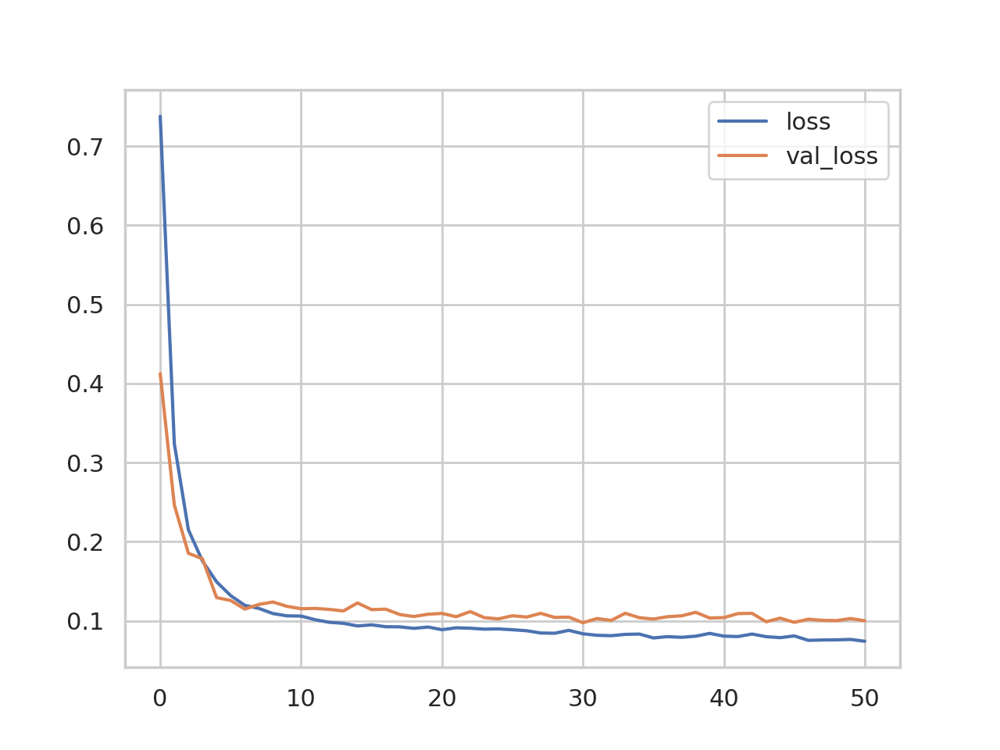

In [ ]:
history = model.fit(
    X_train_dummies_scaled, y_train,
    validation_data=(X_val_dummies_scaled, y_val),
    batch_size=256,
    epochs=500,
    callbacks=[early_stopping], # put your callbacks in a list
    verbose=0,  # turn off training log
)

history_df = pd.DataFrame(history.history)
history_df.loc[:, ['loss', 'val_loss']].plot();
print("Minimum validation loss: {}".format(history_df['val_loss'].min()))

In [ ]:
y_preds_train=model.predict(X_train_dummies_scaled)

27/27 [==============================] - 0s 10ms/step


In [ ]:
rmse = np.sqrt(mean_squared_error(y_train, y_preds_train))
r2 = r2_score(y_train, y_preds_train)
MAPE=mean_absolute_percentage_error(y_train, y_preds_train)
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")
print(f"MAPE: {MAPE}")

Root Mean Squared Error: 0.12983873999092874
R-squared: 0.4489434309667386
MAPE: 0.14658733513869304


In [ ]:
y_preds_test=model.predict(X_test_dummies_scaled)
rmse = np.sqrt(mean_squared_error(y_test, y_preds_test))
r2 = r2_score(y_test, y_preds_test)
MAPE=mean_absolute_percentage_error(y_test, y_preds_test)
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")
print(f"MAPE: {MAPE}")

6/6 [==============================] - 0s 9ms/step
Root Mean Squared Error: 0.1439470301259948
R-squared: 0.2743434905539053
MAPE: 0.17722363200879326


In [ ]:
#In this instance we adddropout layers and batchnormalizations layers in the aim of reducing any overfitting that may occur
model = keras.Sequential([
    layers.Dense(1024, activation='relu', input_shape=[21]),
    layers.Dropout(0.3),
    layers.BatchNormalization(),
    layers.Dense(1024, activation='relu'),
    layers.Dropout(0.3),
    layers.BatchNormalization(),
    layers.Dense(1024, activation='relu'),
    layers.Dropout(0.3),
    layers.BatchNormalization(),
    layers.Dense(1),
])

model.compile(
    optimizer='adam',
    loss='mae',
)

Minimum validation loss: 0.09302646666765213


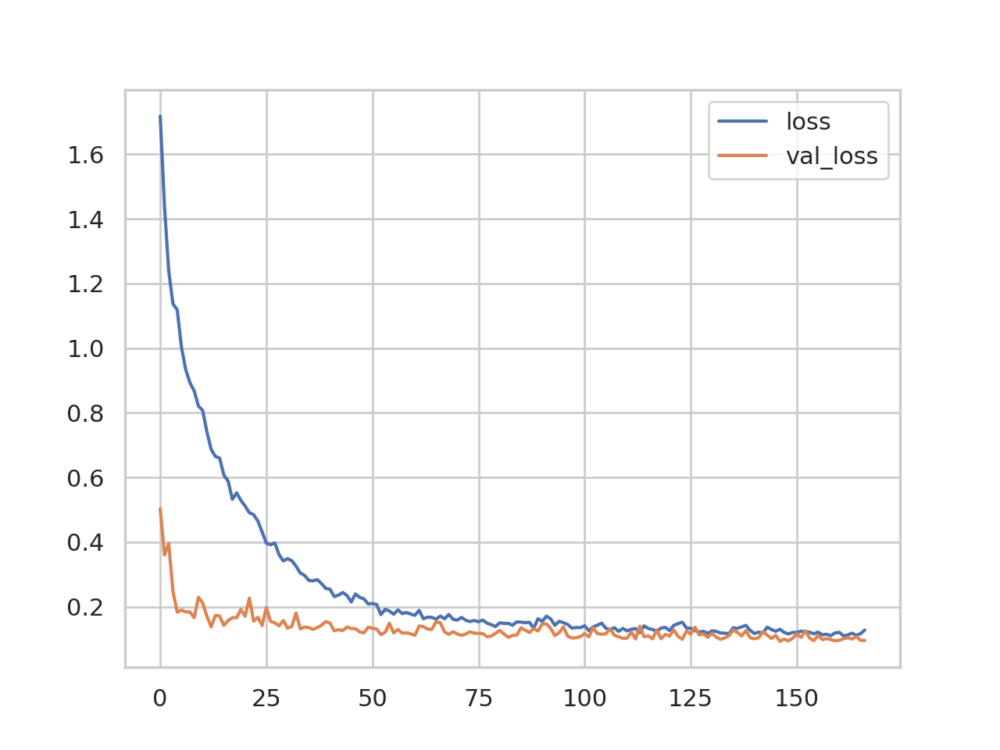

In [ ]:
history = model.fit(
    X_train_dummies_scaled, y_train,
    validation_data=(X_val_dummies_scaled, y_val),
    batch_size=256,
    epochs=500,
    callbacks=[early_stopping], # put your callbacks in a list
    verbose=0,  # turn off training log
)

history_df = pd.DataFrame(history.history)
history_df.loc[:, ['loss', 'val_loss']].plot();
print("Minimum validation loss: {}".format(history_df['val_loss'].min()))

In [ ]:
y_preds_train=model.predict(X_train_dummies_scaled)

27/27 [==============================] - 0s 8ms/step


In [ ]:
rmse = np.sqrt(mean_squared_error(y_train, y_preds_train))
r2 = r2_score(y_train, y_preds_train)
MAPE=mean_absolute_percentage_error(y_train, y_preds_train)
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")
print(f"MAPE: {MAPE}")

Root Mean Squared Error: 0.14267424303263967
R-squared: 0.3346061945190919
MAPE: 0.17289626569751987


In [ ]:
y_preds_test=model.predict(X_test_dummies_scaled)
rmse = np.sqrt(mean_squared_error(y_test, y_preds_test))
r2 = r2_score(y_test, y_preds_test)
MAPE=mean_absolute_percentage_error(y_test, y_preds_test)
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")
print(f"MAPE: {MAPE}")

6/6 [==============================] - 0s 7ms/step
Root Mean Squared Error: 0.15038838307542943
R-squared: 0.20794697450821953
MAPE: 0.18070002348886094


## Principal Component Regression

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import scale
from sklearn import model_selection
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression

In [ ]:
quants.remove('actual_productivity')

In [ ]:
quants

['targeted_productivity',
 'smv',
 'wip',
 'over_time',
 'incentive',
 'idle_time',
 'idle_men',
 'no_of_style_change',
 'no_of_workers']

In [ ]:
pipeline = Pipeline([
    ('scaler',StandardScaler()),('pca',PCA()),('regression',LinearRegression())])

In [ ]:
scaler=StandardScaler()
#Getting the Predictors and response
X=scaler.fit_transform(df.loc[:,quants])
Y=df.loc[:,'actual_productivity']

In [ ]:
X=pd.DataFrame(X)

In [ ]:
# Splitting dataset to train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = .2, random_state=0)

In [ ]:
#scale predictor variables
pca = PCA()
X_reduced_train = pca.fit_transform(X_train)
X_reduced_train=pd.DataFrame(X_reduced_train)

In [ ]:
X_reduced_train

,0,1,2,3,4,5,6,7,8
0,1.792845,-0.533410,-0.025079,-0.076651,0.604531,-0.686801,-0.071649,0.627147,0.272868
1,1.303360,-0.800329,0.730843,0.160566,-0.198767,-0.250861,-0.020633,-0.136362,0.247123
2,-0.063363,1.366683,-2.427999,0.826033,2.473233,0.042960,-0.317054,-1.187122,-0.187364
3,0.309616,-0.464716,0.742917,0.186093,-0.424356,0.612243,-0.047577,-1.654821,0.514817
4,-1.981118,-0.127381,0.356280,-0.258629,-0.300702,0.123442,0.057117,0.143000,-0.023017
...,...,...,...,...,...,...,...,...,...
952,1.478318,-0.406650,0.141530,-0.037543,-0.219784,-0.780372,-0.078315,-0.576191,-0.111493
953,2.408238,1.195941,-2.239059,0.540409,0.303862,0.707197,0.194551,-0.082617,-0.253163
954,1.202661,0.536405,-0.865472,0.162092,-0.816562,1.325307,0.361966,0.189062,0.246423
955,1.381264,-0.317050,-0.077267,-0.289095,0.442370,-0.268397,-0.094157,-0.362638,0.132909


In [ ]:
# Variance explained by each principal component
explained_variance_ratio = pca.explained_variance_ratio_

# Cumulative variance explained
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)
cumulative_variance_ratio
cvr_df=pd.DataFrame({"Principal Component":range(1,len(cumulative_variance_ratio)+1),"Proportion of Variation Explained":cumulative_variance_ratio})
print(cvr_df)

   Principal Component  Proportion of Variation Explained
0                    1                           0.329091
1                    2                           0.483508
2                    3                           0.606460
3                    4                           0.718711
4                    5                           0.818580
5                    6                           0.917022
6                    7                           0.958459
7                    8                           0.990719
8                    9                           1.000000


In [ ]:
#Fitting a model using 3 Principal Components
#train PCR model on training data
regr=LinearRegression()
regr.fit(X_reduced_train.loc[:,:4], y_train)

#Calculating the training error
y_preds_train=regr.predict(X_reduced_train.loc[:,:4])

In [ ]:
#Calculating training errors
rmse = np.sqrt(mean_squared_error(y_train, y_preds_train))
r2 = r2_score(y_train, y_preds_train)
MAPE=mean_absolute_percentage_error(y_train, y_preds_train)
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")
print(f"MAPE: {MAPE}")

Root Mean Squared Error: 0.15559224751690545
R-squared: 0.19695888647915105
MAPE: 0.19673473522946283


In [ ]:
#Predicting test data and calculating errors
pca = PCA()
X_reduced_test = pca.fit_transform(X_test)
X_reduced_test=pd.DataFrame(X_reduced_test)

#Predicting test values
y_preds_test=regr.predict(X_reduced_test.loc[:,:4])

#Calculating test errors
rmse = np.sqrt(mean_squared_error(y_test, y_preds_test))
r2 = r2_score(y_test, y_preds_test)
MAPE=mean_absolute_percentage_error(y_test, y_preds_test)
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")
print(f"MAPE: {MAPE}")

Root Mean Squared Error: 0.21691932828209304
R-squared: -0.5922303363322288
MAPE: 0.2971843599045005


Text(0.5, 1.0, 'Average Cross Validation Error vs. No. of Principal Components')

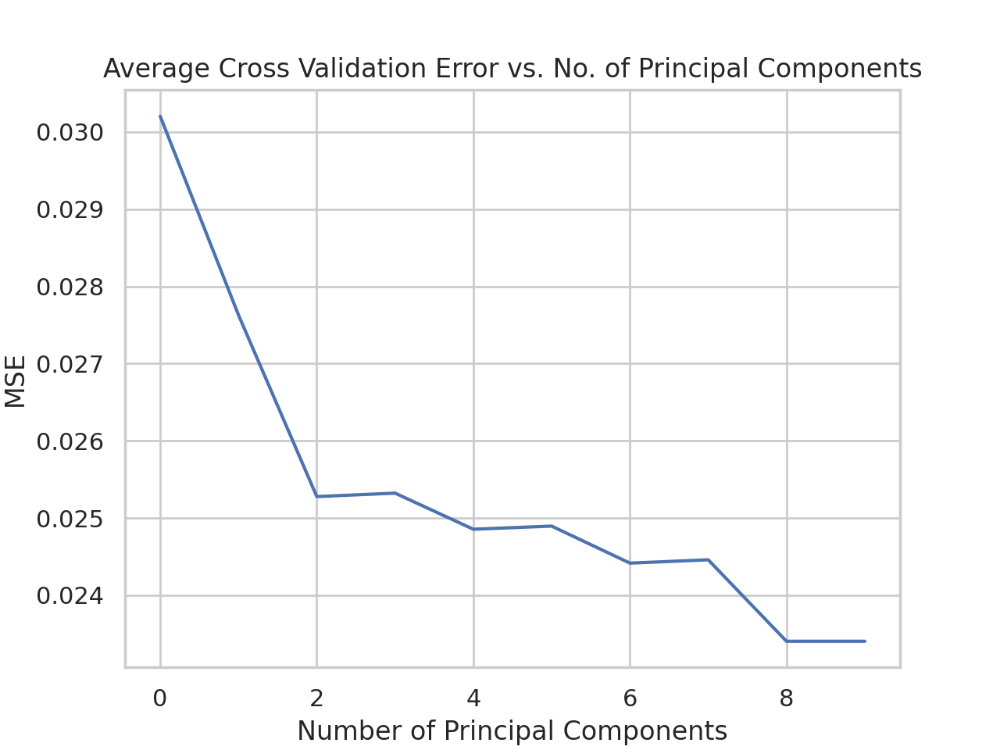

In [ ]:
#Finding the optimal number of components to include in the model
#define cross validation method
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)

regr = LinearRegression()
mse = []

# Calculate MSE with only the intercept
score =-1*model_selection.cross_val_score(regr,np.ones((len(X_reduced_train),1)), y_train, cv=cv,scoring='neg_mean_squared_error').mean()
mse.append(score)

# Calculate MSE using cross-validation, adding one component at a time
for i in np.arange(1, 10):
    score = -1*model_selection.cross_val_score(regr,X_reduced_train.loc[:,:i], y_train, cv=cv, scoring='neg_mean_squared_error').mean()
    mse.append(score)

# Plot cross-validation results
plt.plot(mse)
plt.xlabel('Number of Principal Components')
plt.ylabel('MSE')
plt.title('Average Cross Validation Error vs. No. of Principal Components')

Thus we get the minimum mse when we use all 9 principal components. Not much of a dimensionality reduction is acheived but we can move forward with checking our model

In [ ]:
#train PCR model on training data using all 9 components
regr=LinearRegression()
regr.fit(X_reduced_train.loc[:,:9], y_train)

#Calculating the training error
y_preds_train=regr.predict(X_reduced_train.loc[:,:9])

#Calculating training errors
rmse = np.sqrt(mean_squared_error(y_train, y_preds_train))
r2 = r2_score(y_train, y_preds_train)
MAPE=mean_absolute_percentage_error(y_train, y_preds_train)
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")
print(f"MAPE: {MAPE}")

Root Mean Squared Error: 0.15116958708126768
R-squared: 0.24196243869650336
MAPE: 0.19148733374956317


In [ ]:
#Predicting test values
y_preds_test=regr.predict(X_reduced_test.loc[:,:9])

In [ ]:
rmse = np.sqrt(mean_squared_error(y_test, y_preds_test))
r2 = r2_score(y_test, y_preds_test)
MAPE=mean_absolute_percentage_error(y_test, y_preds_test)
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")
print(f"MAPE: {MAPE}")

Root Mean Squared Error: 0.2239054659775426
R-squared: -0.6964410924642006
MAPE: 0.3083201955375963


## Partial Least Squares Regression

In [ ]:
#separating features and target for use in modelling
columns_to_drop = ['actual_productivity', 'date_num', 'date']
X = df.drop(columns=columns_to_drop, axis=1)

y = df['actual_productivity']

In [ ]:
# Splitting dataset to train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .2, random_state=0)

In [ ]:
# Create dummy variables for 'department','quarter' and 'day' , oone hot encoding
X_train = pd.get_dummies(X_train, columns=['department', 'day','quarter','team'])
X_test = pd.get_dummies(X_test, columns=['department', 'day','quarter','team'])

In [ ]:
pls = PLSRegression(n_components=2)
pls.fit(scale(X_train), y_train)

PLSRegression()

In [ ]:
y_preds_train=pls.predict(scale(X_train))
rmse = np.sqrt(mean_squared_error(y_train, y_preds_train))
r2 = r2_score(y_train, y_preds_train)
MAPE=mean_absolute_percentage_error(y_train, y_preds_train)
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")
print(f"MAPE: {MAPE}")

Root Mean Squared Error: 0.14933243384357564
R-squared: 0.26027523445201783
MAPE: 0.1909325519375182


In [ ]:
y_preds=pls.predict(scale(X_test))
rmse = np.sqrt(mean_squared_error(y_test, y_preds))
r2 = r2_score(y_test, y_preds)
MAPE=mean_absolute_percentage_error(y_test, y_preds)
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")
print(f"MAPE: {MAPE}")

Root Mean Squared Error: 0.14345872540670876
R-squared: 0.3035926787333658
MAPE: 0.18451955157697406


In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.cross_decomposition import PLSRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error

# Define a pipeline with StandardScaler and PLSRegression
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('pls', PLSRegression())
])

# Define the parameter grid for the number of components in PLS
param_grid = {
    'pls__n_components': range(1, min(X_train.shape[1], y_train.shape[0]) + 1)
}

# Perform GridSearchCV with cross-validation
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

# Get the best number of components
best_n_components = grid_search.best_params_['pls__n_components']

# Fit the PLS model with the optimal number of components
pipeline.set_params(pls__n_components=best_n_components)
pipeline.fit(X_train, y_train)
#Printing the optimal number of components
print("Optimal Number of Components is", best_n_components)
print(".............................................................................")
# Evaluate on train set
y_pred = pipeline.predict(X_train)
rmse = np.sqrt(mean_squared_error(y_train, y_pred))
r2 = r2_score(y_train, y_pred)
MAPE=mean_absolute_percentage_error(y_train, y_pred)
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")
print(f"MAPE: {MAPE}")
print(".............................................................................")
# Evaluate on test set
y_pred = pipeline.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)
MAPE=mean_absolute_percentage_error(y_test, y_pred)
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")
print(f"MAPE: {MAPE}")

Optimal Number of Components is 10
.............................................................................
Root Mean Squared Error: 0.14450085306478086
R-squared: 0.30736777390871495
MAPE: 0.18387480728306252
.............................................................................
Root Mean Squared Error: 0.14274794412921651
R-squared: 0.31047642924811025
MAPE: 0.18582934143695884


## Regression trees

### with teams

In [ ]:
#separating features and target for use in modelling
columns_to_drop = ['actual_productivity', 'date_num', 'date']
X = df.drop(columns=columns_to_drop, axis=1)

y = df['actual_productivity']

In [ ]:
# Splitting dataset to train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .2, random_state=0)

In [ ]:
# Create dummy variables for 'department','quarter' and 'day' , oone hot encoding
X_train_dummies = pd.get_dummies(X_train, columns=['department', 'day','quarter','team'])
X_test_dummies = pd.get_dummies(X_test, columns=['department', 'day','quarter','team'])


In [ ]:
#model fitting
from sklearn.tree import DecisionTreeRegressor
dt = DecisionTreeRegressor()
dt.fit(X_train_dummies, y_train)




DecisionTreeRegressor()

In [ ]:
# Step 2: Predict the target variable on the test set
y_pred = dt.predict(X_test_dummies)


In [ ]:
#evaluating training models
y_predt = dt .predict(X_train_dummies)
rmse = np.sqrt(mean_squared_error(y_train, y_predt))
r2 = r2_score(y_train, y_predt)
MAPE=mean_absolute_percentage_error(y_train, y_predt)
print(f"Training Root Mean Squared Error: {rmse}")
print(f"Training R-squared: {r2}")
print(f"Training MAPE: {MAPE}")

Training Root Mean Squared Error: 3.729633341870293e-17
Training R-squared: 1.0
Training MAPE: 8.722169438826544e-18


In [ ]:
# Step 3: Evaluate the model performance
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)
MAPE=mean_absolute_percentage_error(y_test, y_pred)
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")
print(f"MAPE: {MAPE}")

Root Mean Squared Error: 0.1673852924584474
R-squared: 0.05192218719091535
MAPE: 0.16073573718316642


In [ ]:
#model parameter tuning
from sklearn.model_selection import GridSearchCV

parameters = {'criterion':['squared_error','absolute_error'],
              'max_depth':np.arange(1,21).tolist()[0::2],
              'min_samples_split':np.arange(2,11).tolist()[0::2],
              'max_leaf_nodes':np.arange(3,26).tolist()[0::2]}

# create an instance of the grid search object
g1 = GridSearchCV(dt, parameters, cv=5, n_jobs=-1)
grid_fit = g1.fit(X_train_dummies, y_train)

best_model1 = grid_fit.best_estimator_


In [ ]:
#evaluating training models
y_predbt = best_model1 .predict(X_train_dummies)
rmse = np.sqrt(mean_squared_error(y_train, y_predbt))
r2 = r2_score(y_train, y_predbt)
MAPE=mean_absolute_percentage_error(y_train, y_predbt)
print(f"Training Root Mean Squared Error: {rmse}")
print(f"Training R-squared: {r2}")
print(f"Training MAPE: {MAPE}")

Training Root Mean Squared Error: 0.12383845018319793
Training R-squared: 0.49128693834936565
Training MAPE: 0.14951847270615837


In [ ]:
#evaluating performance of tuned model
y_predb = best_model1 .predict(X_test_dummies)
rmse = np.sqrt(mean_squared_error(y_test, y_predb))
r2 = r2_score(y_test, y_predb)
MAPE=mean_absolute_percentage_error(y_test, y_predb)
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")
print(f"MAPE: {MAPE}")

Root Mean Squared Error: 0.13459720118902538
R-squared: 0.38697039149202384
MAPE: 0.16382056984942597


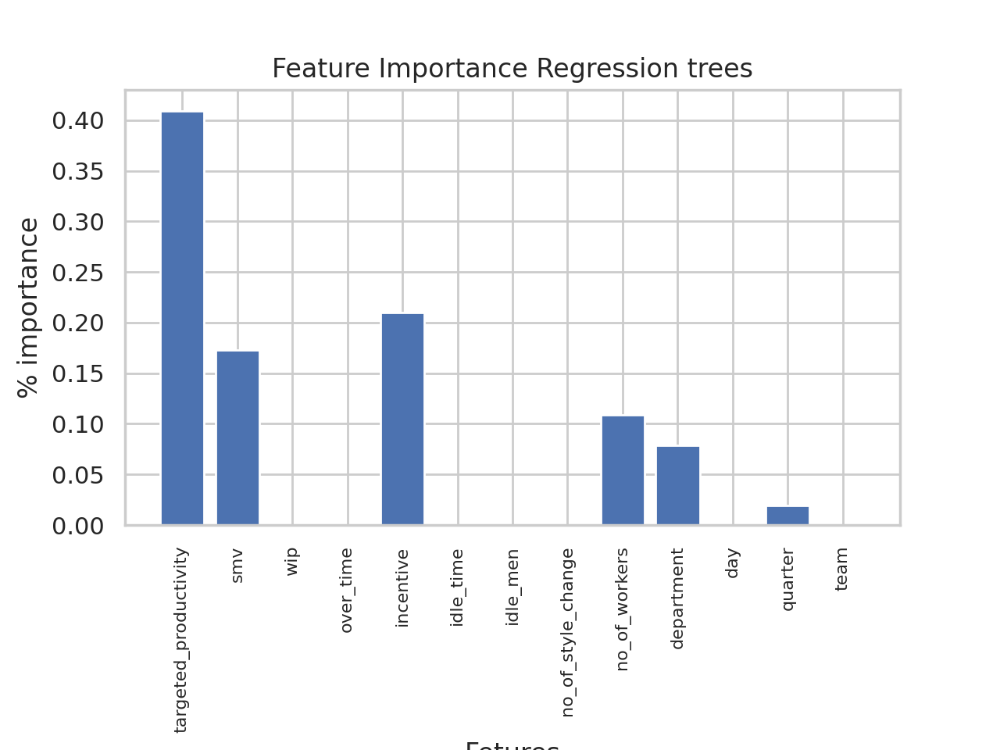

In [ ]:
#checking variable importance
# get importance
importance = best_model1.feature_importances_
column_headers1=['targeted_productivity','smv','wip','over_time','incentive','idle_time','idle_men','no_of_style_change','no_of_workers','department','day','quarter','team']
importance1=[importance[0],importance[1],importance[2],importance[3],importance[4],importance[5],importance[6],importance[7],importance[8],sum(importance[9:11]),sum(importance[11:17]),sum(importance[17:21]),sum(importance[21:33])]
important_dt = pd.DataFrame({'name':column_headers1, 'y':importance1})
important_dt
plt.subplots()
plt.subplots_adjust(bottom=0.3)
plt.bar(important_dt.name, important_dt.y )
plt.xticks(rotation='vertical',fontsize=8)
plt.xlabel('Fetures')
plt.ylabel('% importance')
plt.title('Feature Importance Regression trees')
plt.show()

### variable importane without teams

In [ ]:
#variable importance without teams
#keeping all important variables and refitting dt
#separating features and target for use in modelling
columns_to_drop = ['team']
X_train_wt = X_train.drop(columns=columns_to_drop, axis=1)
X_test_wt = X_test.drop(columns=columns_to_drop, axis=1)
X_train_dummies_wt = pd.get_dummies(X_train_wt, columns=['department','quarter','day'])
X_test_dummies_wt = pd.get_dummies(X_test_wt, columns=['department','quarter','day'])

In [ ]:
#model fitting
#model fitting
from sklearn.tree import DecisionTreeRegressor
dt_wt = DecisionTreeRegressor()
dt_wt.fit(X_train_dummies_wt, y_train)

DecisionTreeRegressor()

In [ ]:
# Step 2: Predict the target variable on the test set
y_pred_wt = dt_wt.predict(X_test_dummies_wt)
# Step 3: Evaluate the model performance
rmse = np.sqrt(mean_squared_error(y_test, y_pred_wt))
r2 = r2_score(y_test, y_pred_wt)
MAPE=mean_absolute_percentage_error(y_test, y_pred_wt)
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")
print(f"MAPE: {MAPE}")

Root Mean Squared Error: 0.1853093599688483
R-squared: -0.1619945856821674
MAPE: 0.1777750034572069


In [ ]:
#evaluating training models
y_pred_wtt = dt_wt .predict(X_train_dummies_wt)
rmse = np.sqrt(mean_squared_error(y_train, y_pred_wtt))
r2 = r2_score(y_train, y_pred_wtt)
MAPE=mean_absolute_percentage_error(y_train, y_pred_wtt)
print(f"Training Root Mean Squared Error: {rmse}")
print(f"Training R-squared: {r2}")
print(f"Training MAPE: {MAPE}")

Training Root Mean Squared Error: 0.02682864766317711
Training R-squared: 0.9761241173249956
Training MAPE: 0.00783164386582141


In [ ]:
#best model
#model parameter tuning
from sklearn.model_selection import GridSearchCV

parameters = {'criterion':['squared_error','absolute_error'],
              'max_depth':np.arange(1,21).tolist()[0::2],
              'min_samples_split':np.arange(2,11).tolist()[0::2],
              'max_leaf_nodes':np.arange(3,26).tolist()[0::2]}

# create an instance of the grid search object
g1 = GridSearchCV(dt_wt, parameters, cv=5, n_jobs=-1)
grid_fit = g1.fit(X_train_dummies_wt, y_train)

best_model1_wt = grid_fit.best_estimator_

In [ ]:
#model evaluation
# Step 2: Predict the target variable on the test set
y_pred_wtb = best_model1_wt.predict(X_test_dummies_wt)
# Step 3: Evaluate the model performance
rmse = np.sqrt(mean_squared_error(y_test, y_pred_wtb))
r2 = r2_score(y_test, y_pred_wtb)
MAPE=mean_absolute_percentage_error(y_test, y_pred_wtb)
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")
print(f"MAPE: {MAPE}")
y_pred_wttb = best_model1_wt .predict(X_train_dummies_wt)
rmseb = np.sqrt(mean_squared_error(y_train, y_pred_wttb))
r2b = r2_score(y_train, y_pred_wttb)
MAPEb=mean_absolute_percentage_error(y_train, y_pred_wttb)
print(f"Training Root Mean Squared Error: {rmseb}")
print(f"Training R-squared: {r2b}")
print(f"Training MAPE: {MAPEb}")

Root Mean Squared Error: 0.13777404712758795
R-squared: 0.35769067901014573
MAPE: 0.1661291280944169
Training Root Mean Squared Error: 0.12118802781116268
Training R-squared: 0.5128291346202383
Training MAPE: 0.14432651977310584


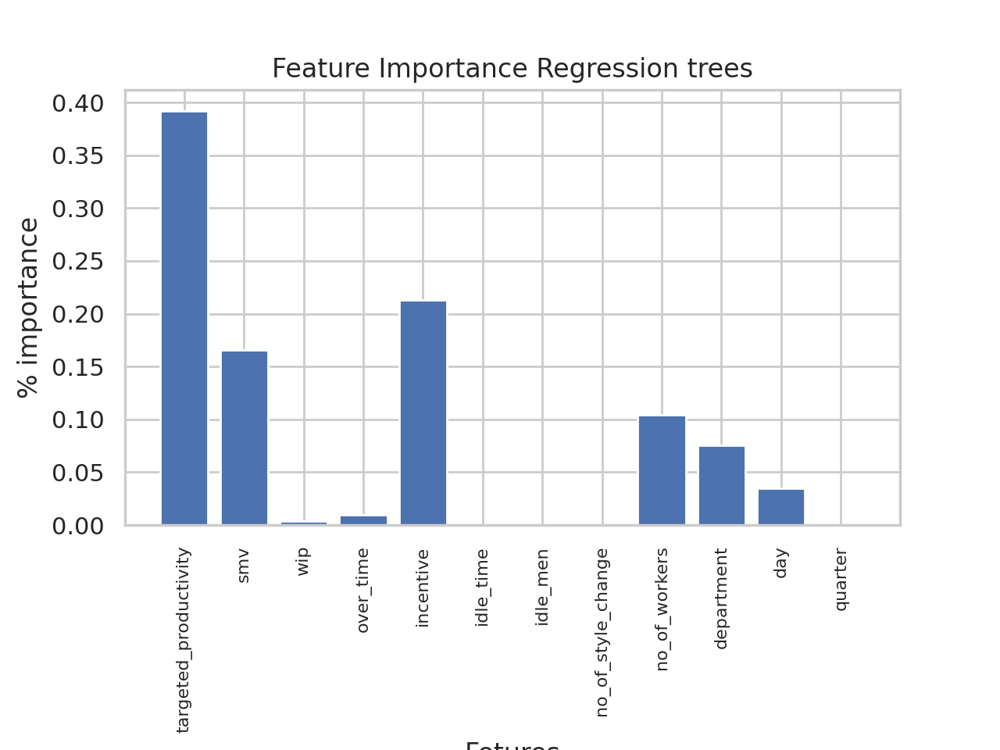

In [ ]:
#model importance
importance = best_model1_wt.feature_importances_
column_headers3=['targeted_productivity','smv','wip','over_time','incentive','idle_time','idle_men','no_of_style_change','no_of_workers','department','day','quarter']
importance3=[importance[0],importance[1],importance[2],importance[3],importance[4],importance[5],importance[6],importance[7],importance[8],sum(importance[9:11]),sum(importance[11:17]),sum(importance[17:21])]
important_dt3 = pd.DataFrame({'name':column_headers3, 'y':importance3})
important_dt3
plt.subplots()
plt.subplots_adjust(bottom=0.3)
plt.bar(important_dt3.name, important_dt3.y )
plt.xticks(rotation='vertical',fontsize=8)
plt.xlabel('Fetures')
plt.ylabel('% importance')
plt.title('Feature Importance Regression trees')
plt.show()

In [ ]:
#keeping all important variables and refitting dt
#separating features and target for use in modelling
columns_to_drop = ['team','idle_time','no_of_style_change','quarter','idle_men']
X_train_f = X_train.drop(columns=columns_to_drop, axis=1)
X_test_f = X_test.drop(columns=columns_to_drop, axis=1)

In [ ]:
#one hot encoding
X_train_dummies_f = pd.get_dummies(X_train_f, columns=['department','day'])
X_test_dummies_f = pd.get_dummies(X_test_f, columns=['department','day'])

In [ ]:
#model fitting
from sklearn.tree import DecisionTreeRegressor
dt_f = DecisionTreeRegressor()
dt_f.fit(X_train_dummies_f, y_train)
# Step 2: Predict the target variable on the test set
y_pred_f = dt_f.predict(X_test_dummies_f)
# Step 3: Evaluate the model performance
rmse = np.sqrt(mean_squared_error(y_test, y_pred_f))
r2 = r2_score(y_test, y_pred_f)
MAPE=mean_absolute_percentage_error(y_test, y_pred_f)
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")
print(f"MAPE: {MAPE}")

Root Mean Squared Error: 0.18037488264444684
R-squared: -0.1009345861221762
MAPE: 0.16857221655333882


In [ ]:
#evaluating training models
y_pred_ft = dt_f.predict(X_train_dummies_f)
rmse = np.sqrt(mean_squared_error(y_train, y_pred_ft))
r2 = r2_score(y_train, y_pred_ft)
MAPE=mean_absolute_percentage_error(y_train, y_pred_ft)
print(f"Training Root Mean Squared Error: {rmse}")
print(f"Training R-squared: {r2}")
print(f"Training MAPE: {MAPE}")

Training Root Mean Squared Error: 0.04642693869484162
Training R-squared: 0.9285006706446524
Training MAPE: 0.021930849691954975


In [ ]:
#tuning optimal model
#model parameter tuning
from sklearn.model_selection import GridSearchCV

parameters = {'criterion':['squared_error','absolute_error'],
              'max_depth':np.arange(1,21).tolist()[0::2],
              'min_samples_split':np.arange(2,11).tolist()[0::2],
              'max_leaf_nodes':np.arange(3,26).tolist()[0::2]}

# create an instance of the grid search object
g2 = GridSearchCV(dt_f, parameters, cv=5, n_jobs=-1)
grid_fit2 = g2.fit(X_train_dummies_f, y_train)

best_model_f = grid_fit2.best_estimator_
best_model_f

DecisionTreeRegressor(max_depth=5, max_leaf_nodes=25, min_samples_split=8)

In [ ]:
y_pred_fb = best_model_f.predict(X_test_dummies_f)
rmse = np.sqrt(mean_squared_error(y_test, y_pred_fb))
r2 = r2_score(y_test, y_pred_fb)
MAPE=mean_absolute_percentage_error(y_test, y_pred_f)
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")
print(f"MAPE: {MAPE}")

Root Mean Squared Error: 0.13503660494526448
R-squared: 0.38296128585530276
MAPE: 0.16857221655333882


In [ ]:
y_pred_fbt = best_model_f.predict(X_train_dummies_f)
rmse = np.sqrt(mean_squared_error(y_train, y_pred_fbt))
r2 = r2_score(y_train, y_pred_fbt)
MAPE=mean_absolute_percentage_error(y_train, y_pred_fbt)
print(f"Training Root Mean Squared Error: {rmse}")
print(f"Training R-squared: {r2}")
print(f"Training MAPE: {MAPE}")

Training Root Mean Squared Error: 0.12176591196798138
Training R-squared: 0.5081719162024785
Training MAPE: 0.14571866696519917


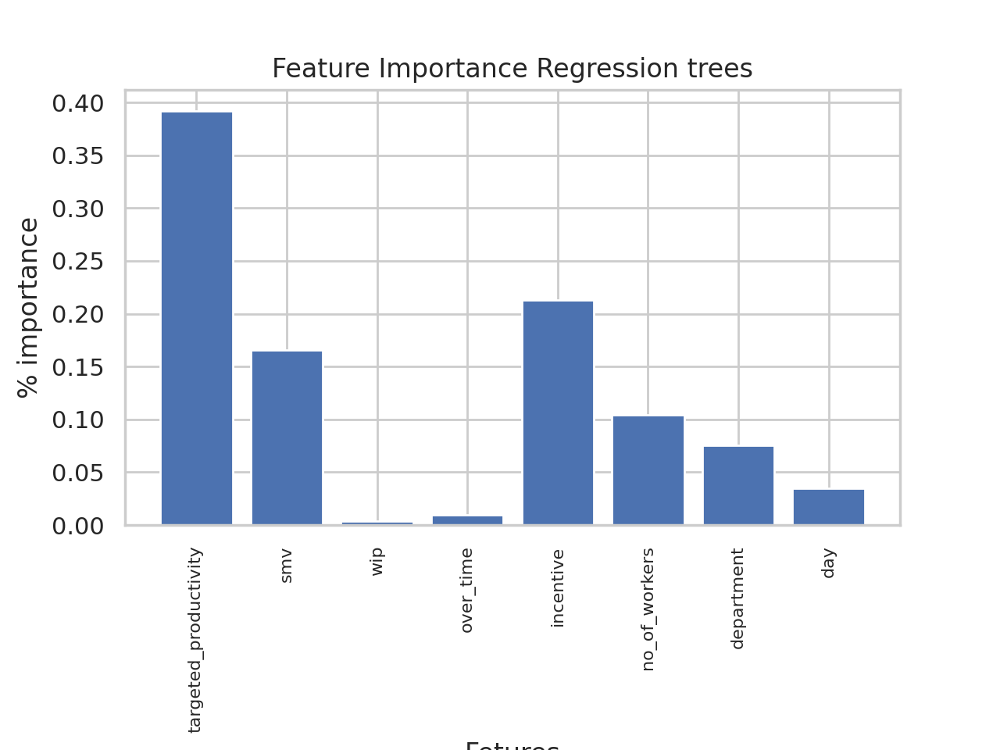

In [ ]:
#model importance
importance = best_model1_wt.feature_importances_
column_headers3=['targeted_productivity','smv','wip','over_time','incentive','no_of_workers','department','day']
importance3=[importance[0],importance[1],importance[2],importance[3],importance[4],importance[8],sum(importance[9:11]),sum(importance[11:17])]
important_dt3 = pd.DataFrame({'name':column_headers3, 'y':importance3})
important_dt3
plt.subplots()
plt.subplots_adjust(bottom=0.3)
plt.bar(important_dt3.name, important_dt3.y )
plt.xticks(rotation='vertical',fontsize=8)
plt.xlabel('Fetures')
plt.ylabel('% importance')
plt.title('Feature Importance Regression trees')
plt.show()

## Random forest

### with teams model

In [ ]:
#model fitting
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(X_train_dummies, y_train)
y_pred_rf = rf.predict(X_test_dummies)

In [ ]:
#evaluating training models
y_pred_rft = rf .predict(X_train_dummies)
rmse = np.sqrt(mean_squared_error(y_train, y_pred_rft))
r2 = r2_score(y_train, y_pred_rft)
MAPE=mean_absolute_percentage_error(y_train, y_pred_rft)
print(f"Training Root Mean Squared Error: {rmse}")
print(f"Training R-squared: {r2}")
print(f"Training MAPE: {MAPE}")

Training Root Mean Squared Error: 0.04738054650132835
Training R-squared: 0.9255333179882568
Training MAPE: 0.051509784373901475


In [ ]:
# Step 3: Evaluate the model performance
rmse = np.sqrt(mean_squared_error(y_test, y_pred_rf))
r2 = r2_score(y_test, y_pred_rf)
MAPE=mean_absolute_percentage_error(y_test, y_pred_rf)
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")
print(f"MAPE: {MAPE}")

Root Mean Squared Error: 0.1243413697252139
R-squared: 0.476832584817776
MAPE: 0.13880965668732712


In [ ]:
 #model parameter tuning
from sklearn.model_selection import GridSearchCV

parameters = {
    'criterion':['squared_error','absolute_error'],
    'n_estimators': [25, 50, 100, 150],
    'max_features': ['sqrt', 'log2', None],
}

# create an instance of the grid search object
grf = GridSearchCV(rf, parameters, cv=5, n_jobs=-1)
grid_fit = grf.fit(X_train_dummies, y_train)

best_model_rf1 = grid_fit.best_estimator_


In [ ]:
best_model_rf1

RandomForestRegressor(criterion='absolute_error', max_features='log2',
                      n_estimators=150)

In [ ]:
#evaluating training models
y_pred_rft1 = best_model_rf1 .predict(X_train_dummies)
rmse = np.sqrt(mean_squared_error(y_train, y_pred_rft1))
r2 = r2_score(y_train, y_pred_rft1)
MAPE=mean_absolute_percentage_error(y_train, y_pred_rft1)
print(f"Training Root Mean Squared Error: {rmse}")
print(f"Training R-squared: {r2}")
print(f"Training MAPE: {MAPE}")

Training Root Mean Squared Error: 0.05174559707906376
Training R-squared: 0.9111804277706638
Training MAPE: 0.06095157082566941


In [ ]:
#evaluating performance of tuned model
y_pred_rf1 = best_model_rf1 .predict(X_test_dummies)
rmse = np.sqrt(mean_squared_error(y_test, y_pred_rf1))
r2 = r2_score(y_test, y_pred_rf1)
MAPE=mean_absolute_percentage_error(y_test, y_pred_rf1)
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")
print(f"MAPE: {MAPE}")

Root Mean Squared Error: 0.12136976998232162
R-squared: 0.5015398428465543
MAPE: 0.14568124545067082


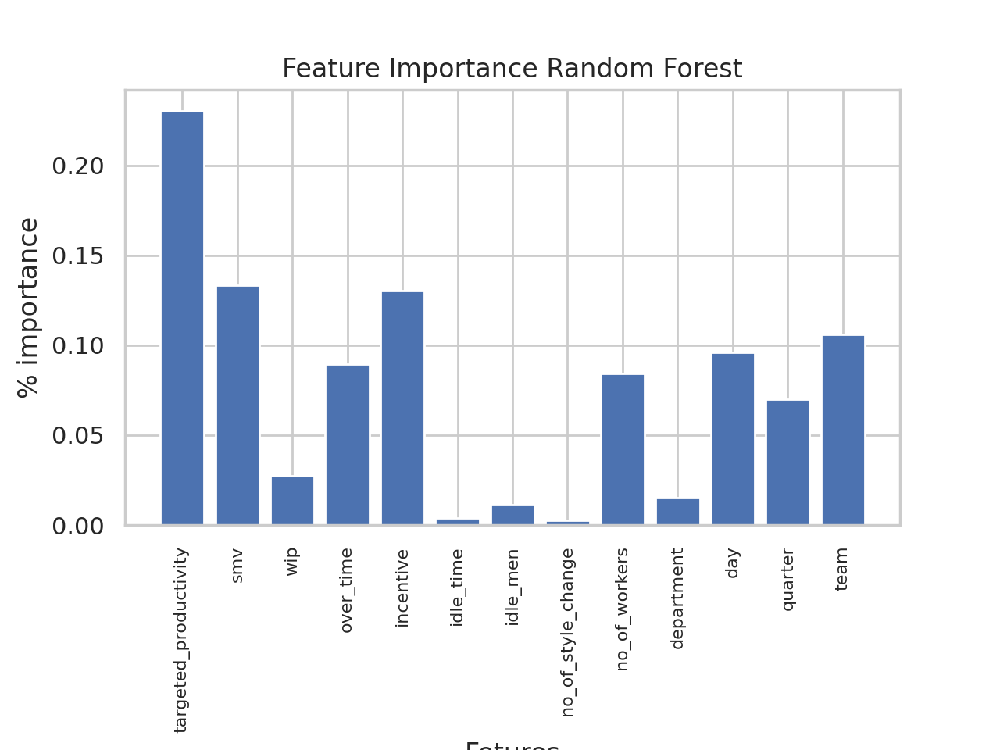

In [ ]:
#checking variable importance
# get importance
importance = rf.feature_importances_
column_headers1=['targeted_productivity','smv','wip','over_time','incentive','idle_time','idle_men','no_of_style_change','no_of_workers','department','day','quarter','team']
importance1=[importance[0],importance[1],importance[2],importance[3],importance[4],importance[5],importance[6],importance[7],importance[8],sum(importance[9:11]),sum(importance[11:17]),sum(importance[17:21]),sum(importance[21:33])]
important_rf = pd.DataFrame({'name':column_headers1, 'y':importance1})
important_rf
plt.subplots()
plt.subplots_adjust(bottom=0.3)
plt.bar(important_rf.name, important_rf.y )
plt.xticks(rotation='vertical',fontsize=8)
plt.xlabel('Fetures')
plt.ylabel('% importance')
plt.title('Feature Importance Random Forest')
plt.show()

In [ ]:
#importnse of team varible
sum(importance[21:33] )
#only team varible gives 10 percent important for indutry lets drop teams variable

0.10582134999256926

In [ ]:
#keeping all important variables and refitting dt
#separating features and target for use in modelling
columns_to_drop = ['team']
X_train_rf1 = X_train.drop(columns=columns_to_drop, axis=1)
X_test_rf1 = X_test.drop(columns=columns_to_drop, axis=1)

In [ ]:
#one hot encoding
X_train_dummies_rf1 = pd.get_dummies(X_train_rf1, columns=['department','quarter','day'])
X_test_dummies_rf1 = pd.get_dummies(X_test_rf1, columns=['department','quarter','day'])

In [ ]:
#model fitting
rf1 =RandomForestRegressor()
rf1.fit(X_train_dummies_rf1, y_train)
# Step 2: Predict the target variable on the test set
y_pred_rf2 = rf1.predict(X_test_dummies_rf1)
# Step 3: Evaluate the model performance
rmse = np.sqrt(mean_squared_error(y_test, y_pred_rf2))
r2 = r2_score(y_test, y_pred_rf2)
MAPE=mean_absolute_percentage_error(y_test, y_pred_rf2)
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")
print(f"MAPE: {MAPE}")

Root Mean Squared Error: 0.13210935322075804
R-squared: 0.40942300591375114
MAPE: 0.14692899225602177


In [ ]:
#evaluating training models
y_pred_rft11 = rf1 .predict(X_train_dummies_rf1)
rmse = np.sqrt(mean_squared_error(y_train, y_pred_rft11))
r2 = r2_score(y_train, y_pred_rft11)
MAPE=mean_absolute_percentage_error(y_train, y_pred_rft11)
print(f"Training Root Mean Squared Error: {rmse}")
print(f"Training R-squared: {r2}")
print(f"Training MAPE: {MAPE}")

Training Root Mean Squared Error: 0.05183255877486454
Training R-squared: 0.9108816432824932
Training MAPE: 0.05388794995961888


In [ ]:
#tuning parameters
#model parameter tuning
from sklearn.model_selection import GridSearchCV

parameters = {
    'criterion':['squared_error','absolute_error'],
    'n_estimators': [25, 50, 100, 150],
    'max_features': ['sqrt', 'log2', None],
}

# create an instance of the grid search object
grf = GridSearchCV(rf1, parameters, cv=5, n_jobs=-1)
grid_fit1 = grf.fit(X_train_dummies_rf1, y_train)

best_model_rf1 = grid_fit1.best_estimator_

In [ ]:
#evaluate model performance
#model evaluation
# Step 2: Predict the target variable on the test set
y_pred_wtb1 = best_model_rf1.predict(X_test_dummies_rf1)
# Step 3: Evaluate the model performance
rmse = np.sqrt(mean_squared_error(y_test, y_pred_wtb1))
r2 = r2_score(y_test, y_pred_wtb1)
MAPE=mean_absolute_percentage_error(y_test, y_pred_wtb1)
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")
print(f"MAPE: {MAPE}")
y_pred_wttb1 = best_model_rf1 .predict(X_train_dummies_rf1)
rmseb = np.sqrt(mean_squared_error(y_train, y_pred_wttb1))
r2b = r2_score(y_train, y_pred_wttb1)
MAPEb=mean_absolute_percentage_error(y_train, y_pred_wttb1)
print(f"Training Root Mean Squared Error: {rmseb}")
print(f"Training R-squared: {r2b}")
print(f"Training MAPE: {MAPEb}")

Root Mean Squared Error: 0.1334033463096082
R-squared: 0.3977971041905889
MAPE: 0.15641842079223398
Training Root Mean Squared Error: 0.05934703458727713
Training R-squared: 0.8831685091149987
Training MAPE: 0.06569066329017996


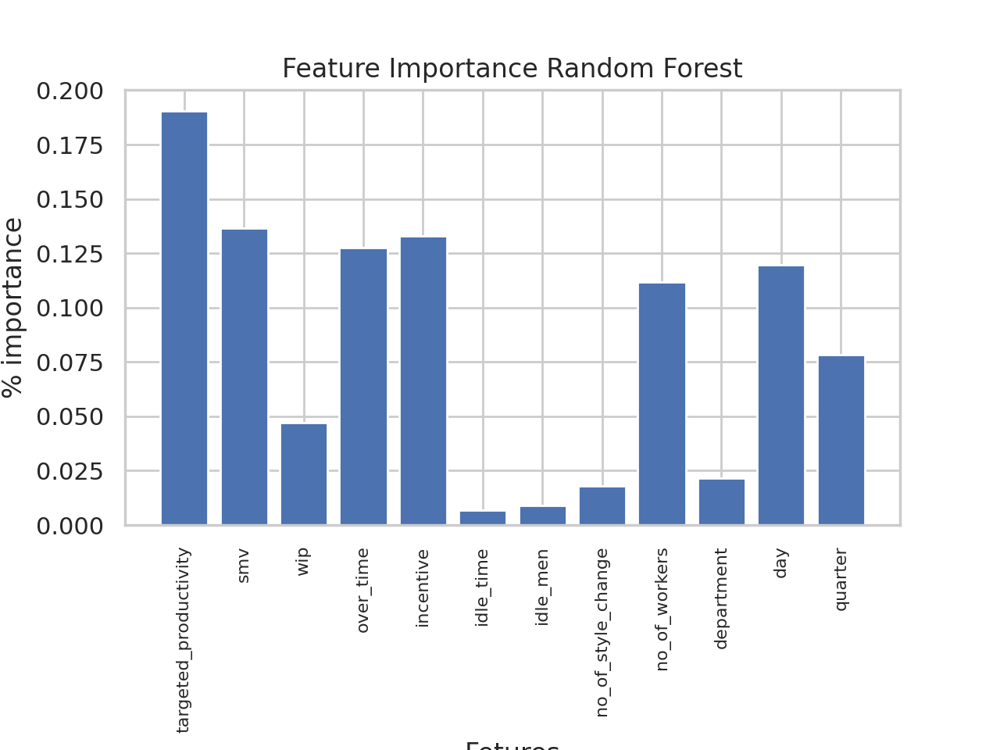

In [ ]:
#model importance
importance = best_model_rf1.feature_importances_
column_headers3=['targeted_productivity','smv','wip','over_time','incentive','idle_time','idle_men','no_of_style_change','no_of_workers','department','day','quarter']
importance4=[importance[0],importance[1],importance[2],importance[3],importance[4],importance[5],importance[6],importance[7],importance[8],sum(importance[9:11]),sum(importance[11:17]),sum(importance[17:21])]
important_rf1 = pd.DataFrame({'name':column_headers3, 'y':importance4})
important_rf1
plt.subplots()
plt.subplots_adjust(bottom=0.3)
plt.bar(important_rf1.name, important_rf1.y )
plt.xticks(rotation='vertical',fontsize=8)
plt.xlabel('Fetures')
plt.ylabel('% importance')
plt.title('Feature Importance Random Forest')
plt.show()

## XGB

### with teams

In [ ]:
#model fitting
from sklearn.ensemble import GradientBoostingRegressor
xgb = GradientBoostingRegressor()
xgb.fit(X_train_dummies, y_train)
y_pred_xgb = xgb.predict(X_test_dummies)


In [ ]:
#evaluating training models
y_pred_xgbt  = xgb .predict(X_train_dummies)
rmse = np.sqrt(mean_squared_error(y_train, y_pred_xgbt))
r2 = r2_score(y_train, y_pred_xgbt)
MAPE=mean_absolute_percentage_error(y_train, y_pred_xgbt)
print(f"Training Root Mean Squared Error: {rmse}")
print(f"Training R-squared: {r2}")
print(f"Training MAPE: {MAPE}")

Training Root Mean Squared Error: 0.10082613684432436
Training R-squared: 0.662784035242244
Training MAPE: 0.11414151533599756


In [ ]:
rmse = np.sqrt(mean_squared_error(y_test, y_pred_xgb))
r2 = r2_score(y_test, y_pred_xgb)
MAPE=mean_absolute_percentage_error(y_test, y_pred_xgb)
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")
print(f"MAPE: {MAPE}")

Root Mean Squared Error: 0.12058078257585143
R-squared: 0.507999449628163
MAPE: 0.14330314033850416


In XGB we do not fine tune the parameters so we use the baseline model

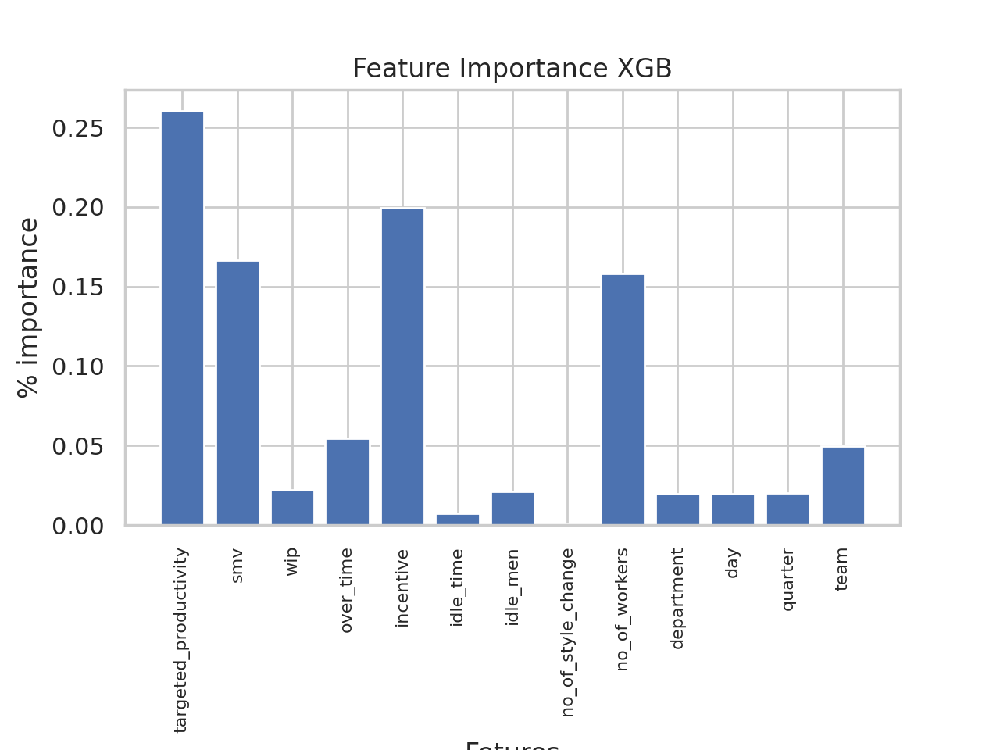

In [ ]:
#checking variable importance
# get importance
importance = xgb.feature_importances_
column_headers1=['targeted_productivity','smv','wip','over_time','incentive','idle_time','idle_men','no_of_style_change','no_of_workers','department','day','quarter','team']
importance1=[importance[0],importance[1],importance[2],importance[3],importance[4],importance[5],importance[6],importance[7],importance[8],sum(importance[9:11]),sum(importance[11:17]),sum(importance[17:21]),sum(importance[21:33])]
important_xgb = pd.DataFrame({'name':column_headers1, 'y':importance1})
important_xgb
plt.subplots()
plt.subplots_adjust(bottom=0.3)
plt.bar(important_xgb.name, important_xgb.y )
plt.xticks(rotation='vertical',fontsize=8)
plt.xlabel('Fetures')
plt.ylabel('% importance')
plt.title('Feature Importance XGB')
plt.show()

In [ ]:
#importnse of team varible
sum(importance[21:33] )
#only team varible gives 4 percent important for indutry lets drop teams variable

0.04953200916885416

### Only removing the teams

In [ ]:
#keeping all important variables and refitting dt
#separating features and target for use in modelling
columns_to_drop = ['team']
X_train_xgb1 = X_train.drop(columns=columns_to_drop, axis=1)
X_test_xgb1 = X_test.drop(columns=columns_to_drop, axis=1)

In [ ]:
#one hot encoding
X_train_dummies_xgb1 = pd.get_dummies(X_train_xgb1, columns=['department','quarter','day'])
X_test_dummies_xgb1 = pd.get_dummies(X_test_xgb1, columns=['department','quarter','day'])

In [ ]:
X_train_dummies_xgb1.columns

Index(['targeted_productivity', 'smv', 'wip', 'over_time', 'incentive',
       'idle_time', 'idle_men', 'no_of_style_change', 'no_of_workers',
       'department_finishing', 'department_sewing', 'quarter_1', 'quarter_2',
       'quarter_3', 'quarter_4', 'day_Monday', 'day_Saturday', 'day_Sunday',
       'day_Thursday', 'day_Tuesday', 'day_Wednesday'],
      dtype='object')

In [ ]:
#model fitting
xgb1 =GradientBoostingRegressor()
xgb1.fit(X_train_dummies_xgb1, y_train)
# Step 2: Predict the target variable on the test set
y_pred_xgb2 = xgb1.predict(X_test_dummies_xgb1)
# Step 3: Evaluate the model performance
rmse = np.sqrt(mean_squared_error(y_test, y_pred_xgb2))
r2 = r2_score(y_test, y_pred_xgb2)
MAPE=mean_absolute_percentage_error(y_test, y_pred_xgb2)
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")
print(f"MAPE: {MAPE}")

Root Mean Squared Error: 0.12077534431602333
R-squared: 0.506410444999549
MAPE: 0.14107969287911004


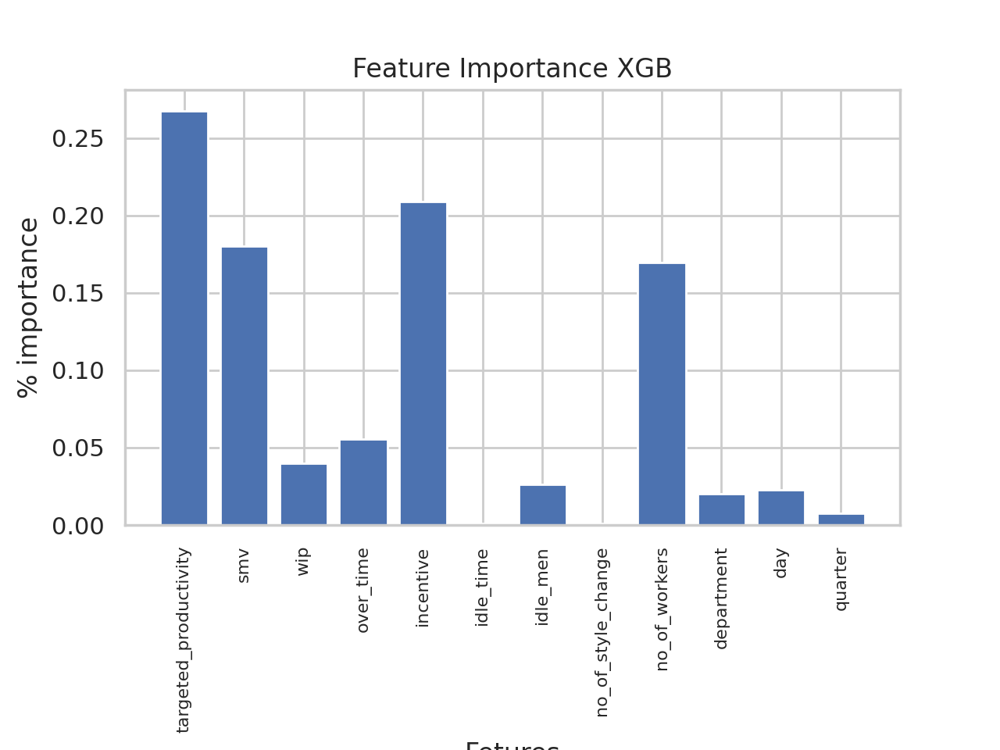

In [ ]:
#checking variable importance
# get importance
importance = xgb1.feature_importances_
column_headers1=['targeted_productivity','smv','wip','over_time','incentive','idle_time','idle_men','no_of_style_change','no_of_workers','department','day','quarter']
importance5=[importance[0],importance[1],importance[2],importance[3],importance[4],importance[5],importance[6],importance[7],importance[8],sum(importance[9:11]),sum(importance[11:17]),sum(importance[17:21])]
important_xgb1 = pd.DataFrame({'name':column_headers1, 'y':importance5})
important_xgb1
plt.subplots()
plt.subplots_adjust(bottom=0.3)
plt.bar(important_xgb1.name, important_xgb1.y )
plt.xticks(rotation='vertical',fontsize=8)
plt.xlabel('Fetures')
plt.ylabel('% importance')
plt.title('Feature Importance XGB')
plt.show()

In [ ]:



#evaluating training models
y_pred_xgbt1  = xgb1 .predict(X_train_dummies_xgb1)
rmse = np.sqrt(mean_squared_error(y_train, y_pred_xgbt1))
r2 = r2_score(y_train, y_pred_xgbt1)
MAPE=mean_absolute_percentage_error(y_train, y_pred_xgbt1)
print(f"Training Root Mean Squared Error: {rmse}")
print(f"Training R-squared: {r2}")
print(f"Training MAPE: {MAPE}")

Training Root Mean Squared Error: 0.10478456774867313
Training R-squared: 0.6357860931126057
Training MAPE: 0.11739731791947534


### Removing number of style changes

In [ ]:
#keeping all important variables and refitting dt
#separating features and target for use in modelling
columns_to_drop = ['team','no_of_style_change']
X_train_xgb11 = X_train.drop(columns=columns_to_drop, axis=1)
X_test_xgb11 = X_test.drop(columns=columns_to_drop, axis=1)

In [ ]:
#one hot encoding
X_train_dummies_xgb11 = pd.get_dummies(X_train_xgb11, columns=['department','quarter','day'])
X_test_dummies_xgb11 = pd.get_dummies(X_test_xgb11, columns=['department','quarter','day'])

In [ ]:
#model fitting
xgb11 =GradientBoostingRegressor()
xgb11.fit(X_train_dummies_xgb11, y_train)
# Step 2: Predict the target variable on the test set
y_pred_xgb21 = xgb11.predict(X_test_dummies_xgb11)
# Step 3: Evaluate the model performance
rmse = np.sqrt(mean_squared_error(y_test, y_pred_xgb21))
r2 = r2_score(y_test, y_pred_xgb21)
MAPE=mean_absolute_percentage_error(y_test, y_pred_xgb21)
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")
print(f"MAPE: {MAPE}")

Root Mean Squared Error: 0.12035071835631177
R-squared: 0.5098751007419173
MAPE: 0.14146100099888576


In [ ]:
X_train_dummies_xgb11

,targeted_productivity,smv,wip,over_time,incentive,idle_time,idle_men,no_of_workers,department_finishing,department_sewing,quarter_1,quarter_2,quarter_3,quarter_4,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday
361,0.70,20.40,1404.0,10440,50,0.0,0,58,0,1,0,0,1,0,0,0,0,0,0,1
619,0.80,22.52,1485.0,6900,113,0.0,0,57,0,1,1,0,0,0,0,0,0,1,0,0
494,0.35,18.79,511.0,1800,23,0.0,0,32,0,1,0,0,0,1,0,0,0,0,0,1
695,0.80,22.52,1546.0,0,88,0.0,0,57,0,1,0,1,0,0,0,0,0,0,1,0
395,0.80,2.90,0.0,1620,0,0.0,0,9,1,0,0,0,0,1,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1033,0.75,29.40,534.0,6840,56,0.0,0,57,0,1,1,0,0,0,0,0,0,0,1,0
763,0.50,30.10,1261.0,6960,30,0.0,0,58,0,1,0,1,0,0,0,1,0,0,0,0
835,0.70,18.79,1587.0,4560,30,0.0,0,51,0,1,0,0,1,0,0,0,0,0,0,1
559,0.70,24.26,1400.0,6720,0,0.0,0,56,0,1,1,0,0,0,0,0,1,0,0,0


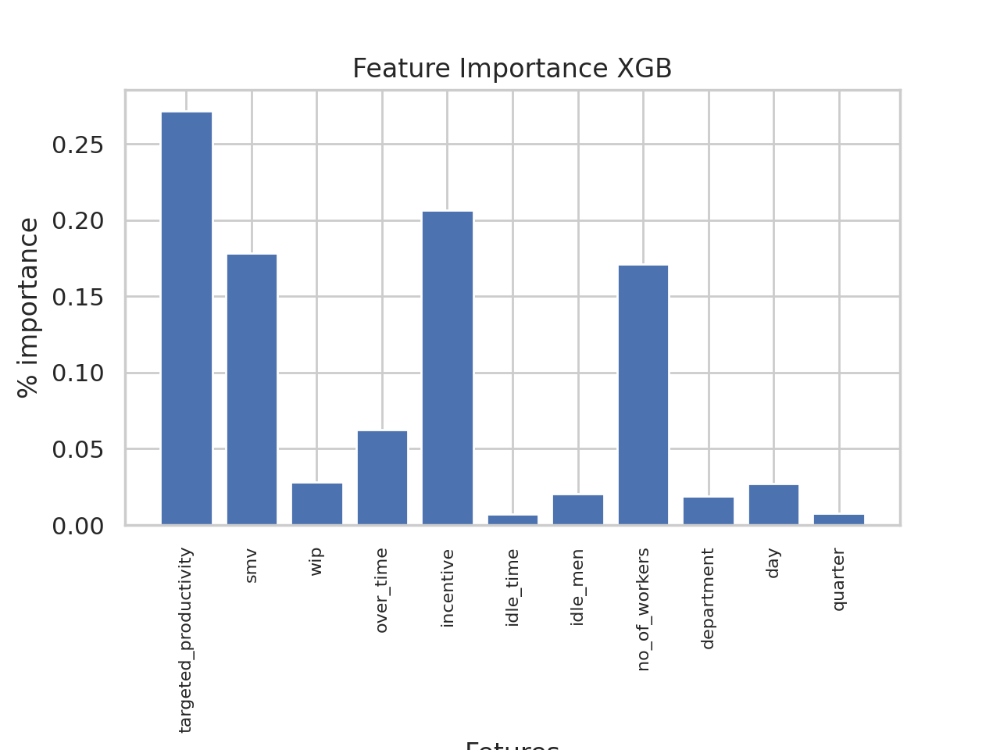

In [ ]:
#checking variable importance
# get importance
importance = xgb11.feature_importances_
column_headers11=['targeted_productivity','smv','wip','over_time','incentive','idle_time','idle_men','no_of_workers','department','day','quarter']
importance51=[importance[0],importance[1],importance[2],importance[3],importance[4],importance[5],importance[6],importance[7],sum(importance[8:10]),sum(importance[10:16]),sum(importance[16:20])]
important_xgb11 = pd.DataFrame({'name':column_headers11, 'y':importance51})
important_xgb11
plt.subplots()
plt.subplots_adjust(bottom=0.3)
plt.bar(important_xgb11.name, important_xgb11.y )
plt.xticks(rotation='vertical',fontsize=8)
plt.xlabel('Features')
plt.ylabel('% importance')
plt.title('Feature Importance XGB')
plt.show()

In [ ]:
importance51

[0.27190905436276297,
 0.17843586914797332,
 0.028027606186460562,
 0.06271128418197568,
 0.20671820777888317,
 0.0069903041218055345,
 0.02051230160892098,
 0.1712056350066249,
 0.018869666464729918,
 0.027180478057193376,
 0.007439593082669607]

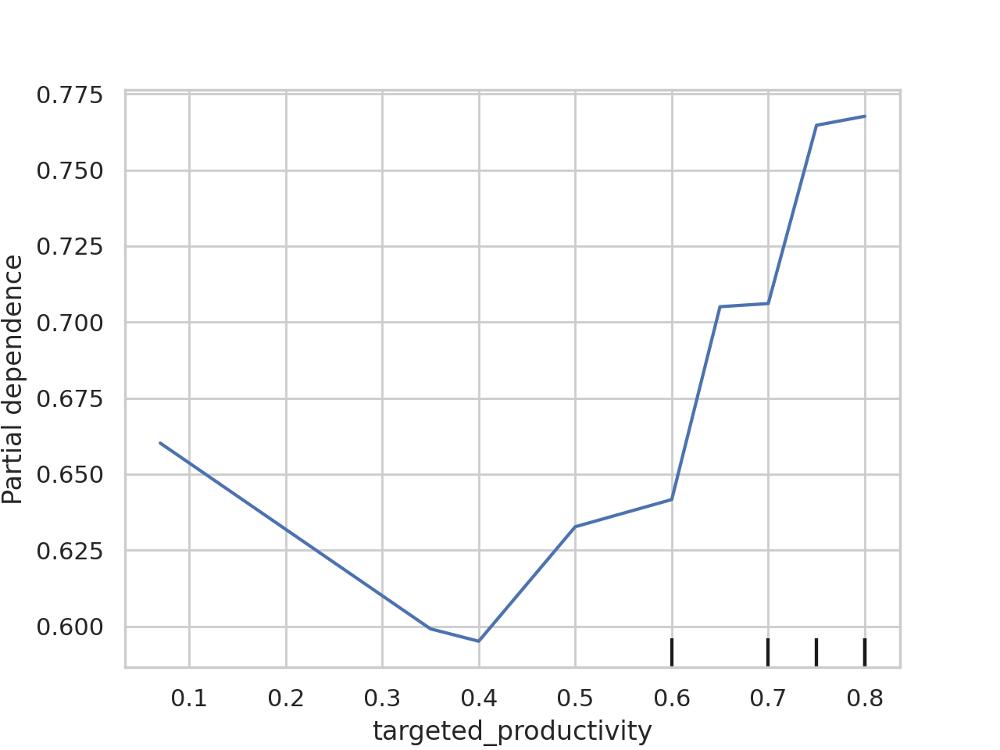

In [ ]:
from sklearn.inspection import PartialDependenceDisplay
features=[0]
PartialDependenceDisplay.from_estimator(xgb11, X_train_dummies_xgb11, features, grid_resolution=10,kind="average",method='brute')

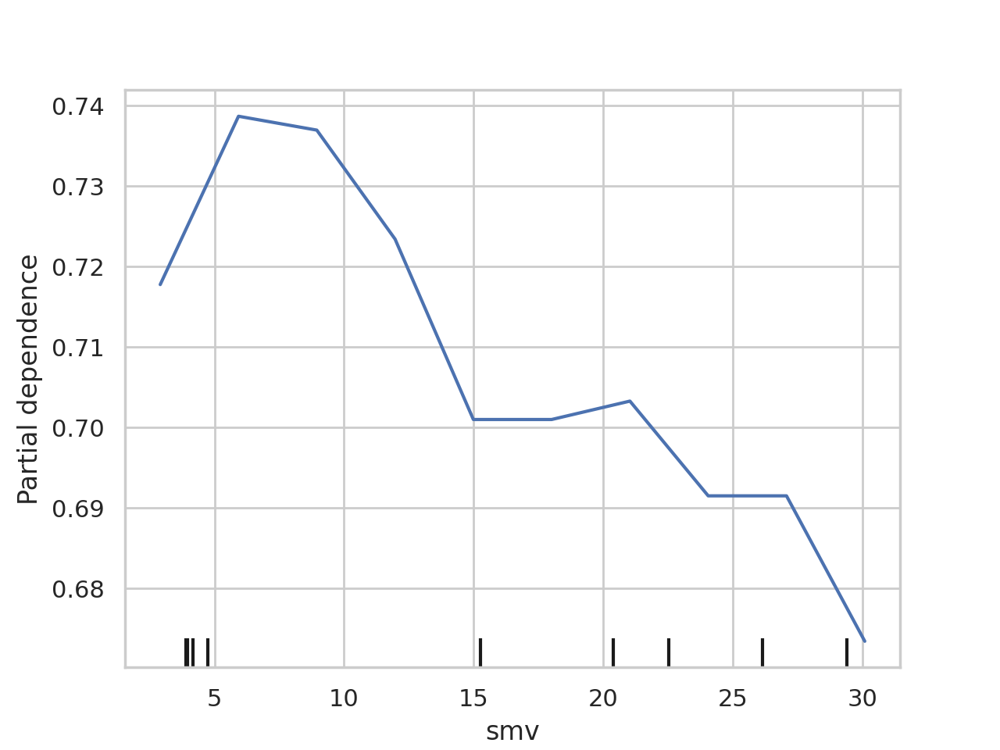

In [ ]:
from sklearn.inspection import PartialDependenceDisplay
features=[1]
PartialDependenceDisplay.from_estimator(xgb11, X_train_dummies_xgb11, features, grid_resolution=10,kind="average",method='brute')

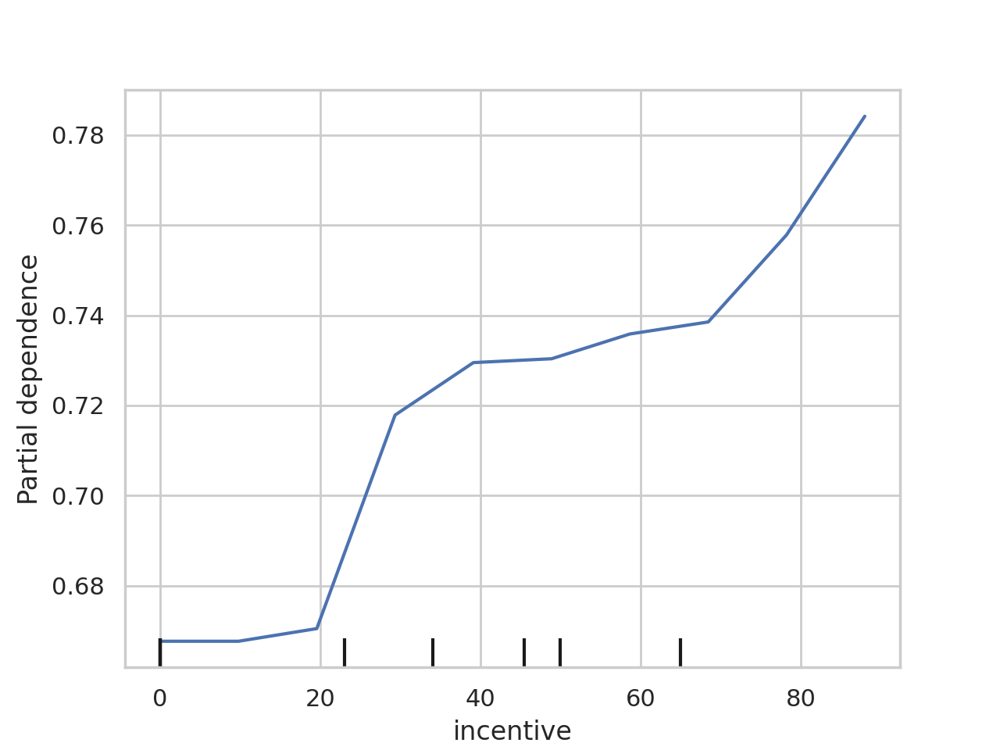

In [ ]:
from sklearn.inspection import PartialDependenceDisplay
features=[4]
PartialDependenceDisplay.from_estimator(xgb11, X_train_dummies_xgb11, features, grid_resolution=10,kind="average",method='brute')

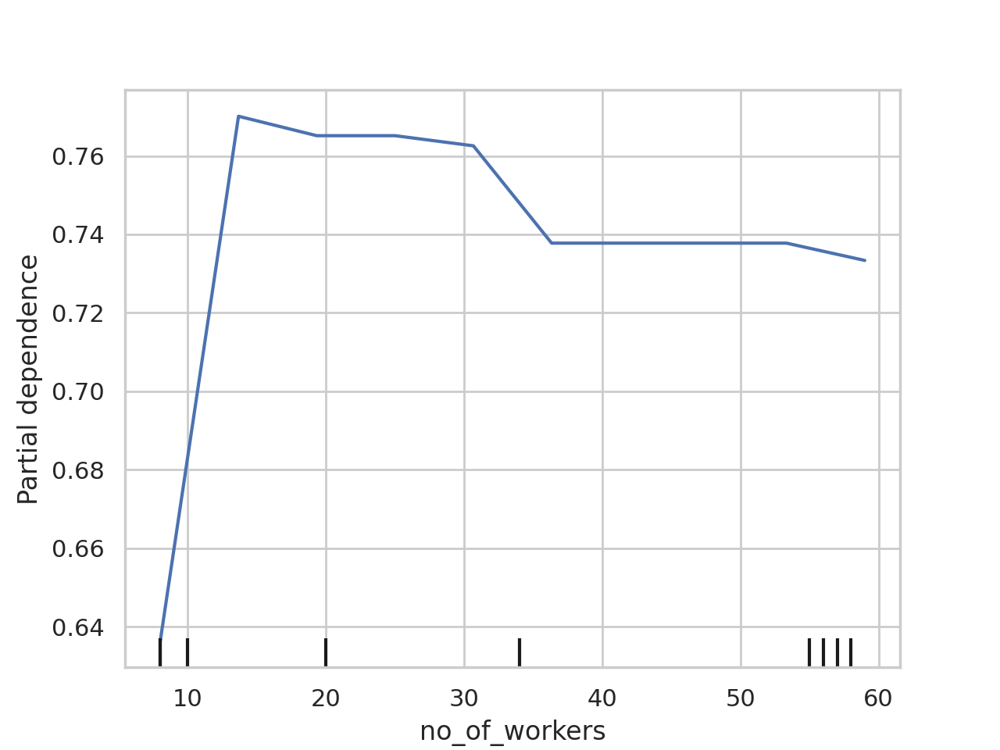

In [ ]:
from sklearn.inspection import PartialDependenceDisplay
features=[7]
PartialDependenceDisplay.from_estimator(xgb11, X_train_dummies_xgb11, features, grid_resolution=10, kind="average",method='brute')

In [ ]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 535.7/535.7 kB 5.0 MB/s eta 0:00:00


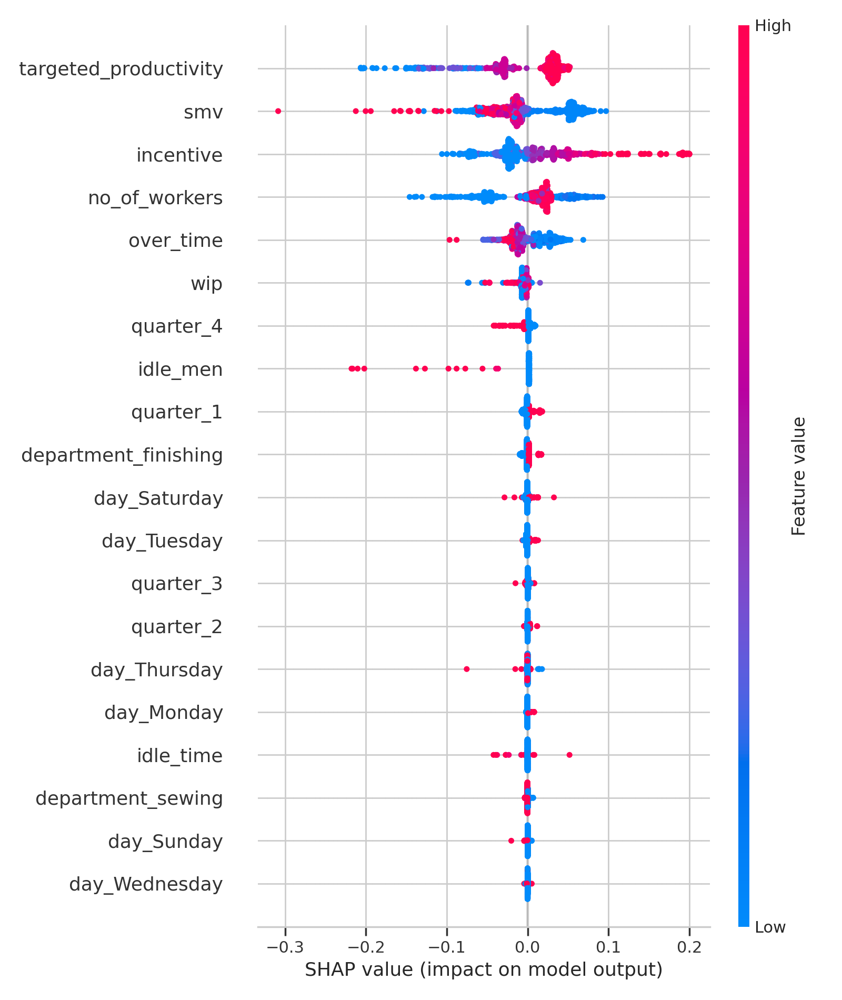

In [ ]:
import shap
# Use SHAP to explain the model's predictions
explainer = shap.Explainer(xgb11)
shap_values = explainer.shap_values(X_train_dummies_xgb11)

# Plot the SHAP summary plot for variable importance
shap.summary_plot(shap_values, X_train_dummies_xgb11, show=False)

# Display the plot
plt.show()

In [ ]:



#evaluating training models
y_pred_xgbt11  = xgb11 .predict(X_train_dummies_xgb11)
rmse = np.sqrt(mean_squared_error(y_train, y_pred_xgbt11))
r2 = r2_score(y_train, y_pred_xgbt11)
MAPE=mean_absolute_percentage_error(y_train, y_pred_xgbt11)
print(f"Training Root Mean Squared Error: {rmse}")
print(f"Training R-squared: {r2}")
print(f"Training MAPE: {MAPE}")

Training Root Mean Squared Error: 0.10442848606784502
Training R-squared: 0.6382572497935581
Training MAPE: 0.11719685187268447


## SVM

In [ ]:
from sklearn.svm import SVR
svr = SVR()
svr.fit(X_train_dummies, y_train)
y_pred_svr = svr.predict(X_test_dummies)

In [ ]:
#evaluating training models
y_pred_svrt  = svr.predict(X_train_dummies)
rmse = np.sqrt(mean_squared_error(y_train, y_pred_svrt))
r2 = r2_score(y_train, y_pred_svrt)
MAPE=mean_absolute_percentage_error(y_train, y_pred_svrt)
print(f"Training Root Mean Squared Error: {rmse}")
print(f"Training R-squared: {r2}")
print(f"Training MAPE: {MAPE}")

Training Root Mean Squared Error: 0.16974063713856652
Training R-squared: 0.044273719924354804
Training MAPE: 0.23501136106572681


In [ ]:
rmse = np.sqrt(mean_squared_error(y_test, y_pred_svr))
r2 = r2_score(y_test, y_pred_svr)
MAPE=mean_absolute_percentage_error(y_test, y_pred_svr)
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")
print(f"MAPE: {MAPE}")

Root Mean Squared Error: 0.16858545109166134
R-squared: 0.03827794227741388
MAPE: 0.2342250430594983


In [ ]:
#model parameter tuning
#from sklearn.model_selection import GridSearchCV

#parameters= {'C': [0.1, 1, 10, 100, 1000],
              #'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              #'kernel': ['rbf','linear']}

# create an instance of the grid search object
#gsvr = GridSearchCV(svr, parameters, cv=5, n_jobs=-1)
#grid_fit = gsvr.fit(X_train_dummies, y_train)

#best_model_svr1 = grid_fit.best_estimator_

In [ ]:
#checking variable importance
#from sklearn.inspection import permutation_importance
#results = permutation_importance(svr, X_train_dummies, y_train, scoring='neg_mean_squared_error')
# get importance
#importance = results.importances_mean
#importance
#column_headers1=['targeted_productivity','smv','wip','over_time','incentive','idle_time','idle_men','no_of_style_change','no_of_workers','department','day','quarter','team']
#importance1=[importance[0],importance[1],importance[2],importance[3],importance[4],importance[5],importance[6],importance[7],importance[8],sum(importance[9:11]),sum(importance[11:17]),sum(importance[17:21]),sum(importance[21:33])]
#important_svm = pd.DataFrame({'name':column_headers1, 'y':importance1})
#important_svm
#plt.subplots()
#plt.subplots_adjust(bottom=0.3)
#plt.bar(important_svm.name, important_svm.y )
#plt.xticks(rotation='vertical',fontsize=8)
#plt.xlabel('Fetures')
#plt.ylabel('importance')
#plt.title('Feature Importance SVM')
#plt.show()

In [ ]:
#column_headers = X_train_dummies.keys().values.tolist()
#column_headers
#important_svr= pd.DataFrame({'name':column_headers, 'y':importance})
#important_svr

In [ ]:
#importnse of team varible
#sum(importance[21:33] )
#only team varible gives 4 percent important for indutry lets drop teams variable

### without teams

In [ ]:
#keeping all important variables and refitting dt
#separating features and target for use in modelling
#columns_to_drop = ['team']
#X_train_svr1 = X_train.drop(columns=columns_to_drop, axis=1)
#X_test_svr1 = X_test.drop(columns=columns_to_drop, axis=1)

In [ ]:
#one hot encoding
#X_train_dummies_svr1 = pd.get_dummies(X_train_svr1, columns=['department','quarter','day'])
#X_test_dummies_svr1 = pd.get_dummies(X_test_svr1, columns=['department','quarter','day'])

In [ ]:
#model fitting
#svr1 =SVR()
#svr1.fit(X_train_dummies_svr1, y_train)
# Step 2: Predict the target variable on the test set
#y_pred_svr2 = svr1.predict(X_test_dummies_svr1)
# Step 3: Evaluate the model performance
#rmse = np.sqrt(mean_squared_error(y_test, y_pred_svr2))
#r2 = r2_score(y_test, y_pred_svr2)
#MAPE=mean_absolute_percentage_error(y_test, y_pred_svr2)
#print(f"Root Mean Squared Error: {rmse}")
#print(f"R-squared: {r2}")
#print(f"MAPE: {MAPE}")

In [ ]:
#evaluating training models
#y_pred_svrt1  = svr1.predict(X_train_dummies_svr1)
#rmse = np.sqrt(mean_squared_error(y_train, y_pred_svrt1))
#r2 = r2_score(y_train, y_pred_svrt1)
#MAPE=mean_absolute_percentage_error(y_train, y_pred_svrt1)
#print(f"Training Root Mean Squared Error: {rmse}")
#print(f"Training R-squared: {r2}")
#bprint(f"Training MAPE: {MAPE}")

##Model save

In [ ]:
import pickle
with open('predictor.pickle', 'wb') as file:
    pickle.dump(xgb1, file)

In [ ]:
from google.colab import files
#files.download('predictor.pickle')

# Prediction and Further Investigation